<a href="https://colab.research.google.com/github/annykay/AppliedStatistics/blob/main/GAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Depedences

In [3]:
install.packages(c('ggpubr', 'corrplot', 'tidyr', 'mgcv'))

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [4]:
library("readxl")
library('ggplot2')
library("ggpubr")
library("stats")
library('reshape2')
library(corrplot)
library(tidyr)
library(mgcv)
data <- read_excel('Erlotinib_dataset.xlsx')
head(data)

USUBJID,EVENT,EVENT_TIME,SMKSTAT,WHOSTATN,TIME,YTYPE_DESC,DV,SLDb,EGFRMUTN,⋯,LDHb,NLRb,YTYPE,ALPb,CREATb,NEUTb,STUDY,WBCb,ALTb,ASTb
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
00ULTR144H,1,227,2,2,0,SLD,7,7,0,⋯,121,8,6,209,60,11.2,ZD6474,13,17,18
00ULTR144H,1,227,2,2,0,ALT,17,7,0,⋯,121,8,2,209,60,11.2,ZD6474,13,17,18
00ULTR144H,1,227,2,2,0,ALP,209,7,0,⋯,121,8,1,209,60,11.2,ZD6474,13,17,18
00ULTR144H,1,227,2,2,0,AST,18,7,0,⋯,121,8,3,209,60,11.2,ZD6474,13,17,18
00ULTR144H,1,227,2,2,0,CREAT,60,7,0,⋯,121,8,4,209,60,11.2,ZD6474,13,17,18
00ULTR144H,1,227,2,2,0,LDH,121,7,0,⋯,121,8,8,209,60,11.2,ZD6474,13,17,18


# Plot functions

In [5]:
plotMarkers <- function(data, title_end, filename_end, dirname, strat='') {
    descriptions <- sort(unique(data$YTYPE_DESC))
    for (i in c(1:9)) {
        baseline <- paste0(descriptions[i], 'b')
        if (strat != '')
            df <- data[data$YTYPE_DESC == descriptions[i], c('USUBJID', 'TIME', 'DV', baseline, strat)]
        else
            df <- data[data$YTYPE_DESC == descriptions[i], c('USUBJID', 'TIME', 'DV', baseline)]            
        colnames(df)[4] <- 'base'
        df$curr <- df$DV - df$base

        title <- paste0(descriptions[i], title_end)
        filename <-  paste0(dirname, descriptions[i], filename_end, '.png')
        if (strat != '')
            ggplot(df, aes(TIME, curr, color = get(strat))) + scale_color_discrete(name=strat) + geom_point() +
                    geom_smooth() + xlab('Time, Days') + ylab(descriptions[i]) + ggtitle(title)
        else 
            ggplot(df, aes(TIME, curr)) + geom_point() + geom_smooth() + xlab('Time, Days') +
                   ylab(descriptions[i]) + ggtitle(title)
        ggsave(filename)


        subjlist <- unique(df[df$TIME %in% c(0), 'USUBJID'])
        title <- paste0(descriptions[i], title_end, ' for patients came at first two days')
        filename <-  paste0(dirname, descriptions[i], filename_end, 'First', '.png')
        if (strat != '')
            ggplot(df[df$USUBJID %in% unlist(subjlist), ], aes(TIME, curr, color = get(strat))) + geom_point() + 
                geom_smooth() + xlab('Time, Days') + ylab(descriptions[i]) + ggtitle(title) + 
                scale_color_discrete(name=strat)
        else
            ggplot(df[df$USUBJID %in% unlist(subjlist), ], aes(TIME, curr)) + geom_point() + 
                geom_smooth() + xlab('Time, Days') + ylab(descriptions[i]) + ggtitle(title)
        ggsave(filename)

        df$norm <- (df$curr - mean(df$curr)) / sd(df$curr)
        subjlist <- unique(df[df$TIME %in% c(1, 0), 'USUBJID'])
        title <- paste0(descriptions[i], title_end, ' normalized')
        filename <-  paste0(dirname, descriptions[i], filename_end,'Norm', '.png')
        if (strat != '')
            ggplot(df, aes(TIME, norm, color = get(strat))) + geom_point() + geom_smooth() + 
                xlab('Time, Days') + ylab(descriptions[i]) + ggtitle(title) + ylim(-10, 10) +
                scale_color_discrete(name=strat)
        else
            ggplot(df, aes(TIME, norm)) + geom_point() + geom_smooth() + xlab('Time, Days') + 
                ylab(descriptions[i]) + ggtitle(title) + ylim(-10, 10)
        ggsave(filename)
        
        df$normSu <- 0

        for (j in unlist(unique(df$USUBJID))) {
            #df[df$USUBJID == j, 'normSu'] <- (
            curr_vec <- apply(df[df$USUBJID == j, 'curr'], 2, as.numeric)
            df[df$USUBJID == j, 'normSu'] <- (curr_vec - mean(curr_vec)) / sd(curr_vec)
        }
        title <- paste0(descriptions[i], title_end, '\nStandart normalization for each patient')
        filename <-  paste0(dirname, descriptions[i], filename_end, 'NormBySubj', '.png')
        if (strat != '')
            ggplot(df, aes(TIME, normSu, color = get(strat))) + geom_point() + geom_smooth() + 
                xlab('Time, Days') + ylab(descriptions[i]) + ggtitle(title) + ylim(-5, 5) + 
                scale_color_discrete(name=strat)
        else
            ggplot(df, aes(TIME, normSu)) + geom_point() + geom_smooth() + xlab('Time, Days') + 
                ylab(descriptions[i]) + ggtitle(title) + ylim(-5, 5)
            
        ggsave(filename)
    }
}

In [ ]:
plotMarkers(data, ' dependancy from time ', '', './PicturesForAll/', '')

Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 4 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 4 rows containing missing values (geom_point).”
Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 1904 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 1904 rows containing missing values (geom_point).”
Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s

In [6]:
data$EGFRMUTN <- as.factor(data$EGFRMUTN)
#plotMarkers(data, ' dependancy from time ', '', './PictEGFR/', 'EGFRMUTN')

In [7]:
data$WHOSTATN <- as.factor(data$WHOSTATN)
#plotMarkers(data, ' dependancy from time ', '', './PictWho/', 'WHOSTATN')
data$SMKSTAT <- as.factor(data$SMKSTAT)
#plotMarkers(data, ' dependancy from time ', '', './PictSMKSTAT/', 'SMKSTAT')

In [8]:
make_df <- function(data, mark){
  base <- paste0(mark, 'b')
  df <- data[data$YTYPE_DESC == mark, c('USUBJID', 'SMKSTAT', 'TIME', 'WHOSTATN', 'YTYPE_DESC', 'DV',
                                          'EGFRMUTN', base)]
  df[, 'y'] <- df[,'DV'] - df[, base]
  for (j in unlist(unique(df$USUBJID))) {
    #df[df$USUBJID == j, 'normSu'] <- (
    curr_vec <- apply(df[df$USUBJID == j, 'y'], 2, as.numeric)
    df[df$USUBJID == j, 'norm'] <- (curr_vec - mean(curr_vec)) / sd(curr_vec)
  }
  return(df)
}


# SLD
$tp$ - thin plate, r^2log(r)

ts  same, but null space also penalized

ds - generalization of tp

cr - cubic regression

cs - same, but null space also penalized

cc - same, but null space also penalized and ends match up to 2nd derivative

ps - P-splines (B-splines with discrete penalties

cp - same, but cyclic

re - random effects, ridge penalty

gp - gaussian process smooth

ad - adaptive smooths

In [ ]:
dfSLD <- make_df(data, 'SLD')


Method: REML   Optimizer: outer newton
full convergence after 12 iterations.
Gradient range [-0.001893389,0.004495937]
(score 2084.865 & scale 0.7033176).
eigenvalue range [-1.902306e-11,824.0086].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value
s(TIME):WHOSTATN0 9.00 1.47    0.98    0.20
s(TIME):WHOSTATN1 9.00 1.49    0.98    0.23
s(TIME):WHOSTATN2 9.00 1.35    0.98    0.15
s(TIME):EGFRMUTN0 9.00 1.49    0.98    0.13
s(TIME):EGFRMUTN1 9.00 1.30    0.98    0.17
s(TIME):EGFRMUTN2 9.00 1.40    0.98    0.17
s(TIME):SMKSTAT0  9.00 1.38    0.98    0.12
s(TIME):SMKSTAT2  9.00 1.40    0.98    0.17


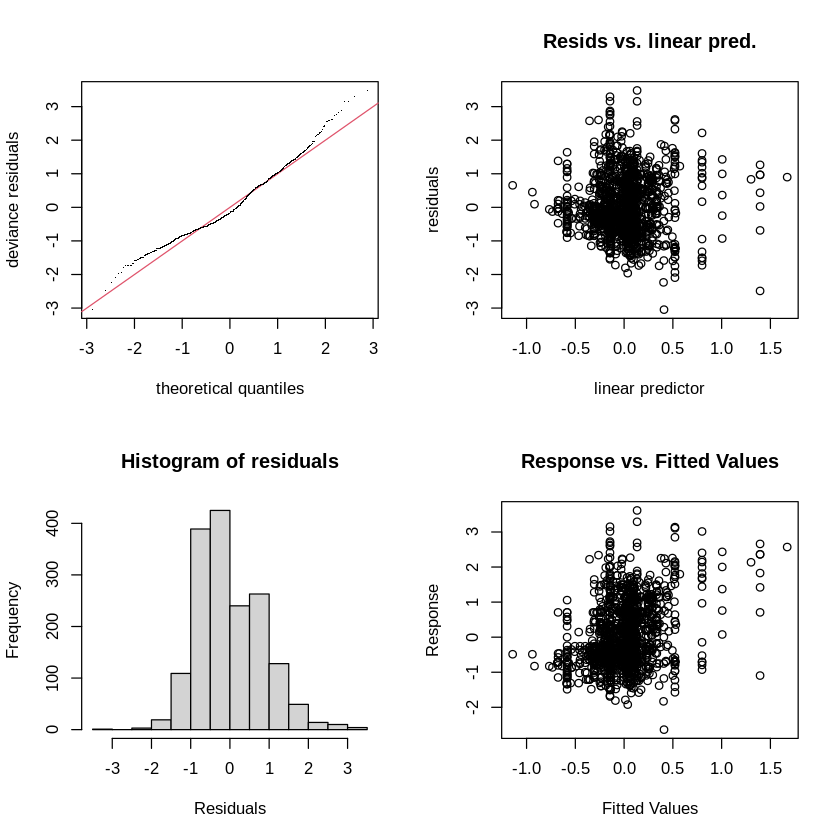

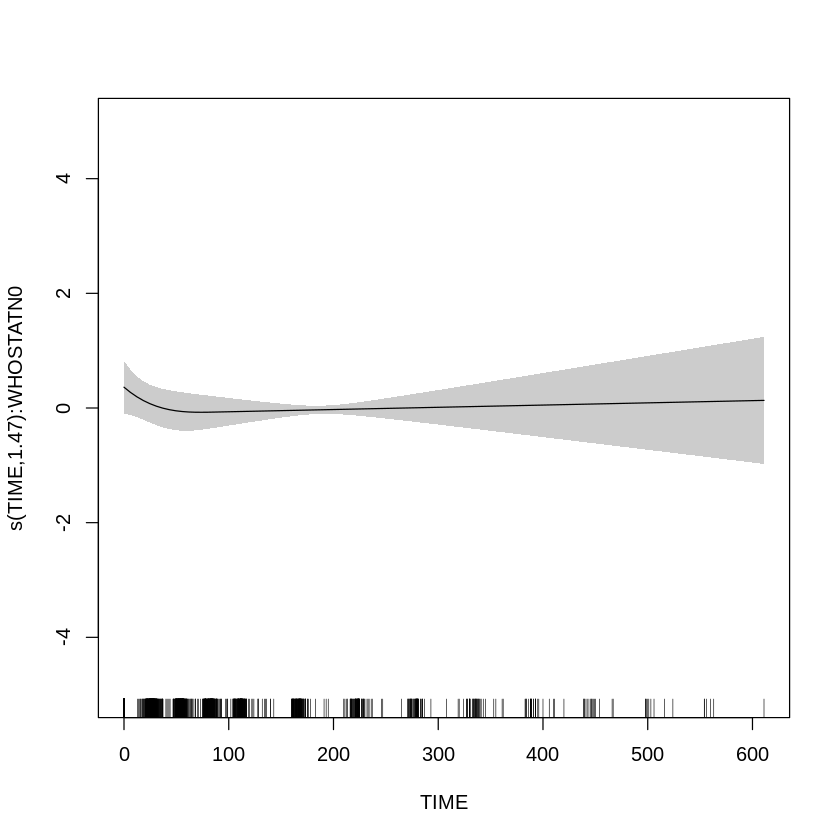

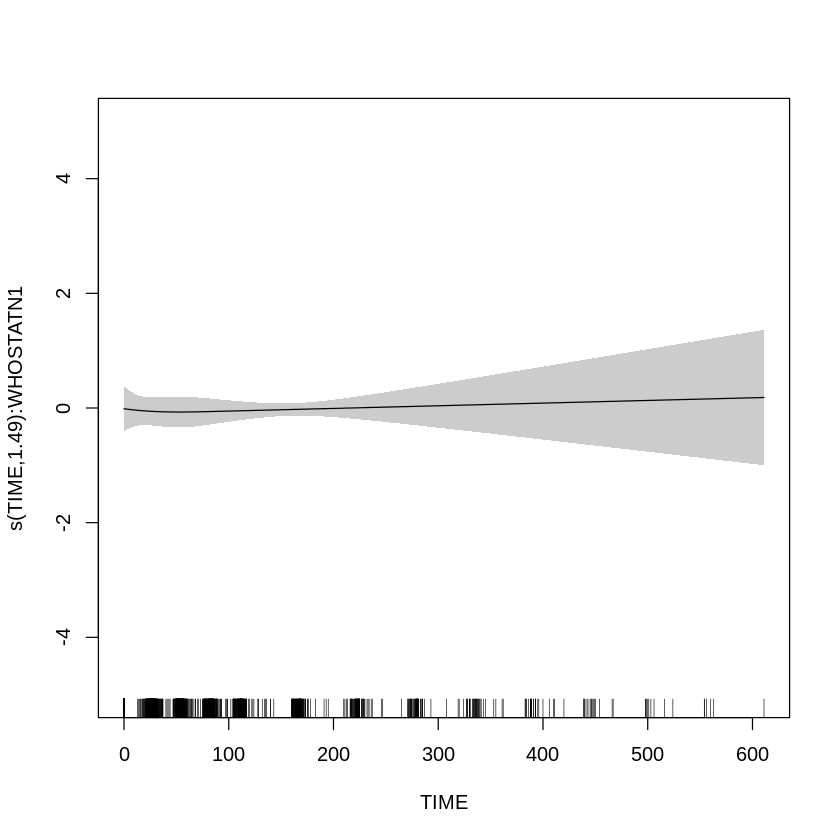

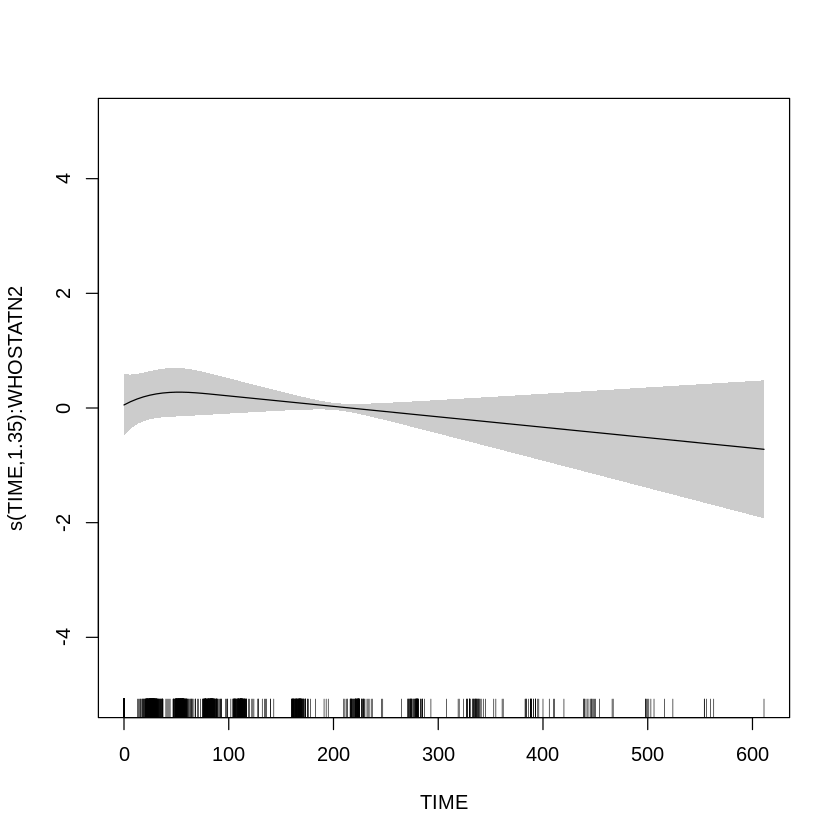

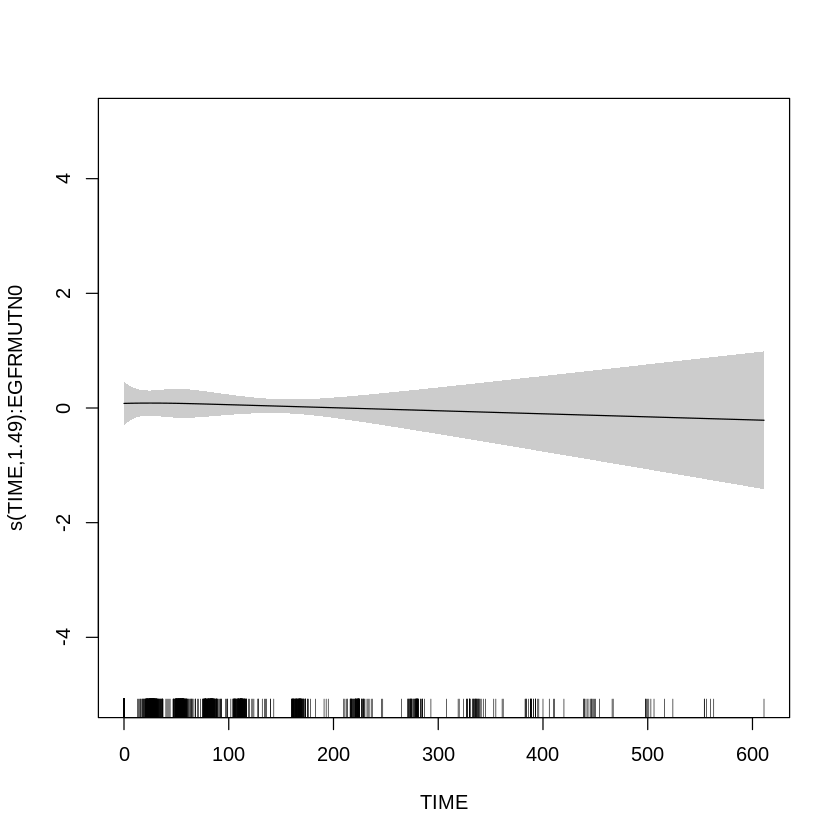

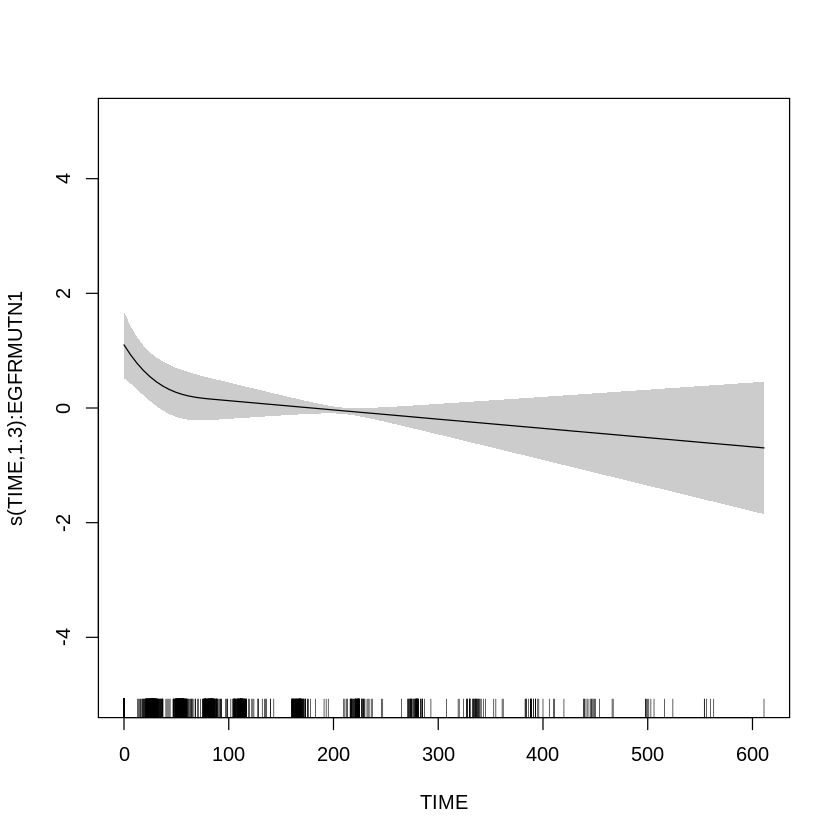

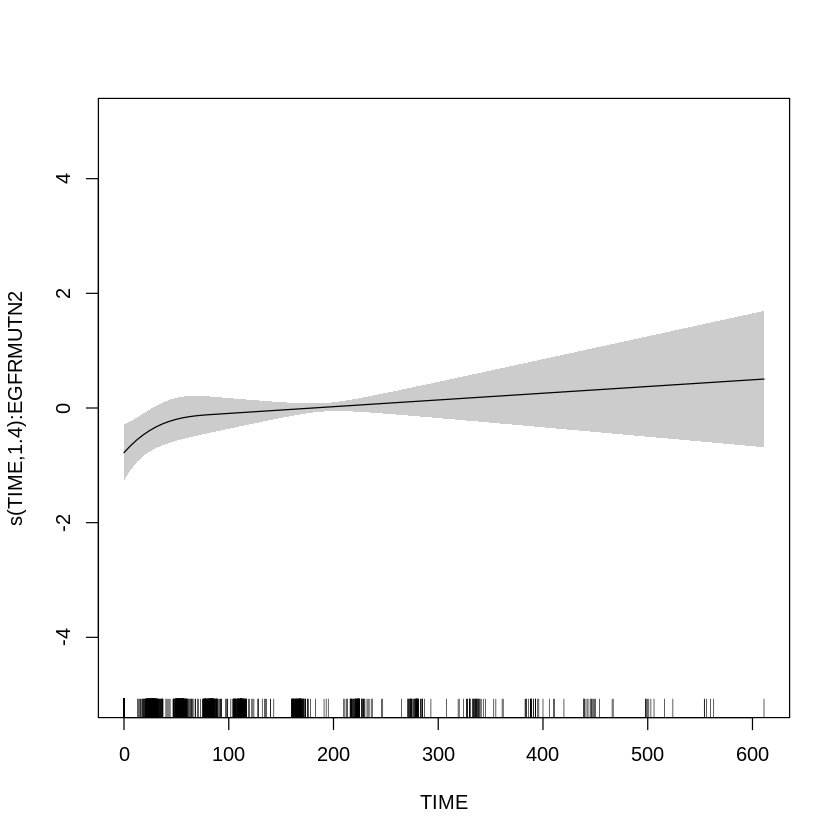

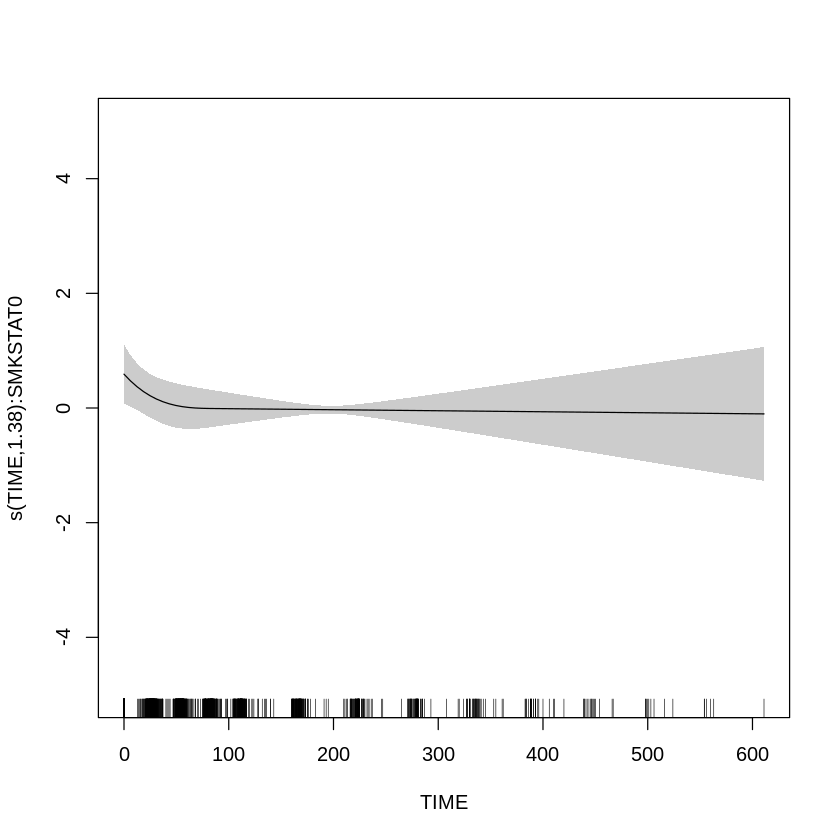

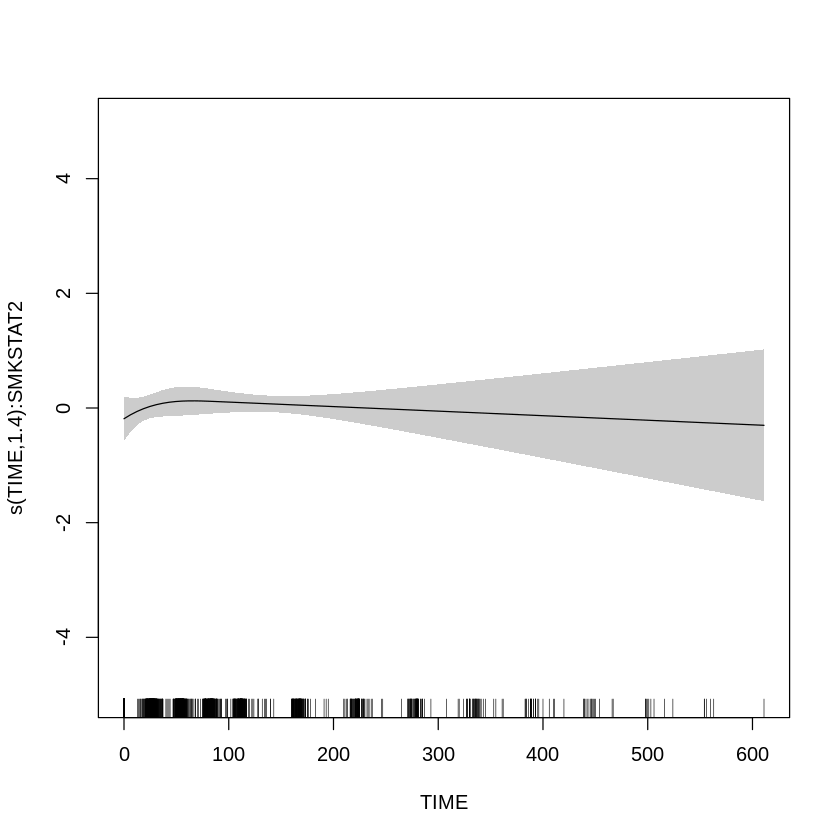

In [ ]:
ct1 <- gam(norm~s(TIME,  by =WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfSLD, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-5,5), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.23314    0.07291  -3.197 0.001413 ** 
SMKSTAT2     0.11100    0.06938   1.600 0.109819    
EGFRMUTN1   -0.14829    0.10906  -1.360 0.174111    
EGFRMUTN2    0.41883    0.11683   3.585 0.000347 ***
WHOSTATN1    0.09761    0.06624   1.474 0.140769    
WHOSTATN2   -0.06137    0.15510  -0.396 0.692396    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.470      9 0.337 1.20e-06 ***
s(TIME):WHOSTATN1 1.485      9 0.016   0.4544    
s(TIME):WHOSTATN2 1.354      8 0.216   0.0249 *  
s(TIME):EGFRMUTN0 1.486      9 0.022 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F  p-value
SMKSTAT   1 2.560 0.109819
EGFRMUTN  2 7.873 0.000396
WHOSTATN  2 1.421 0.241875

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.470  9.000 0.337 1.20e-06
s(TIME):WHOSTATN1 1.485  9.000 0.016   0.4544
s(TIME):WHOSTATN2 1.354  8.000 0.216   0.0249
s(TIME):EGFRMUTN0 1.486  9.000 0.022   0.3473
s(TIME):EGFRMUTN1 1.304  7.000 2.027  < 2e-16
s(TIME):EGFRMUTN2 1.401  7.000 1.234  < 2e-16
s(TIME):SMKSTAT0  1.378  9.000 0.584  < 2e-16
s(TIME):SMKSTAT2  1.401  9.000 0.157 8.18e-06

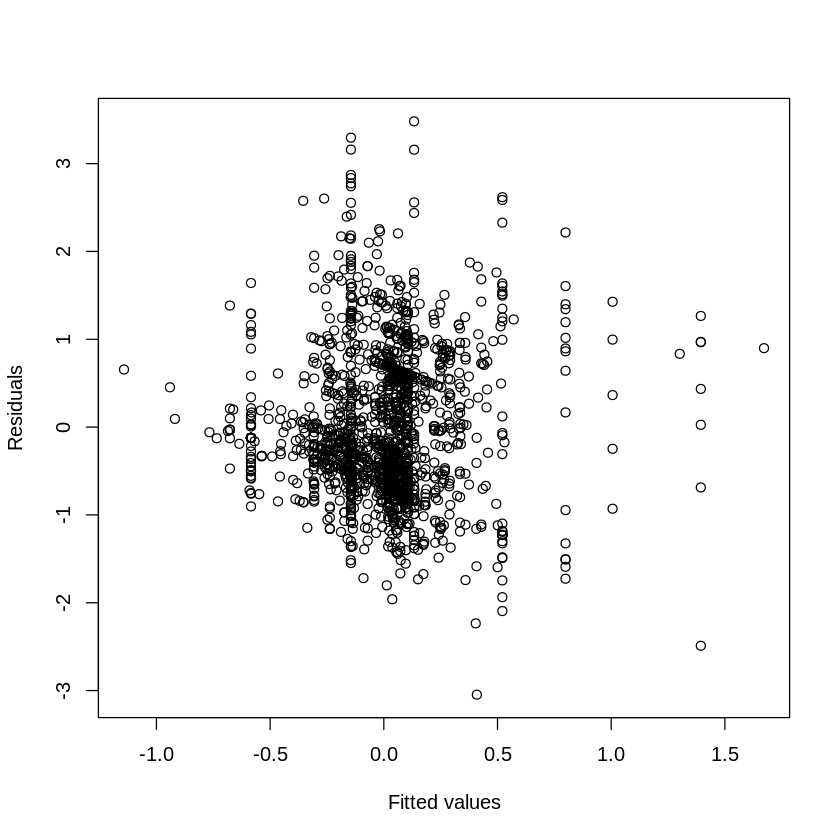

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 12 iterations.
Gradient range [-0.006159711,0.004104349]
(score 2083.465 & scale 0.7097717).
eigenvalue range [-5.833401e-14,825.5131].
Model rank =  48 / 48 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value  
s(TIME):EGFRMUTN0 9.00 1.57    0.97   0.125  
s(TIME):EGFRMUTN1 9.00 1.43    0.97   0.145  
s(TIME):EGFRMUTN2 9.00 1.52    0.97   0.095 .
s(TIME):SMKSTAT0  9.00 1.56    0.97   0.165  
s(TIME):SMKSTAT2  9.00 1.58    0.97   0.115  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


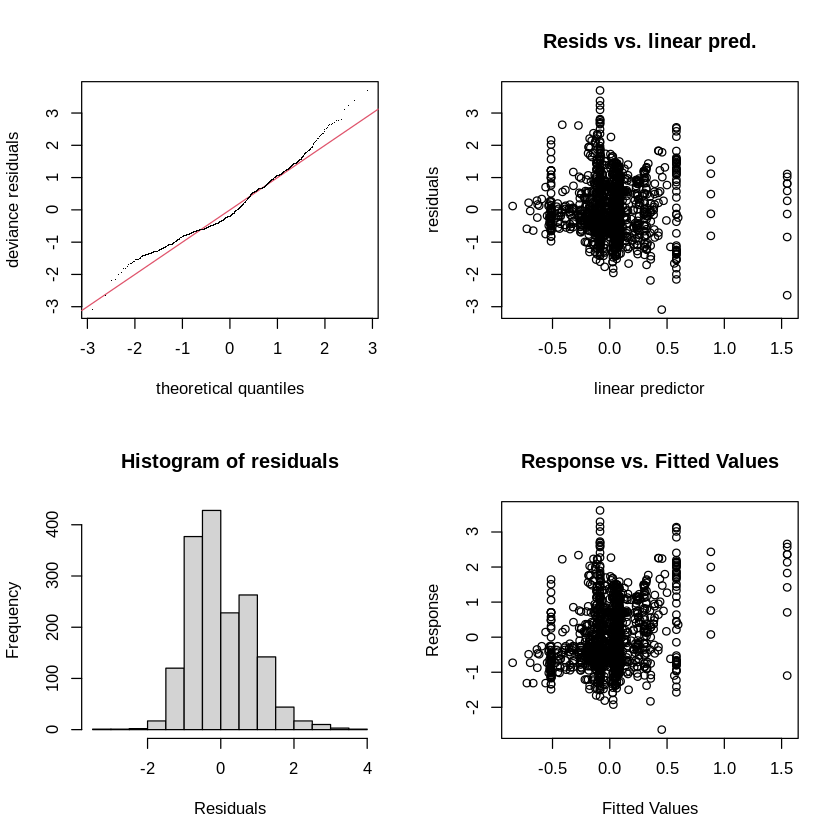

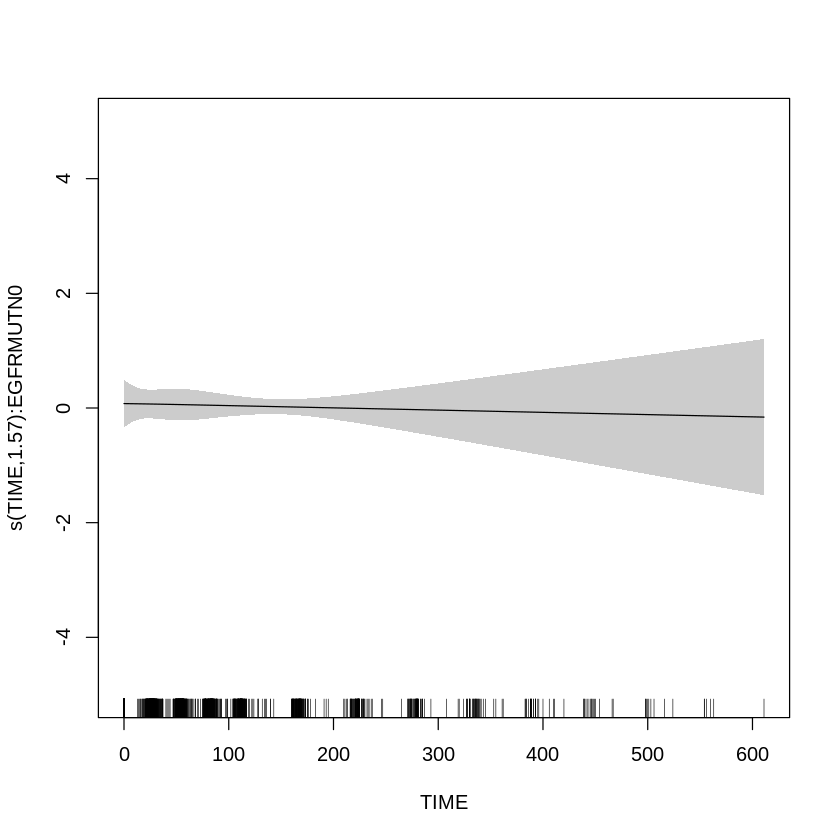

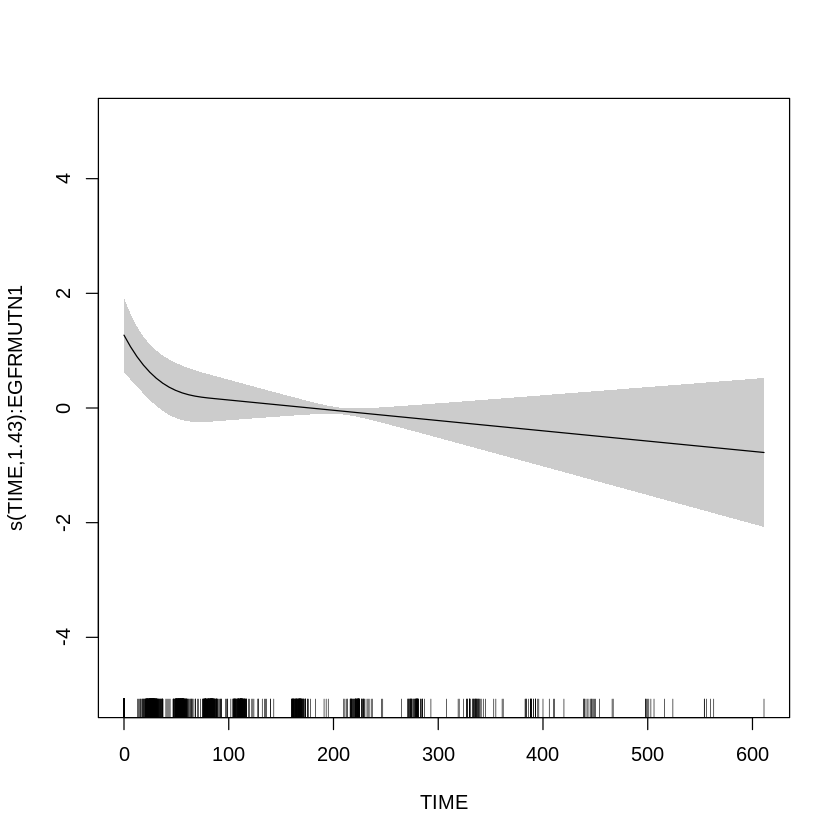

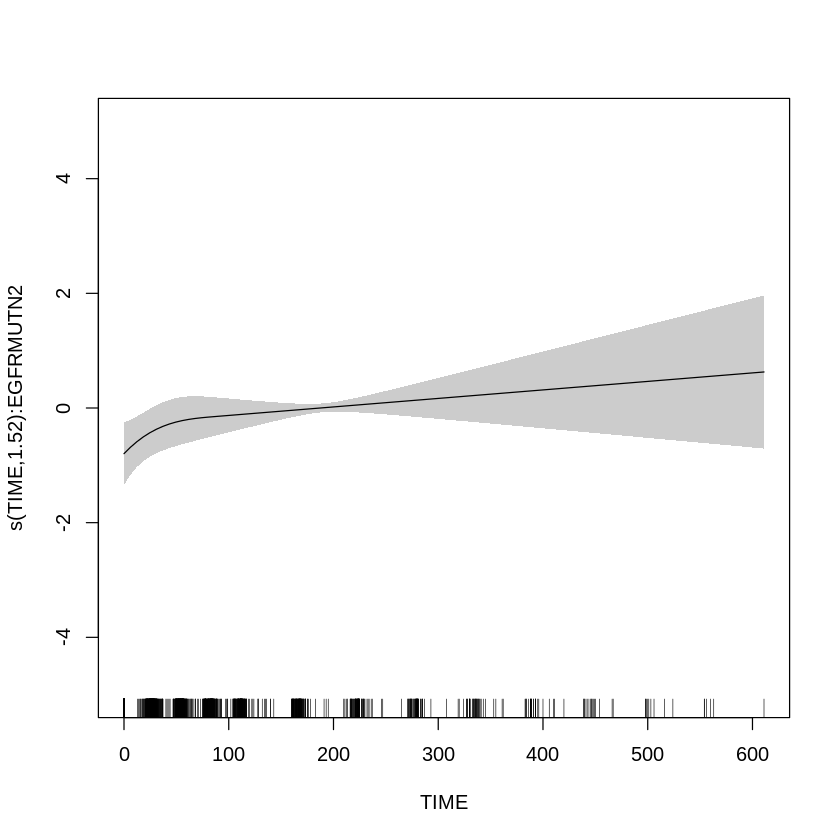

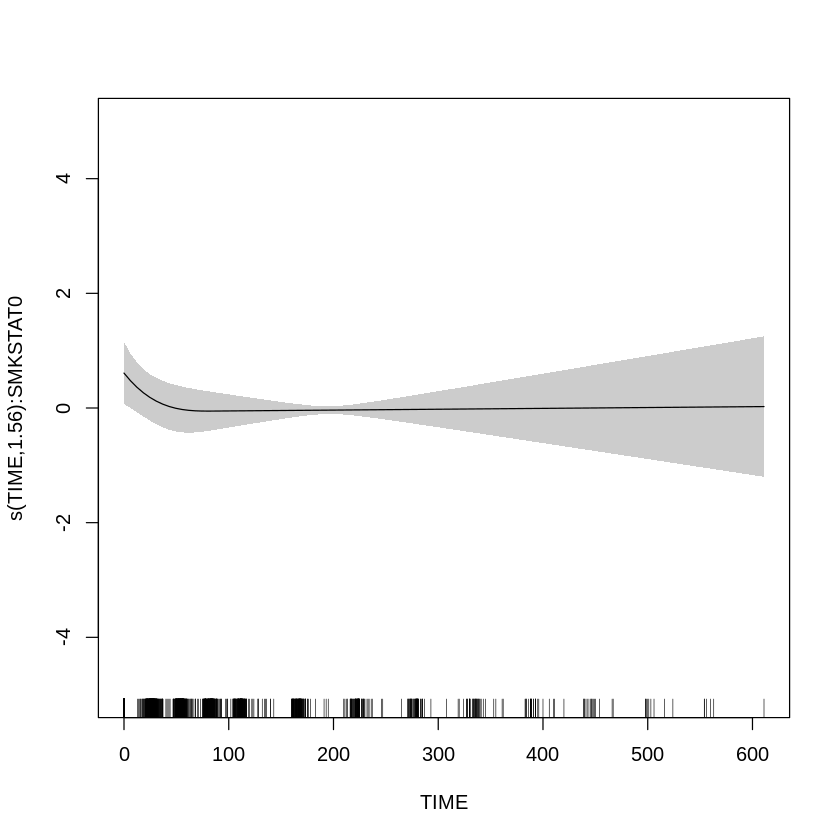

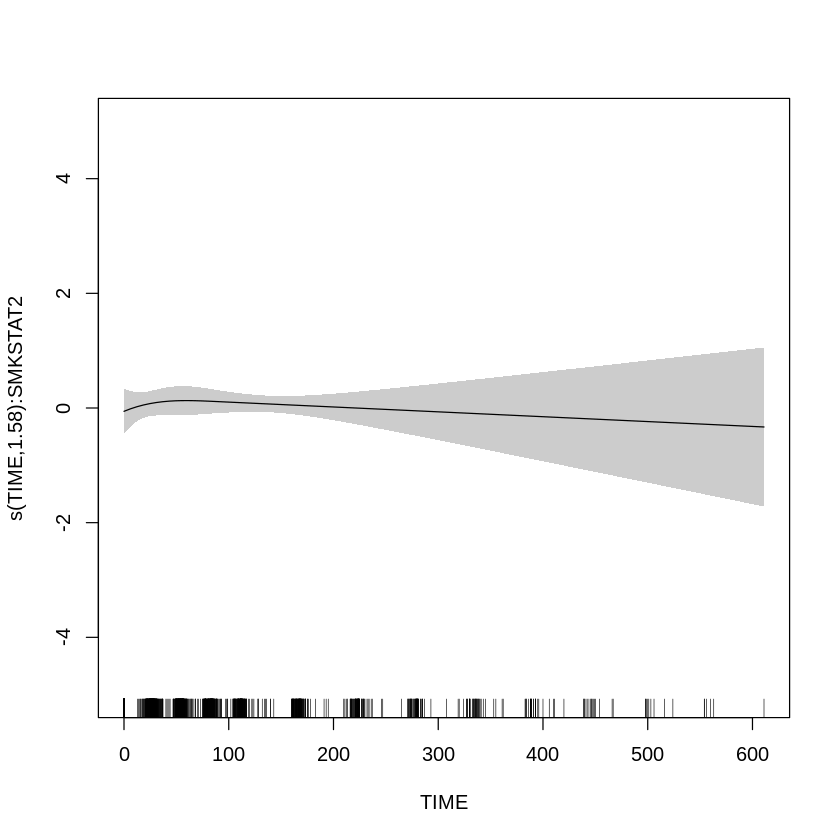

In [ ]:
ct1 <- gam(norm~ s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           EGFRMUTN, data = dfSLD, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-5,5), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + EGFRMUTN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.10429    0.03503  -2.977 0.002953 ** 
EGFRMUTN1   -0.22557    0.10735  -2.101 0.035782 *  
EGFRMUTN2    0.44562    0.11565   3.853 0.000121 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                    edf Ref.df     F p-value    
s(TIME):EGFRMUTN0 1.574      9 0.011 0.45176    
s(TIME):EGFRMUTN1 1.431      7 2.159 < 2e-16 ***
s(TIME):EGFRMUTN2 1.515      8 0.884 < 2e-16 ***
s(TIME):SMKSTAT0  1.558      8 0.738 < 2e-16 ***
s(TIME):SMKSTAT2  1.576      9 0.073 0.00489 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0877   Deviance explained =  9.3%
-REML = 2083.5  Scale est. = 0.70977   n = 1654


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + EGFRMUTN

Parametric Terms:
         df     F  p-value
EGFRMUTN  2 10.59 2.68e-05

Approximate significance of smooth terms:
                    edf Ref.df     F p-value
s(TIME):EGFRMUTN0 1.574  9.000 0.011 0.45176
s(TIME):EGFRMUTN1 1.431  7.000 2.159 < 2e-16
s(TIME):EGFRMUTN2 1.515  8.000 0.884 < 2e-16
s(TIME):SMKSTAT0  1.558  8.000 0.738 < 2e-16
s(TIME):SMKSTAT2  1.576  9.000 0.073 0.00489

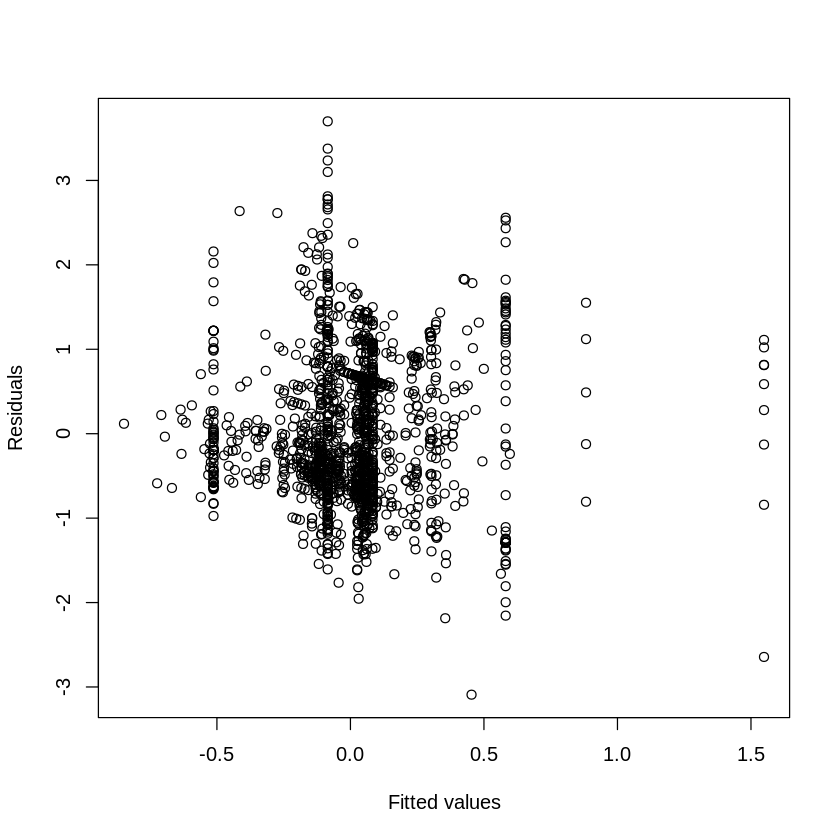

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

In [ ]:
unique(data$YTYPE_DESC)

[1] "SLD"   "ALT"   "ALP"   "AST"   "CREAT" "LDH"   "NEUT"  "WBC"   "NLR"

# ALT

In [ ]:
dfALT <- make_df(data, 'ALT')


Method: REML   Optimizer: outer newton
full convergence after 11 iterations.
Gradient range [-0.01289108,0.008283726]
(score 4144.452 & scale 0.8299861).
eigenvalue range [-3.210855e-09,1552.516].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.114    1.01    0.64
s(TIME):WHOSTATN1 9.000 1.163    1.01    0.67
s(TIME):WHOSTATN2 9.000 0.735    1.01    0.72
s(TIME):EGFRMUTN0 9.000 1.180    1.01    0.65
s(TIME):EGFRMUTN1 9.000 0.640    1.01    0.70
s(TIME):EGFRMUTN2 9.000 0.807    1.01    0.69
s(TIME):SMKSTAT0  9.000 1.042    1.01    0.69
s(TIME):SMKSTAT2  9.000 1.132    1.01    0.69


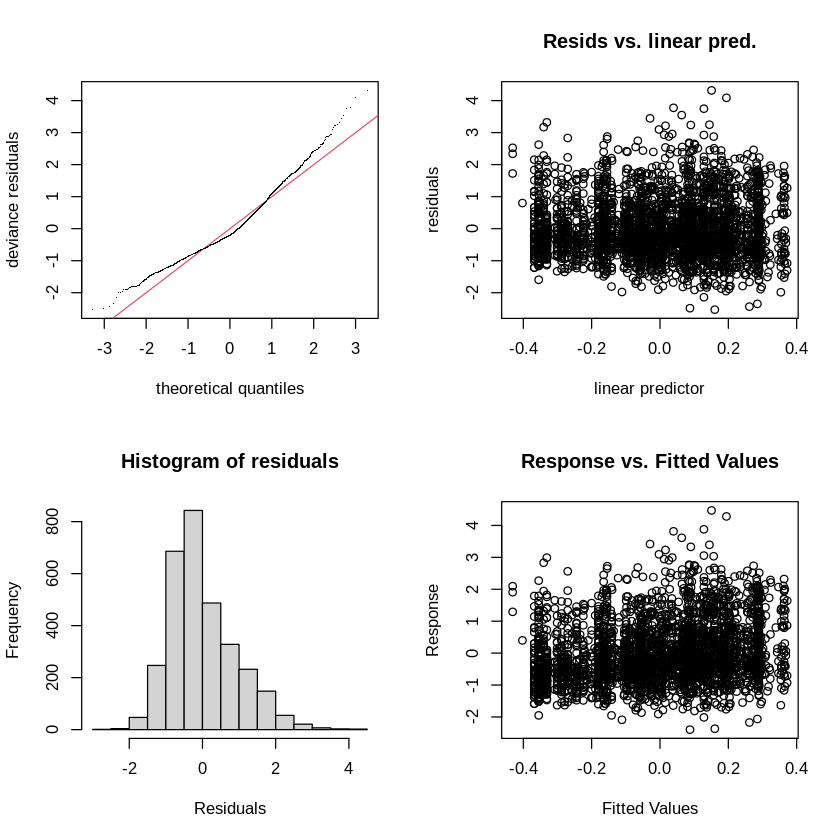

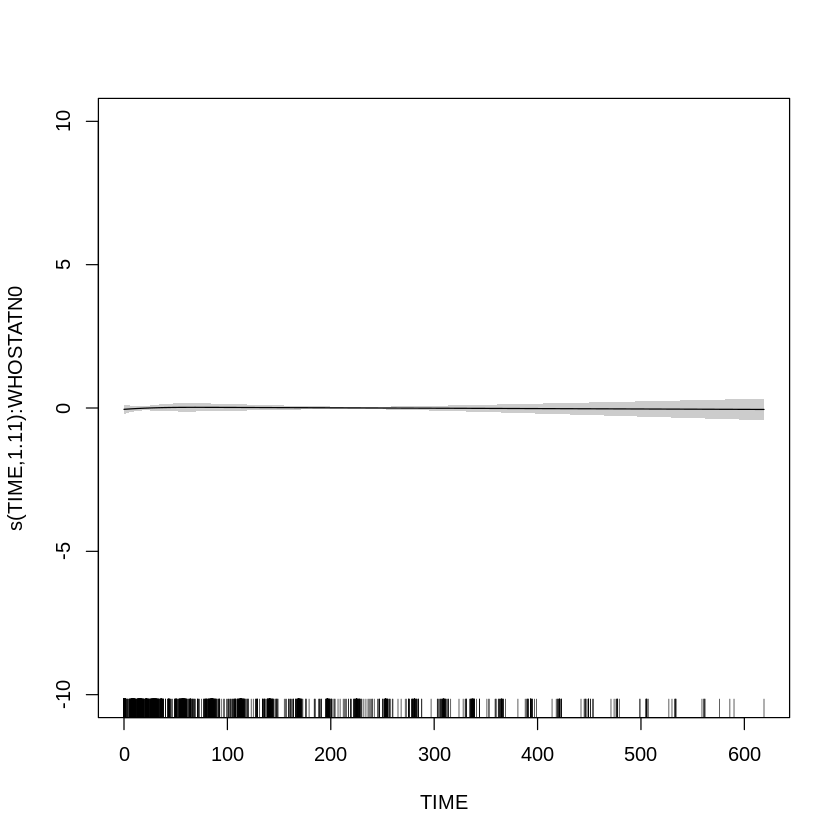

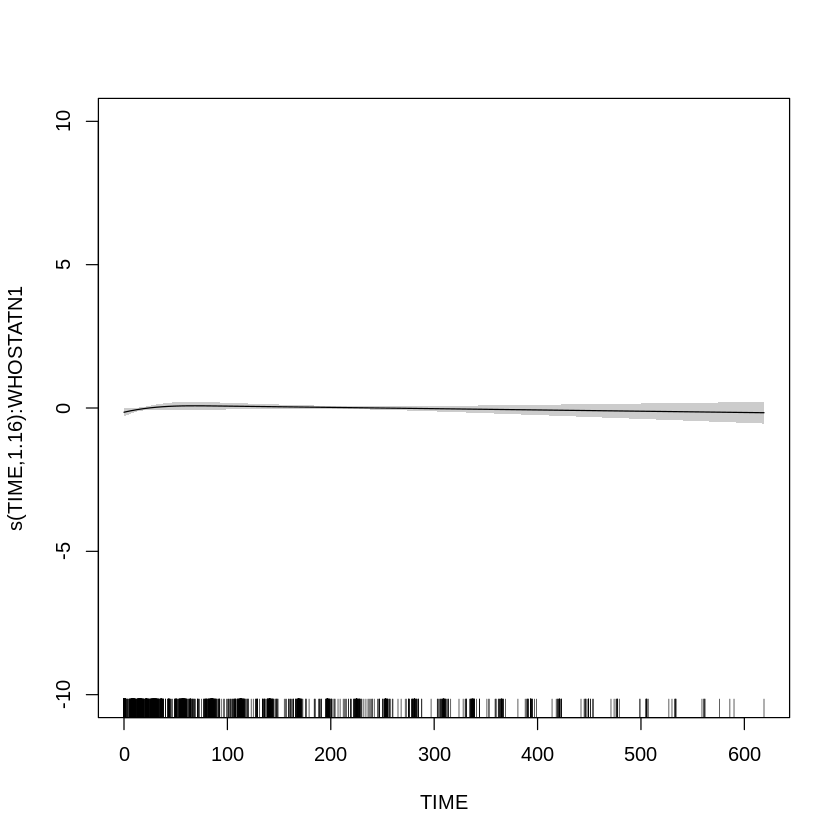

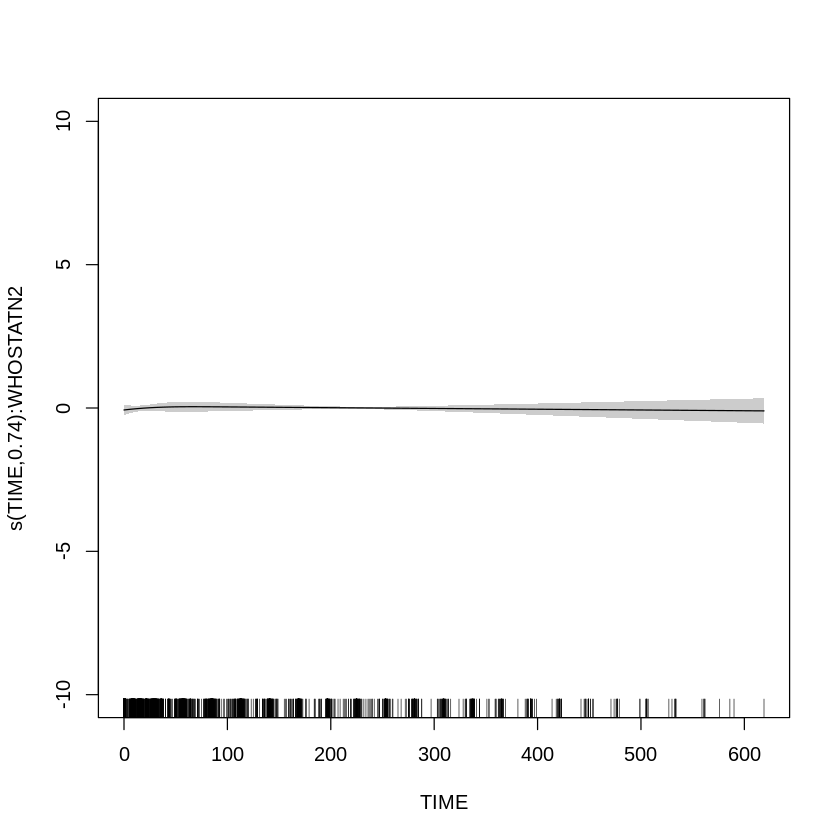

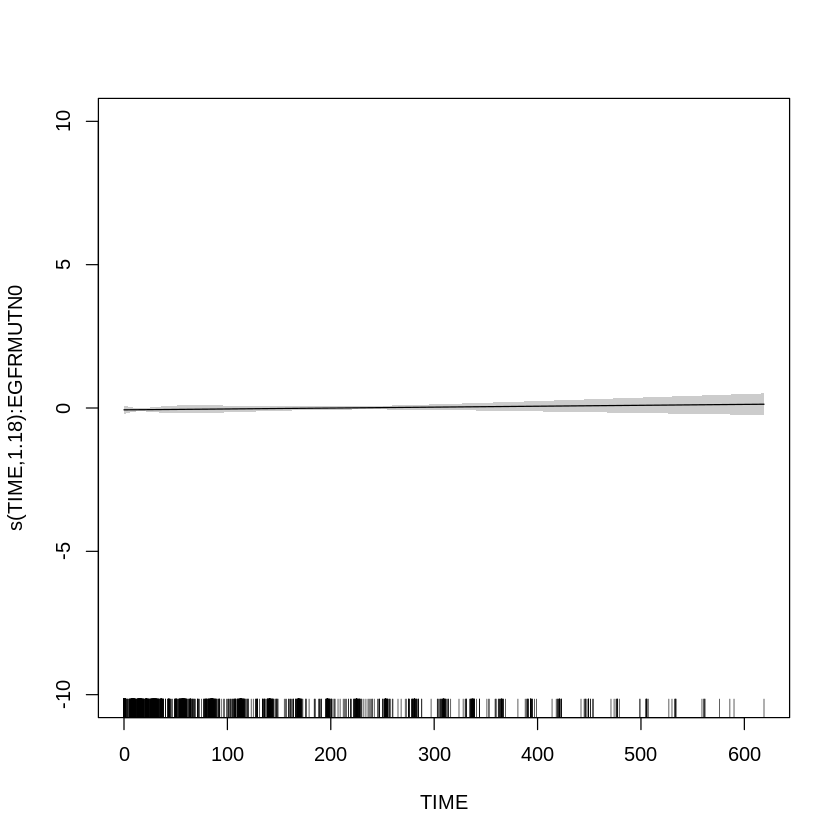

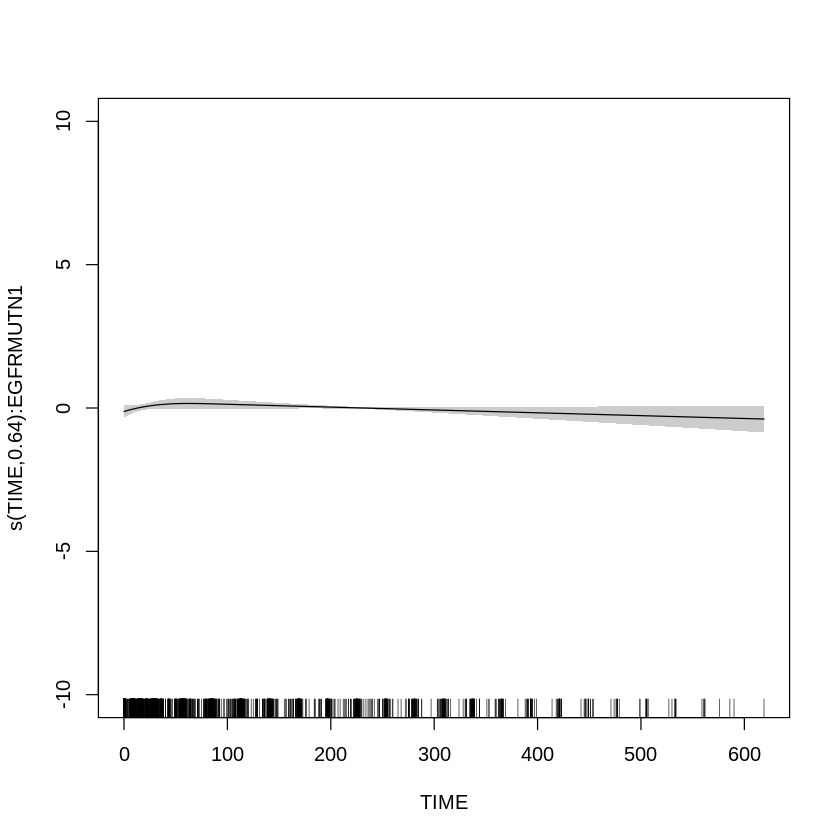

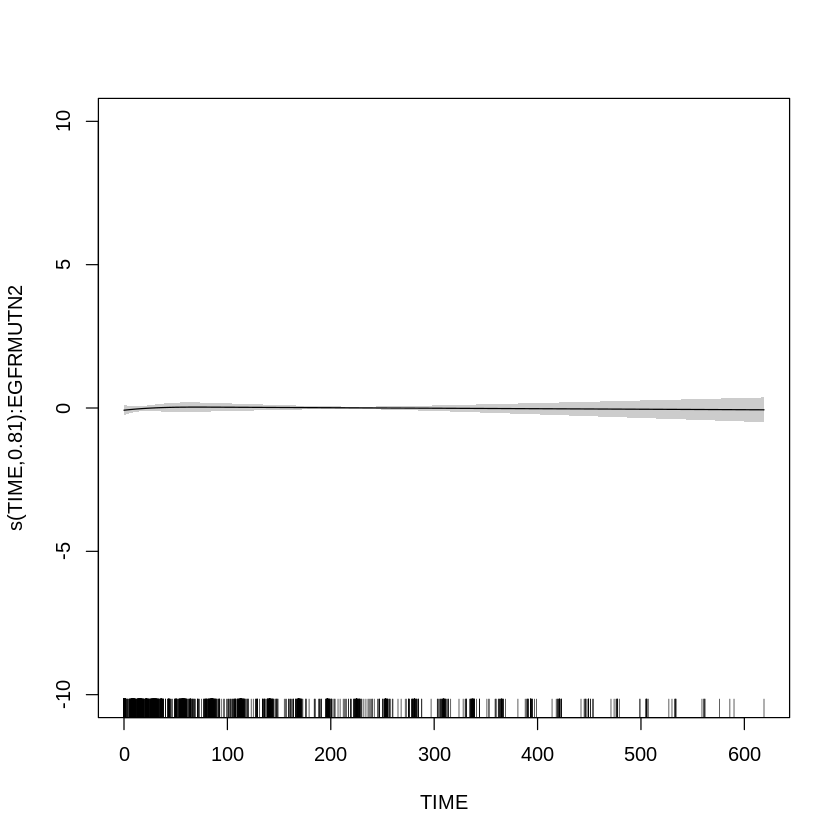

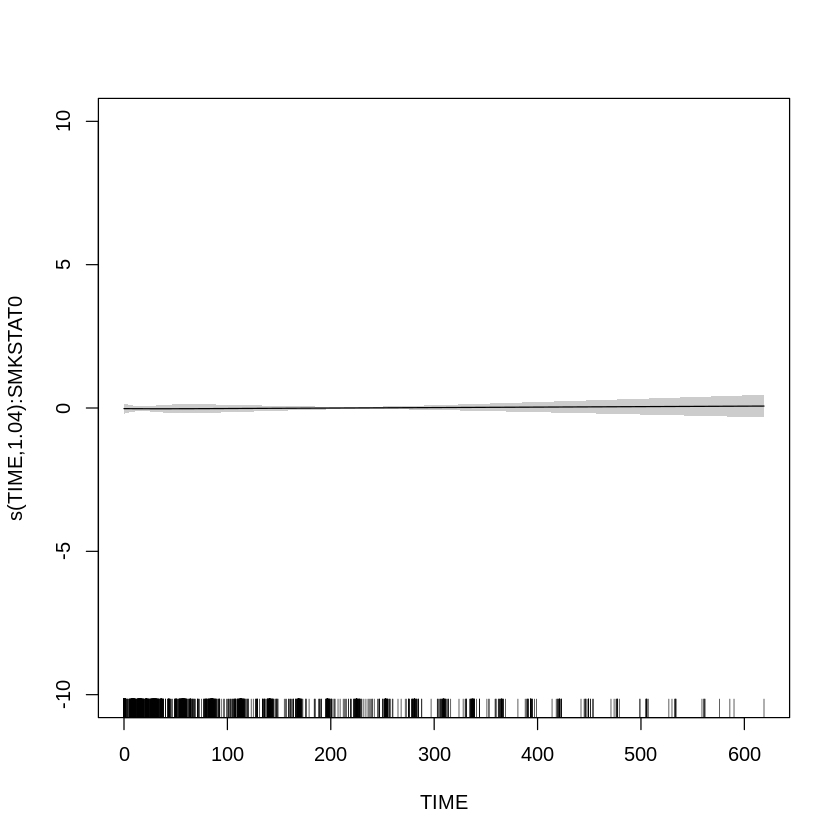

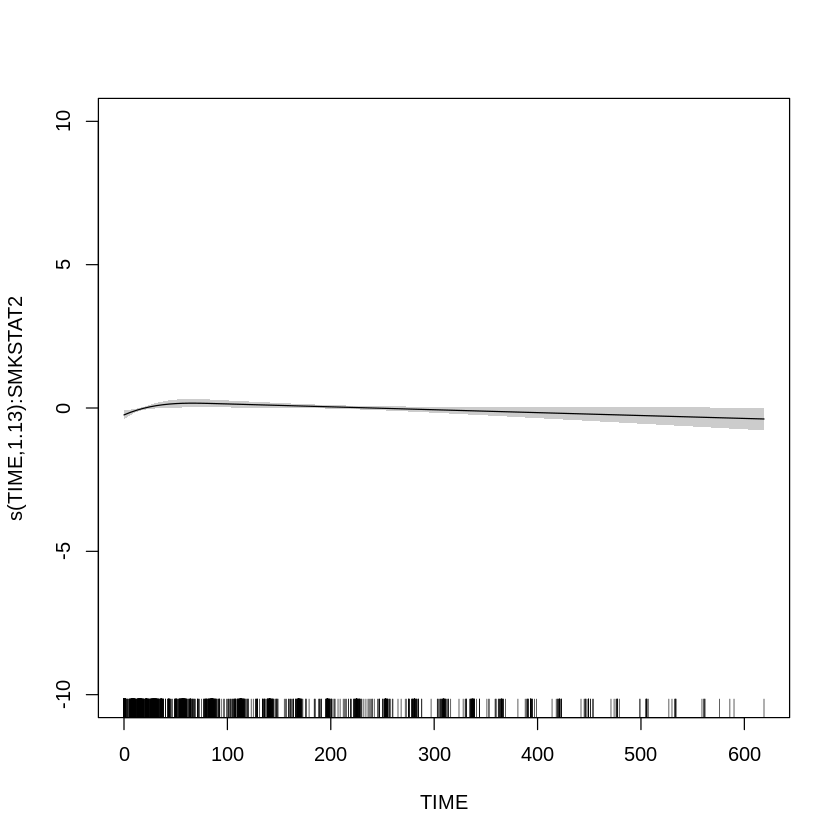

In [ ]:
ct1 <- gam(norm~s(TIME,  by =WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfALT, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
              Estimate Std. Error t value Pr(>|t|)
(Intercept)  0.0339673  0.0531627   0.639    0.523
SMKSTAT2     0.0290232  0.0495282   0.586    0.558
EGFRMUTN1   -0.0851794  0.0772010  -1.103    0.270
EGFRMUTN2   -0.0005439  0.0655454  -0.008    0.993
WHOSTATN1    0.0341470  0.0479099   0.713    0.476
WHOSTATN2    0.0663427  0.0777651   0.853    0.394

Approximate significance of smooth terms:
                     edf Ref.df     F p-value    
s(TIME):WHOSTATN0 1.1143      9 0.033 0.54939    
s(TIME):WHOSTATN1 1.1627      8 0.413 0.00099 ***
s(TIME):WHOSTATN2 0.7353      7 0.079 0.28445    
s(TIME):EGFRMUTN0 1.1797      9 0.255 0.00406 ** 
s(TIME):EGFRMUTN1 0.6398      7 0.403 0.00548 ** 
s(TIME):EGFRMUTN2 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.343   0.558
EGFRMUTN  2 0.621   0.538
WHOSTATN  2 0.460   0.631

Approximate significance of smooth terms:
                     edf Ref.df     F p-value
s(TIME):WHOSTATN0 1.1143 9.0000 0.033 0.54939
s(TIME):WHOSTATN1 1.1627 8.0000 0.413 0.00099
s(TIME):WHOSTATN2 0.7353 7.0000 0.079 0.28445
s(TIME):EGFRMUTN0 1.1797 9.0000 0.255 0.00406
s(TIME):EGFRMUTN1 0.6398 7.0000 0.403 0.00548
s(TIME):EGFRMUTN2 0.8071 8.0000 0.088 0.19021
s(TIME):SMKSTAT0  1.0421 9.0000 0.040 0.45289
s(TIME):SMKSTAT2  1.1324 8.0000 1.060 < 2e-16

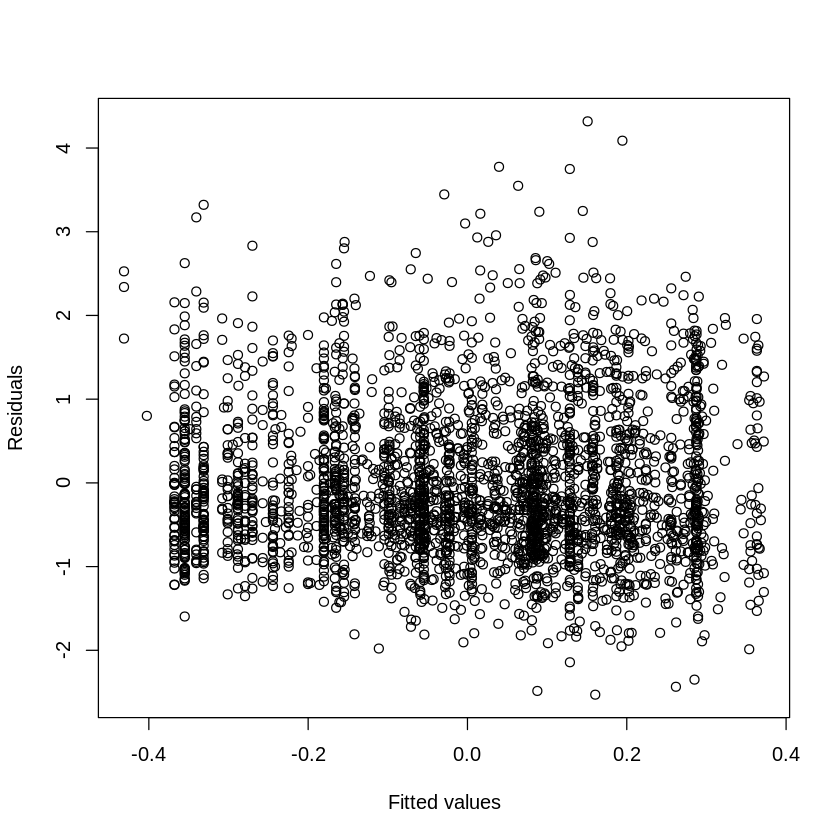

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 11 iterations.
Gradient range [-0.01574545,0.007655392]
(score 4131.757 & scale 0.8294062).
eigenvalue range [-3.396354e-06,1555.017].
Model rank =  19 / 19 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                   k'  edf k-index p-value
s(TIME):SMKSTAT0 9.00 1.81    1.01    0.69
s(TIME):SMKSTAT2 9.00 2.12    1.01    0.56


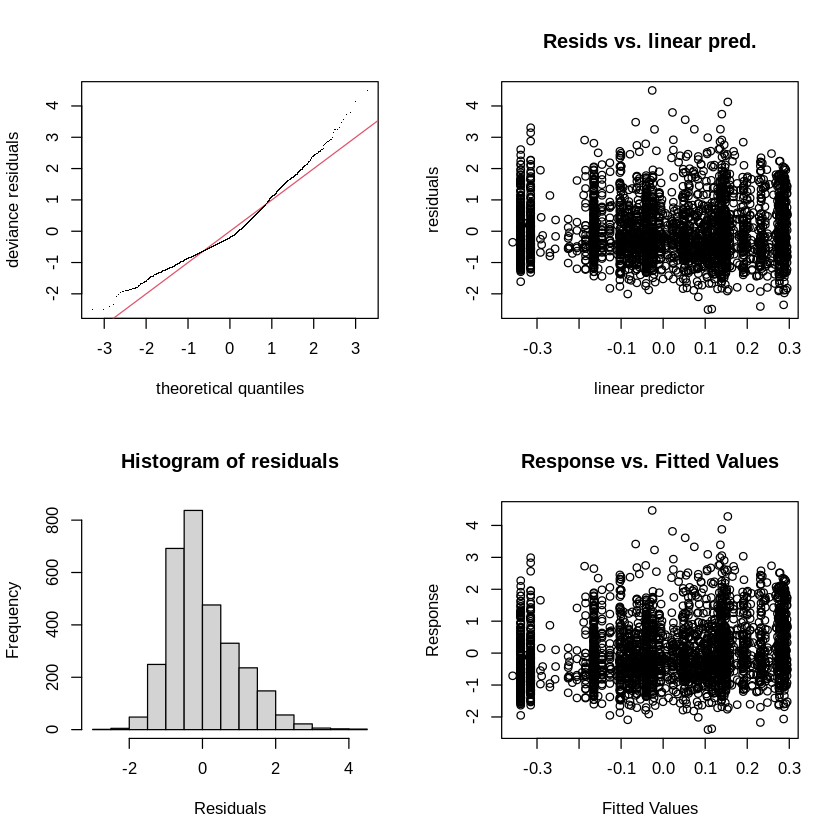

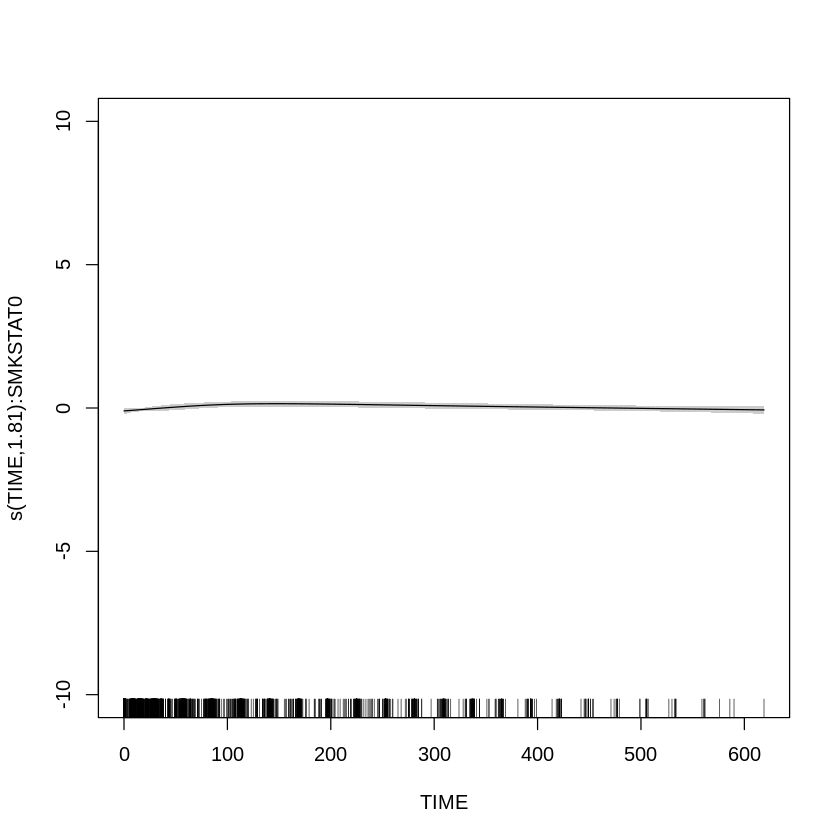

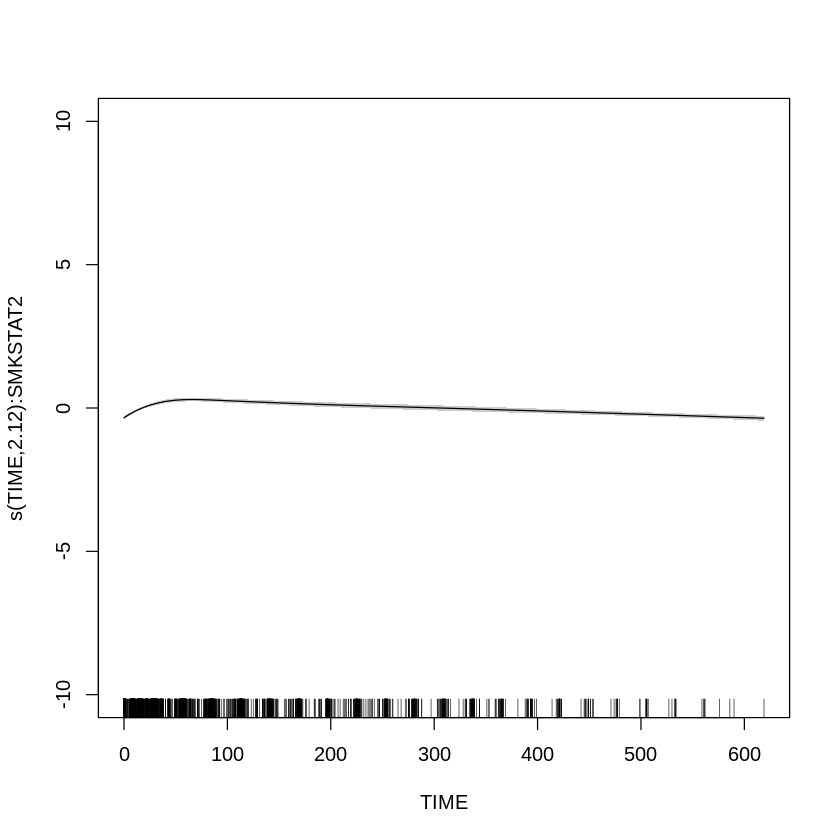

In [ ]:
ct1 <- gam(norm~s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1), data = dfALT, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0)


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = SMKSTAT, bs = "ad", k = 10, id = 1)

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)
(Intercept) -0.001313   0.016500   -0.08    0.937

Approximate significance of smooth terms:
                   edf Ref.df      F p-value    
s(TIME):SMKSTAT0 1.810      9  1.055 0.00412 ** 
s(TIME):SMKSTAT2 2.118      9 15.075 < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0446   Deviance explained = 4.59%
-REML = 4131.8  Scale est. = 0.82941   n = 3111


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = SMKSTAT, bs = "ad", k = 10, id = 1)

Approximate significance of smooth terms:
                   edf Ref.df      F p-value
s(TIME):SMKSTAT0 1.810  9.000  1.055 0.00412
s(TIME):SMKSTAT2 2.118  9.000 15.075 < 2e-16

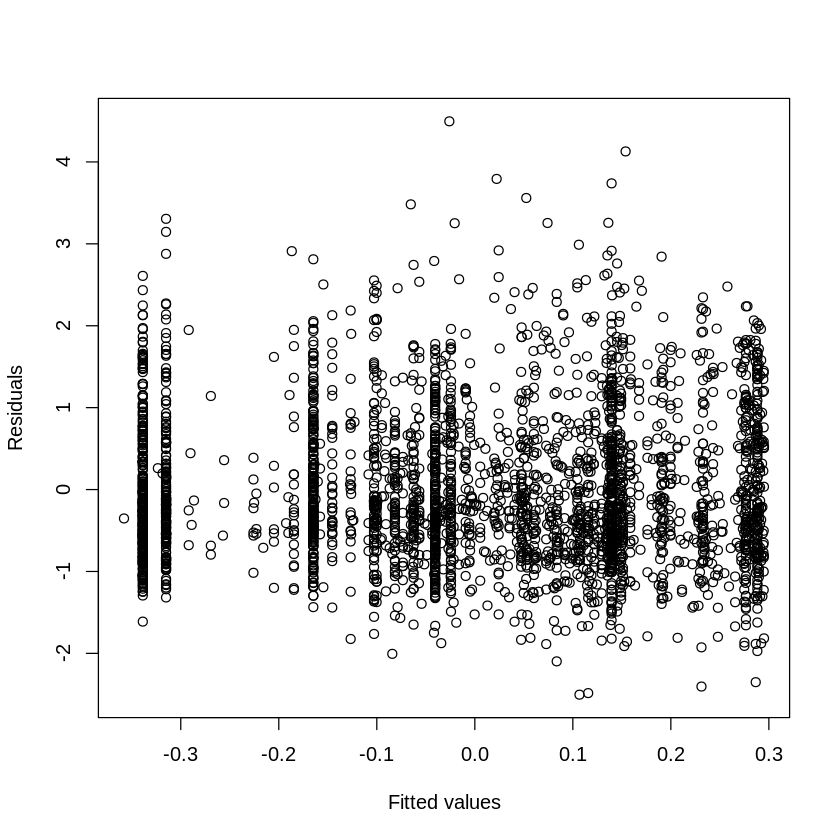

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# ALP

In [ ]:
dfALP <- make_df(data, 'ALP')


Method: REML   Optimizer: outer newton
full convergence after 8 iterations.
Gradient range [-4.907214e-06,3.25346e-06]
(score 4202.769 & scale 0.8601723).
Hessian positive definite, eigenvalue range [0.9497475,1554.504].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 0.712    0.99    0.20
s(TIME):WHOSTATN1 9.000 0.731    0.99    0.28
s(TIME):WHOSTATN2 9.000 0.503    0.99    0.22
s(TIME):EGFRMUTN0 9.000 0.755    0.99    0.23
s(TIME):EGFRMUTN1 9.000 0.530    0.99    0.21
s(TIME):EGFRMUTN2 9.000 0.545    0.99    0.23
s(TIME):SMKSTAT0  9.000 0.676    0.99    0.23
s(TIME):SMKSTAT2  9.000 0.710    0.99    0.18


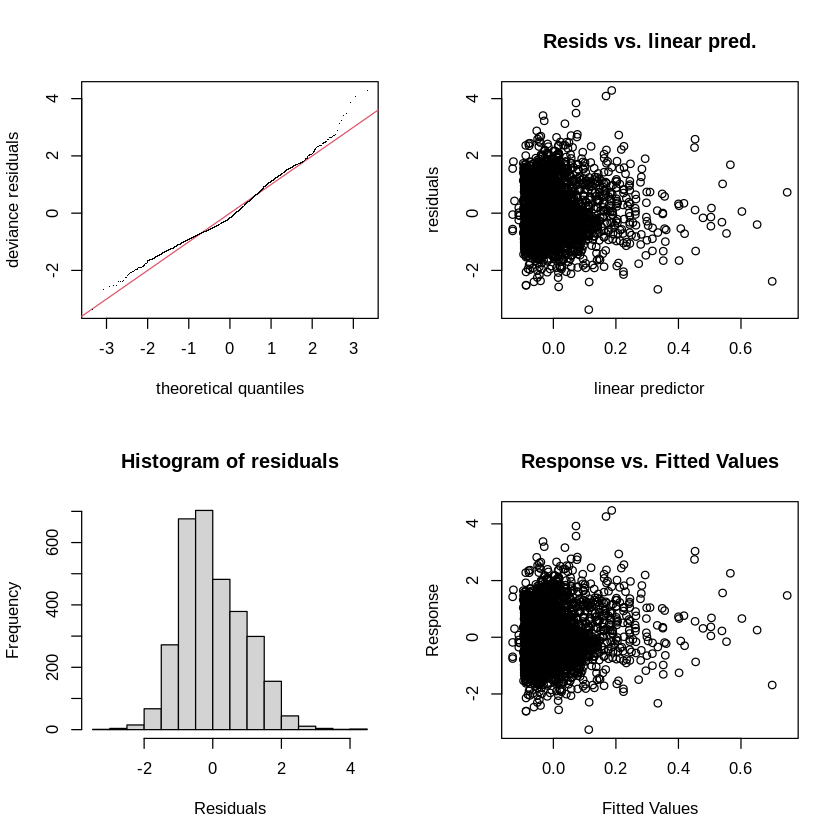

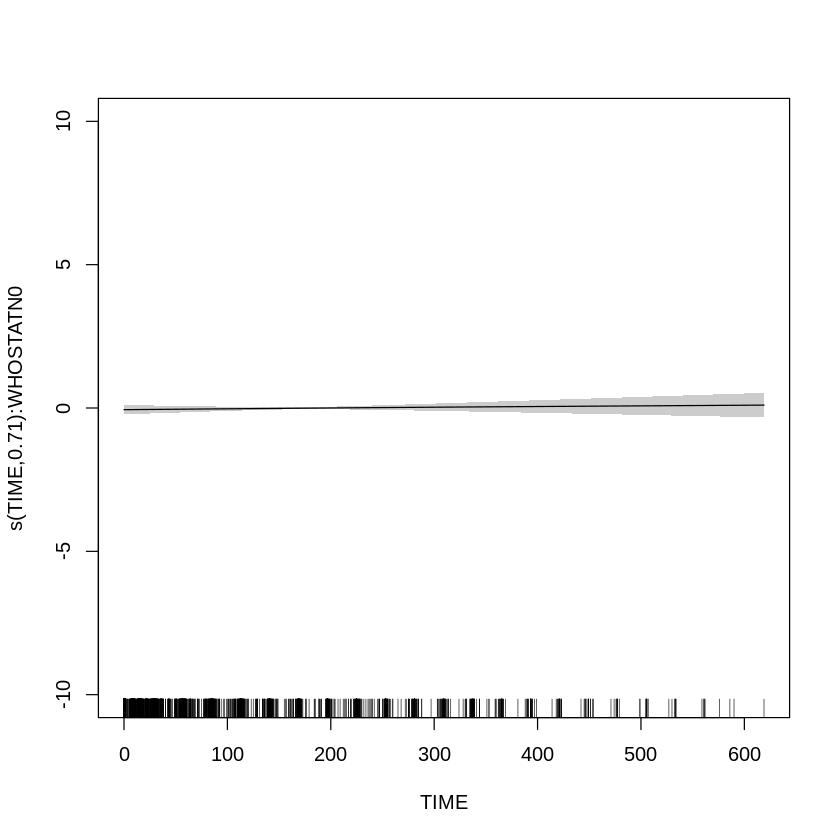

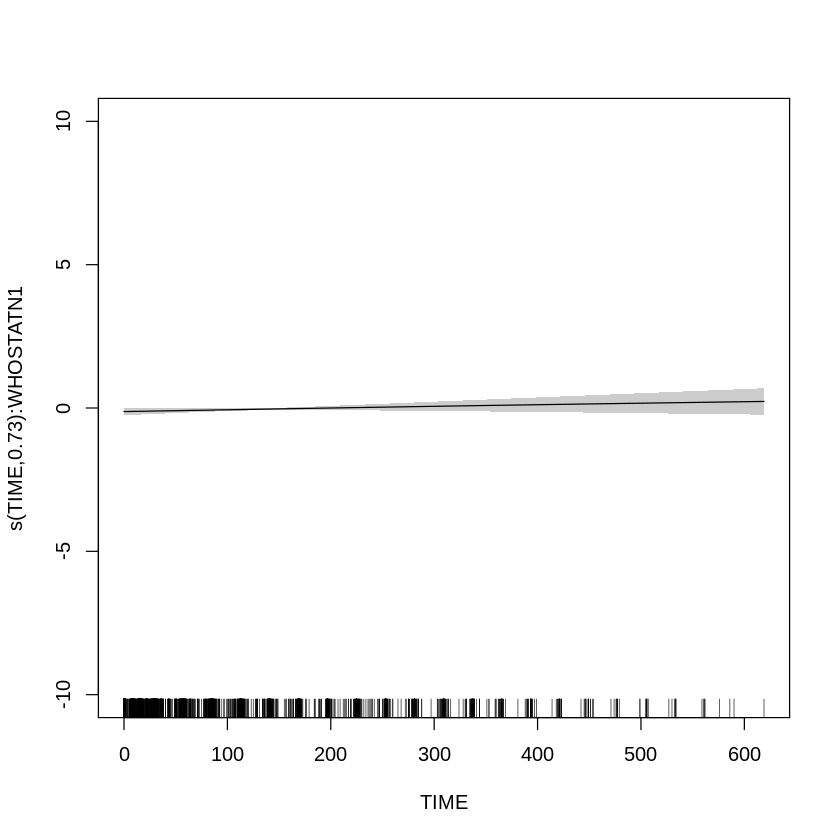

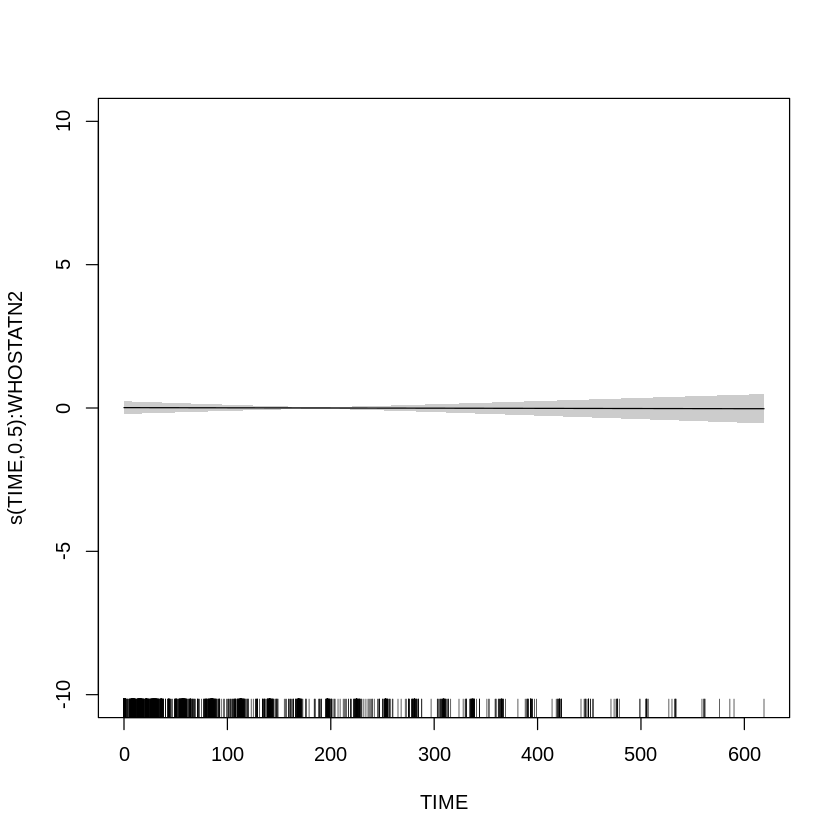

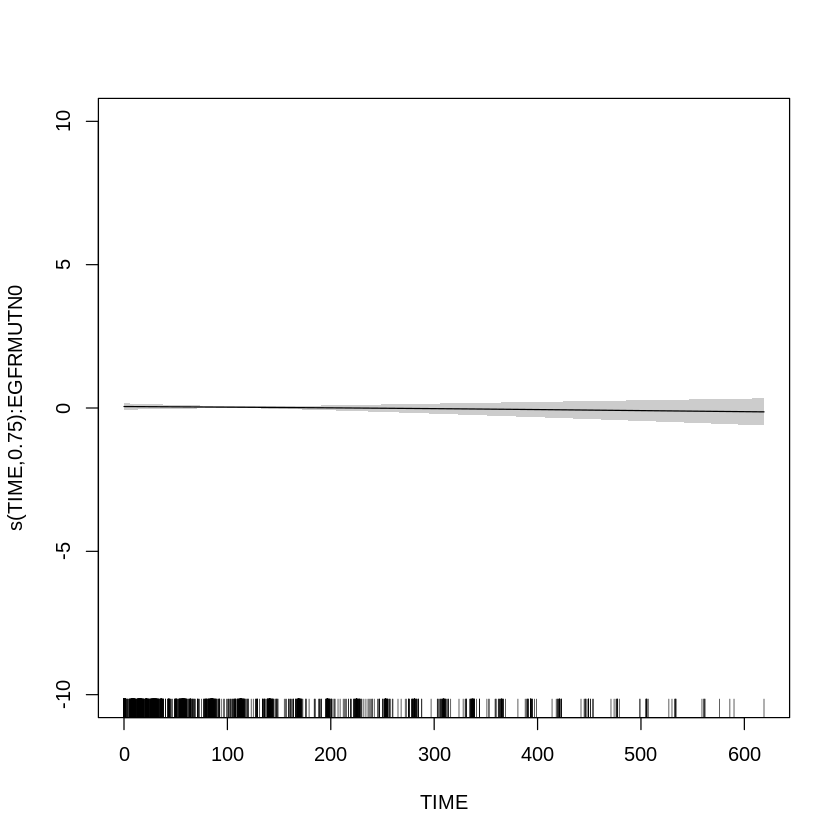

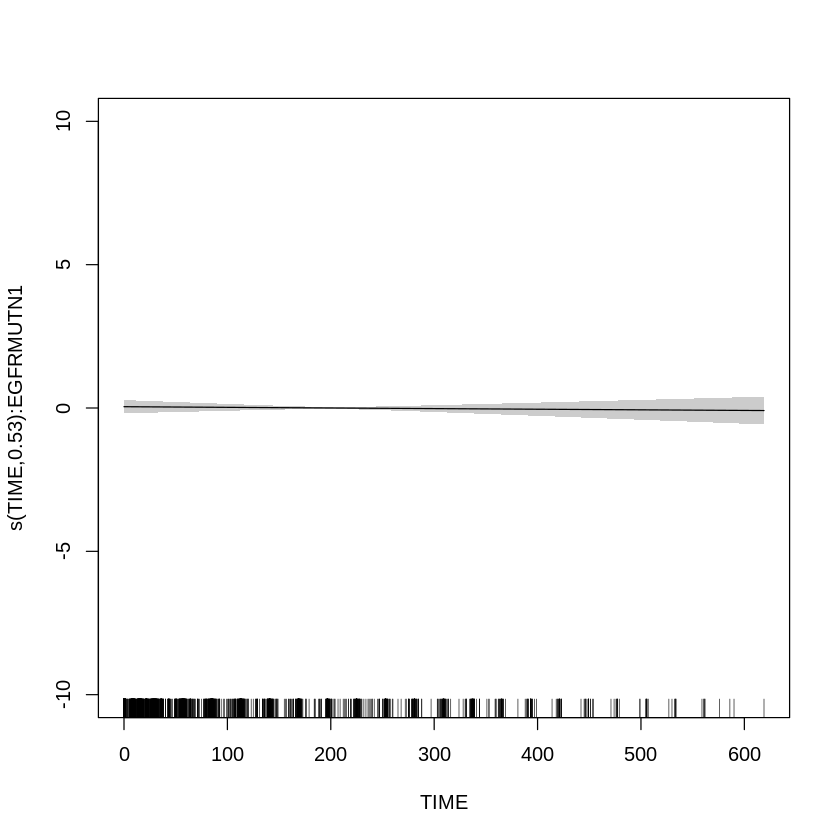

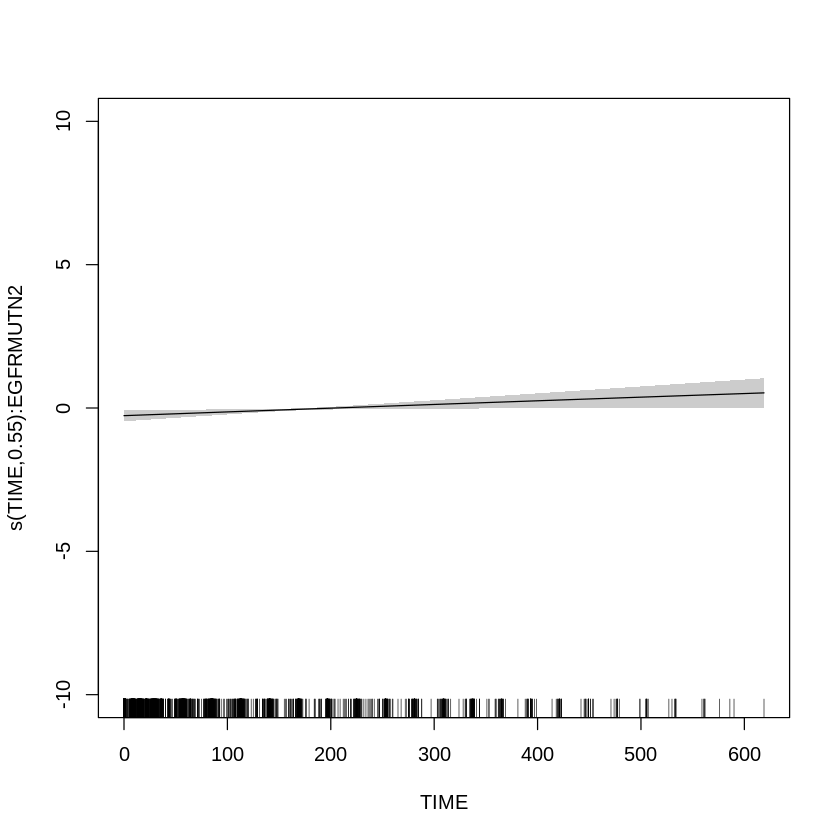

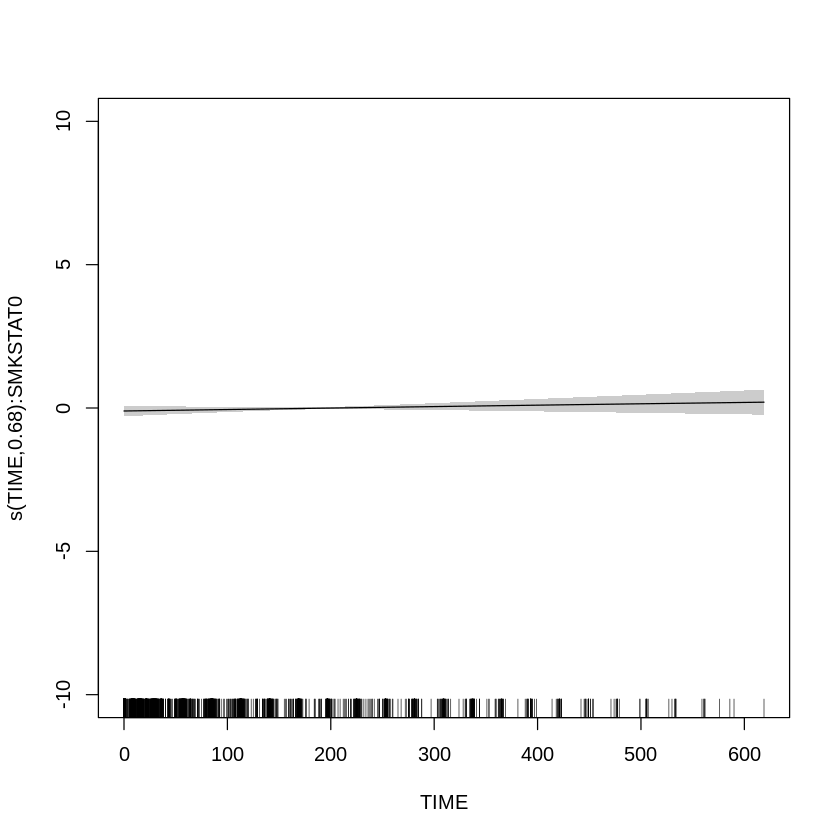

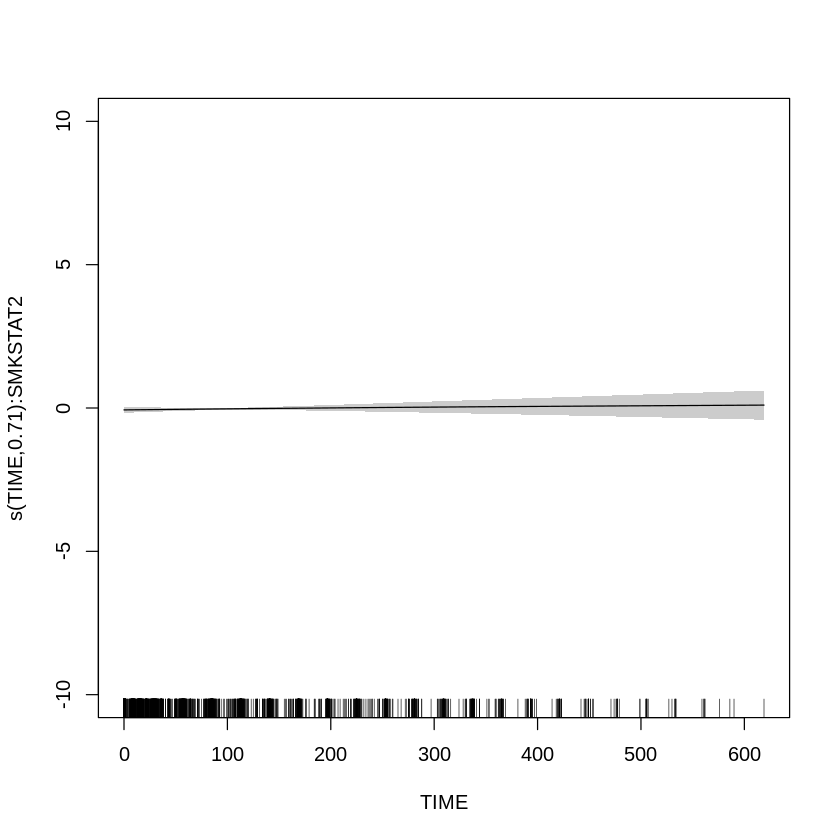

In [ ]:
ct1 <- gam(norm~s(TIME,  by =WHOSTATN, bs = 'ts', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ts', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ts', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfALP, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "cp", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "cp", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "cp", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.04523    0.05543   0.816   0.4146  
SMKSTAT2     0.00431    0.05183   0.083   0.9337  
EGFRMUTN1   -0.03188    0.07898  -0.404   0.6865  
EGFRMUTN2    0.17974    0.08107   2.217   0.0267 *
WHOSTATN1    0.05061    0.05037   1.005   0.3151  
WHOSTATN2   -0.04404    0.10031  -0.439   0.6607  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.7380      9 0.153 0.172530    
s(TIME):WHOSTATN1 1.8768      9 0.536 0.000203 ***
s(TIME):WHOSTATN2 0.9613      9 0.033 0.721092    
s(TIME):EGFRMUTN0 2.0457      9 0.289 0.018388 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "cp", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "cp", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "cp", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.007  0.9337
EGFRMUTN  2 2.698  0.0675
WHOSTATN  2 0.799  0.4498

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.7380 9.0000 0.153 0.172530
s(TIME):WHOSTATN1 1.8768 9.0000 0.536 0.000203
s(TIME):WHOSTATN2 0.9613 9.0000 0.033 0.721092
s(TIME):EGFRMUTN0 2.0457 9.0000 0.289 0.018388
s(TIME):EGFRMUTN1 1.0629 9.0000 0.064 0.477999
s(TIME):EGFRMUTN2 1.1314 9.0000 0.484 0.001182
s(TIME):SMKSTAT0  1.6448 9.0000 0.189 0.060047
s(TIME):SMKSTAT2  1.8900 9.0000 0.599 9.94e-06

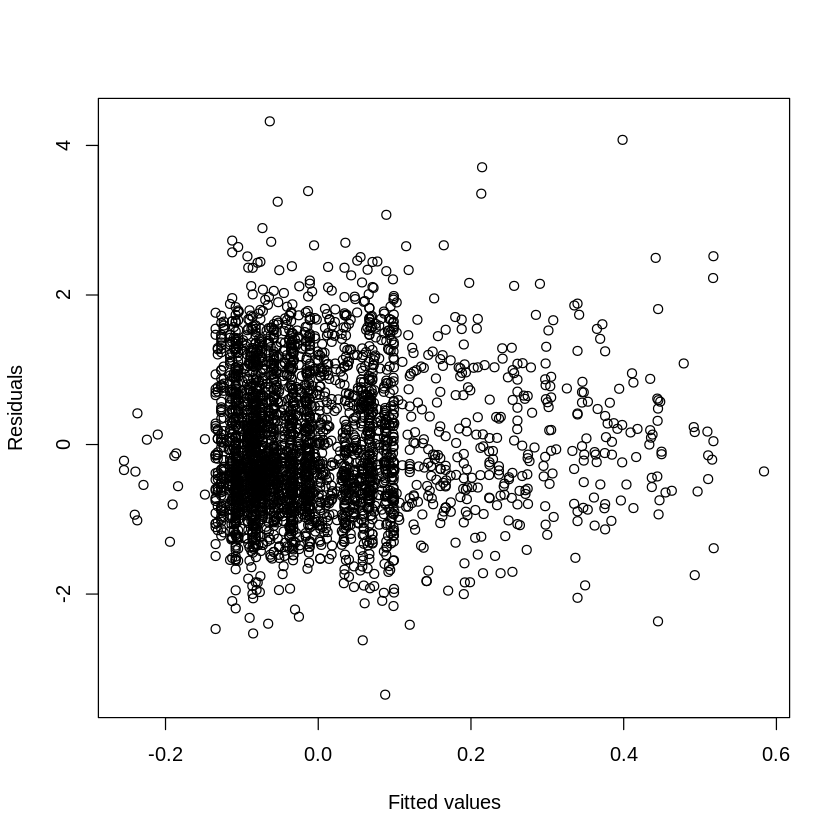

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 6 iterations.
Gradient range [-6.705455e-05,7.366871e-07]
(score 4199.813 & scale 0.8599095).
Hessian positive definite, eigenvalue range [0.990578,1555.003].
Model rank =  59 / 59 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 0.824    0.99    0.21
s(TIME):WHOSTATN1 9.000 0.843    0.99    0.14
s(TIME):WHOSTATN2 9.000 0.610    0.99    0.25
s(TIME):EGFRMUTN0 9.000 0.889    0.99    0.21
s(TIME):EGFRMUTN1 9.000 0.640    0.99    0.20
s(TIME):EGFRMUTN2 9.000 0.657    0.99    0.20


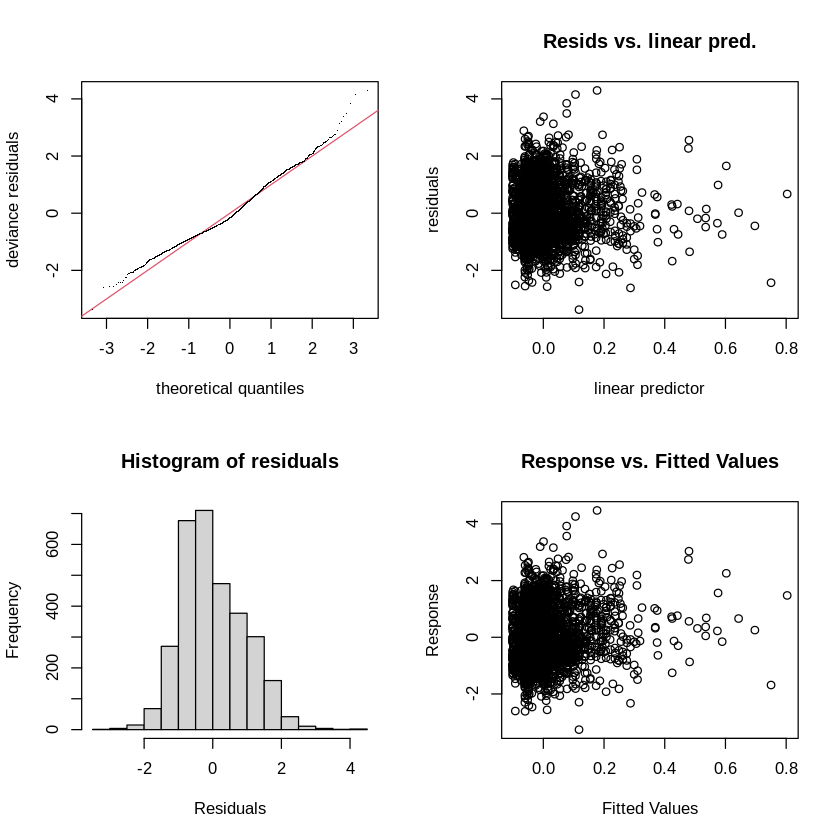

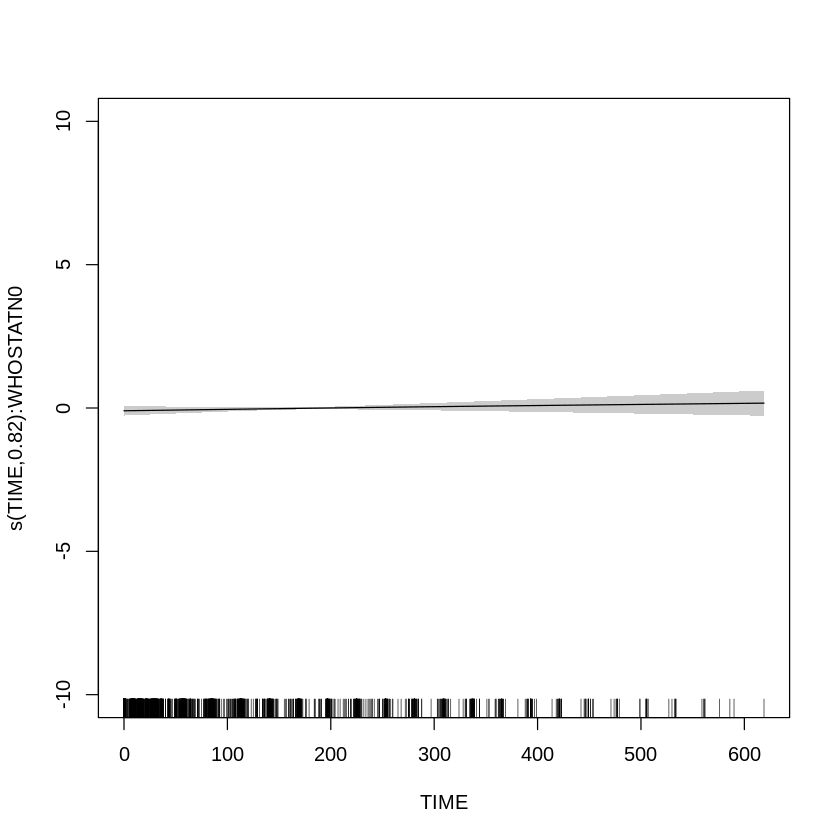

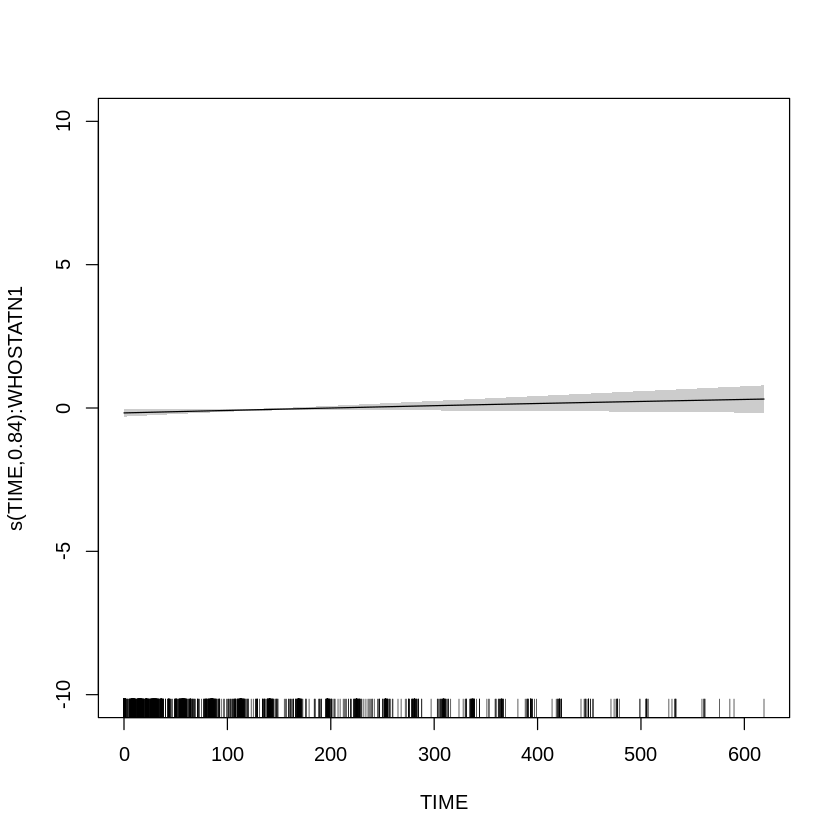

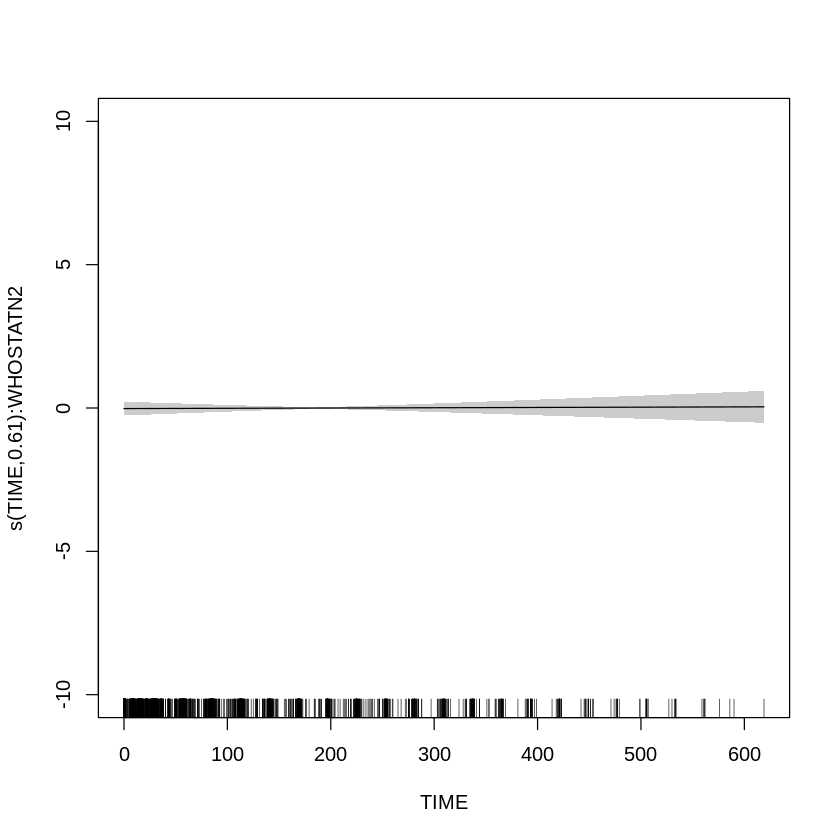

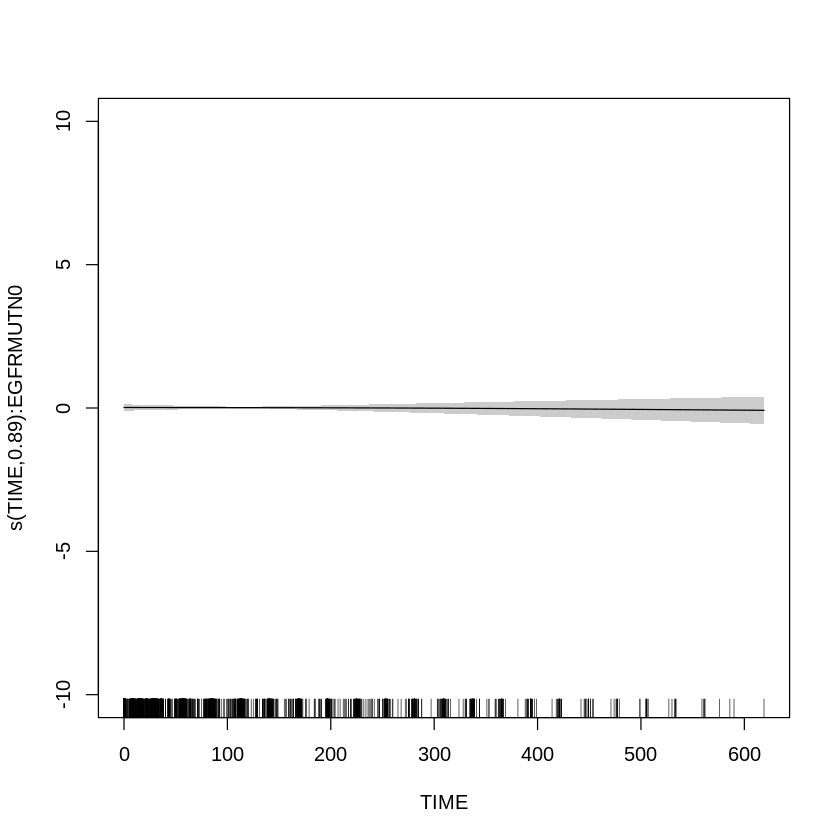

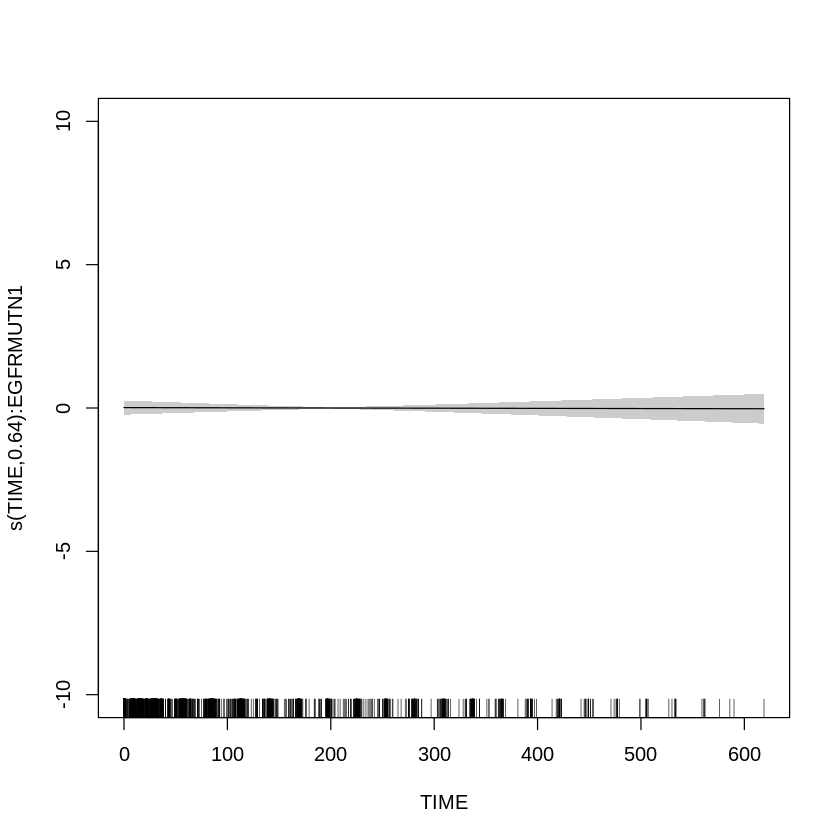

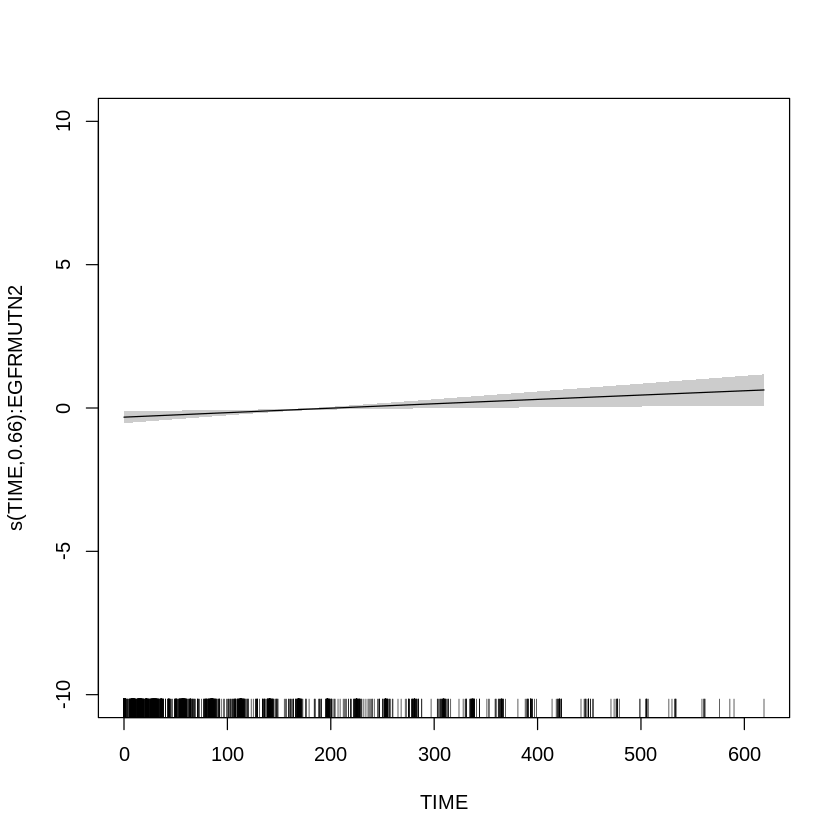

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ts', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ts', k = 10, id = 1) +  
           EGFRMUTN + WHOSTATN, data = dfALP, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ts", k = 10, id = 1) + EGFRMUTN + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)   
(Intercept)  0.02797    0.04364   0.641  0.52165   
EGFRMUTN1   -0.00954    0.08633  -0.111  0.91202   
EGFRMUTN2    0.29579    0.09526   3.105  0.00192 **
WHOSTATN1    0.06558    0.05366   1.222  0.22175   
WHOSTATN2   -0.02414    0.11369  -0.212  0.83188   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 0.8237      9 0.126 0.028662 *  
s(TIME):WHOSTATN1 0.8426      9 0.365 0.000158 ***
s(TIME):WHOSTATN2 0.6097      9 0.003 0.837265    
s(TIME):EGFRMUTN0 0.8888      9 0.089 0.056064 .  
s(TIME):EGFRMUTN1 0.6402      9 0.002 0.871774    
s(TIME):EGFRMUTN2 0.6570      9 0.748 4.37e-05 ***
---
S


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ts", k = 10, id = 1) + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
EGFRMUTN  2 4.961 0.00706
WHOSTATN  2 0.893 0.40973

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 0.8237 9.0000 0.126 0.028662
s(TIME):WHOSTATN1 0.8426 9.0000 0.365 0.000158
s(TIME):WHOSTATN2 0.6097 9.0000 0.003 0.837265
s(TIME):EGFRMUTN0 0.8888 9.0000 0.089 0.056064
s(TIME):EGFRMUTN1 0.6402 9.0000 0.002 0.871774
s(TIME):EGFRMUTN2 0.6570 9.0000 0.748 4.37e-05

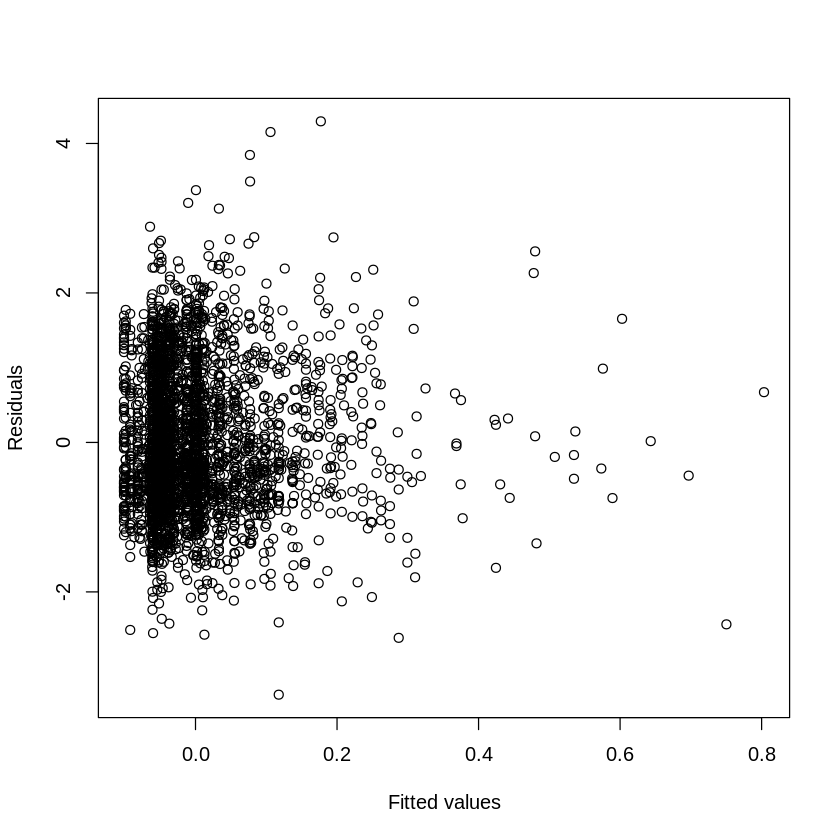

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 8 iterations.
Gradient range [-0.0003224836,6.029666e-05]
(score 4196.749 & scale 0.863222).
Hessian positive definite, eigenvalue range [1.211865,1557.002].
Model rank =  55 / 55 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 0.633    0.98    0.21
s(TIME):WHOSTATN1 9.000 0.680    0.98    0.20
s(TIME):WHOSTATN2 9.000 0.487    0.98    0.18
s(TIME):EGFRMUTN0 9.000 0.706    0.98    0.17
s(TIME):EGFRMUTN1 9.000 0.280    0.98    0.12
s(TIME):EGFRMUTN2 9.000 0.571    0.98    0.20


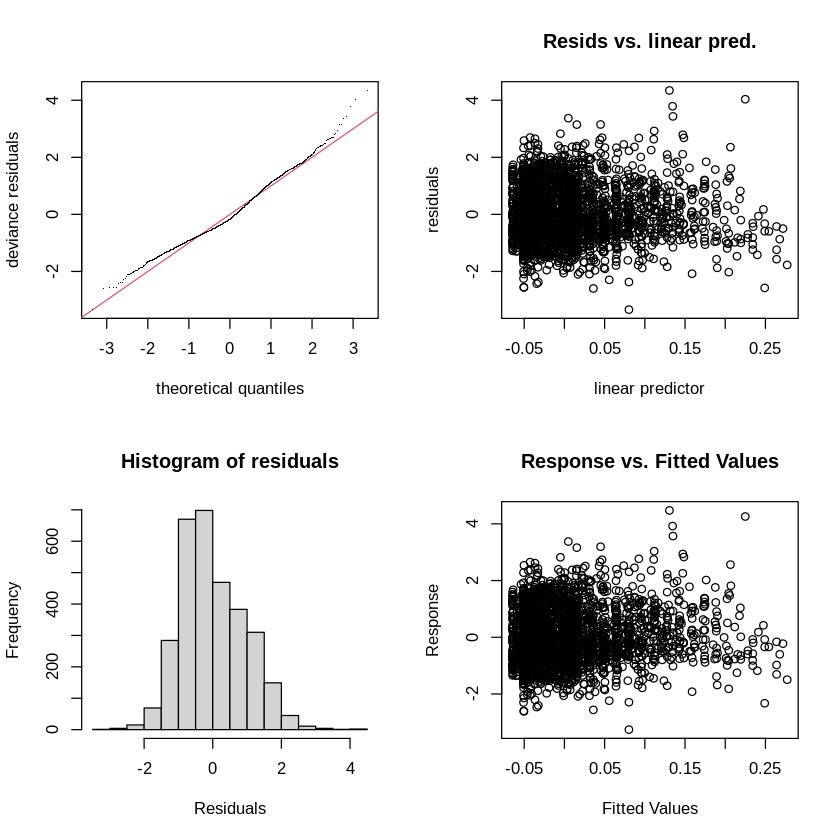

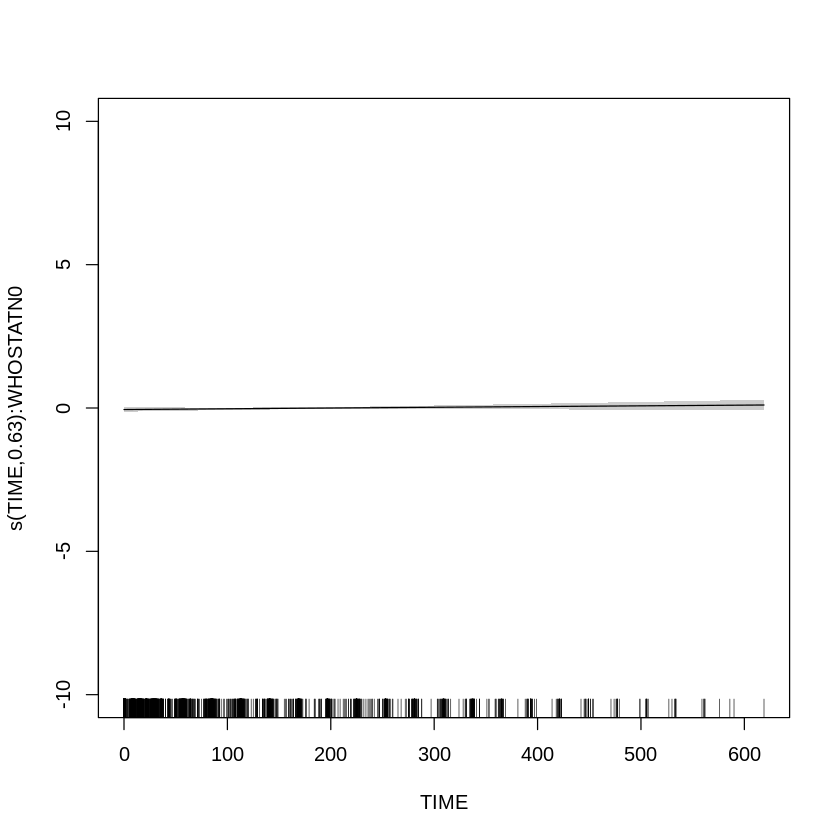

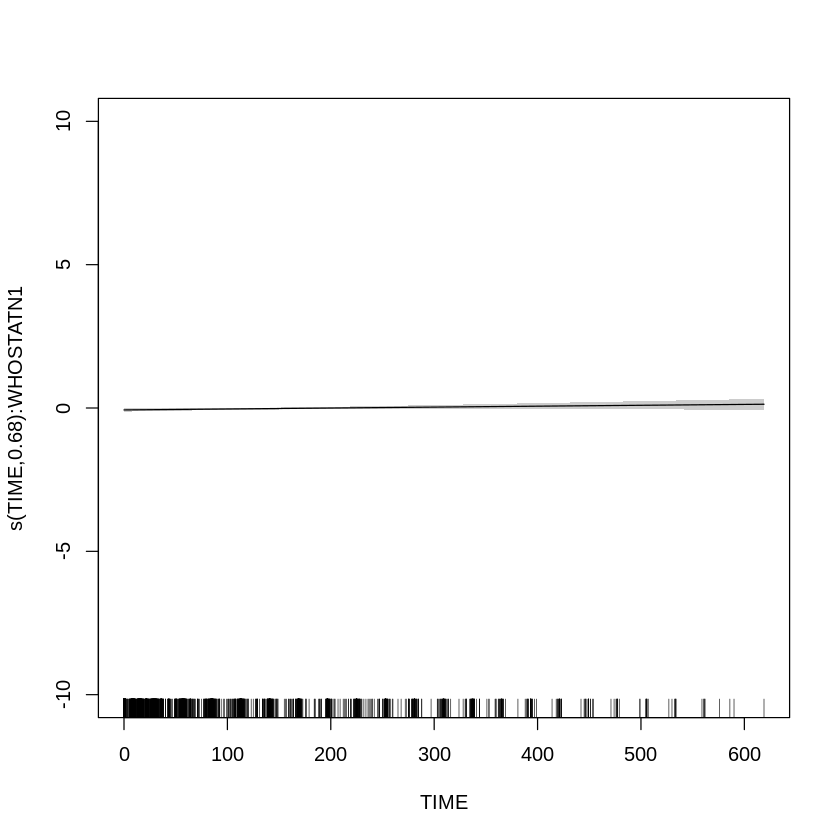

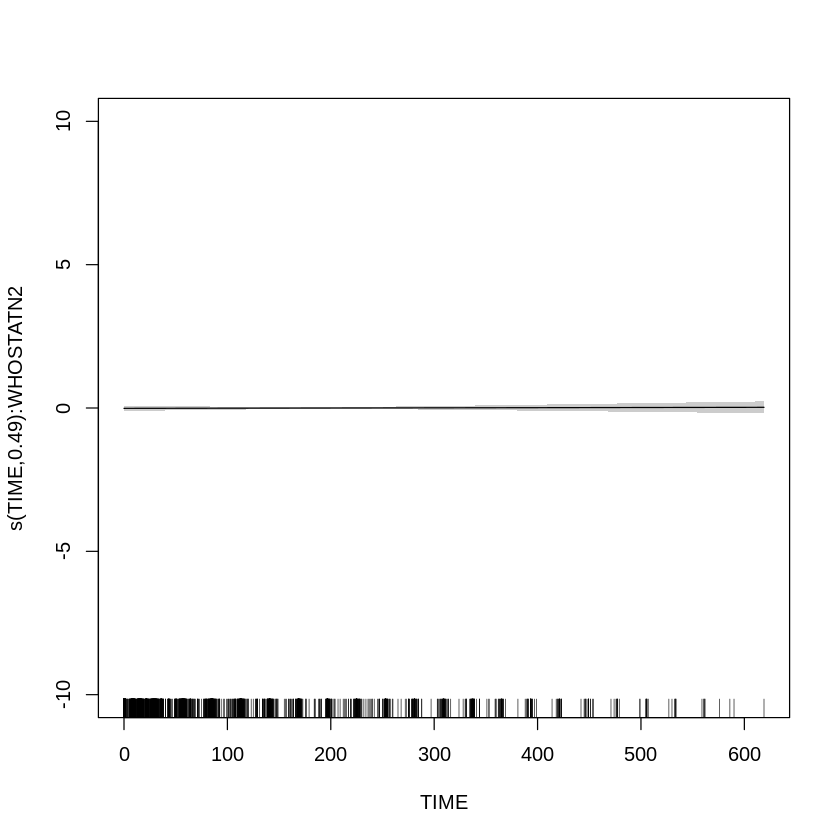

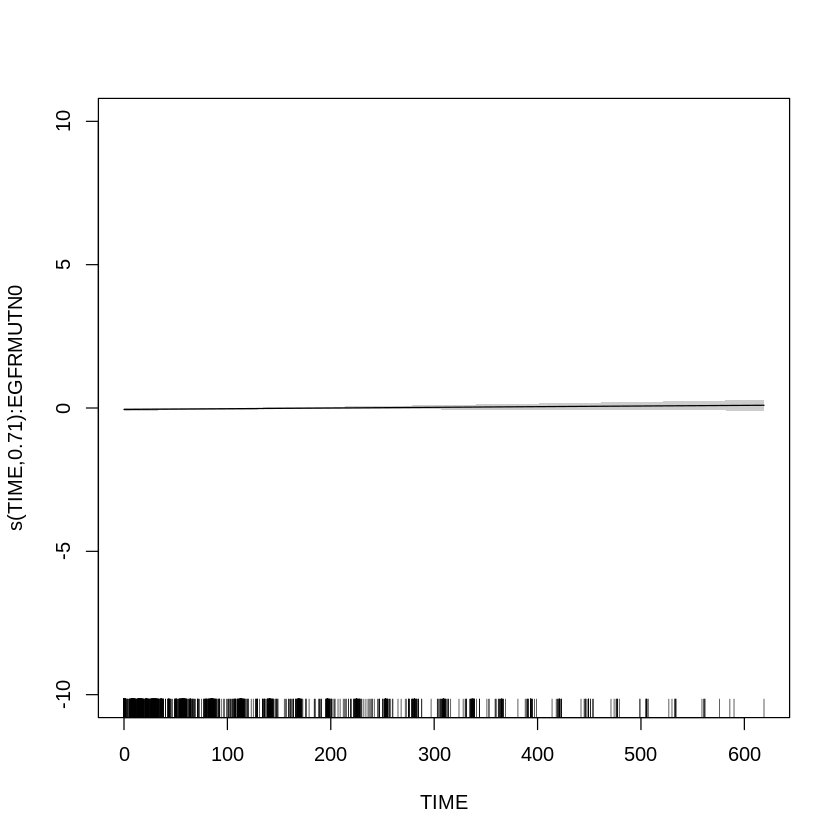

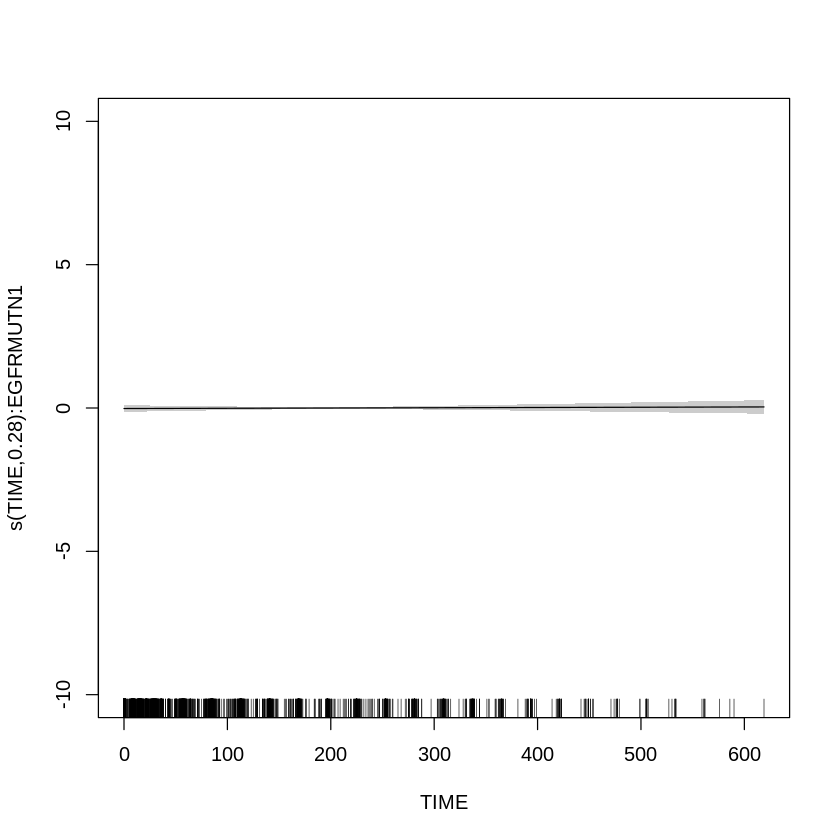

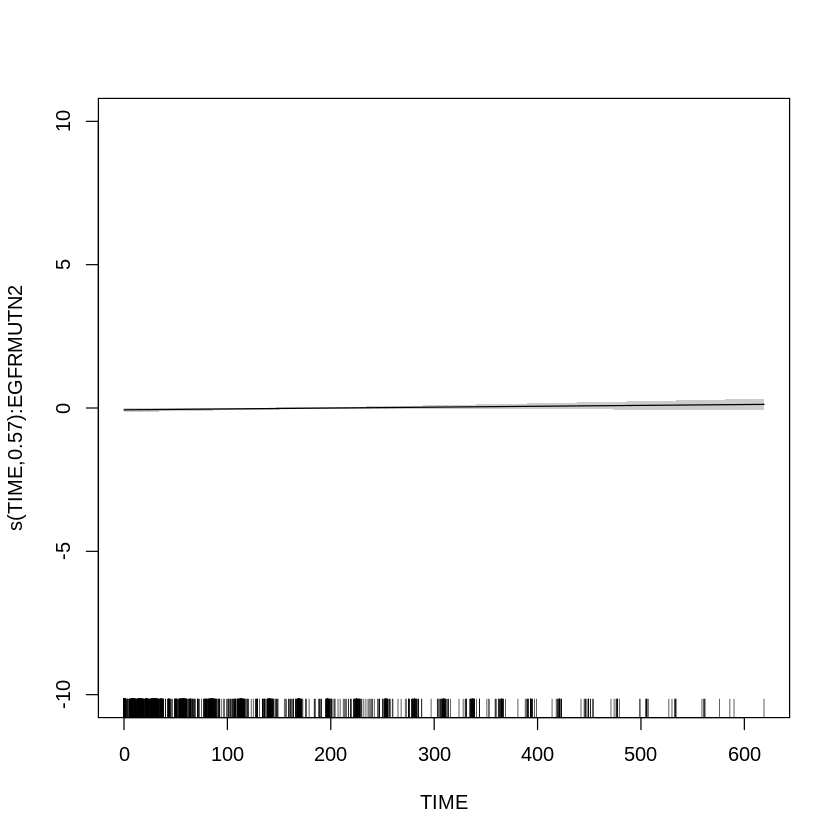

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ts', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ts', k = 10, id = 1), data = dfALP, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ts", k = 10, id = 1)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)   
(Intercept)  0.06754    0.02406   2.808  0.00502 **
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F p-value   
s(TIME):WHOSTATN0 0.6329      9 0.191 0.03833 * 
s(TIME):WHOSTATN1 0.6802      9 0.342 0.00394 **
s(TIME):WHOSTATN2 0.4874      9 0.007 0.69191   
s(TIME):EGFRMUTN0 0.7063      9 0.212 0.02021 * 
s(TIME):EGFRMUTN1 0.2805      9 0.012 0.52354   
s(TIME):EGFRMUTN2 0.5710      9 0.233 0.02229 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.00515   Deviance explained = 0.623%
-REML = 4196.7  Scale est. = 0.86322   n = 3115


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ts", k = 10, id = 1)

Approximate significance of smooth terms:
                     edf Ref.df     F p-value
s(TIME):WHOSTATN0 0.6329 9.0000 0.191 0.03833
s(TIME):WHOSTATN1 0.6802 9.0000 0.342 0.00394
s(TIME):WHOSTATN2 0.4874 9.0000 0.007 0.69191
s(TIME):EGFRMUTN0 0.7063 9.0000 0.212 0.02021
s(TIME):EGFRMUTN1 0.2805 9.0000 0.012 0.52354
s(TIME):EGFRMUTN2 0.5710 9.0000 0.233 0.02229

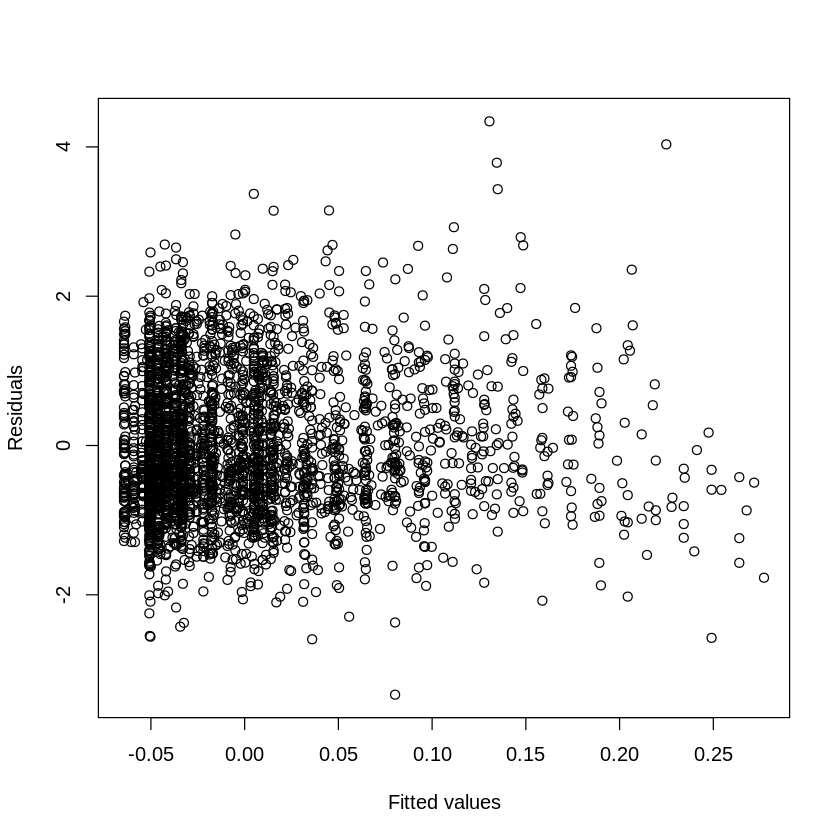

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 8 iterations.
Gradient range [-7.668314e-08,1.993404e-09]
(score 4198.182 & scale 0.8602906).
Hessian positive definite, eigenvalue range [0.8212754,1556.004].
Model rank =  75 / 75 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 0.730    0.99    0.26
s(TIME):WHOSTATN1 9.000 0.751    0.99    0.20
s(TIME):WHOSTATN2 9.000 0.665    0.99    0.27
s(TIME):EGFRMUTN0 9.000 0.721    0.99    0.23
s(TIME):EGFRMUTN1 9.000 0.467    0.99    0.20
s(TIME):EGFRMUTN2 9.000 0.493    0.99    0.17
s(TIME):SMKSTAT0  9.000 0.670    0.99    0.19
s(TIME):SMKSTAT2  9.000 0.704    0.99    0.20


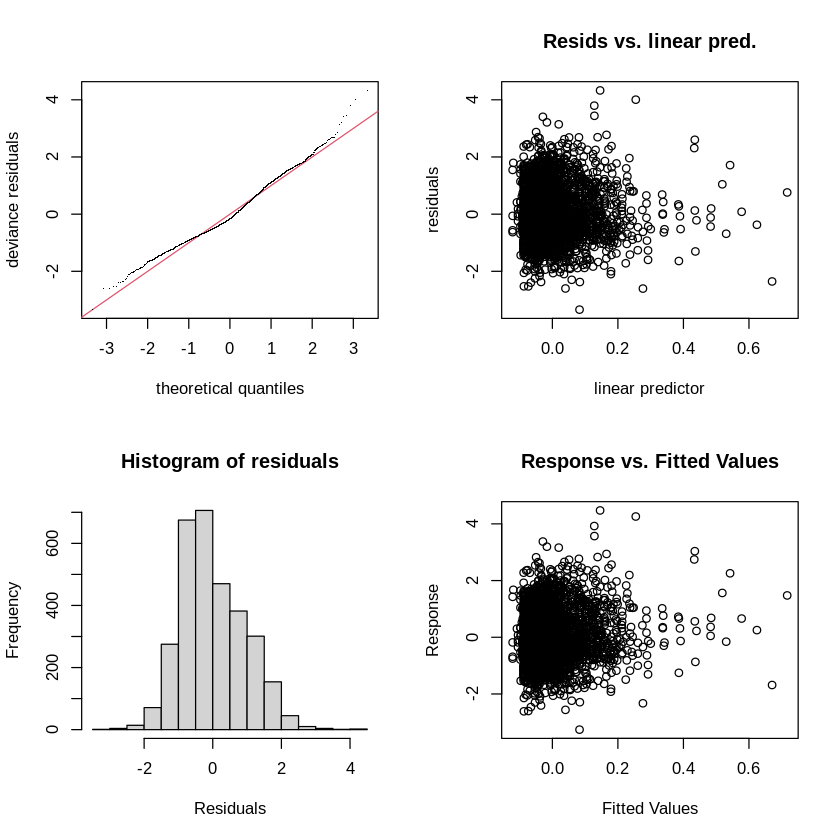

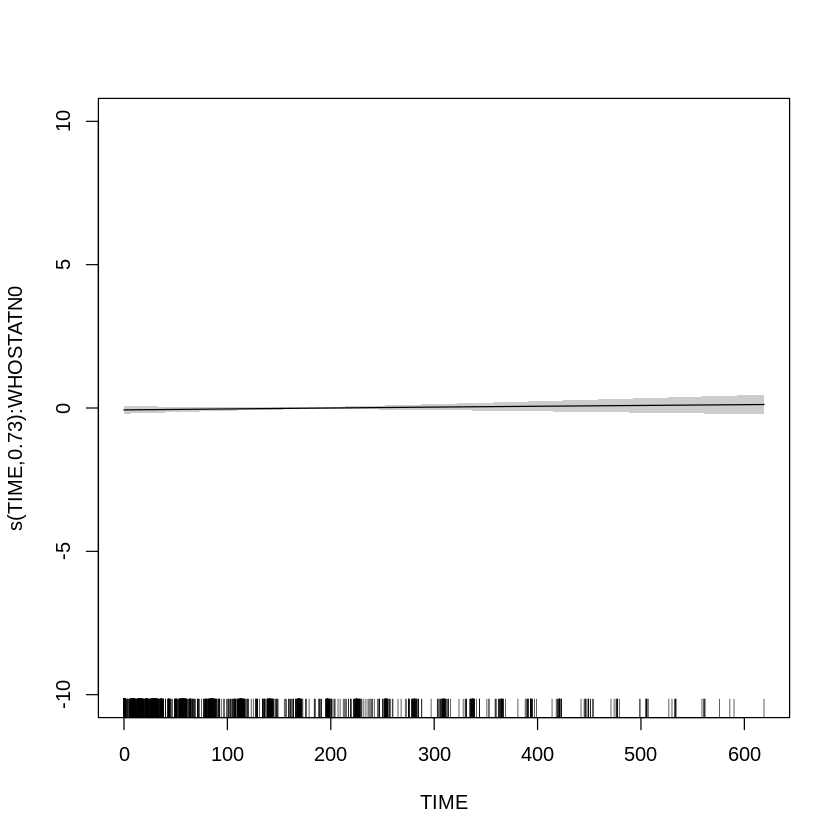

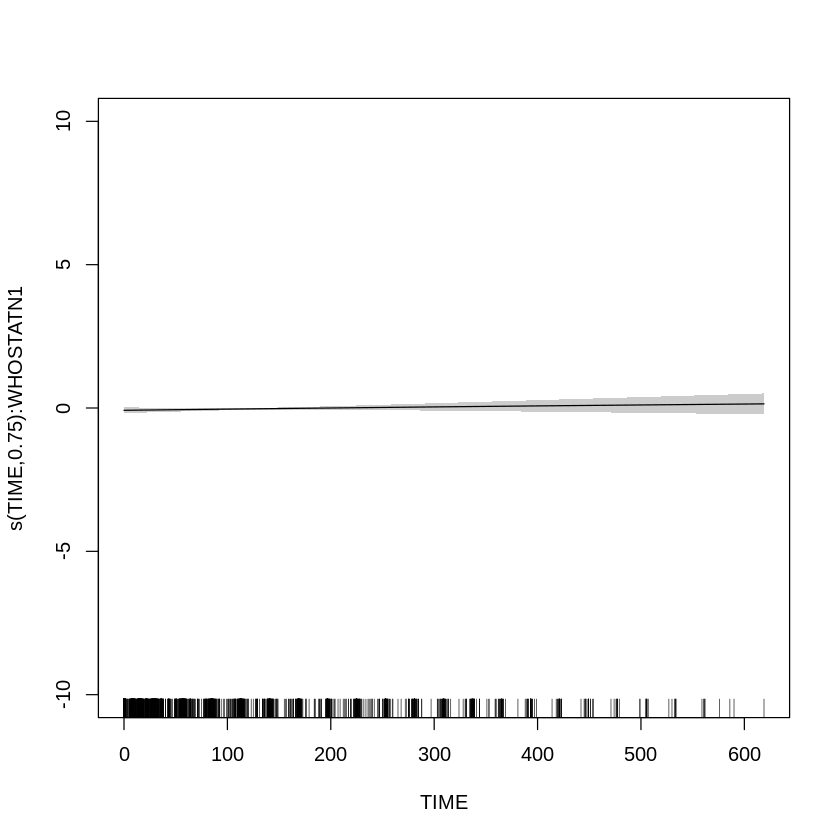

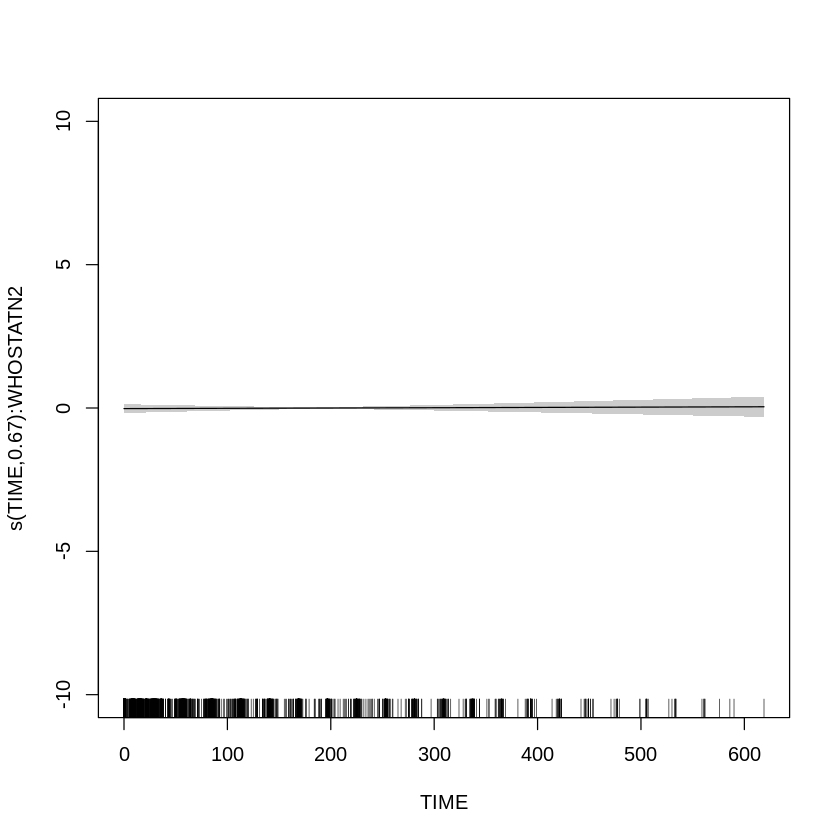

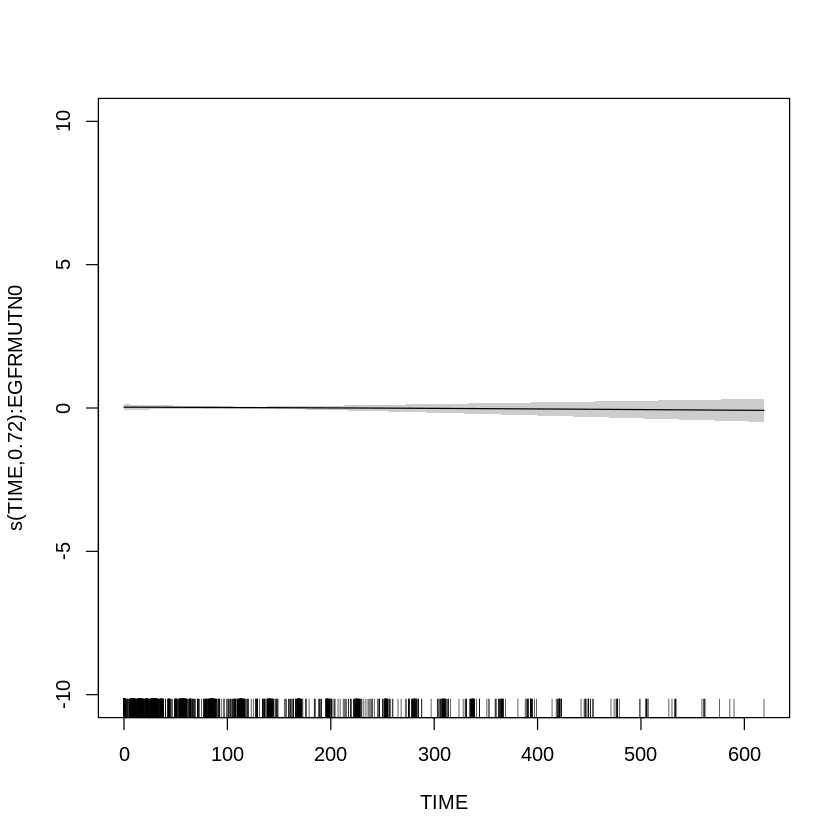

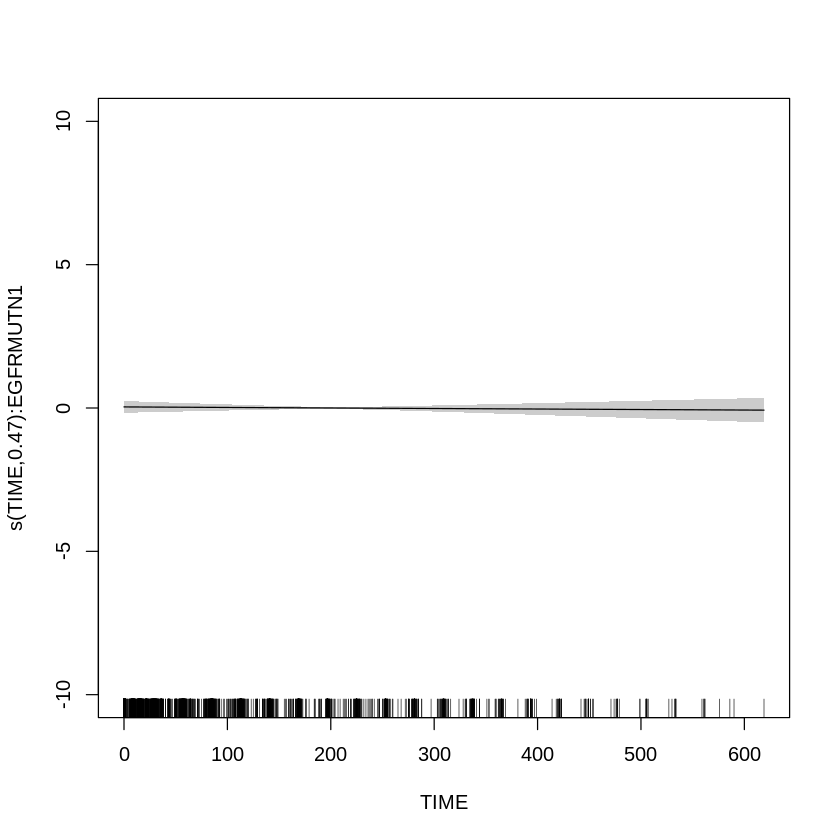

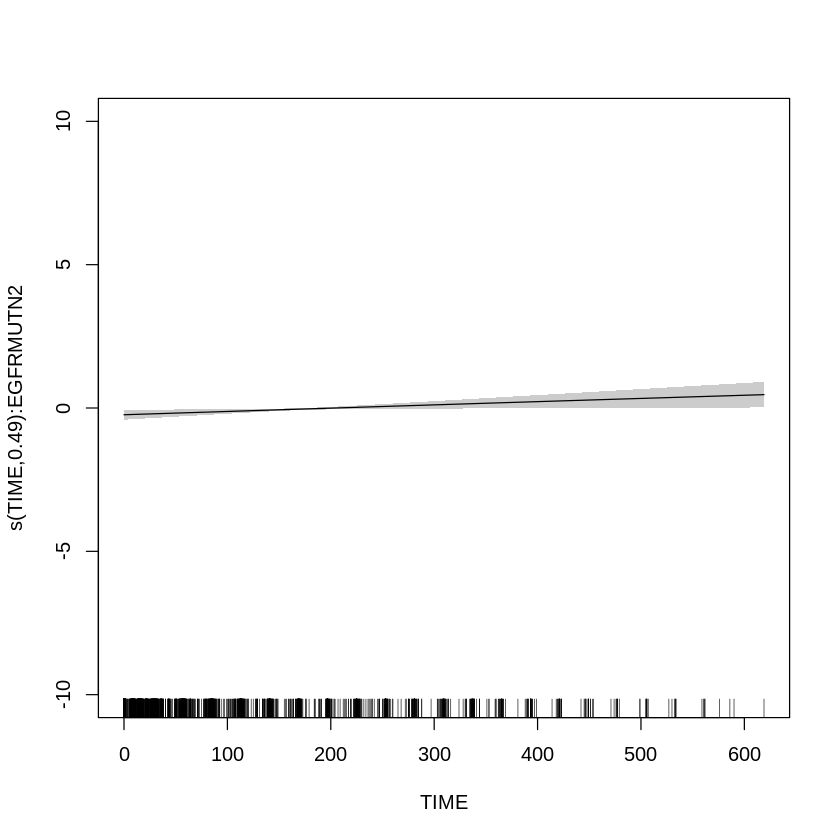

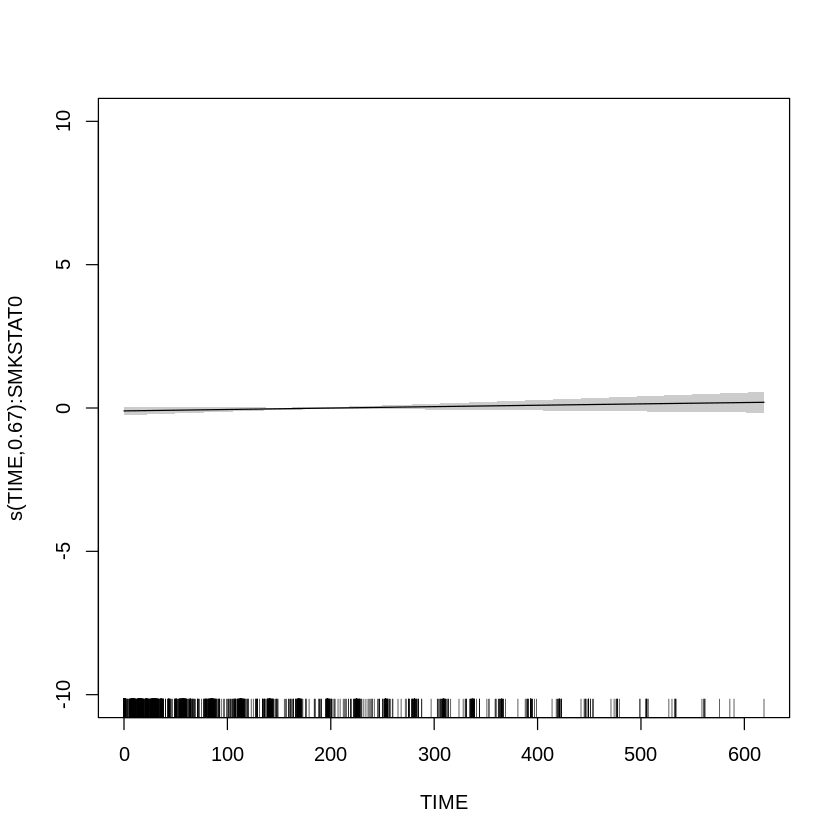

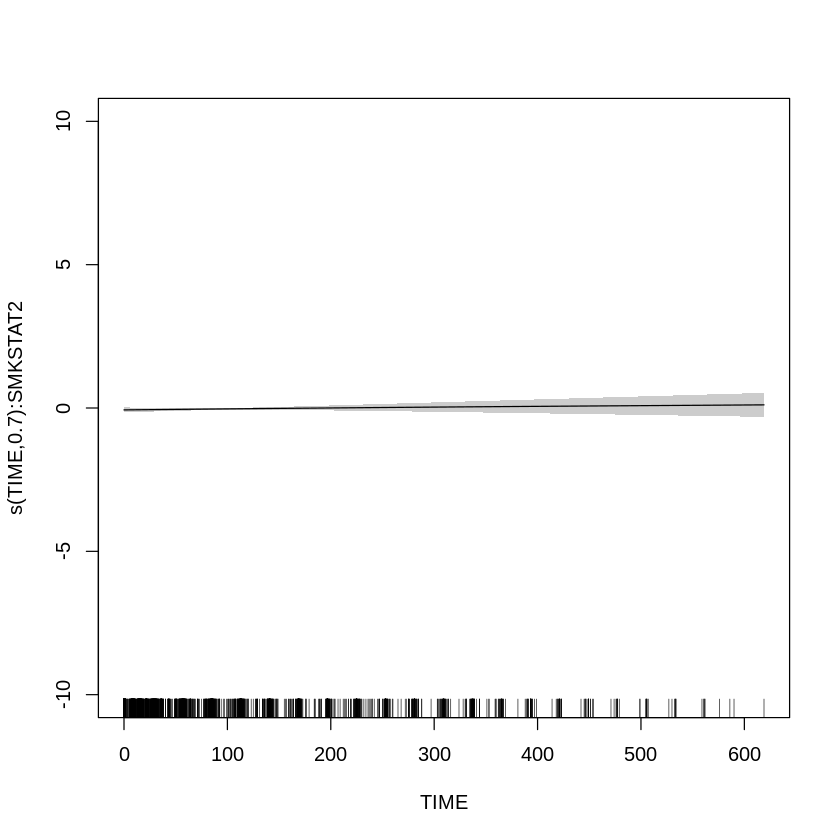

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ts', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ts', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ts', k = 10, id = 1) + 
           EGFRMUTN, data = dfALP, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ts", k = 10, id = 1) + EGFRMUTN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)   
(Intercept)  0.06785    0.02629   2.580  0.00991 **
EGFRMUTN1   -0.02051    0.07222  -0.284  0.77638   
EGFRMUTN2    0.02371    0.04286   0.553  0.58019   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F p-value   
s(TIME):WHOSTATN0 0.6402      9 0.165 0.04134 * 
s(TIME):WHOSTATN1 0.6918      9 0.283 0.00438 **
s(TIME):WHOSTATN2 0.5157      9 0.004 0.74679   
s(TIME):SMKSTAT0  0.6066      9 0.259 0.01206 * 
s(TIME):SMKSTAT2  0.6858      9 0.232 0.01082 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.00493   Deviance explained = 0.657%
-REML = 4200.1  Scale est. = 0.86342   n = 3115


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ts", k = 10, id = 1) + EGFRMUTN

Parametric Terms:
         df    F p-value
EGFRMUTN  2 0.21   0.811

Approximate significance of smooth terms:
                     edf Ref.df     F p-value
s(TIME):WHOSTATN0 0.6402 9.0000 0.165 0.04134
s(TIME):WHOSTATN1 0.6918 9.0000 0.283 0.00438
s(TIME):WHOSTATN2 0.5157 9.0000 0.004 0.74679
s(TIME):SMKSTAT0  0.6066 9.0000 0.259 0.01206
s(TIME):SMKSTAT2  0.6858 9.0000 0.232 0.01082

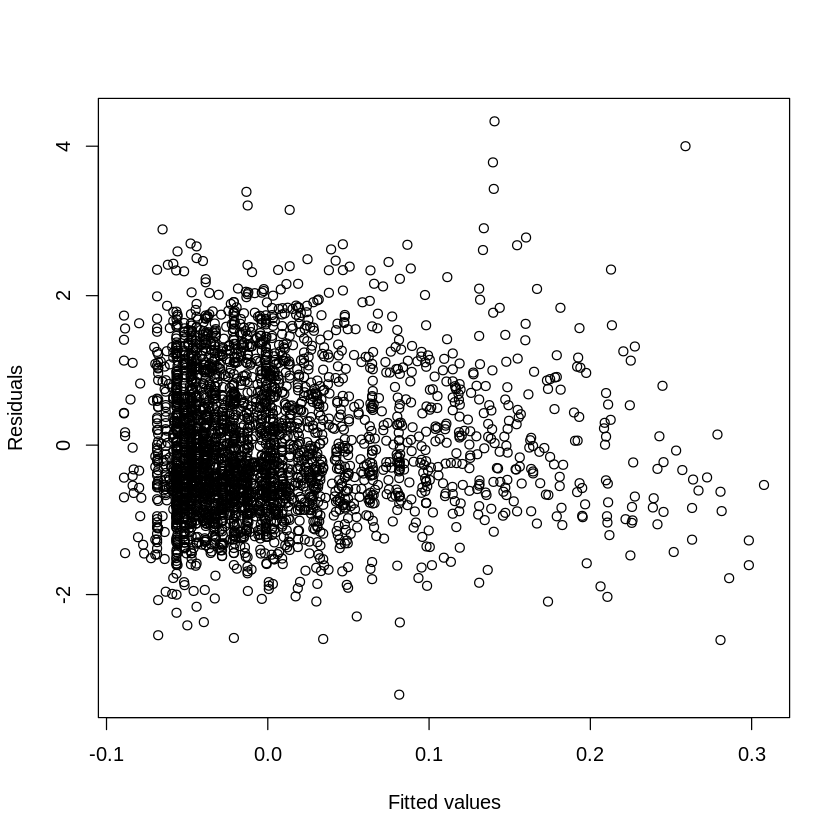

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 8 iterations.
Gradient range [-7.668314e-08,1.993404e-09]
(score 4198.182 & scale 0.8602906).
Hessian positive definite, eigenvalue range [0.8212754,1556.004].
Model rank =  75 / 75 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 0.730    0.99    0.28
s(TIME):WHOSTATN1 9.000 0.751    0.99    0.27
s(TIME):WHOSTATN2 9.000 0.665    0.99    0.23
s(TIME):EGFRMUTN0 9.000 0.721    0.99    0.24
s(TIME):EGFRMUTN1 9.000 0.467    0.99    0.26
s(TIME):EGFRMUTN2 9.000 0.493    0.99    0.22
s(TIME):SMKSTAT0  9.000 0.670    0.99    0.21
s(TIME):SMKSTAT2  9.000 0.704    0.99    0.23


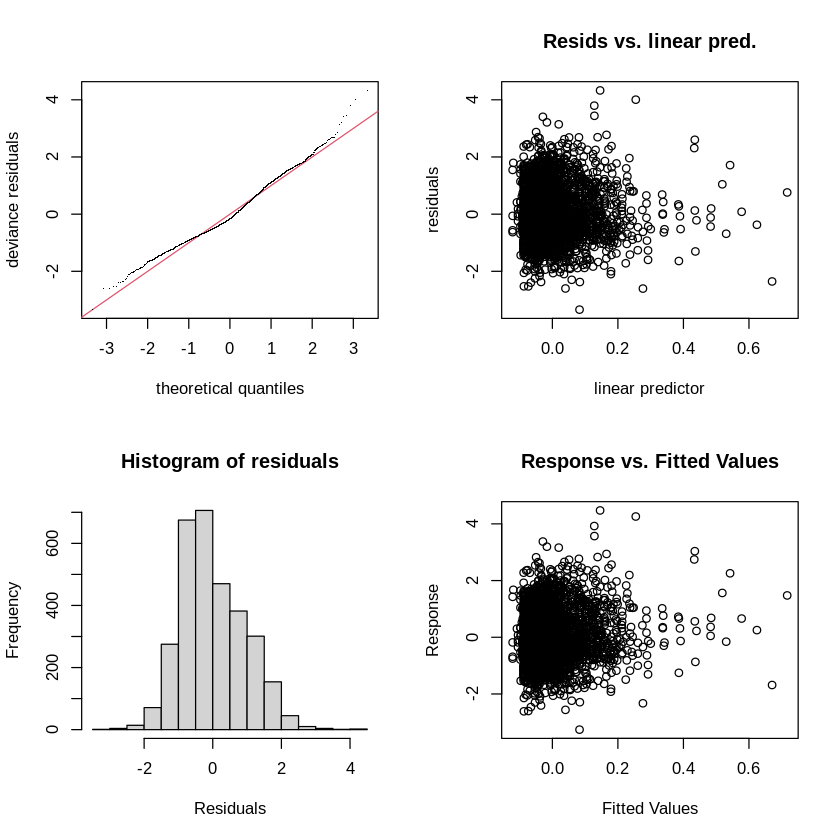

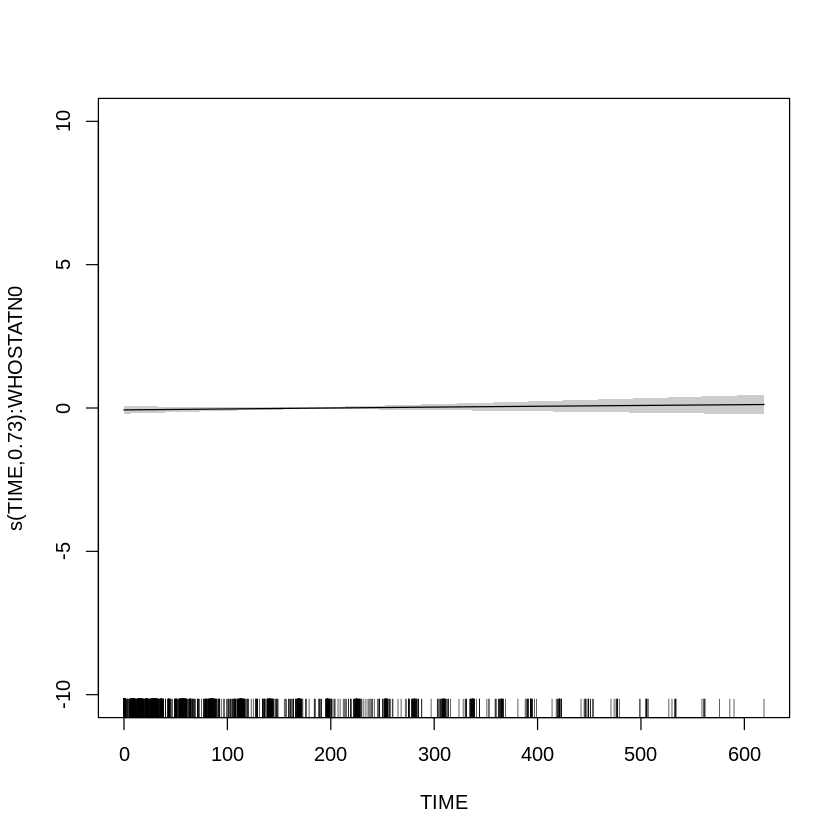

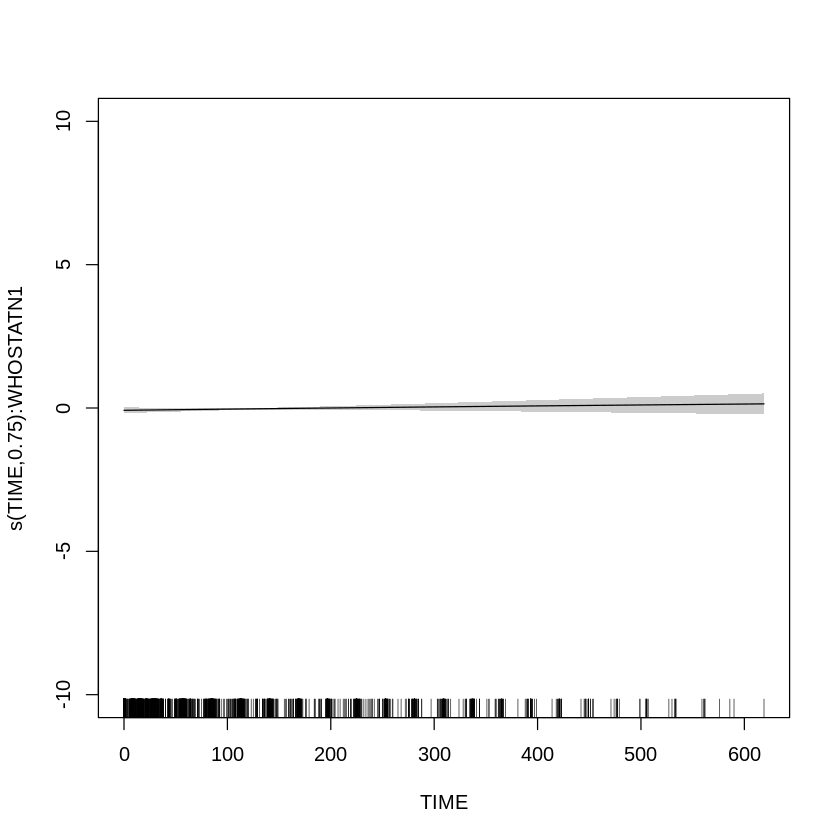

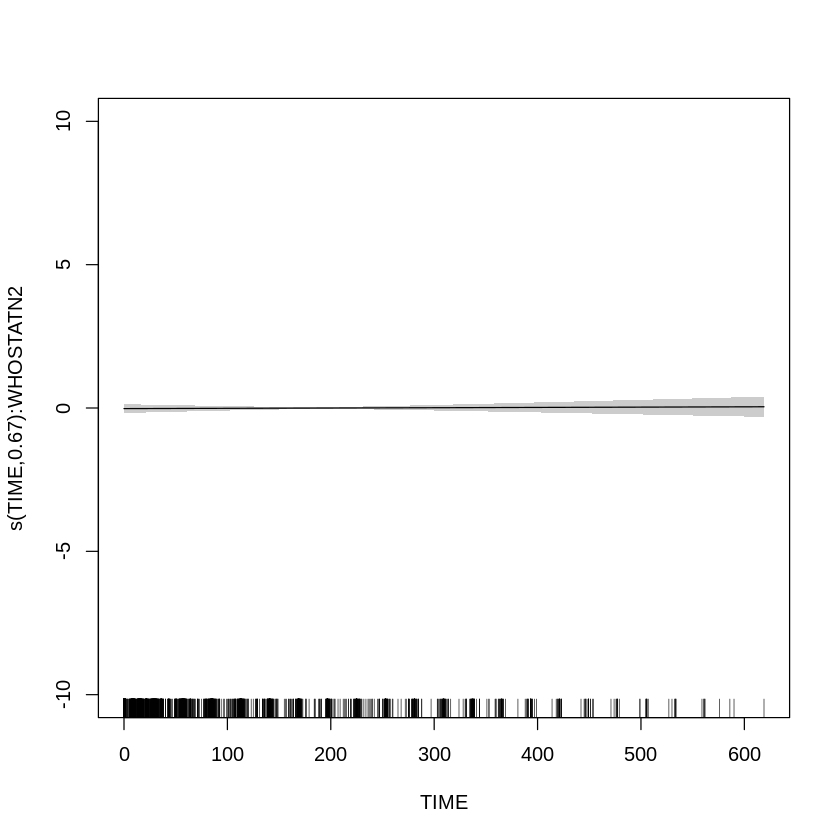

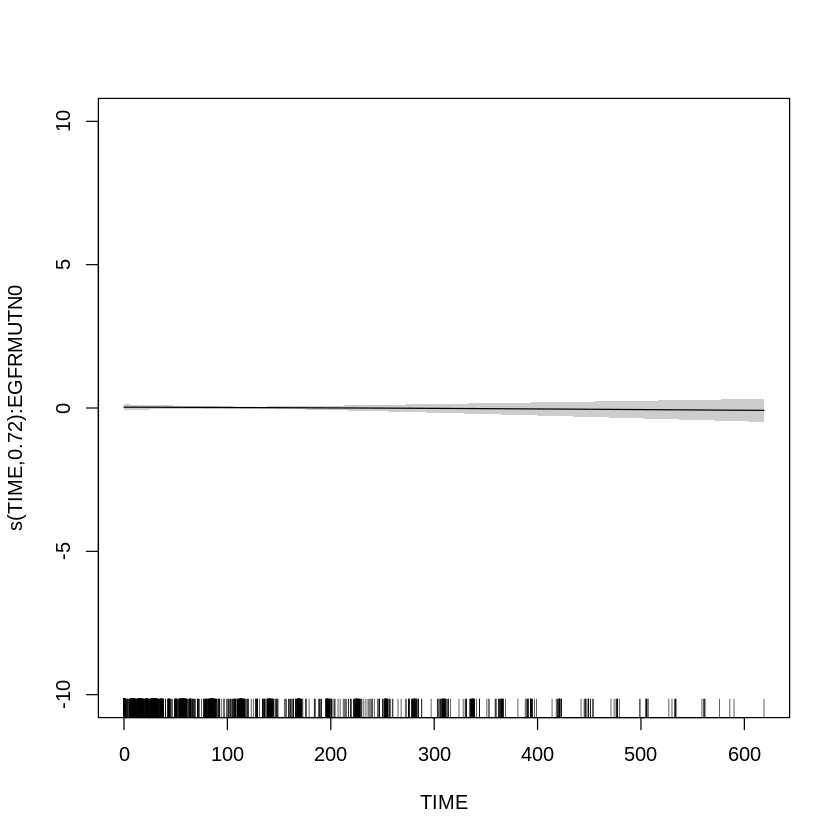

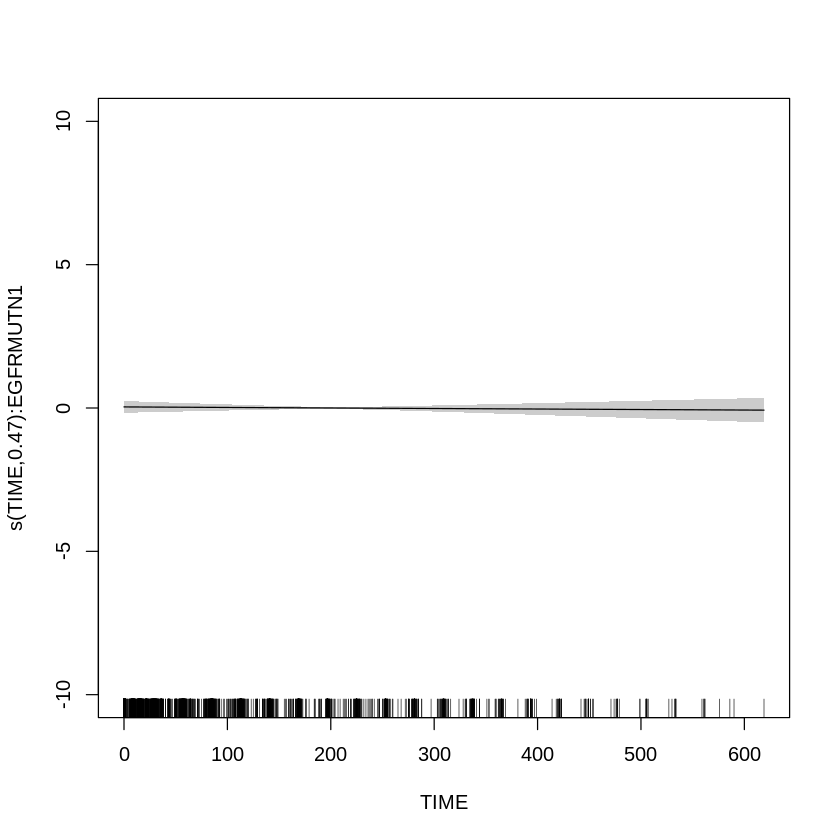

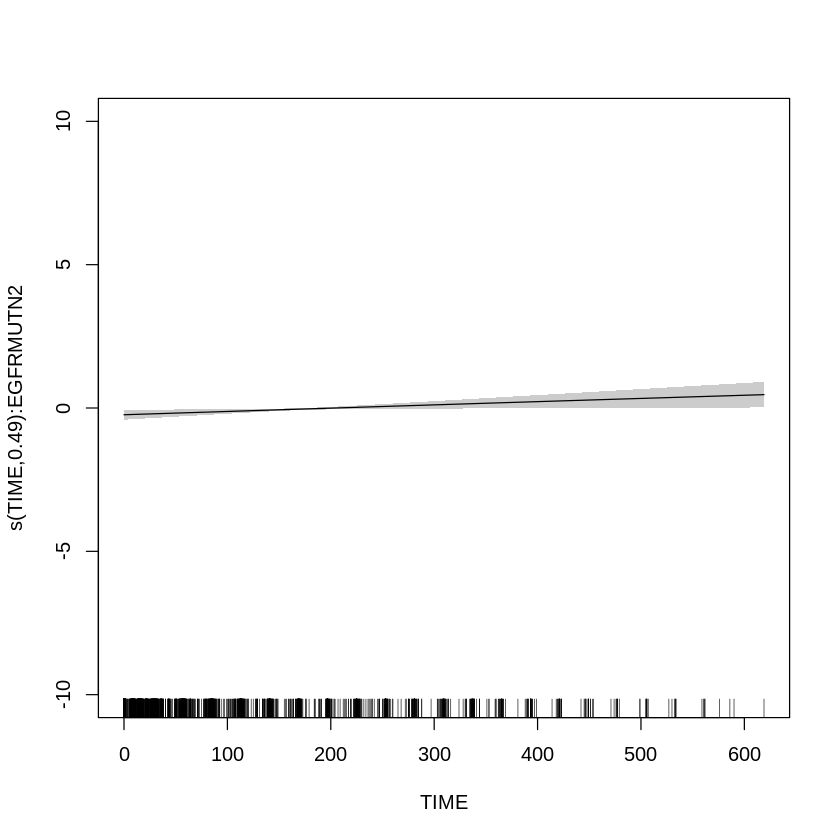

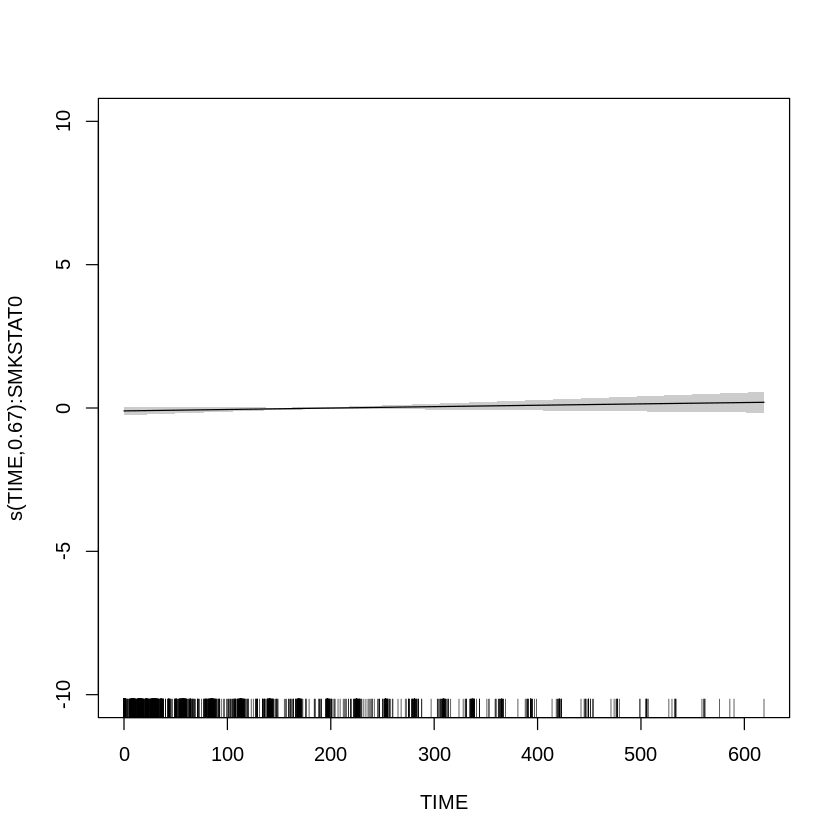

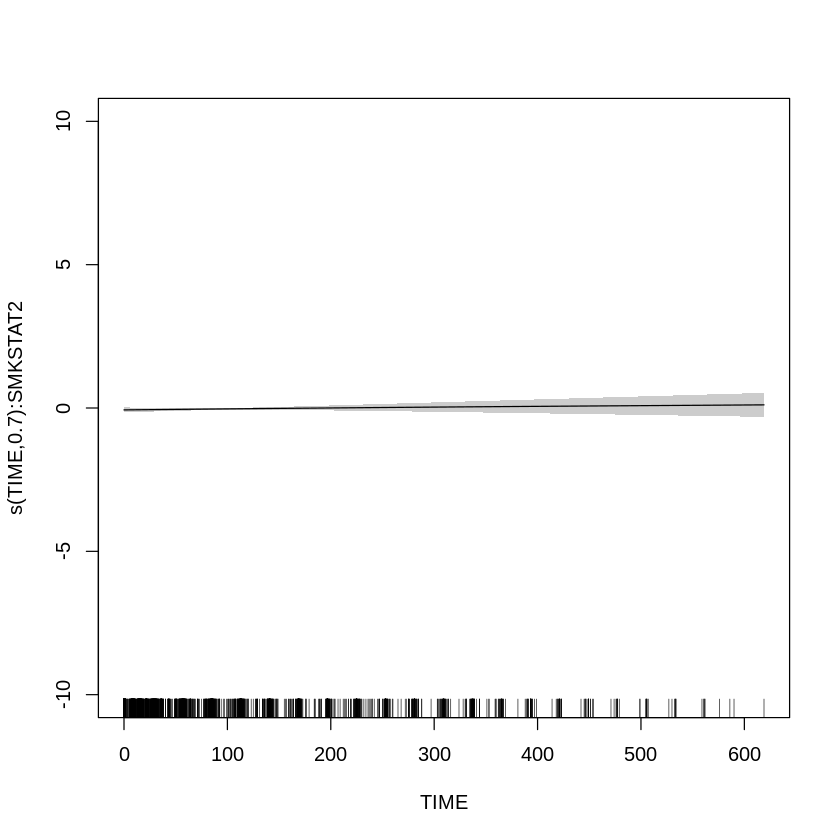

In [ ]:
ct1 <- gam(norm~s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + 
                s(TIME, by = EGFRMUTN, bs = "ts", k = 10, id = 1) + 
                s(TIME, by = SMKSTAT, bs = "ts", k = 10, id = 1) + 
                EGFRMUTN, data = dfALP, select=TRUE, method="REML", 
                family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ts", k = 10, id = 1) + EGFRMUTN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)   
(Intercept)  0.06785    0.02629   2.580  0.00991 **
EGFRMUTN1   -0.02051    0.07222  -0.284  0.77638   
EGFRMUTN2    0.02371    0.04286   0.553  0.58019   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F p-value   
s(TIME):WHOSTATN0 0.6402      9 0.165 0.04134 * 
s(TIME):WHOSTATN1 0.6918      9 0.283 0.00438 **
s(TIME):WHOSTATN2 0.5157      9 0.004 0.74679   
s(TIME):SMKSTAT0  0.6066      9 0.259 0.01206 * 
s(TIME):SMKSTAT2  0.6858      9 0.232 0.01082 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.00493   Deviance explained = 0.657%
-REML = 4200.1  Scale est. = 0.86342   n = 3115


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ts", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ts", k = 10, id = 1) + EGFRMUTN

Parametric Terms:
         df    F p-value
EGFRMUTN  2 0.21   0.811

Approximate significance of smooth terms:
                     edf Ref.df     F p-value
s(TIME):WHOSTATN0 0.6402 9.0000 0.165 0.04134
s(TIME):WHOSTATN1 0.6918 9.0000 0.283 0.00438
s(TIME):WHOSTATN2 0.5157 9.0000 0.004 0.74679
s(TIME):SMKSTAT0  0.6066 9.0000 0.259 0.01206
s(TIME):SMKSTAT2  0.6858 9.0000 0.232 0.01082

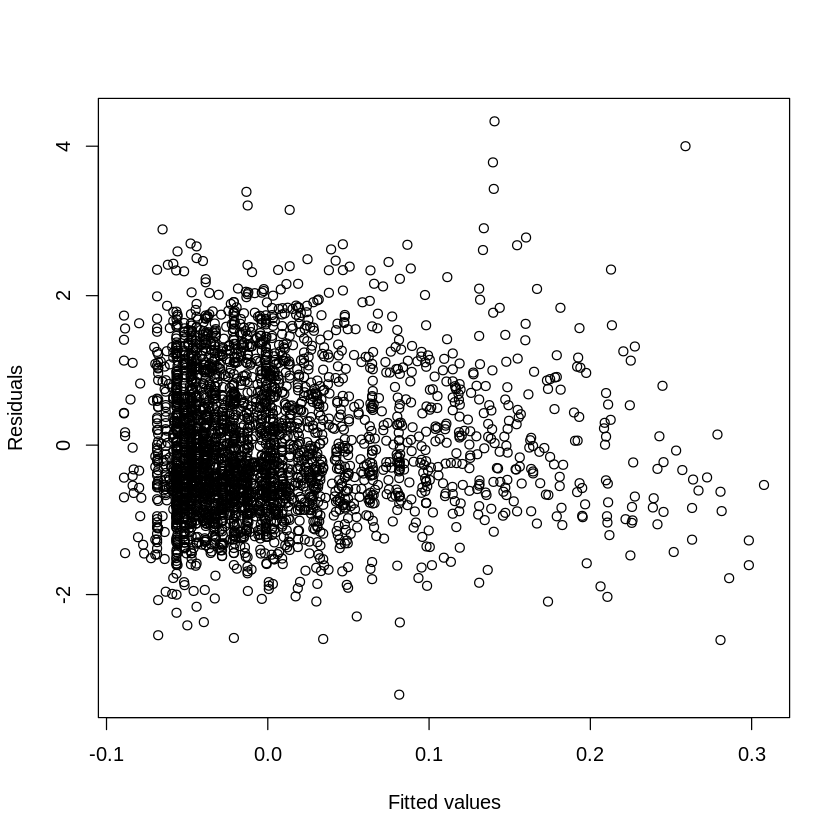

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# AST

In [ ]:
dfAST <- make_df(data, 'AST')


Method: REML   Optimizer: outer newton
full convergence after 11 iterations.
Gradient range [-0.018236,0.00848733]
(score 4076.645 & scale 0.7997586).
Hessian positive definite, eigenvalue range [6.471289e-06,1548.021].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.203    1.02    0.88
s(TIME):WHOSTATN1 9.000 1.241    1.02    0.90
s(TIME):WHOSTATN2 9.000 0.832    1.02    0.90
s(TIME):EGFRMUTN0 9.000 1.248    1.02    0.84
s(TIME):EGFRMUTN1 9.000 0.761    1.02    0.86
s(TIME):EGFRMUTN2 9.000 0.900    1.02    0.85
s(TIME):SMKSTAT0  9.000 1.131    1.02    0.84
s(TIME):SMKSTAT2  9.000 1.201    1.02    0.84


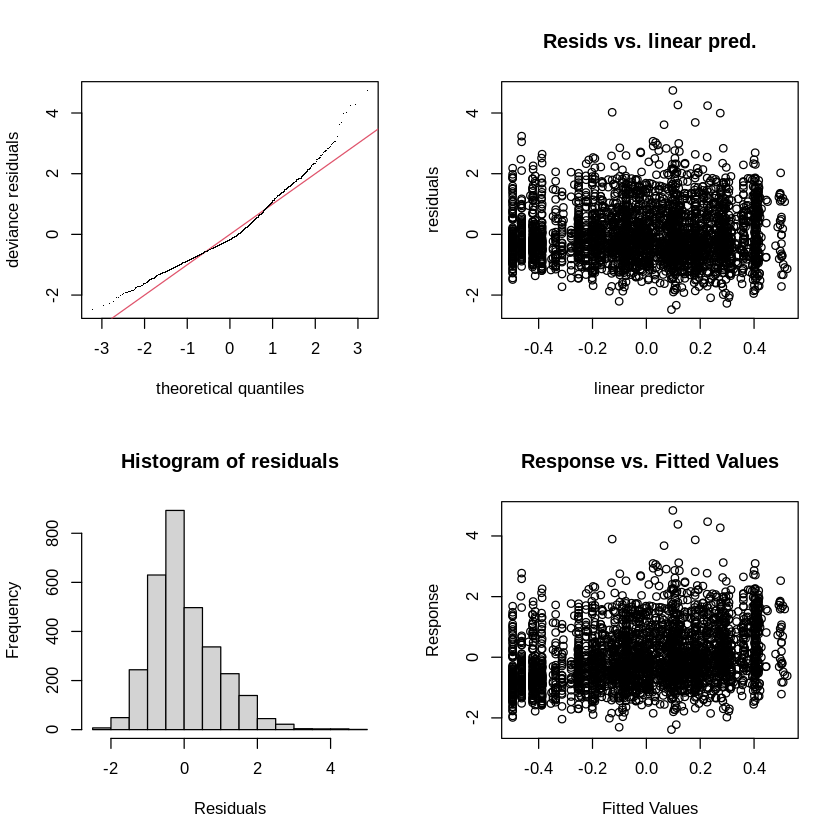

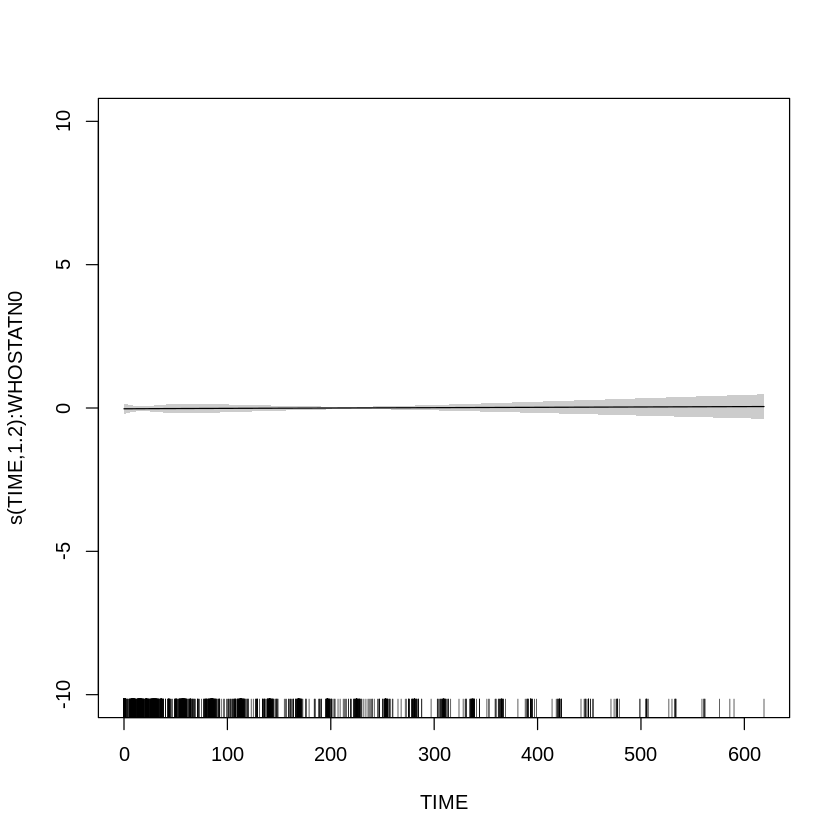

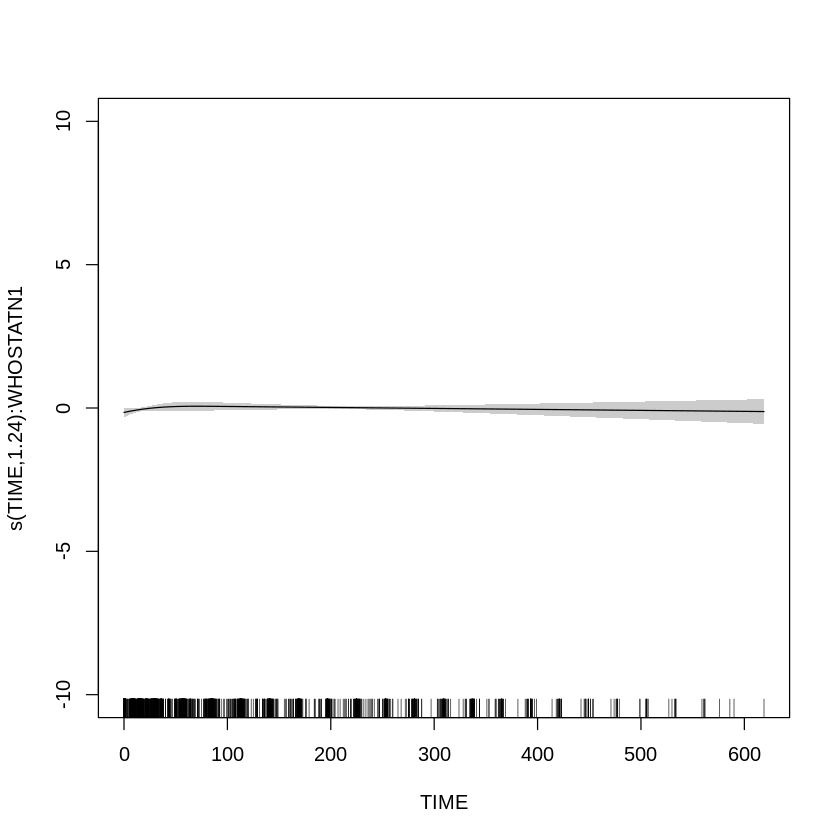

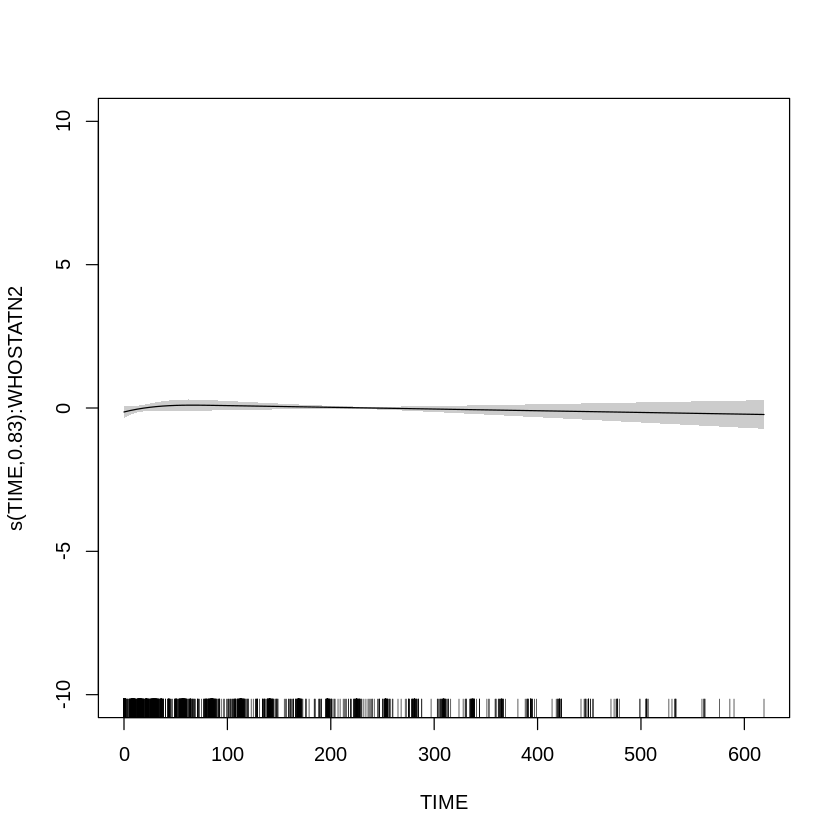

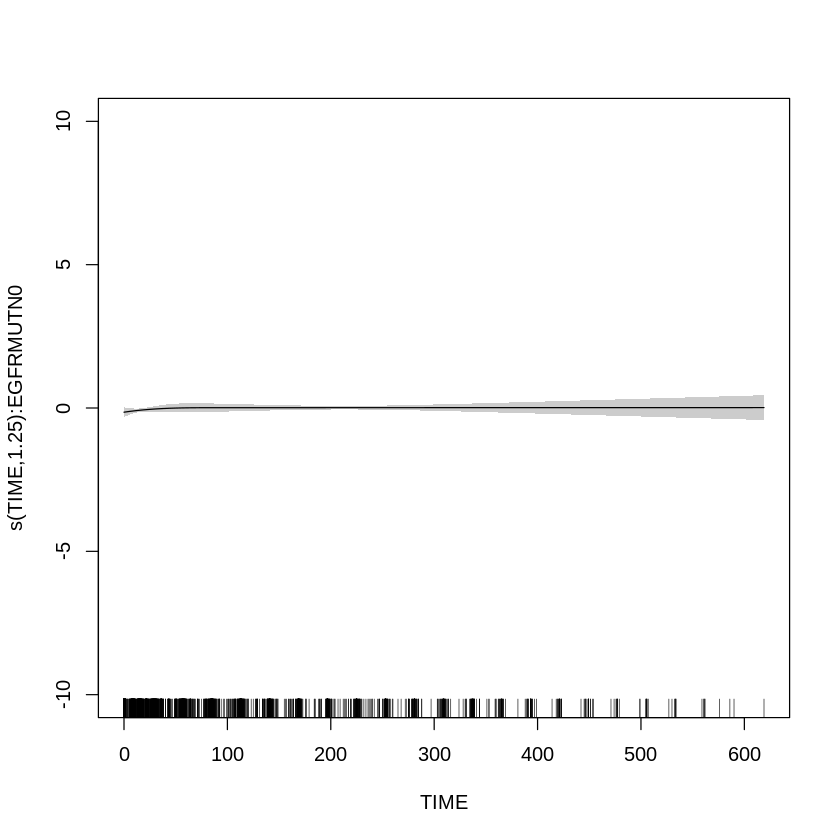

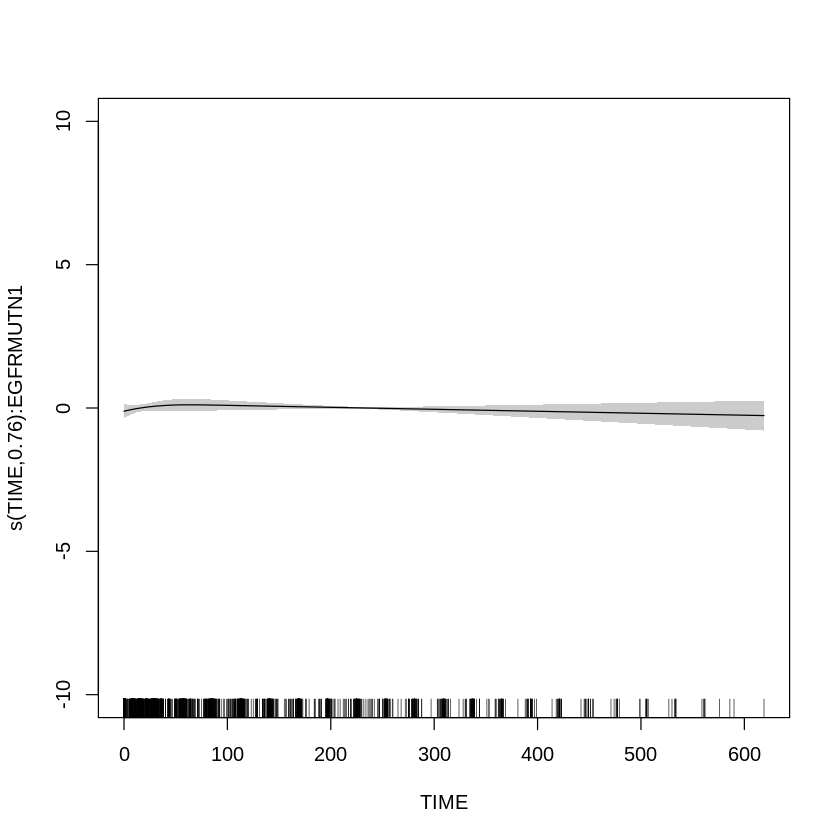

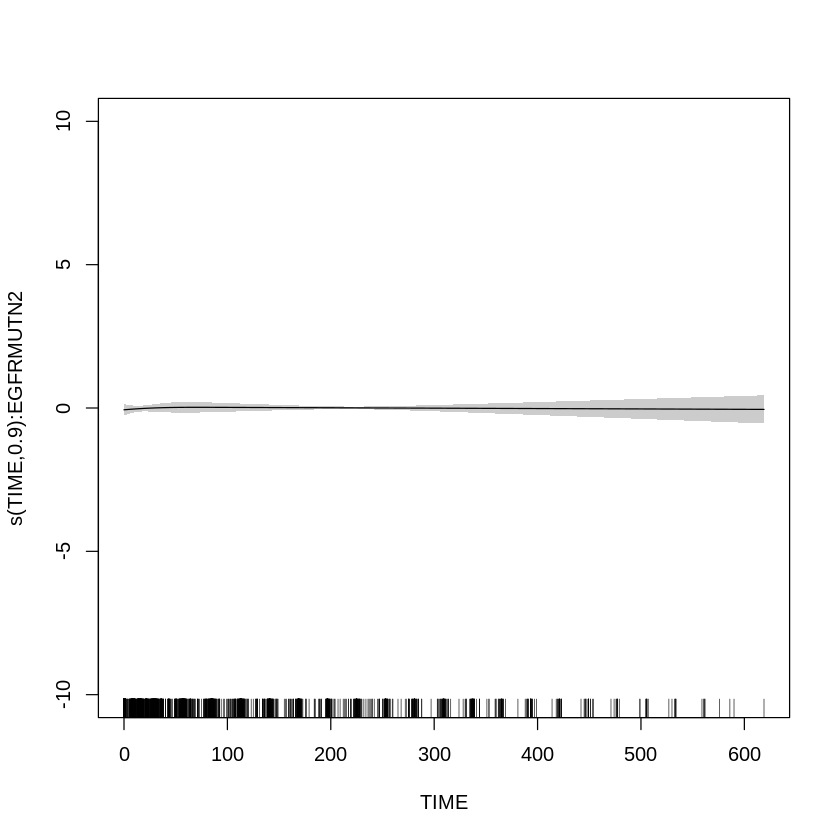

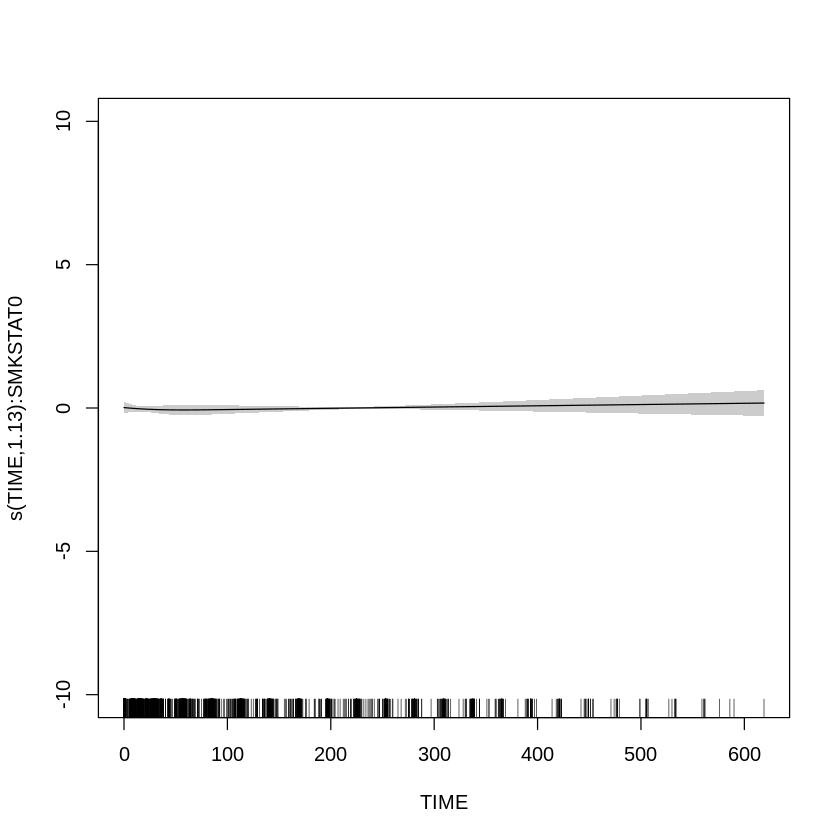

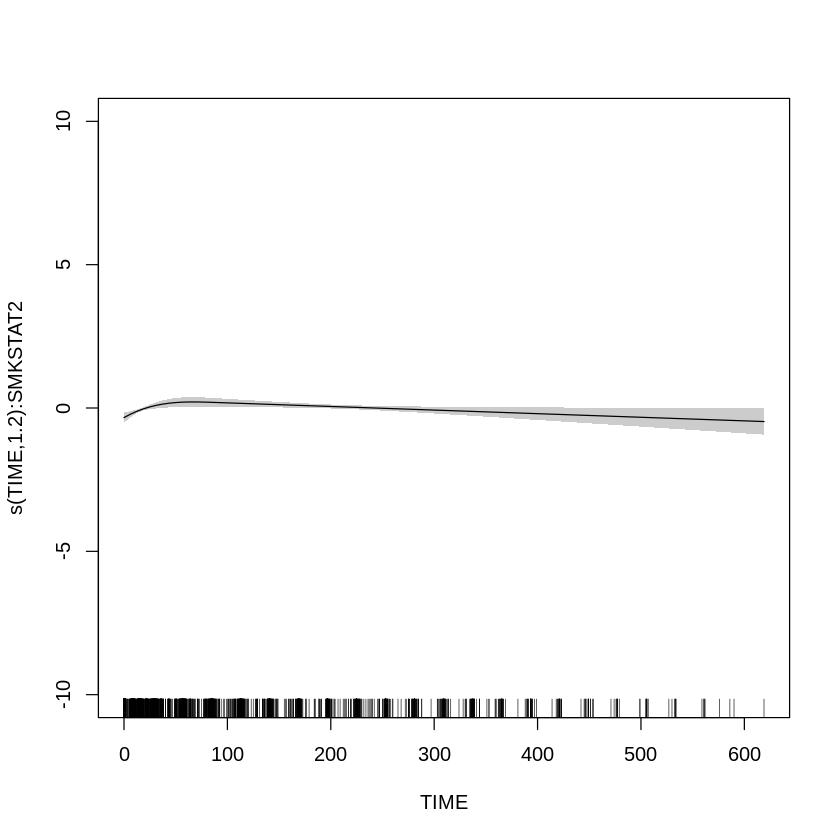

In [ ]:
ct1 <- gam(norm~s(TIME,  by =WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfAST, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)
(Intercept)  0.042391   0.053632   0.790    0.429
SMKSTAT2     0.052850   0.050057   1.056    0.291
EGFRMUTN1   -0.087642   0.077274  -1.134    0.257
EGFRMUTN2   -0.007101   0.070455  -0.101    0.920
WHOSTATN1    0.042858   0.048719   0.880    0.379
WHOSTATN2    0.101344   0.082524   1.228    0.220

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.2028      8 0.033 0.562868    
s(TIME):WHOSTATN1 1.2407      8 0.352 0.002393 ** 
s(TIME):WHOSTATN2 0.8320      8 0.235 0.019889 *  
s(TIME):EGFRMUTN0 1.2481      8 0.419 0.000373 ***
s(TIME):EGFRMUTN1 0.7613      7 0.182 0.097284 .  
s(TIME):EGFRMUTN2 0


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 1.115   0.291
EGFRMUTN  2 0.646   0.524
WHOSTATN  2 0.875   0.417

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.2028 8.0000 0.033 0.562868
s(TIME):WHOSTATN1 1.2407 8.0000 0.352 0.002393
s(TIME):WHOSTATN2 0.8320 8.0000 0.235 0.019889
s(TIME):EGFRMUTN0 1.2481 8.0000 0.419 0.000373
s(TIME):EGFRMUTN1 0.7613 7.0000 0.182 0.097284
s(TIME):EGFRMUTN2 0.9001 7.0000 0.053 0.435012
s(TIME):SMKSTAT0  1.1307 9.0000 0.079 0.192892
s(TIME):SMKSTAT2  1.2005 9.0000 1.326  < 2e-16

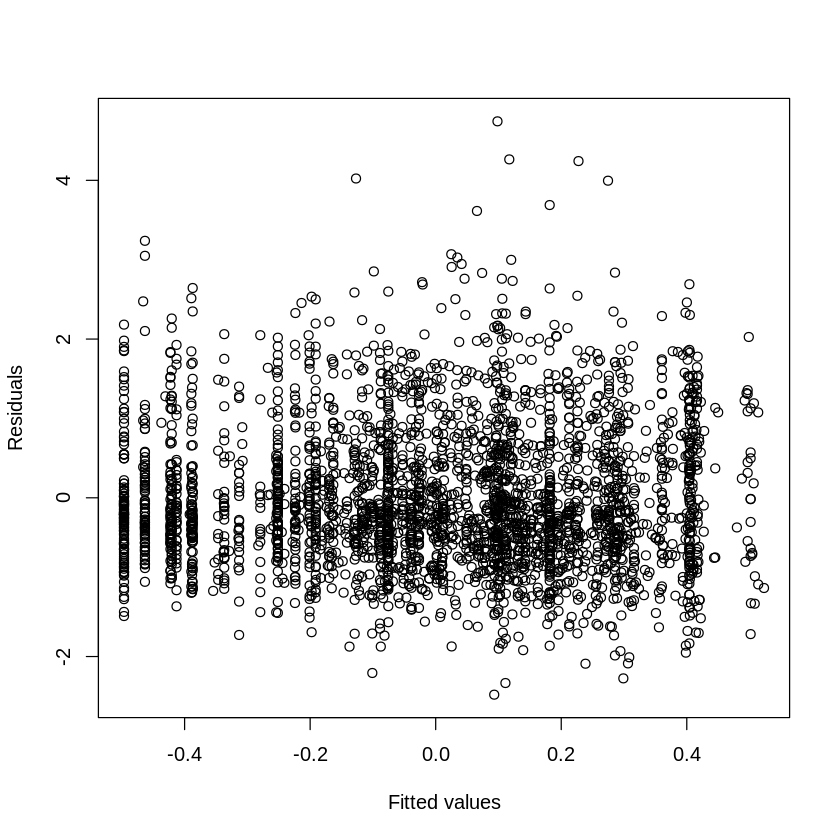

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 11 iterations.
Gradient range [-0.0002848969,0.0001359006]
(score 4071.749 & scale 0.7978258).
Hessian positive definite, eigenvalue range [6.72048e-08,1549.004].
Model rank =  49 / 49 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value
s(TIME):WHOSTATN0 9.00 1.84    1.02    0.90
s(TIME):WHOSTATN1 9.00 1.98    1.02    0.86
s(TIME):WHOSTATN2 9.00 1.29    1.02    0.91
s(TIME):SMKSTAT0  9.00 1.80    1.02    0.87
s(TIME):SMKSTAT2  9.00 2.04    1.02    0.90


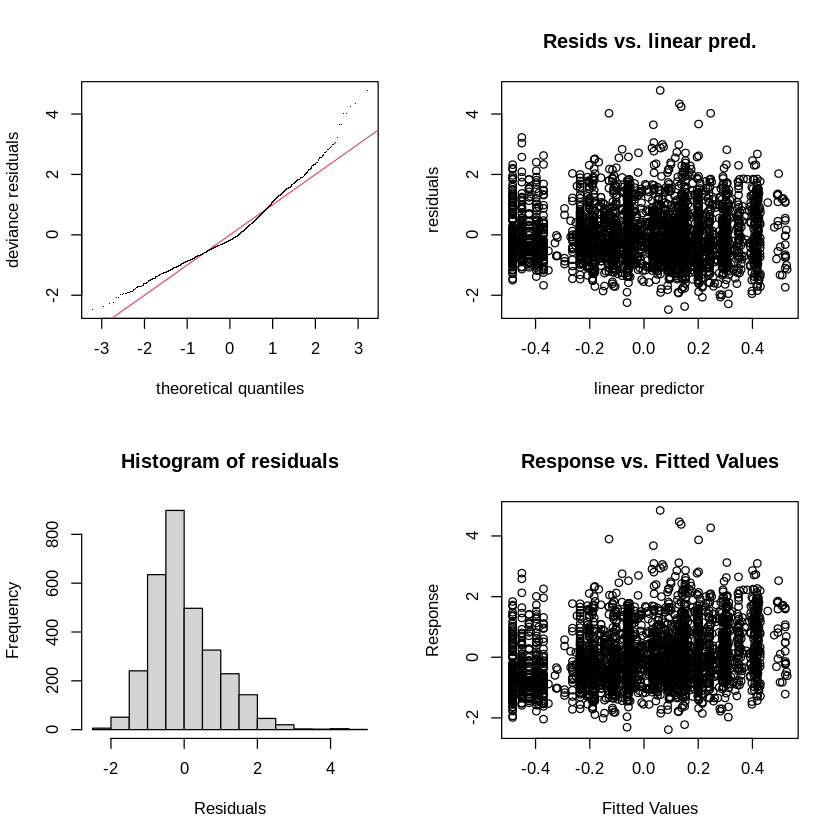

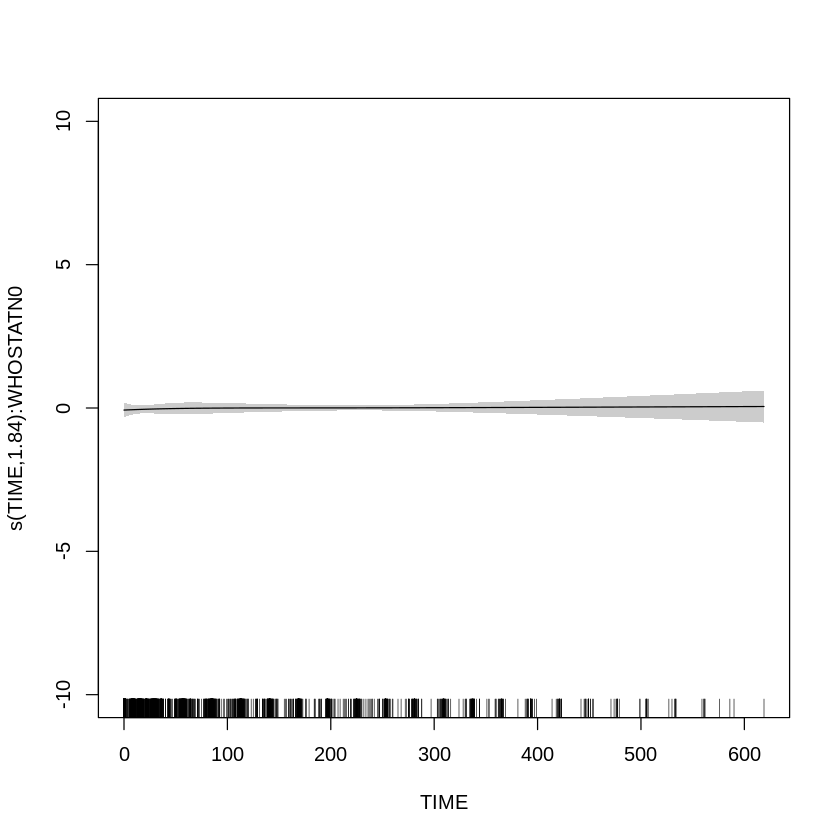

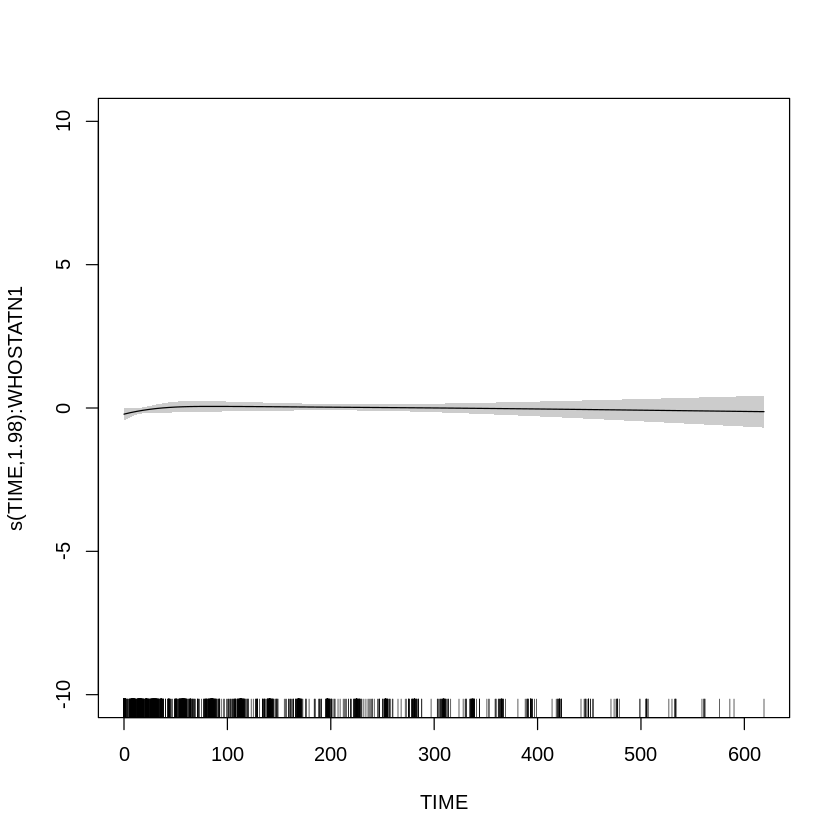

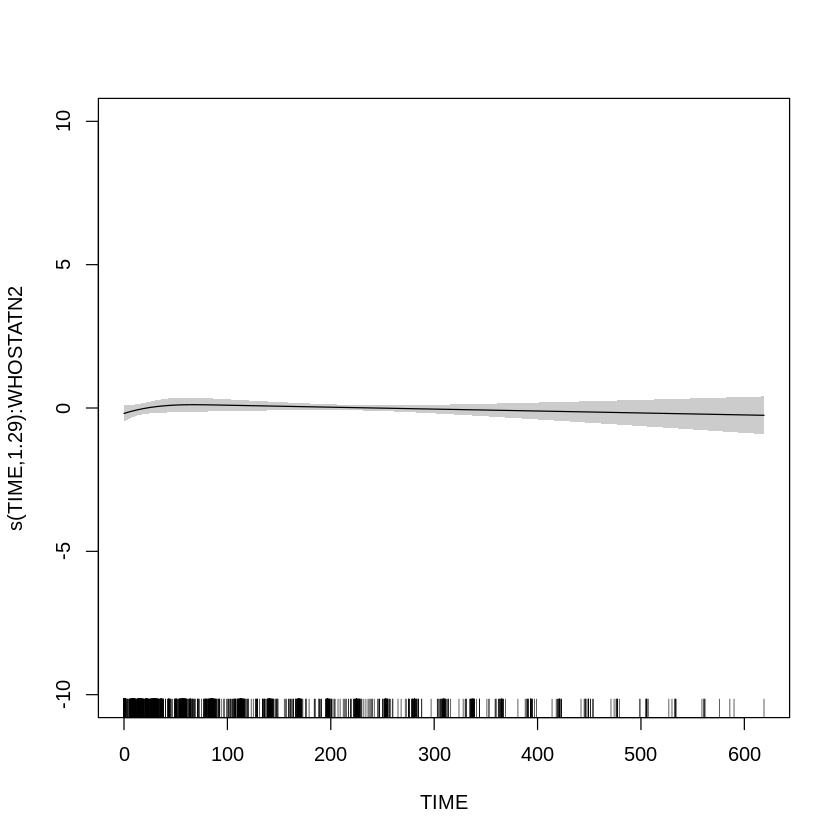

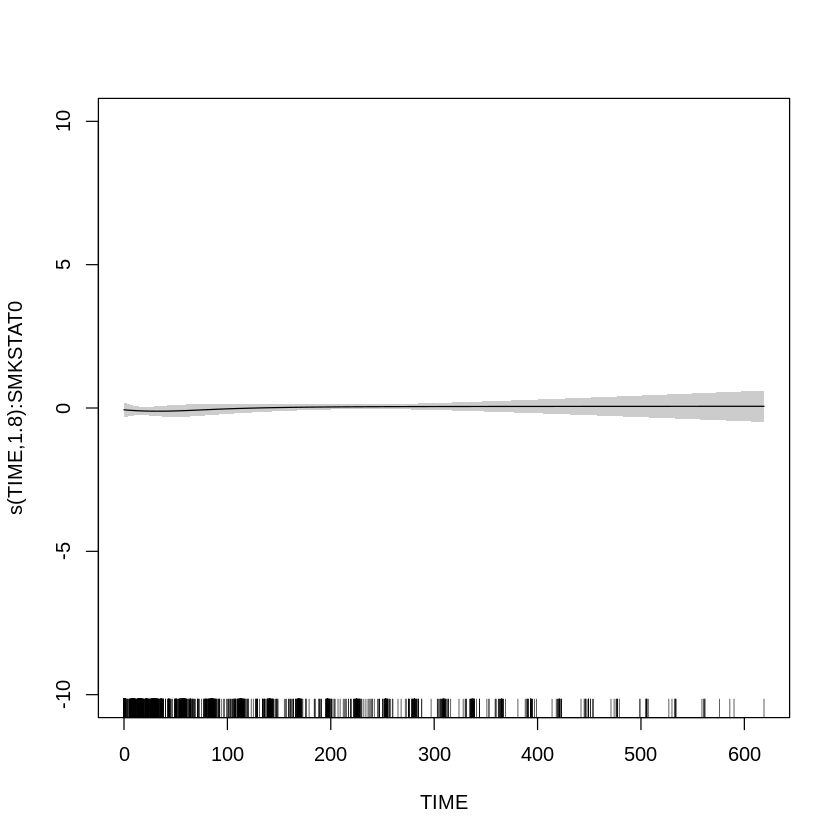

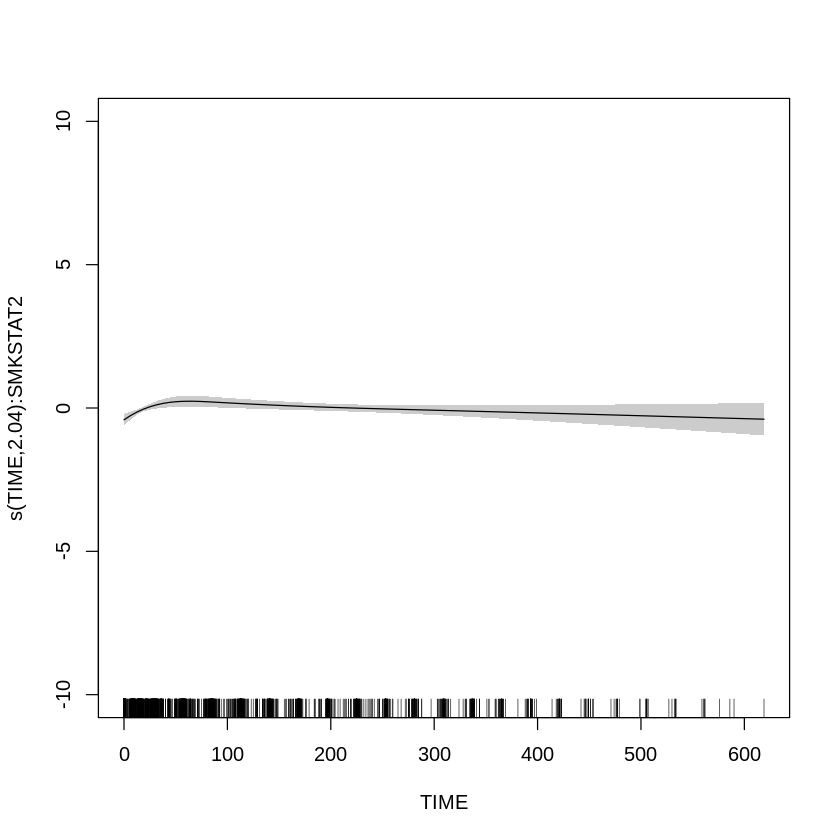

In [ ]:
ct1 <- gam(norm~s(TIME,  by =WHOSTATN, bs = 'ad', k = 10, id = 1) +  
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + WHOSTATN, data = dfAST, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + SMKSTAT + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)
(Intercept)  0.03303    0.05359   0.616    0.538
SMKSTAT2     0.05415    0.05178   1.046    0.296
WHOSTATN1    0.05487    0.05087   1.079    0.281
WHOSTATN2    0.09011    0.10350   0.871    0.384

Approximate significance of smooth terms:
                    edf Ref.df     F p-value    
s(TIME):WHOSTATN0 1.839      9 0.062 0.49394    
s(TIME):WHOSTATN1 1.982      9 0.336 0.00394 ** 
s(TIME):WHOSTATN2 1.288      8 0.259 0.03953 *  
s(TIME):SMKSTAT0  1.800      9 0.290 0.00793 ** 
s(TIME):SMKSTAT2  2.043      9 1.788 < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0803   Deviance explained = 8.38%
-REML = 4071.7  Scale est. = 0.79783   n = 3102


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + SMKSTAT + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 1.094   0.296
WHOSTATN  2 0.742   0.476

Approximate significance of smooth terms:
                    edf Ref.df     F p-value
s(TIME):WHOSTATN0 1.839  9.000 0.062 0.49394
s(TIME):WHOSTATN1 1.982  9.000 0.336 0.00394
s(TIME):WHOSTATN2 1.288  8.000 0.259 0.03953
s(TIME):SMKSTAT0  1.800  9.000 0.290 0.00793
s(TIME):SMKSTAT2  2.043  9.000 1.788 < 2e-16

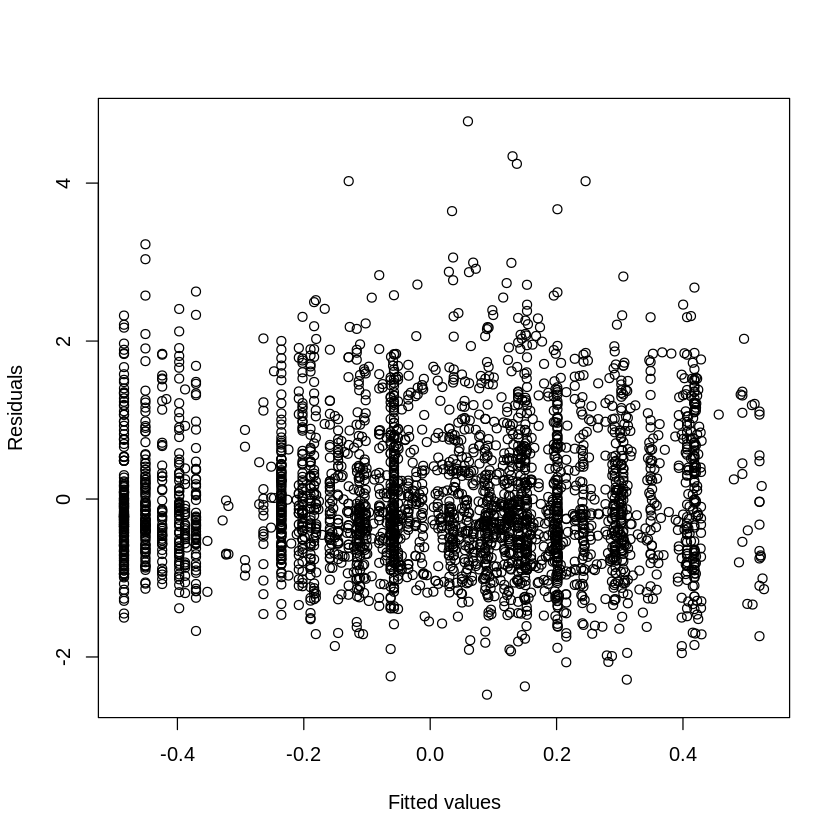

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 10 iterations.
Gradient range [-0.0005831677,0.0004404487]
(score 4067.214 & scale 0.7979511).
Hessian positive definite, eigenvalue range [3.30907e-07,1550.504].
Model rank =  46 / 46 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value
s(TIME):WHOSTATN0 9.00 1.82    1.02    0.88
s(TIME):WHOSTATN1 9.00 1.95    1.02    0.87
s(TIME):WHOSTATN2 9.00 1.47    1.02    0.89
s(TIME):SMKSTAT0  9.00 1.76    1.02    0.89
s(TIME):SMKSTAT2  9.00 2.01    1.02    0.90


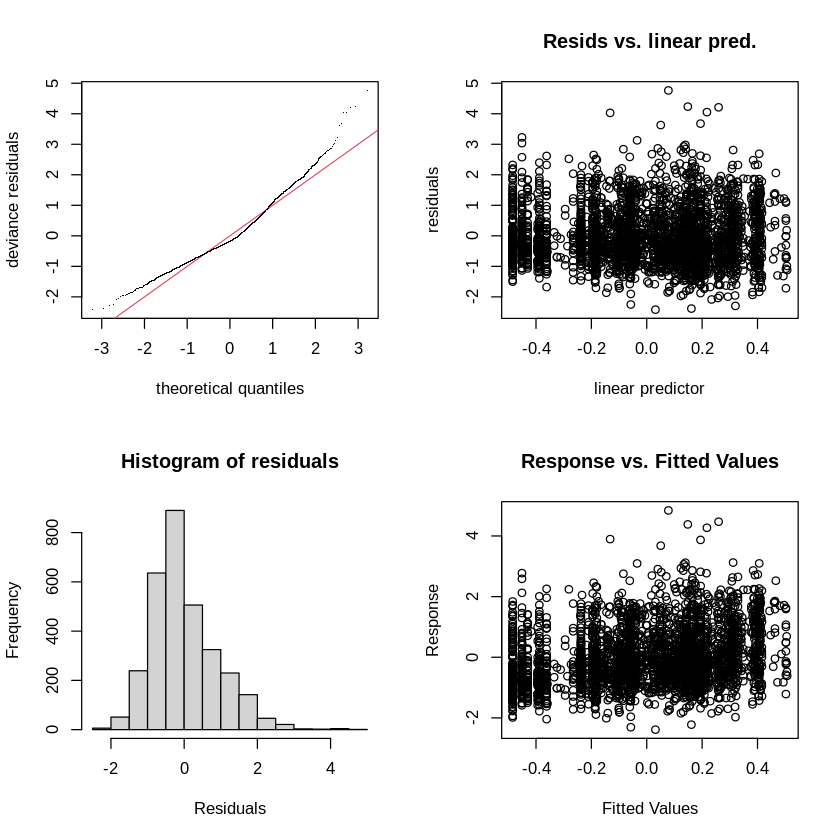

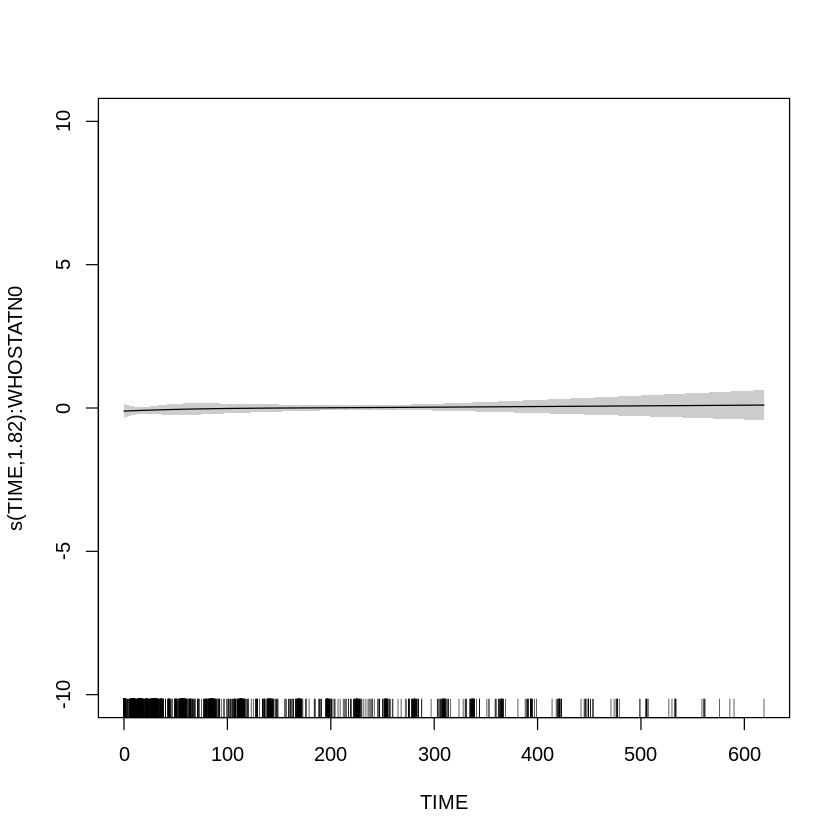

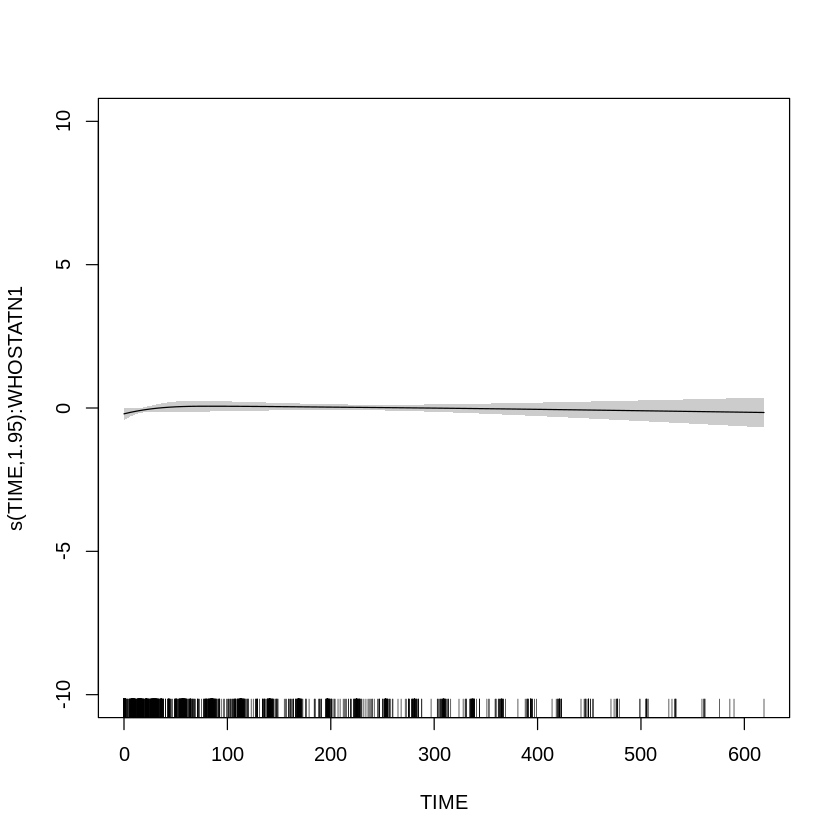

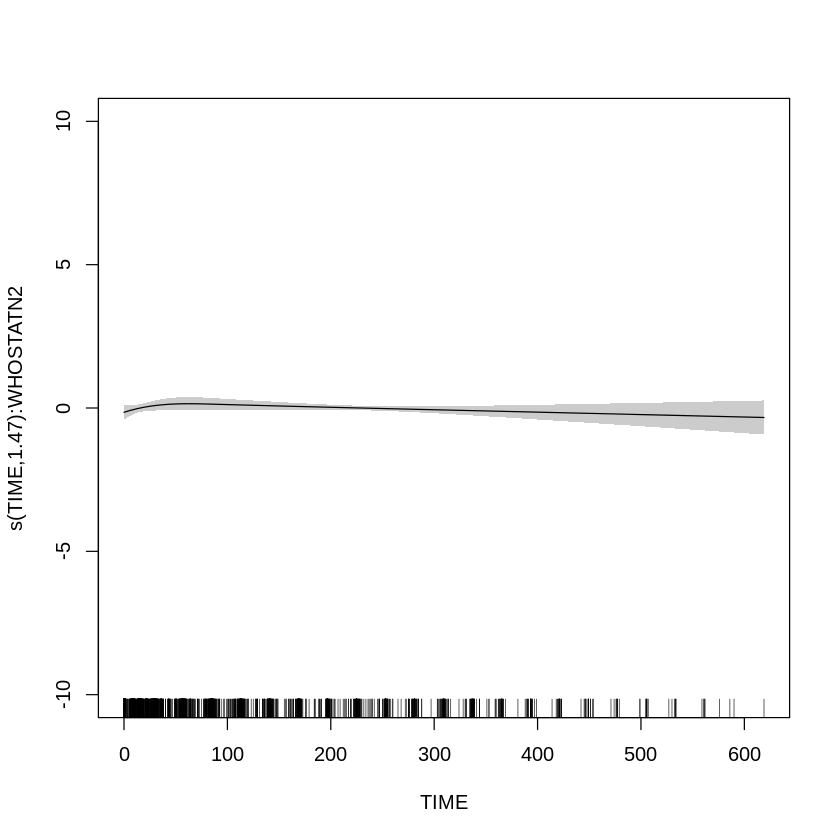

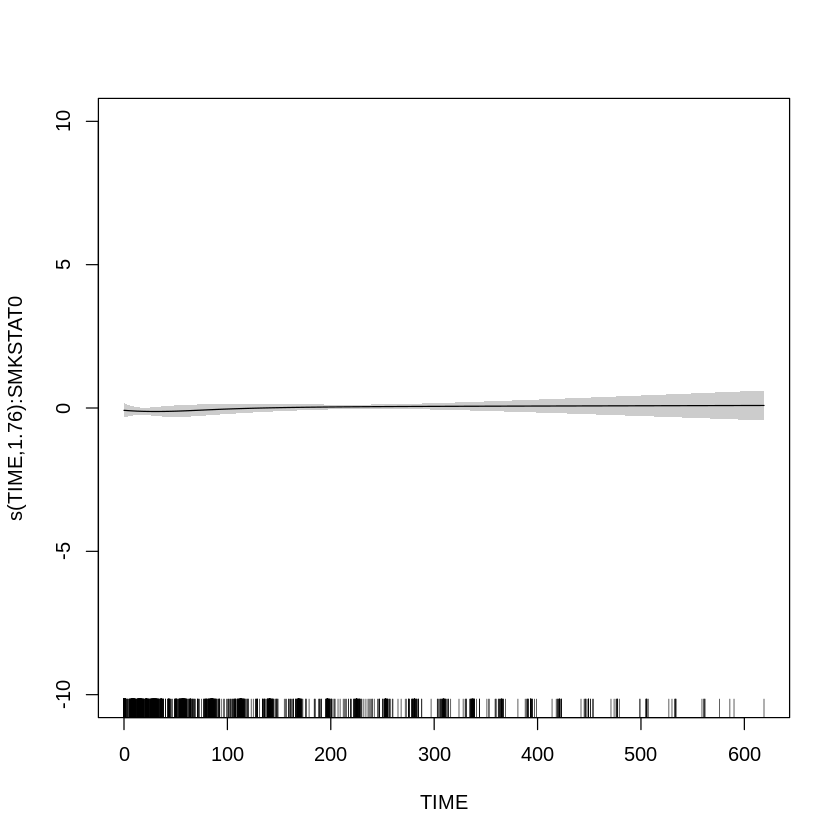

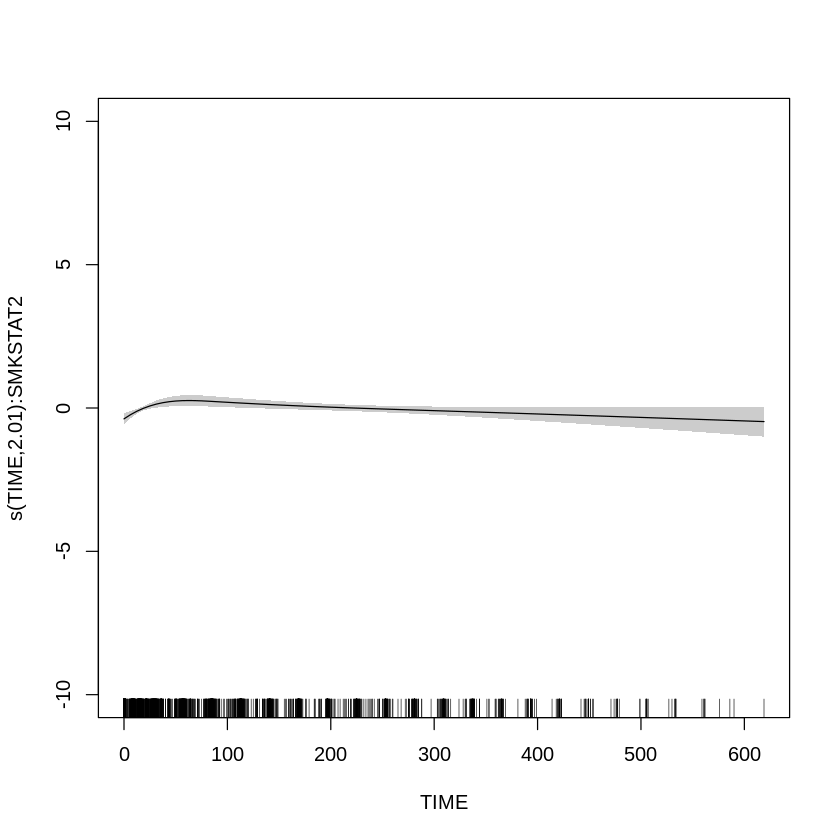

In [ ]:
ct1 <- gam(norm~s(TIME,  by =WHOSTATN, bs = 'ad', k = 10, id = 1) +  
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1), data = dfAST, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.09840    0.02458   4.004 6.39e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.822      9 0.221 0.017292 *  
s(TIME):WHOSTATN1 1.954      9 0.363 0.001117 ** 
s(TIME):WHOSTATN2 1.467      8 0.254 0.030887 *  
s(TIME):SMKSTAT0  1.764      9 0.382 0.000975 ***
s(TIME):SMKSTAT2  2.012      9 1.680  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0801   Deviance explained = 8.28%
-REML = 4067.2  Scale est. = 0.79795   n = 3102


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.822  9.000 0.221 0.017292
s(TIME):WHOSTATN1 1.954  9.000 0.363 0.001117
s(TIME):WHOSTATN2 1.467  8.000 0.254 0.030887
s(TIME):SMKSTAT0  1.764  9.000 0.382 0.000975
s(TIME):SMKSTAT2  2.012  9.000 1.680  < 2e-16

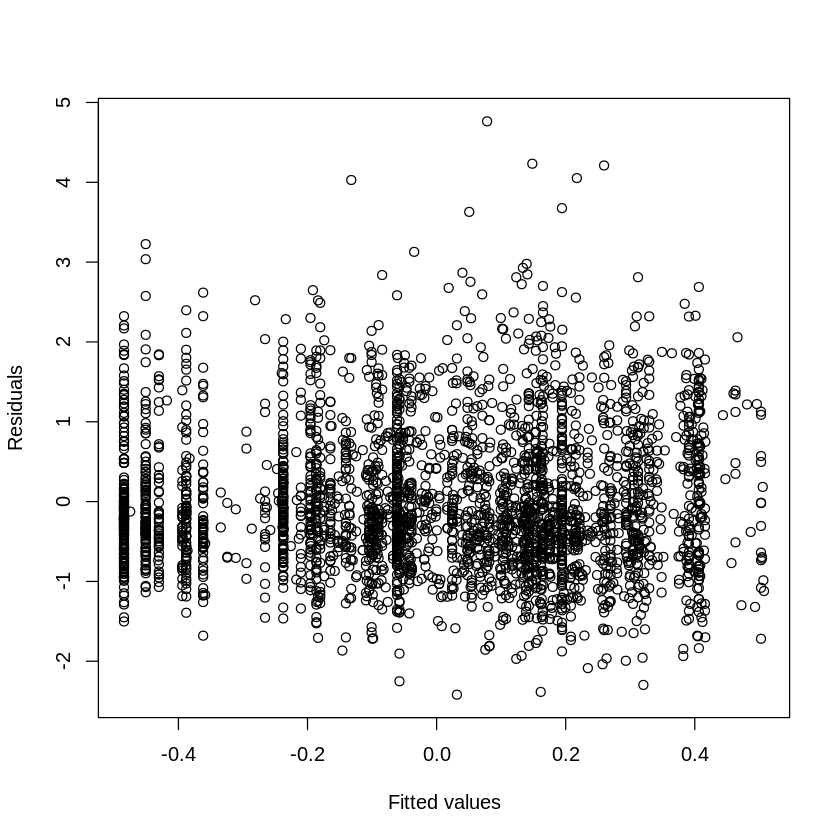

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# LDH


In [ ]:
dfLDH <- make_df(data, 'LDH')


Method: REML   Optimizer: outer newton
full convergence after 17 iterations.
Gradient range [-6.291964e-07,0.0003417895]
(score 4176.997 & scale 0.8524835).
eigenvalue range [-1.443196e-05,1549.006].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.257    0.98    0.20
s(TIME):WHOSTATN1 9.000 1.344    0.98    0.17
s(TIME):WHOSTATN2 9.000 0.799    0.98    0.12
s(TIME):EGFRMUTN0 9.000 1.396    0.98    0.18
s(TIME):EGFRMUTN1 9.000 0.712    0.98    0.20
s(TIME):EGFRMUTN2 9.000 0.945    0.98    0.18
s(TIME):SMKSTAT0  9.000 1.163    0.98    0.19
s(TIME):SMKSTAT2  9.000 1.334    0.98    0.18


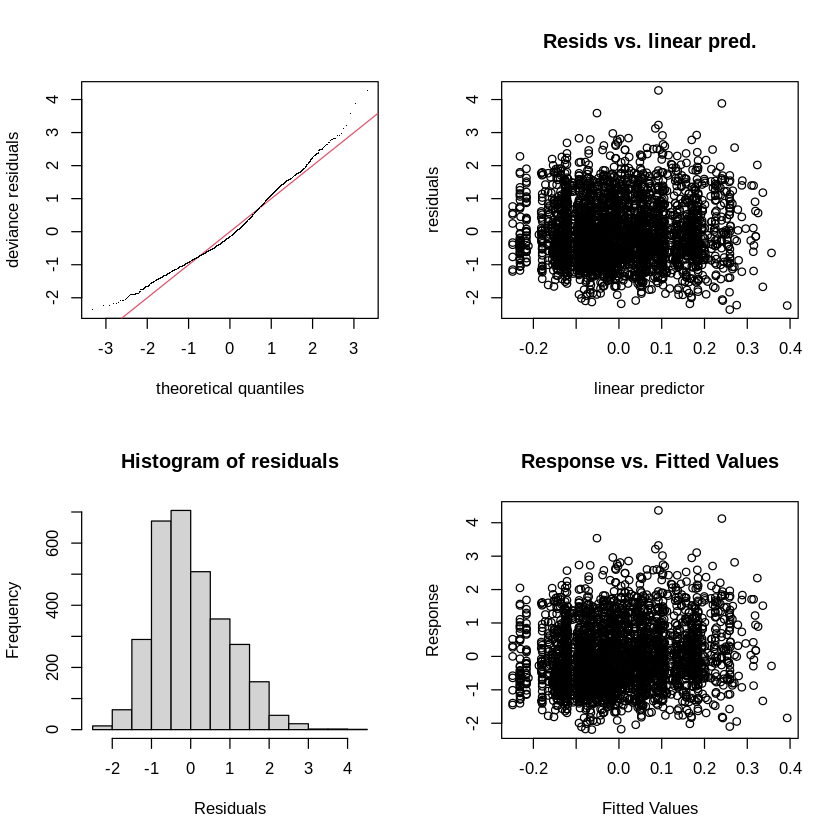

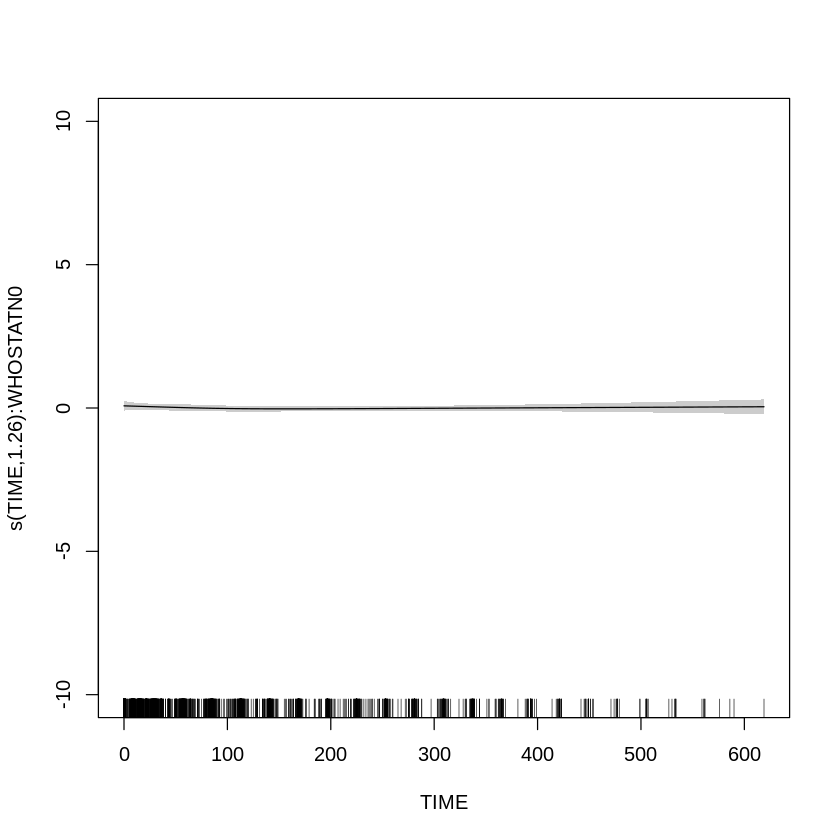

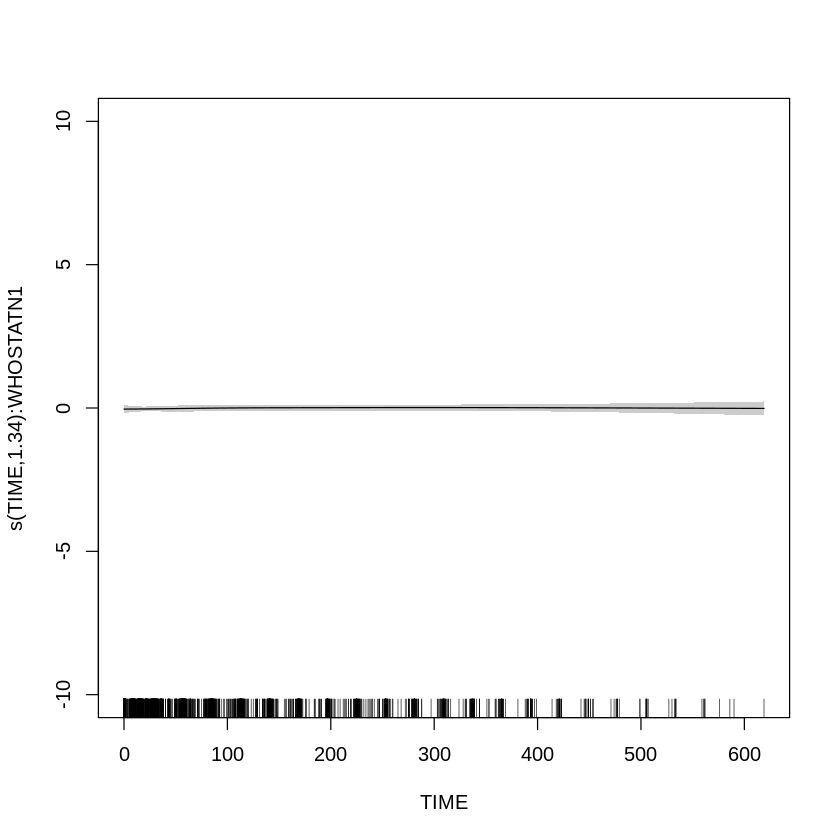

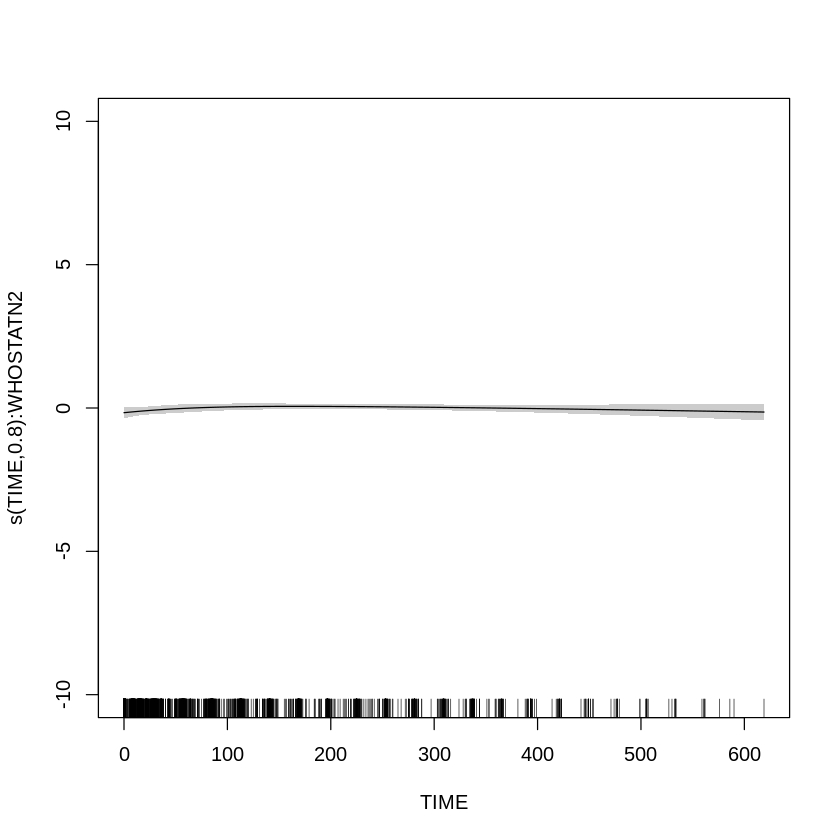

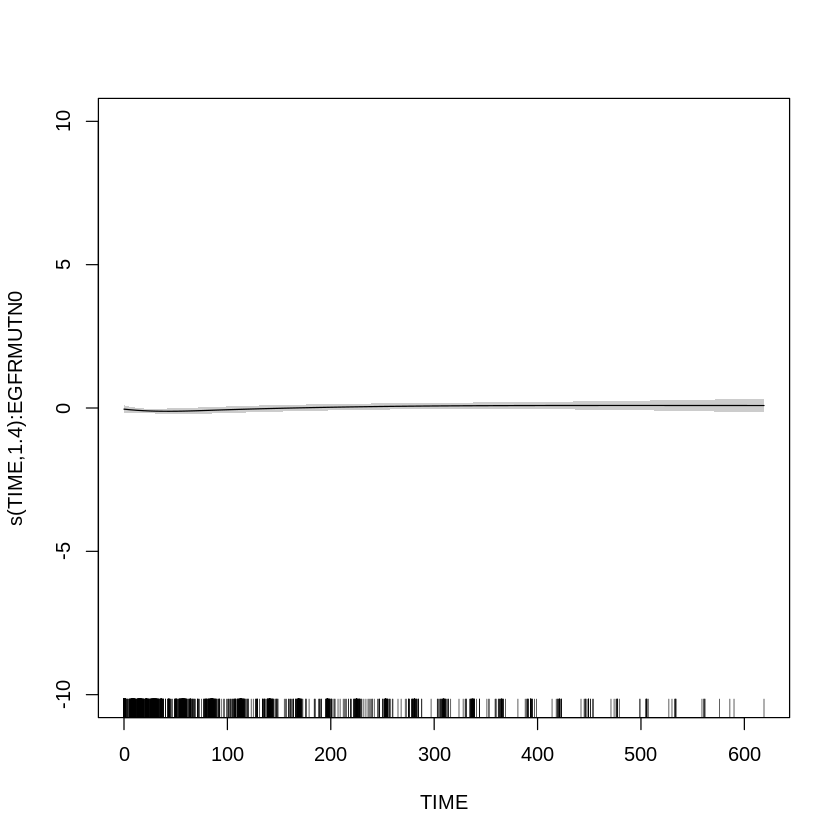

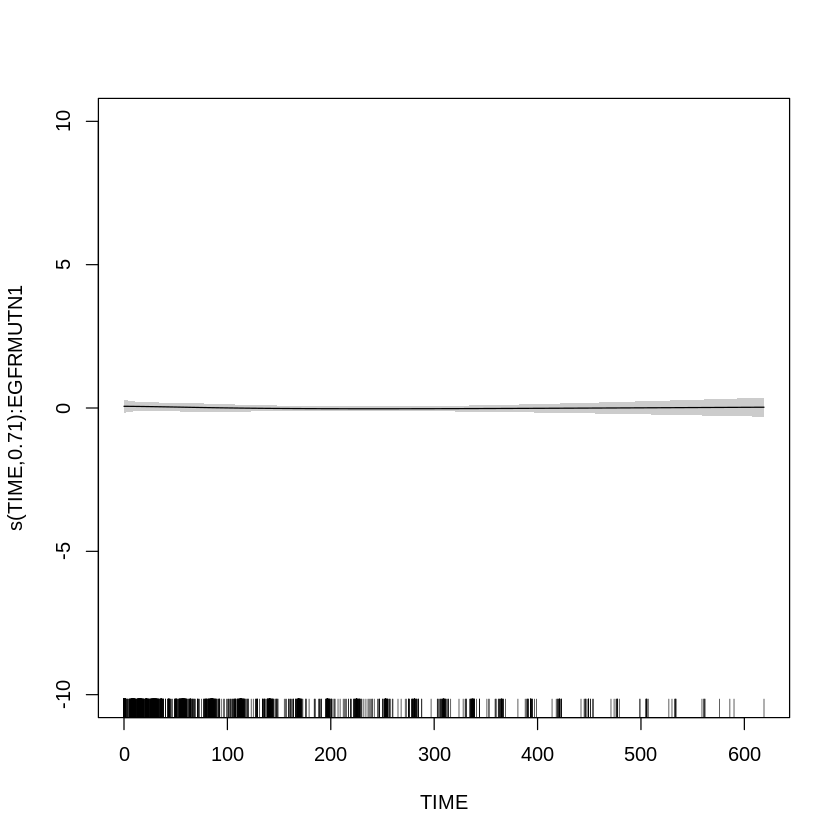

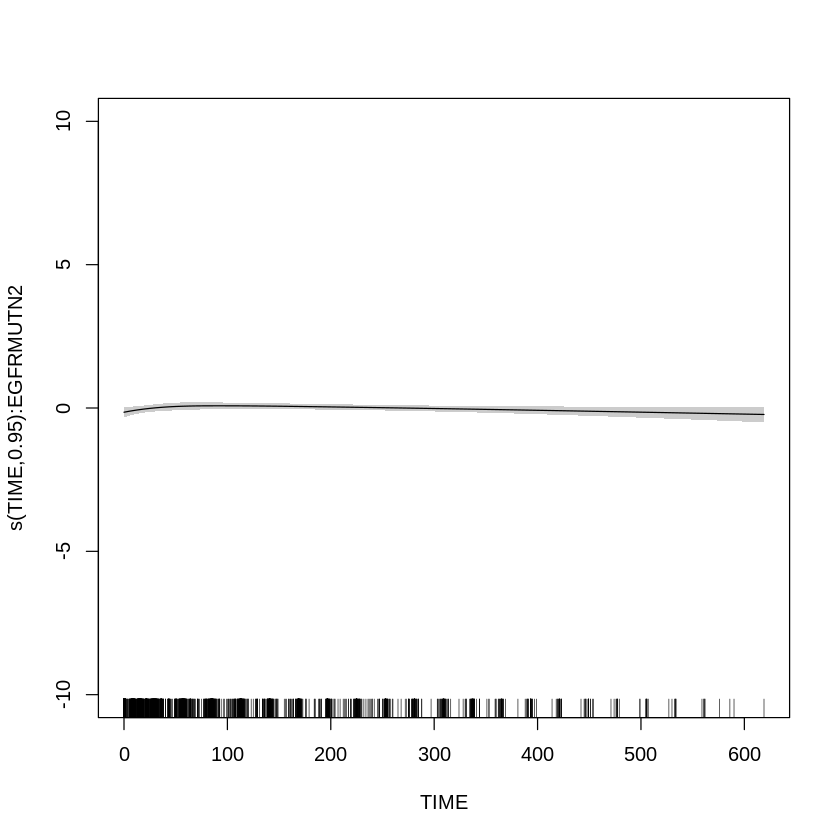

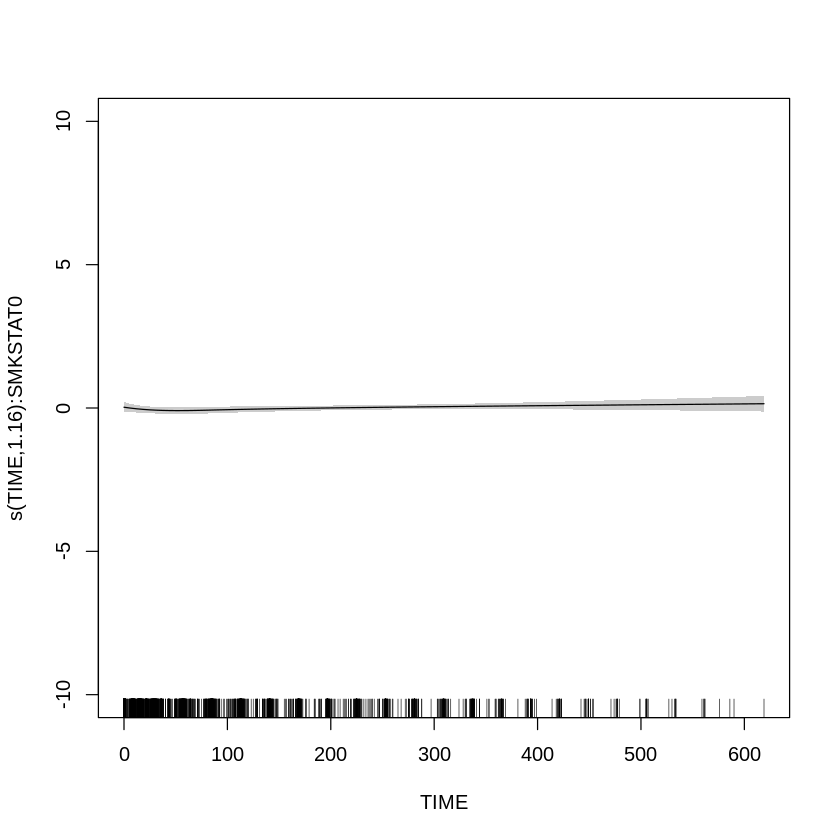

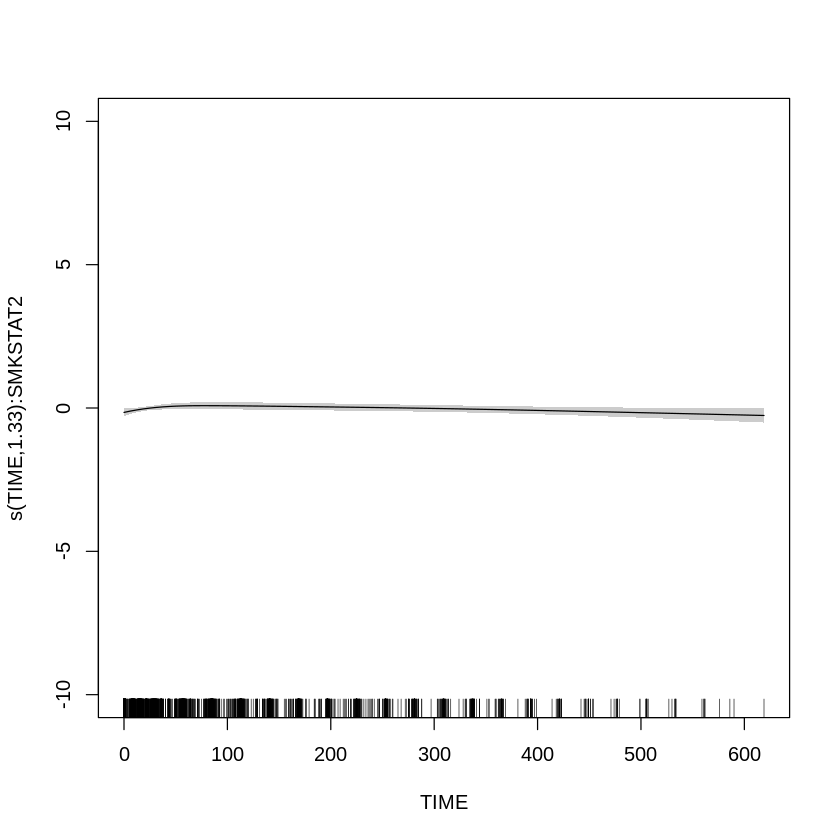

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfLDH, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.003990   0.054536   0.073   0.9417  
SMKSTAT2     0.040692   0.050353   0.808   0.4191  
EGFRMUTN1   -0.064215   0.076859  -0.835   0.4035  
EGFRMUTN2    0.001674   0.069880   0.024   0.9809  
WHOSTATN1    0.060823   0.048623   1.251   0.2111  
WHOSTATN2    0.169610   0.087446   1.940   0.0525 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.2575      9 0.110 0.200965    
s(TIME):WHOSTATN1 1.3443      9 0.048 0.527408    
s(TIME):WHOSTATN2 0.7987      7 0.362 0.012485 *  
s(TIME):EGFRMUTN0 1.3961      9 0.503 0.


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.653   0.419
EGFRMUTN  2 0.358   0.699
WHOSTATN  2 2.095   0.123

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.2575 9.0000 0.110 0.200965
s(TIME):WHOSTATN1 1.3443 9.0000 0.048 0.527408
s(TIME):WHOSTATN2 0.7987 7.0000 0.362 0.012485
s(TIME):EGFRMUTN0 1.3961 9.0000 0.503 0.000122
s(TIME):EGFRMUTN1 0.7125 7.0000 0.081 0.371272
s(TIME):EGFRMUTN2 0.9455 8.0000 0.364 0.005702
s(TIME):SMKSTAT0  1.1632 9.0000 0.239 0.017399
s(TIME):SMKSTAT2  1.3340 9.0000 0.493 4.75e-05

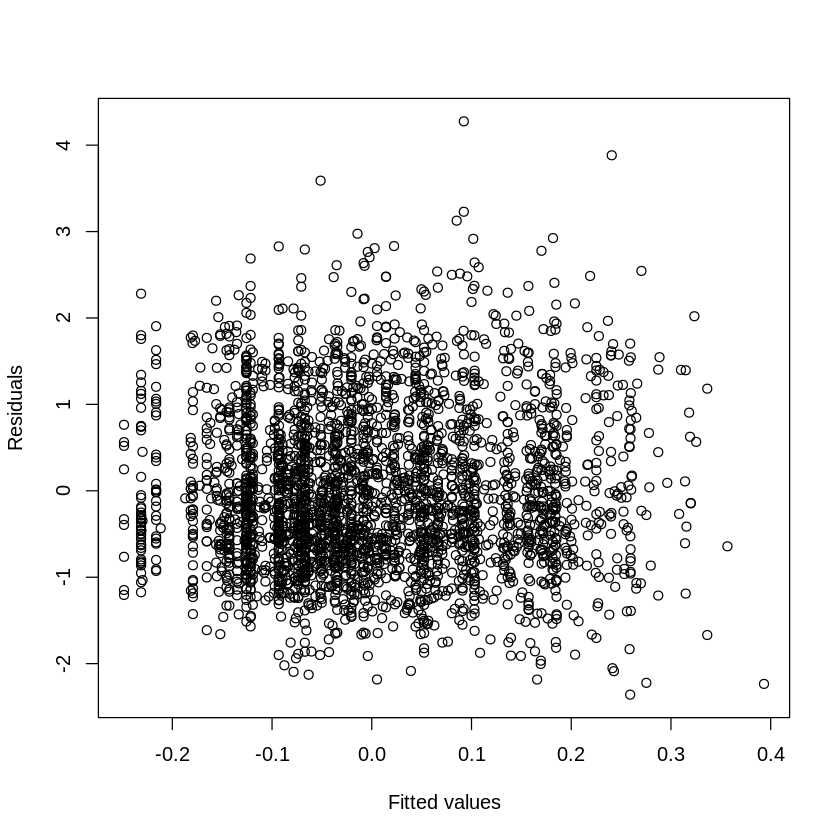

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 9 iterations.
Gradient range [-0.002925361,0.001945595]
(score 4173.898 & scale 0.8525926).
Hessian positive definite, eigenvalue range [6.436325e-05,1550.004].
Model rank =  76 / 76 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.189    0.98    0.17
s(TIME):WHOSTATN1 9.000 1.285    0.98    0.12
s(TIME):WHOSTATN2 9.000 0.736    0.98    0.18
s(TIME):EGFRMUTN0 9.000 1.387    0.98    0.16
s(TIME):EGFRMUTN1 9.000 0.670    0.98    0.23
s(TIME):EGFRMUTN2 9.000 1.097    0.98    0.17
s(TIME):SMKSTAT0  9.000 1.104    0.98    0.15
s(TIME):SMKSTAT2  9.000 1.270    0.98    0.20


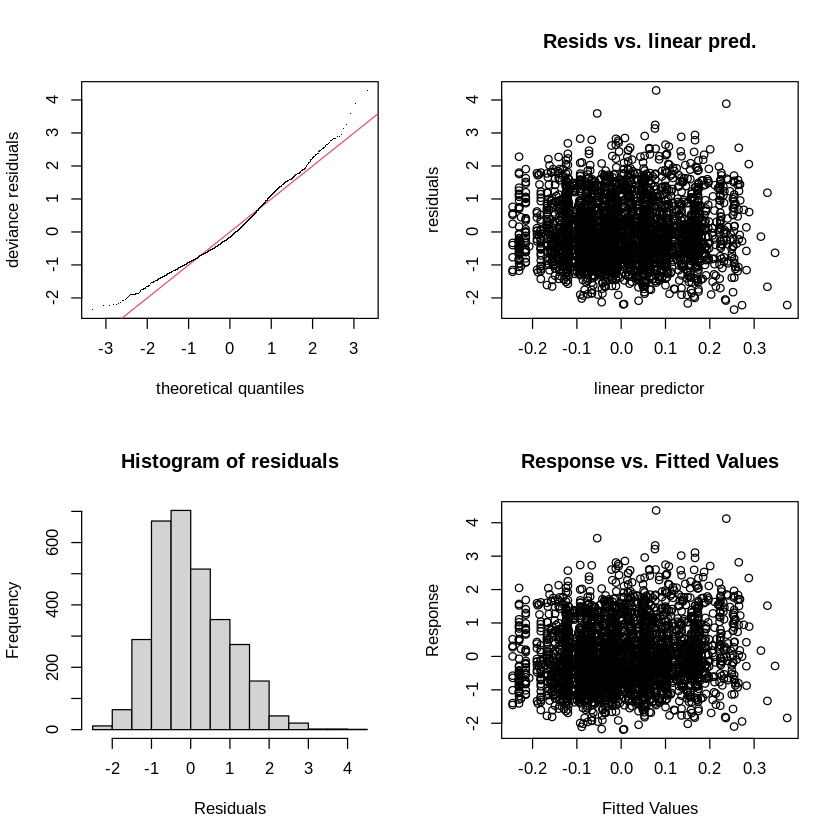

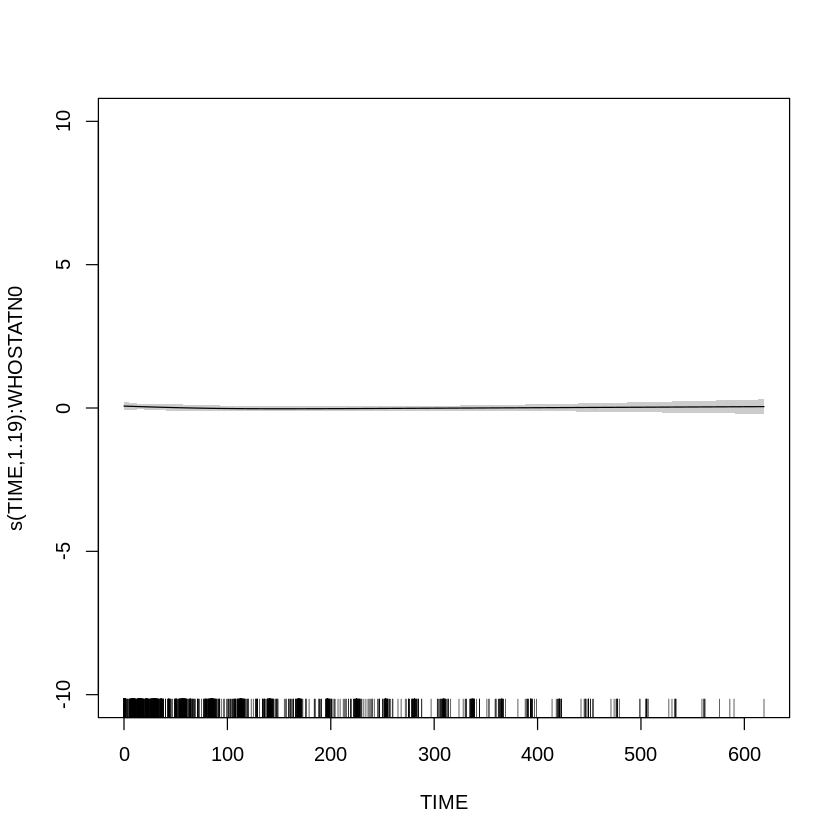

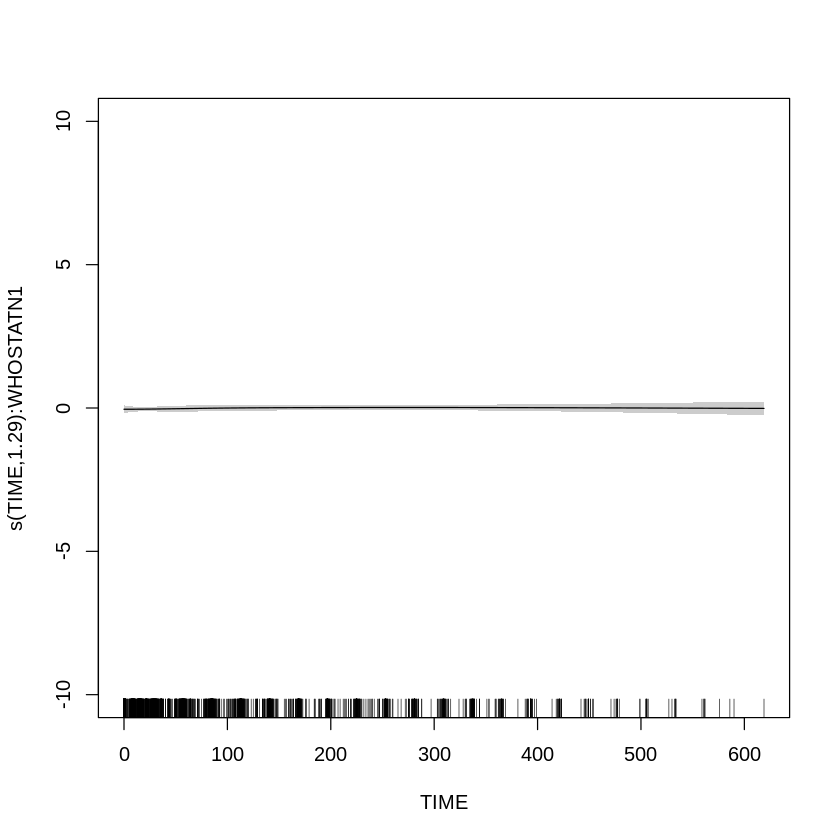

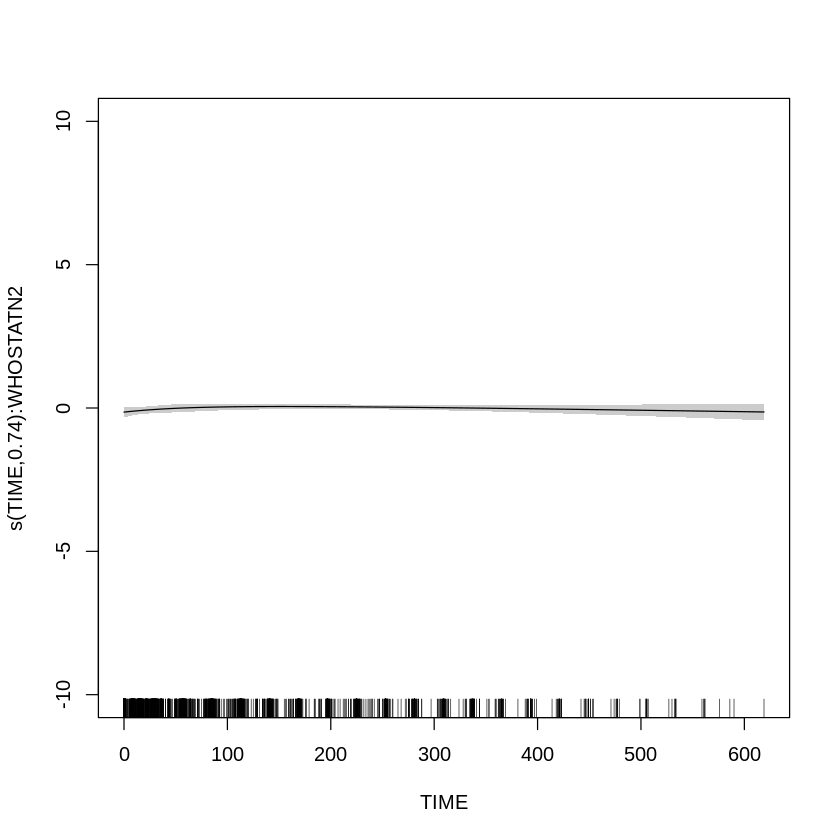

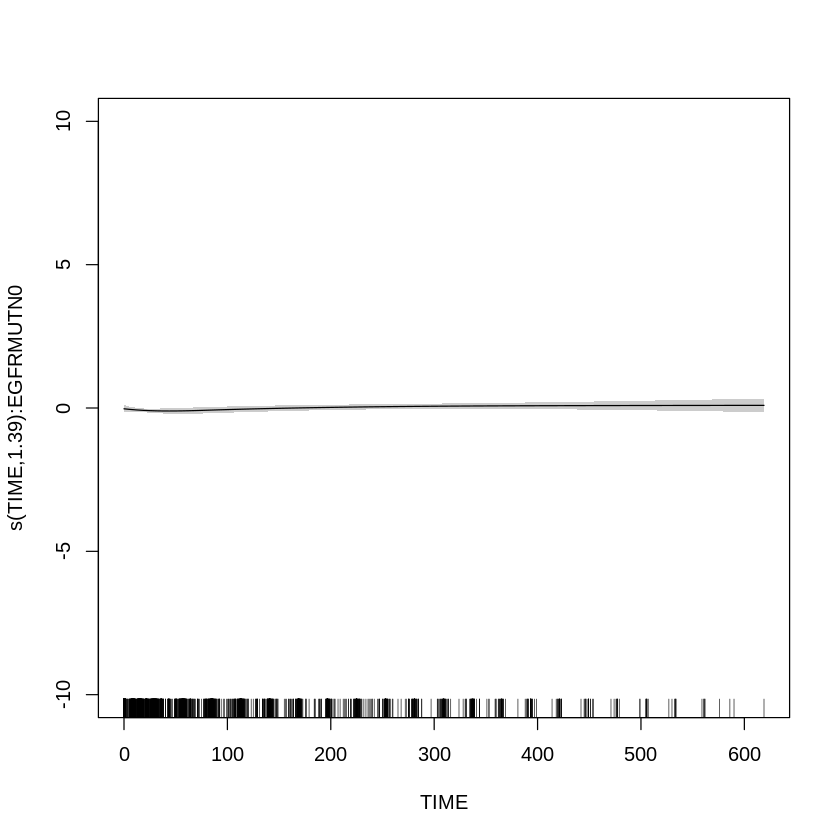

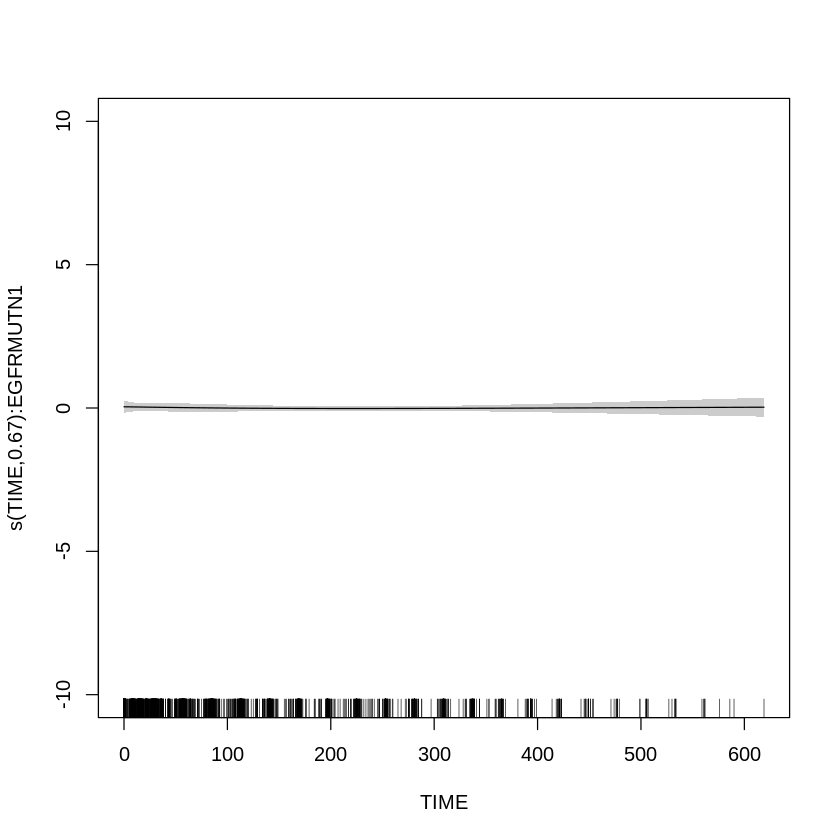

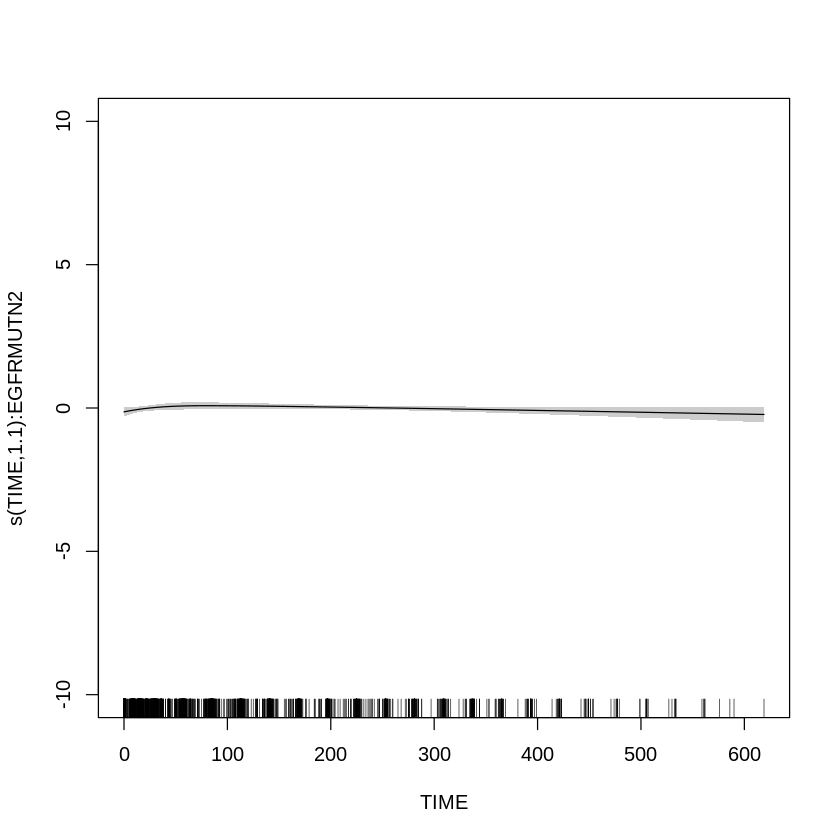

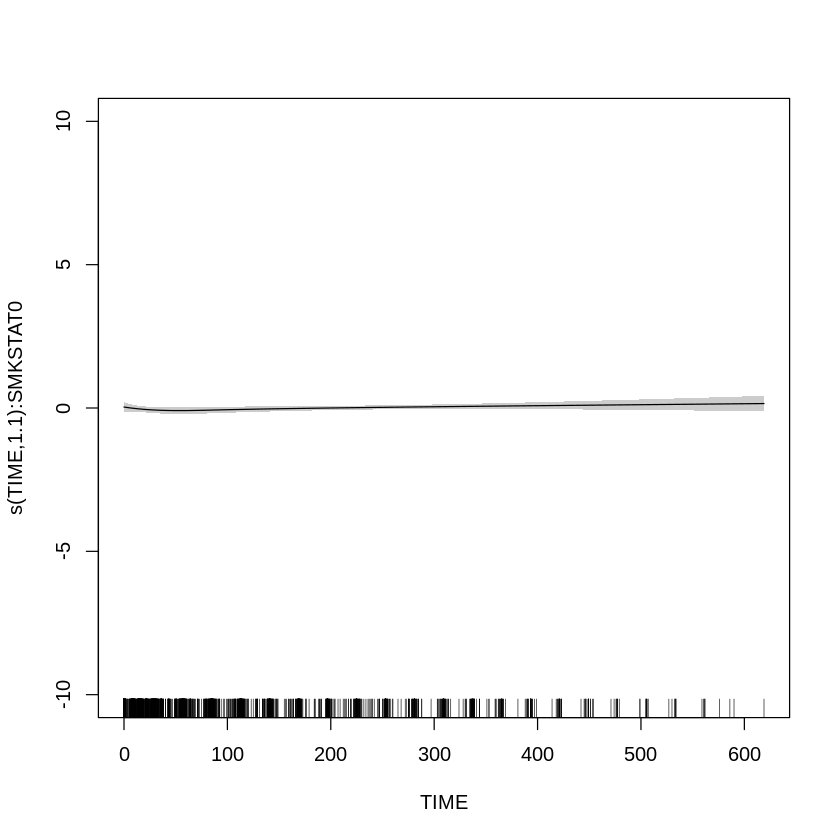

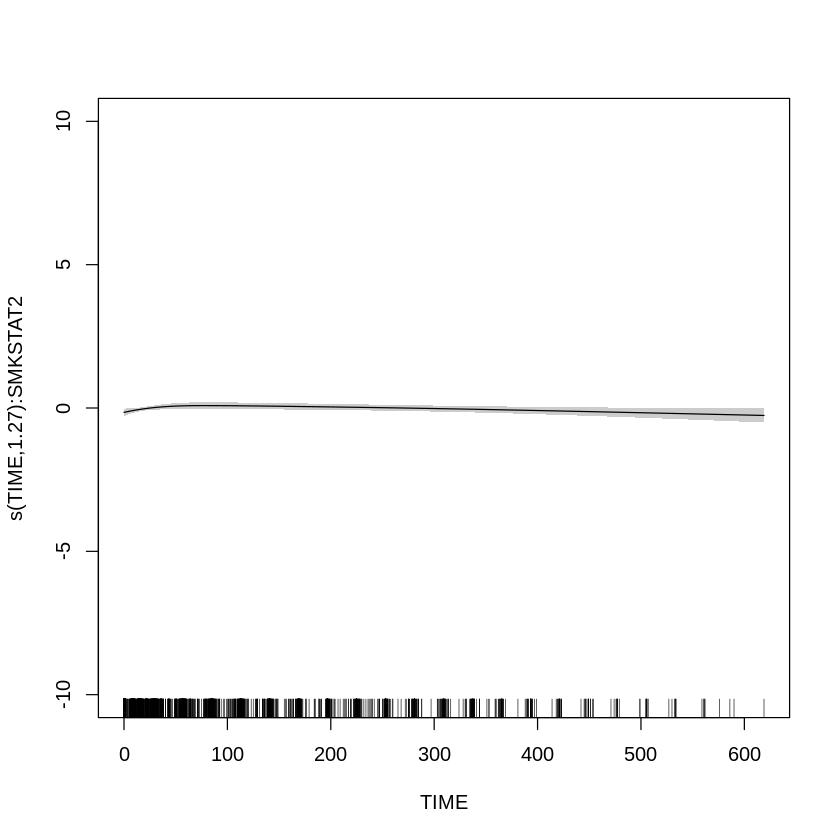

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + WHOSTATN, data = dfLDH, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept) -0.00742    0.05062  -0.147   0.8835  
SMKSTAT2     0.04534    0.04831   0.938   0.3482  
WHOSTATN1    0.06142    0.04727   1.299   0.1939  
WHOSTATN2    0.14588    0.08293   1.759   0.0787 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.1888      9 0.100  0.23174    
s(TIME):WHOSTATN1 1.2852      9 0.077  0.31400    
s(TIME):WHOSTATN2 0.7364      8 0.286  0.01652 *  
s(TIME):EGFRMUTN0 1.3872      9 0.526 7.34e-05 ***
s(TIME):EGFRMUTN1 0.6701      9 0.035  0.56998    
s(TIME):EGFRMUTN2 1.0967      8 0.369  0.00663 ** 
s(TIME)


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.880   0.348
WHOSTATN  2 1.826   0.161

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.1888 9.0000 0.100  0.23174
s(TIME):WHOSTATN1 1.2852 9.0000 0.077  0.31400
s(TIME):WHOSTATN2 0.7364 8.0000 0.286  0.01652
s(TIME):EGFRMUTN0 1.3872 9.0000 0.526 7.34e-05
s(TIME):EGFRMUTN1 0.6701 9.0000 0.035  0.56998
s(TIME):EGFRMUTN2 1.0967 8.0000 0.369  0.00663
s(TIME):SMKSTAT0  1.1039 9.0000 0.247  0.01766
s(TIME):SMKSTAT2  1.2704 9.0000 0.510 4.05e-05

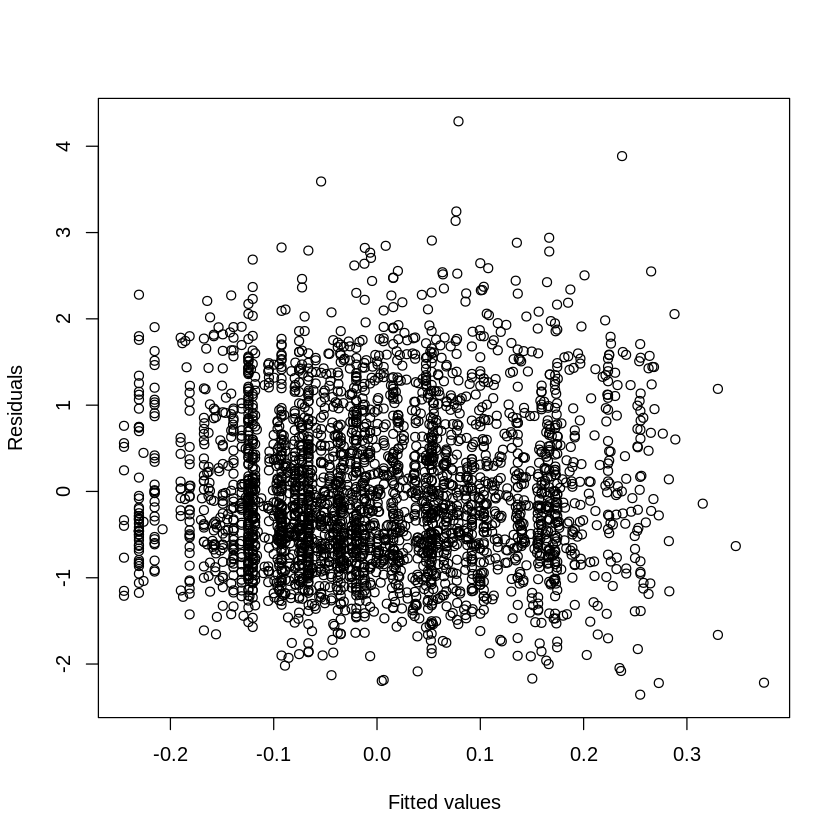

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 18 iterations.
Gradient range [-0.003731777,0.001349908]
(score 4172.207 & scale 0.8526794).
Hessian positive definite, eigenvalue range [1.065e-05,1550.51].
Model rank =  75 / 75 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.166    0.98    0.17
s(TIME):WHOSTATN1 9.000 1.258    0.98    0.21
s(TIME):WHOSTATN2 9.000 0.724    0.98    0.17
s(TIME):EGFRMUTN0 9.000 1.360    0.98    0.14
s(TIME):EGFRMUTN1 9.000 0.649    0.98    0.17
s(TIME):EGFRMUTN2 9.000 1.082    0.98    0.19
s(TIME):SMKSTAT0  9.000 1.126    0.98    0.16
s(TIME):SMKSTAT2  9.000 1.294    0.98    0.17


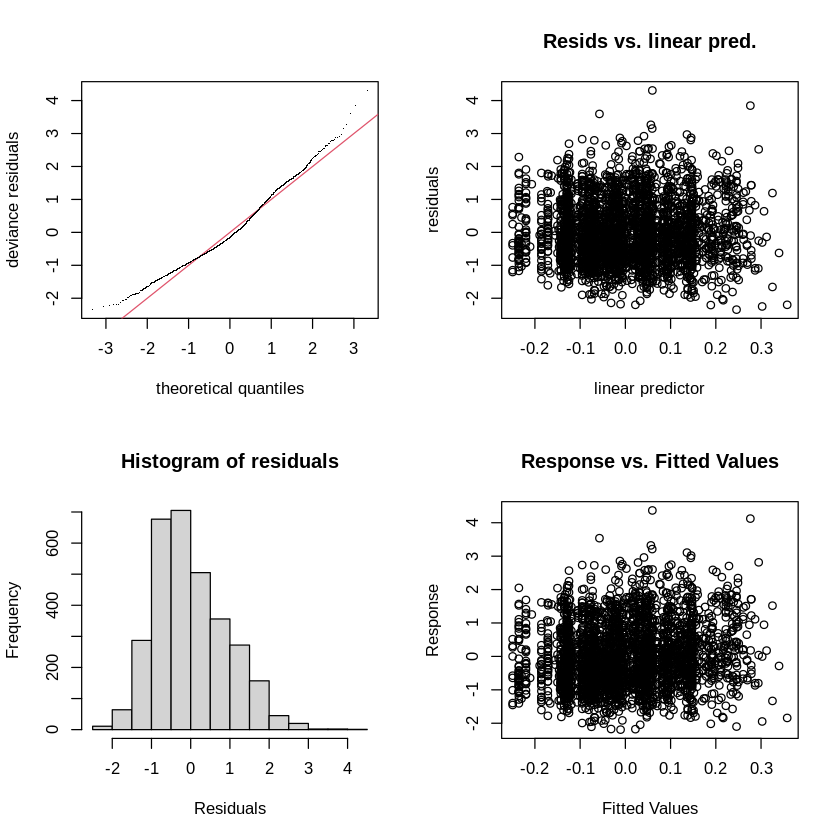

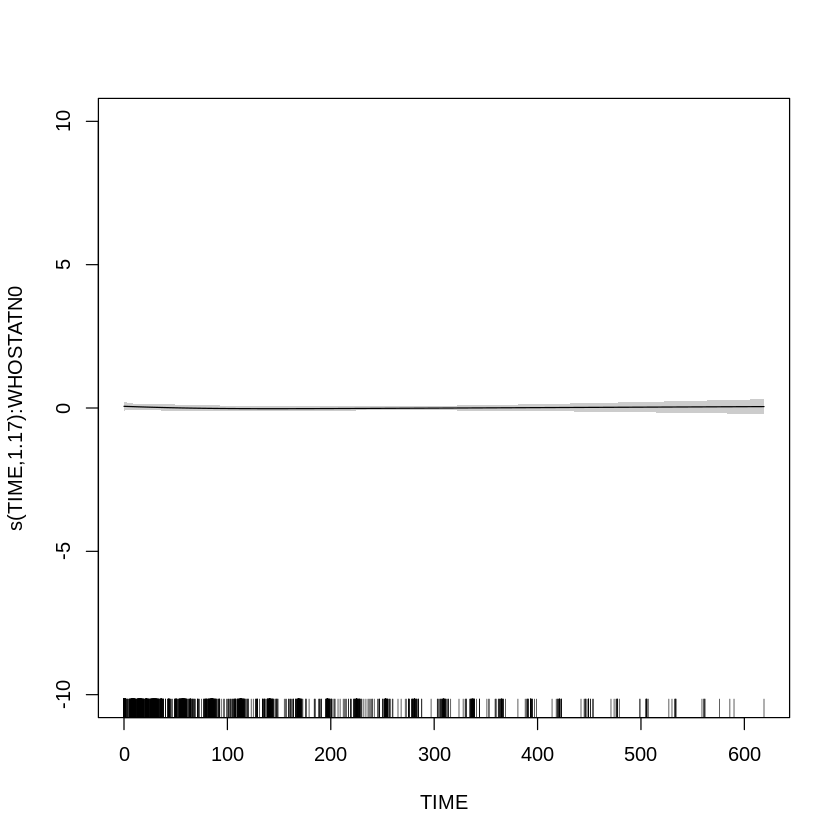

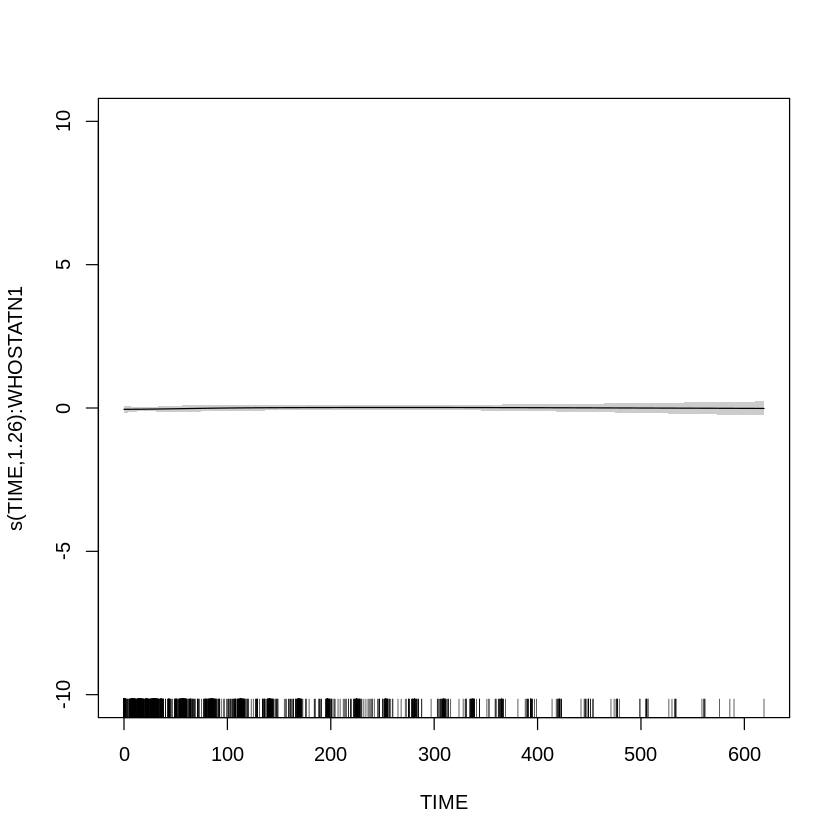

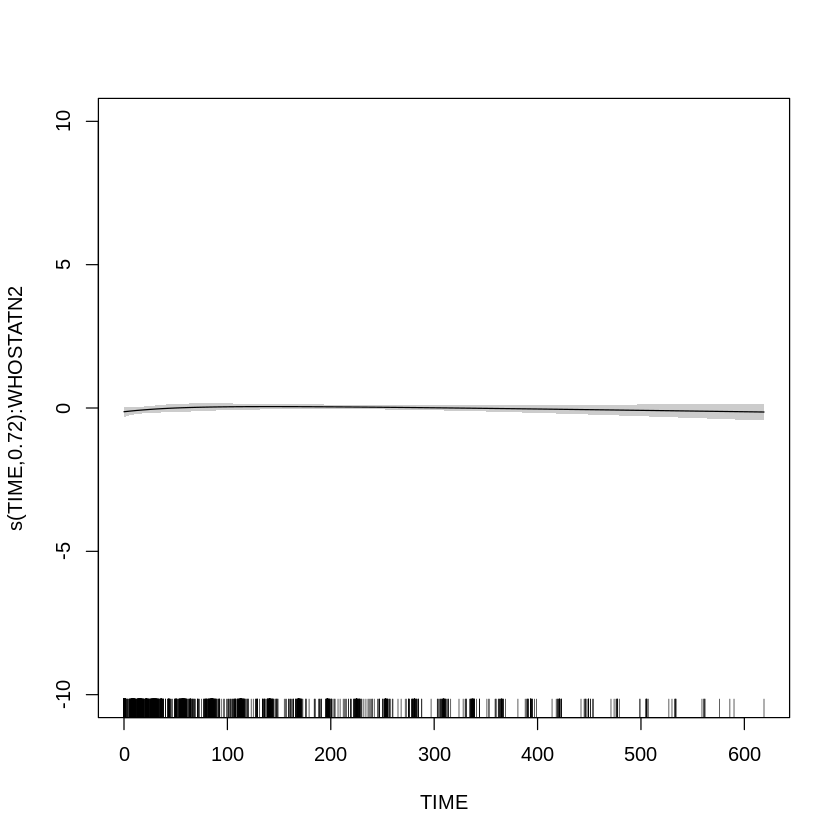

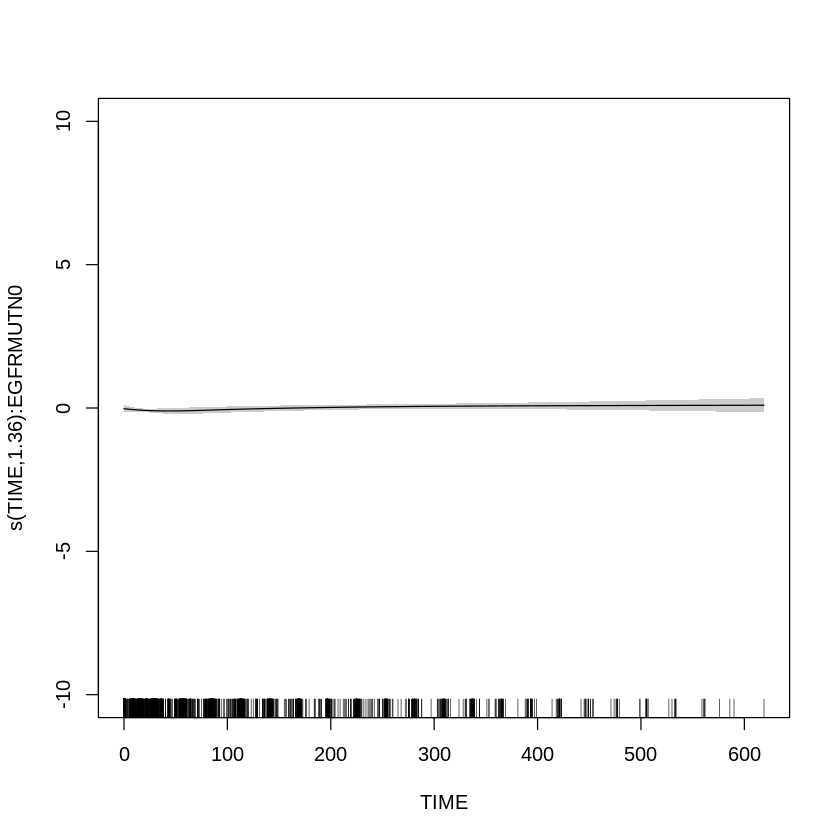

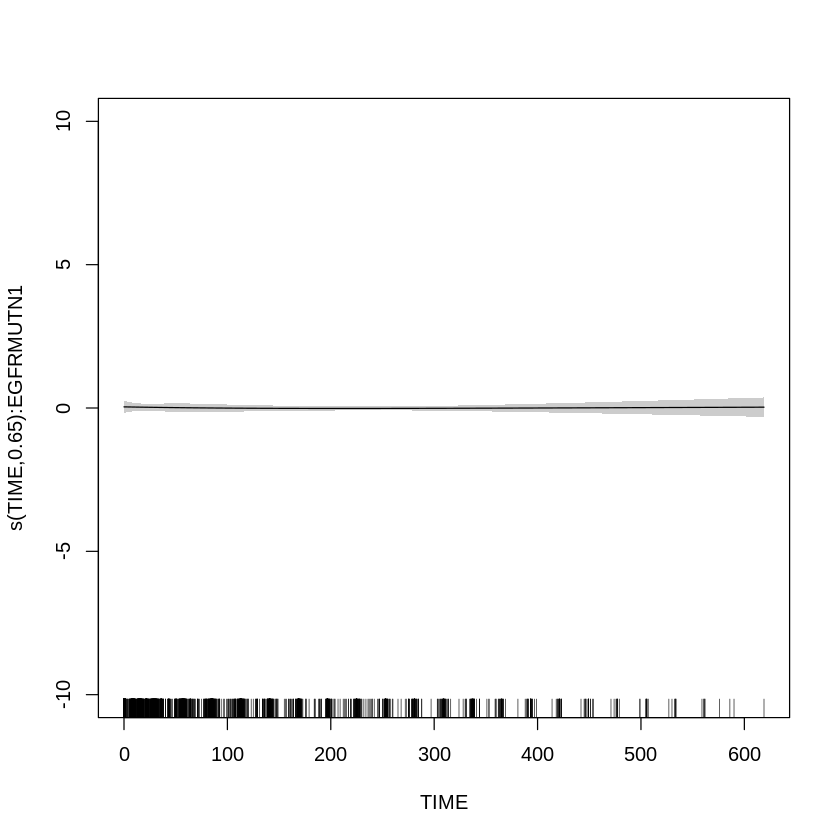

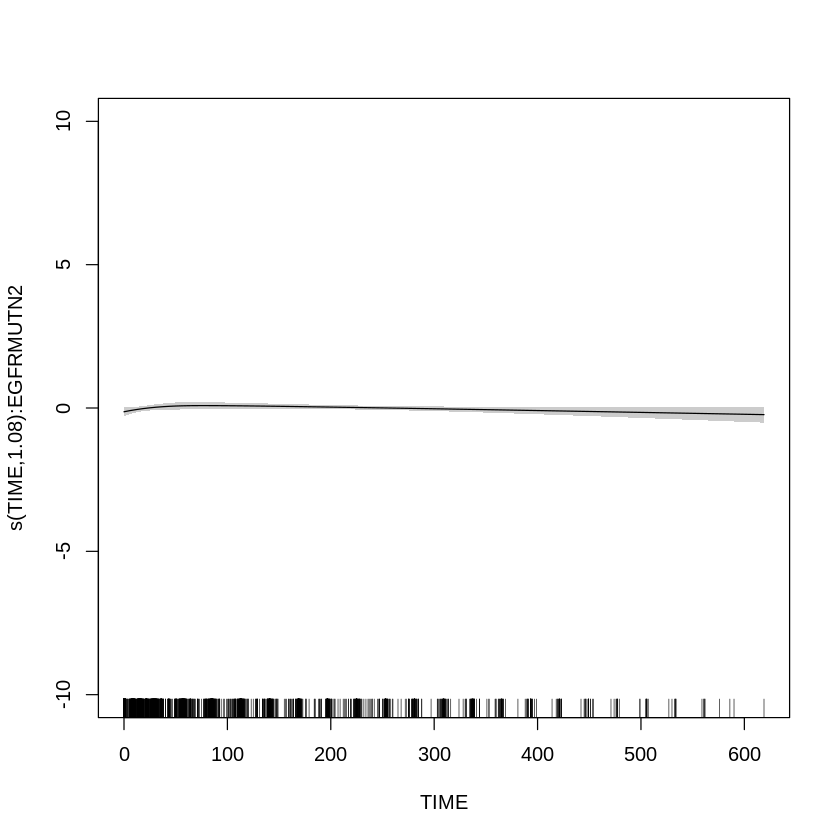

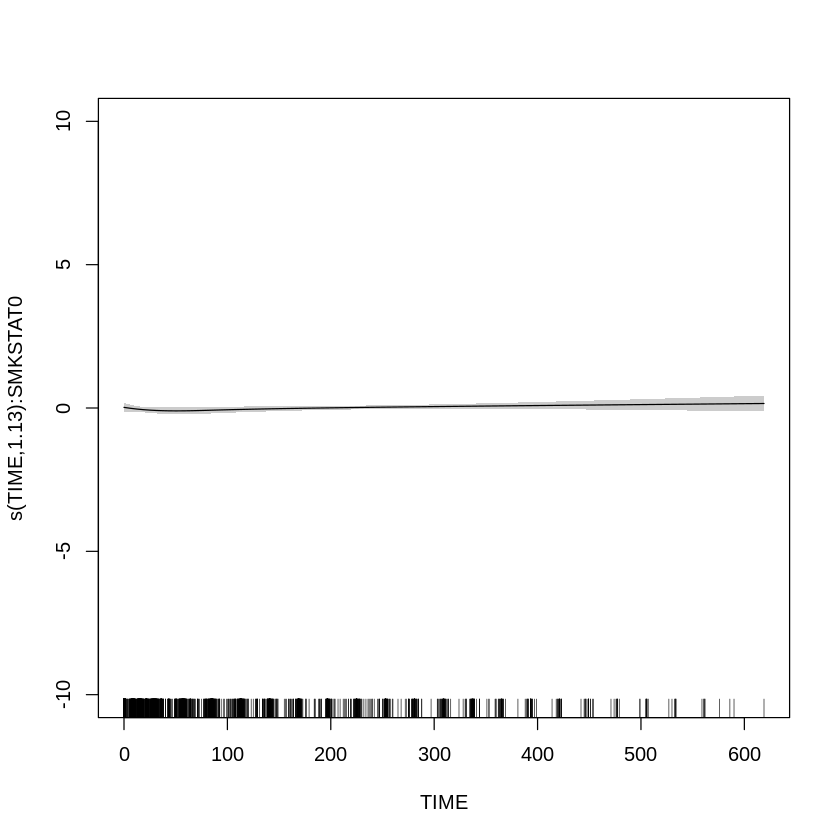

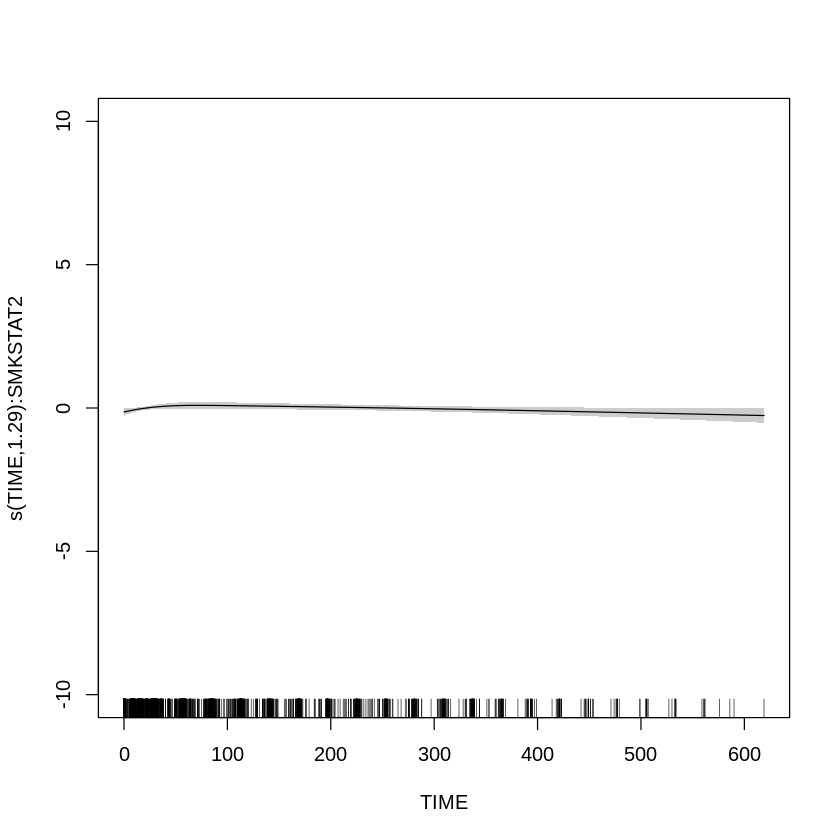

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           WHOSTATN, data = dfLDH, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)
(Intercept)  0.02531    0.03643   0.695    0.487
WHOSTATN1    0.05442    0.04654   1.169    0.242
WHOSTATN2    0.12553    0.08015   1.566    0.117

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.1661      9 0.081  0.31158    
s(TIME):WHOSTATN1 1.2577      9 0.089  0.24821    
s(TIME):WHOSTATN2 0.7236      8 0.253  0.02442 *  
s(TIME):EGFRMUTN0 1.3605      9 0.521 8.53e-05 ***
s(TIME):EGFRMUTN1 0.6488      8 0.035  0.60336    
s(TIME):EGFRMUTN2 1.0823      8 0.367  0.00699 ** 
s(TIME):SMKSTAT0  1.1265      9 0.316  0.00506 ** 
s(TIME):SMKSTAT2  1.2944      9 0.481 3.90e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + WHOSTATN

Parametric Terms:
         df    F p-value
WHOSTATN  2 1.46   0.232

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.1661 9.0000 0.081  0.31158
s(TIME):WHOSTATN1 1.2577 9.0000 0.089  0.24821
s(TIME):WHOSTATN2 0.7236 8.0000 0.253  0.02442
s(TIME):EGFRMUTN0 1.3605 9.0000 0.521 8.53e-05
s(TIME):EGFRMUTN1 0.6488 8.0000 0.035  0.60336
s(TIME):EGFRMUTN2 1.0823 8.0000 0.367  0.00699
s(TIME):SMKSTAT0  1.1265 9.0000 0.316  0.00506
s(TIME):SMKSTAT2  1.2944 9.0000 0.481 3.90e-05

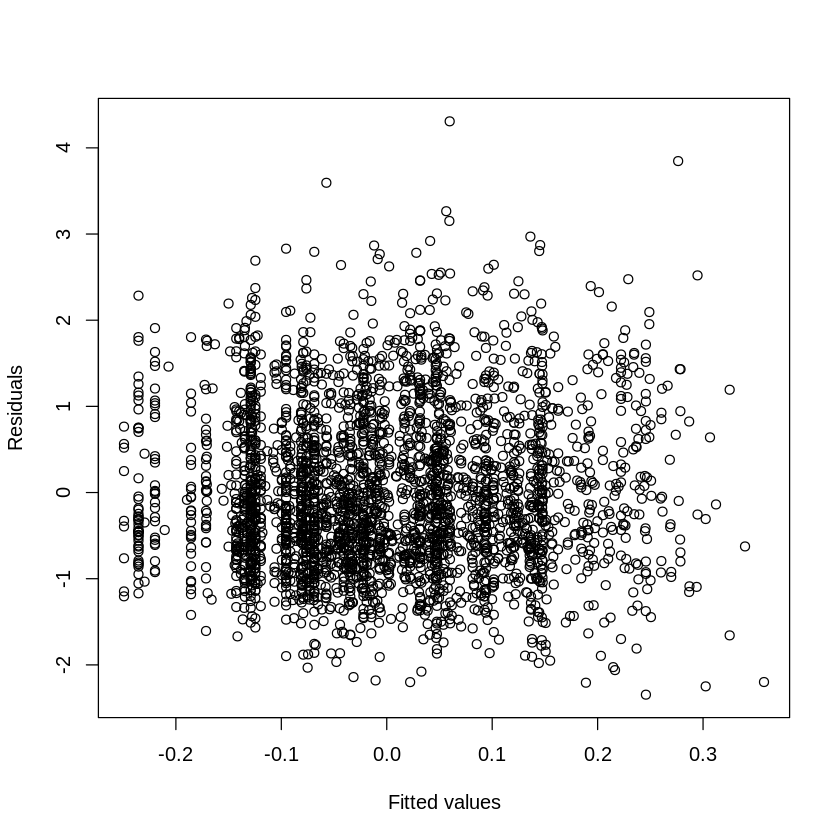

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 12 iterations.
Gradient range [-0.001848785,0.0004335257]
(score 4167.864 & scale 0.8533351).
Hessian positive definite, eigenvalue range [0.0001586515,1551.505].
Model rank =  46 / 46 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):EGFRMUTN0 9.000 1.496    0.98    0.19
s(TIME):EGFRMUTN1 9.000 0.743    0.98    0.17
s(TIME):EGFRMUTN2 9.000 1.198    0.98    0.17
s(TIME):SMKSTAT0  9.000 1.278    0.98    0.22
s(TIME):SMKSTAT2  9.000 1.472    0.98    0.21


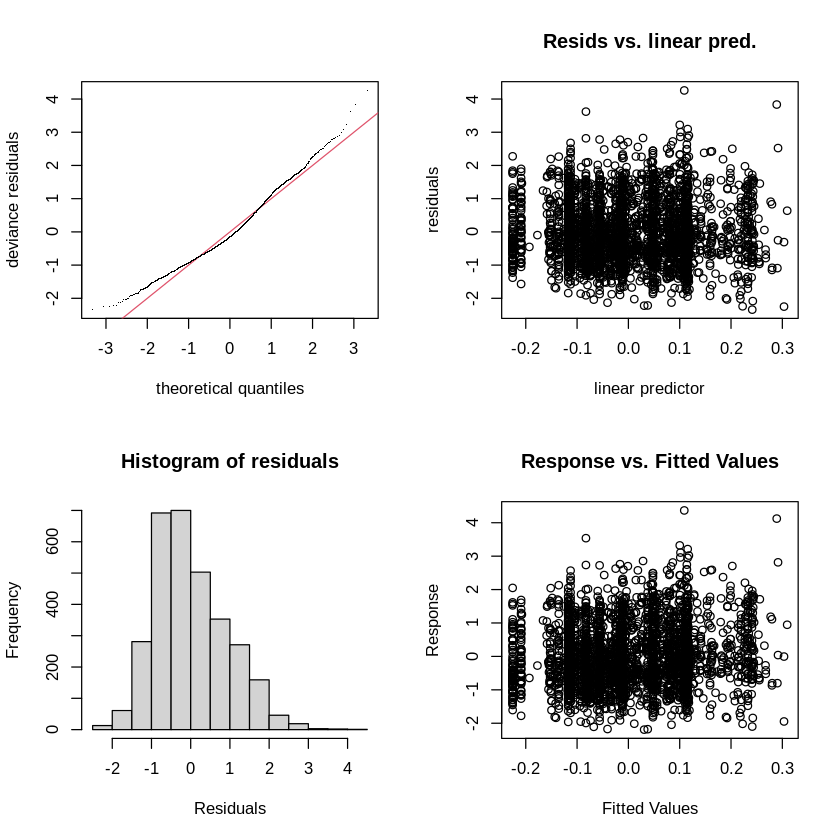

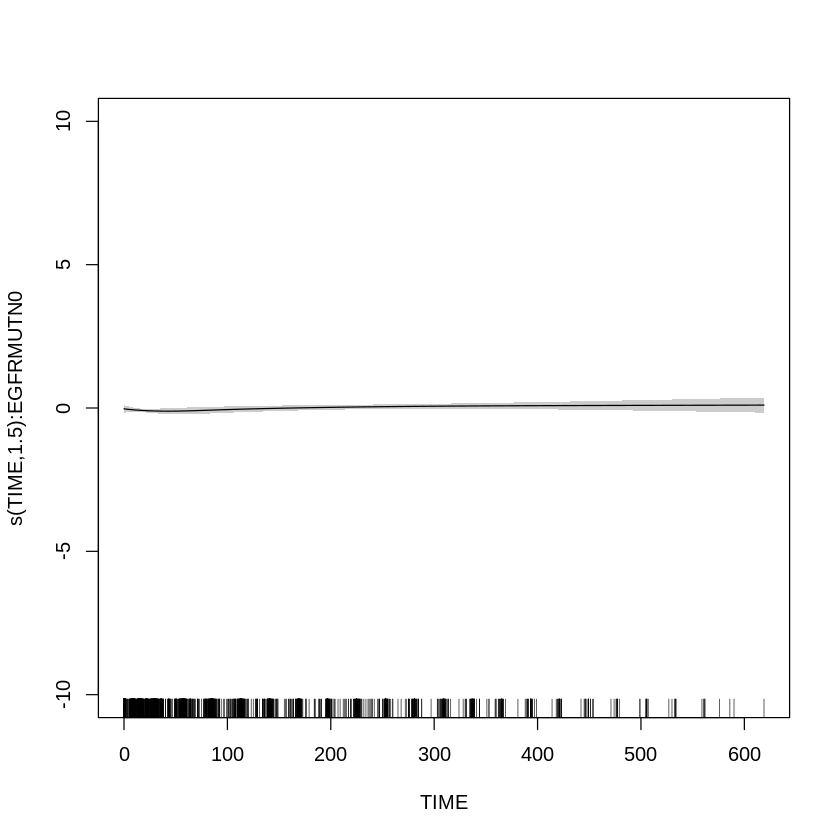

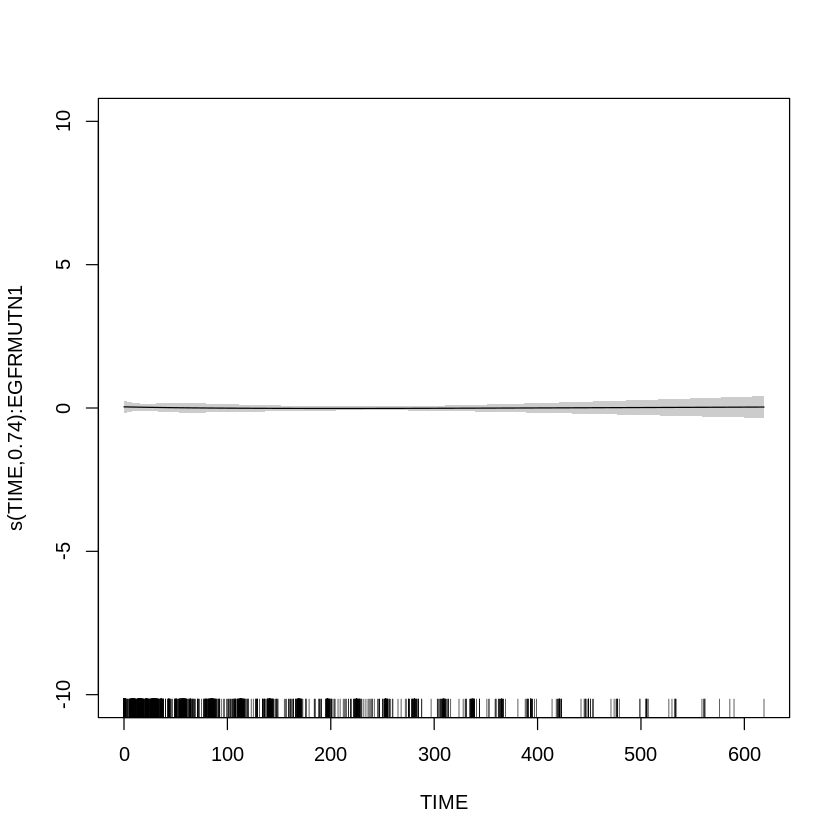

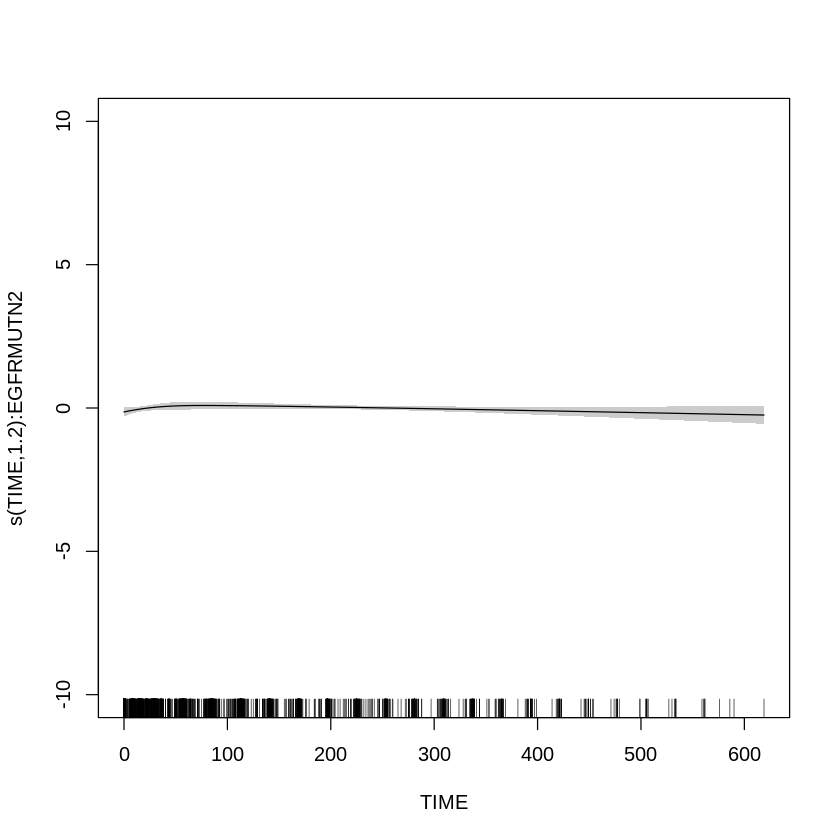

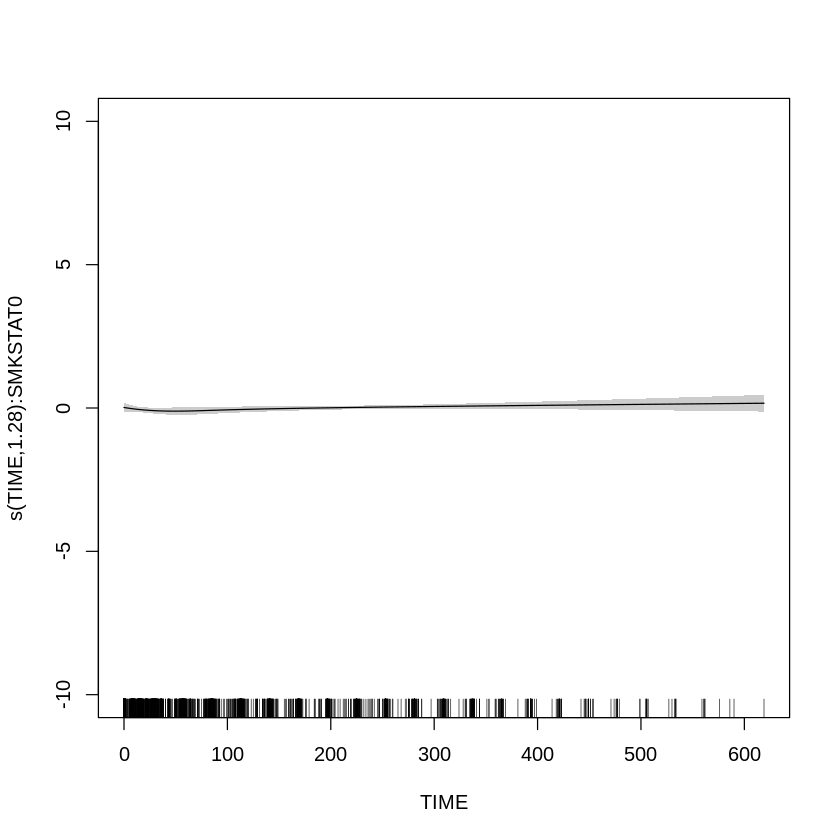

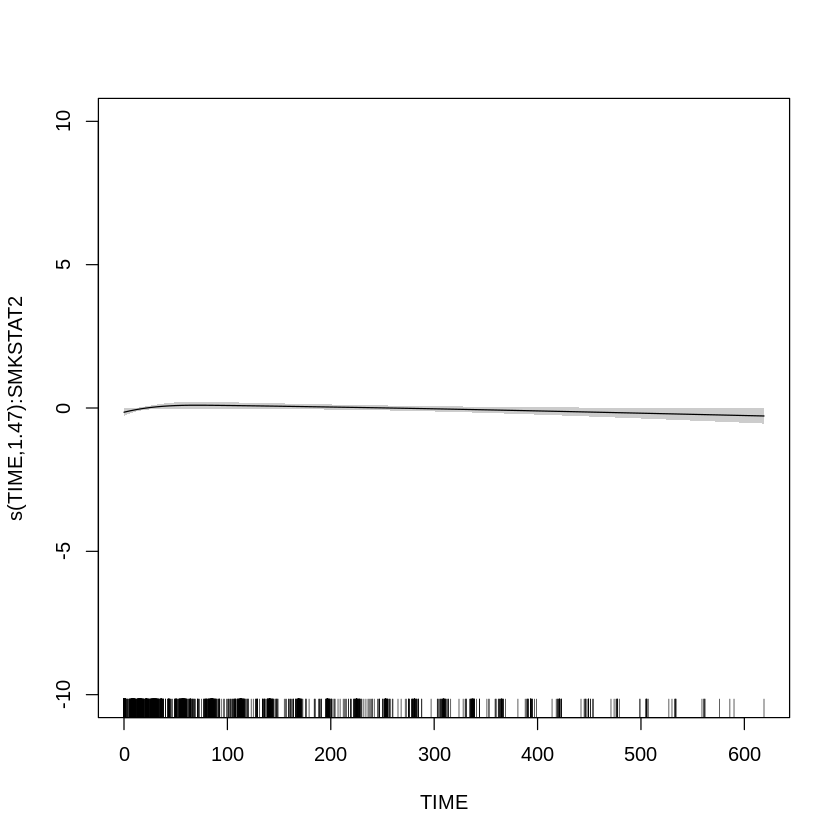

In [ ]:
ct1 <- gam(norm~s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1), data = dfLDH, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.05971    0.02335   2.557   0.0106 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):EGFRMUTN0 1.4964      9 0.633 3.31e-05 ***
s(TIME):EGFRMUTN1 0.7426      8 0.033 0.656699    
s(TIME):EGFRMUTN2 1.1980      8 0.363 0.013025 *  
s(TIME):SMKSTAT0  1.2781      9 0.356 0.009383 ** 
s(TIME):SMKSTAT2  1.4722      9 0.518 0.000219 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.016   Deviance explained =  1.8%
-REML = 4167.9  Scale est. = 0.85334   n = 3104


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):EGFRMUTN0 1.4964 9.0000 0.633 3.31e-05
s(TIME):EGFRMUTN1 0.7426 8.0000 0.033 0.656699
s(TIME):EGFRMUTN2 1.1980 8.0000 0.363 0.013025
s(TIME):SMKSTAT0  1.2781 9.0000 0.356 0.009383
s(TIME):SMKSTAT2  1.4722 9.0000 0.518 0.000219

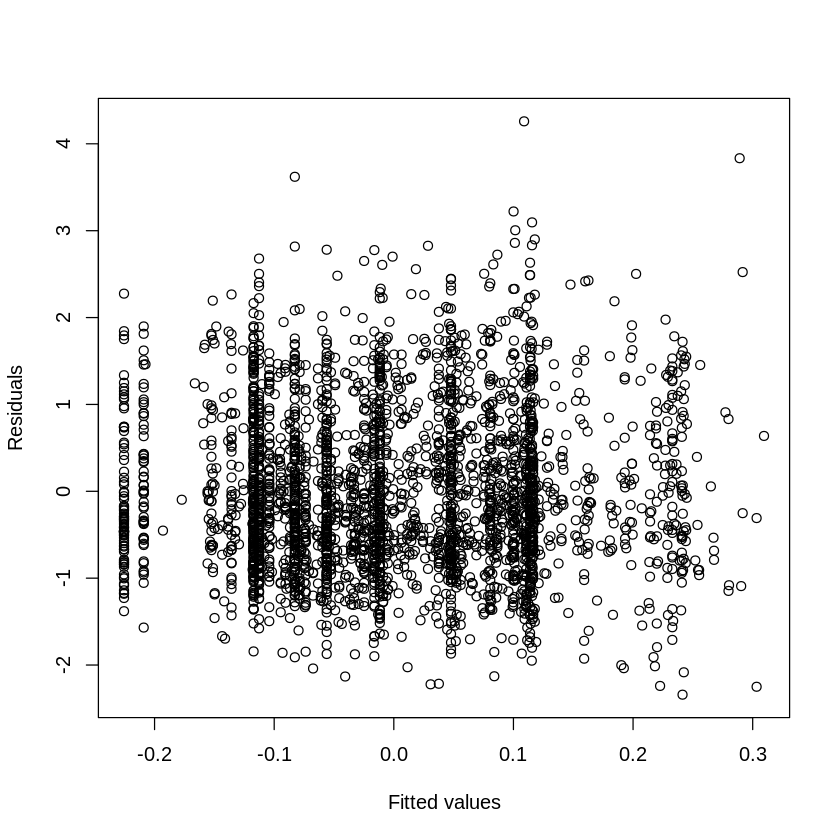

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# NLR

In [ ]:
dfNLR <- make_df(data, 'NLR')


Method: REML   Optimizer: outer newton
full convergence after 19 iterations.
Gradient range [-7.71721e-05,0.000180331]
(score 4024.249 & scale 0.8379422).
Hessian positive definite, eigenvalue range [7.679571e-09,1501.506].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.262       1    0.53
s(TIME):WHOSTATN1 9.000 1.326       1    0.56
s(TIME):WHOSTATN2 9.000 0.821       1    0.57
s(TIME):EGFRMUTN0 9.000 1.353       1    0.59
s(TIME):EGFRMUTN1 9.000 0.723       1    0.55
s(TIME):EGFRMUTN2 9.000 0.924       1    0.46
s(TIME):SMKSTAT0  9.000 1.181       1    0.56
s(TIME):SMKSTAT2  9.000 1.297       1    0.55


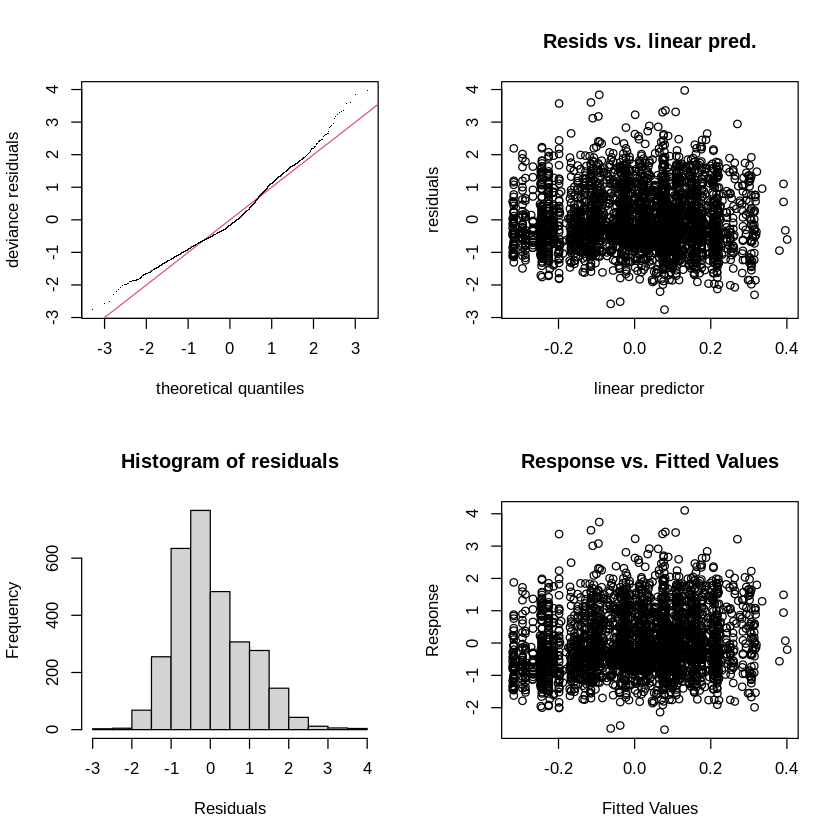

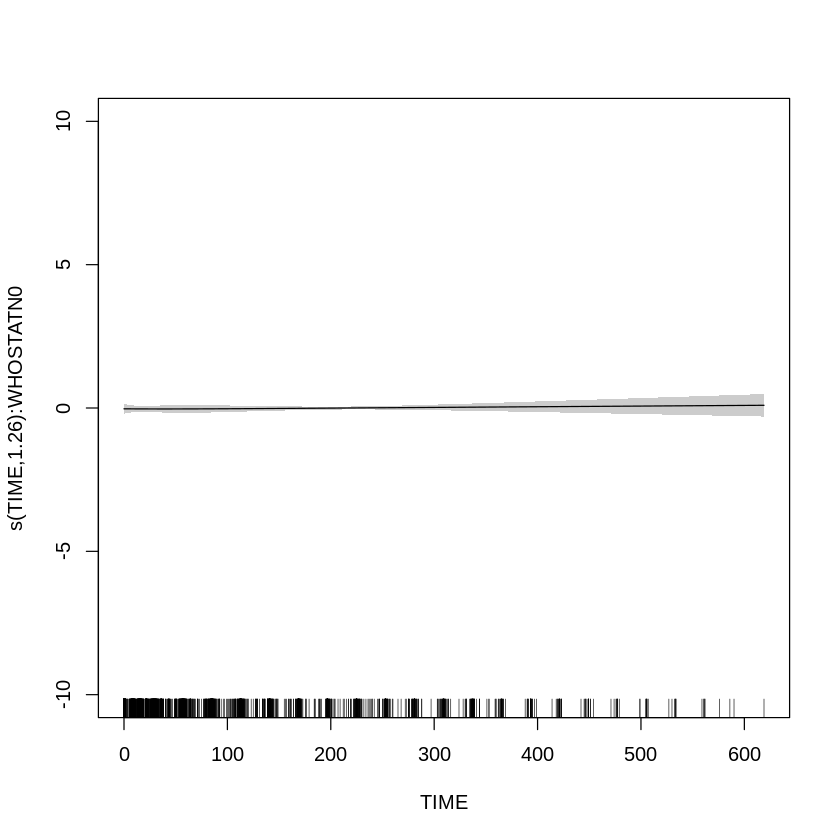

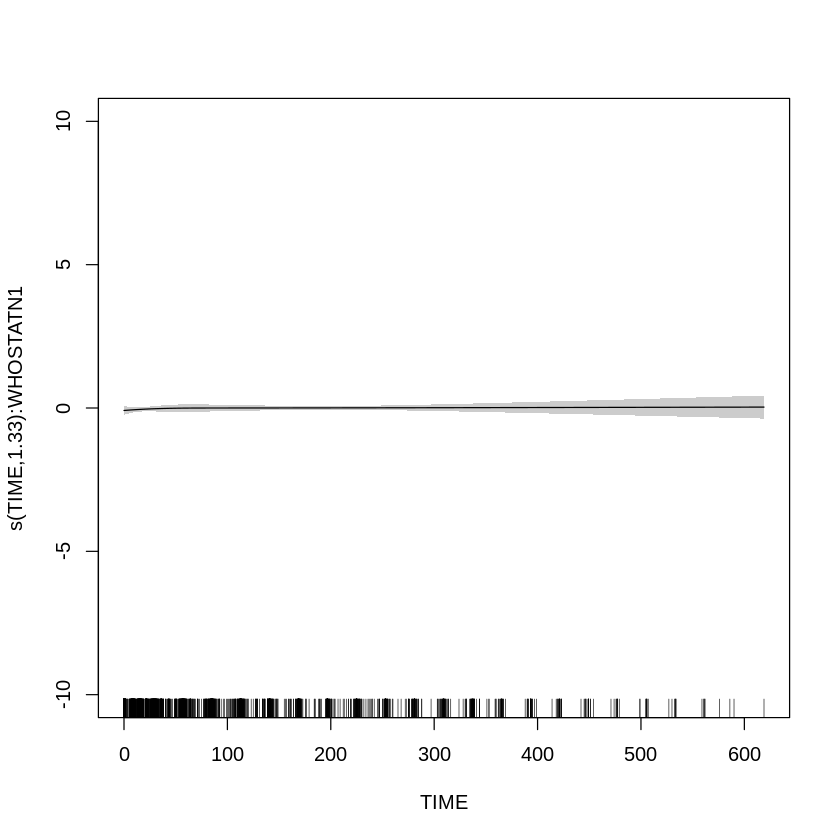

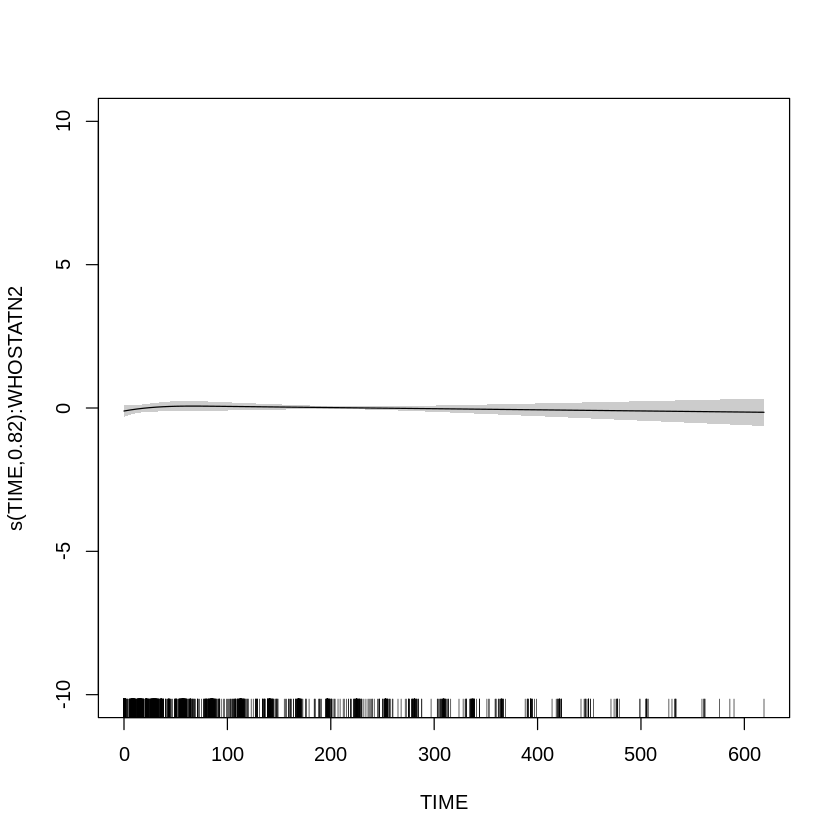

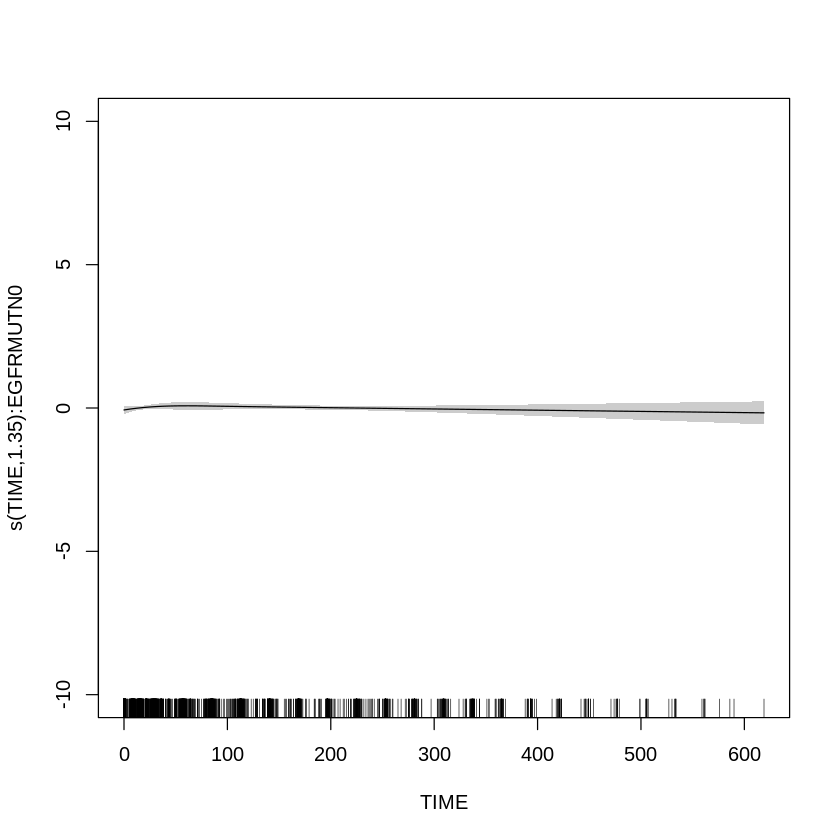

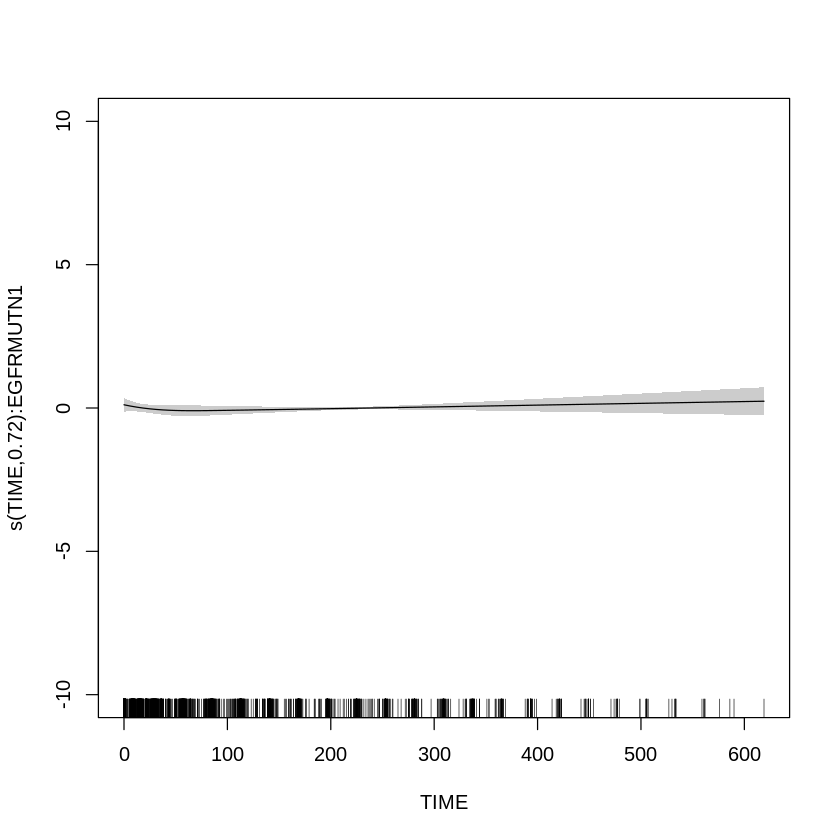

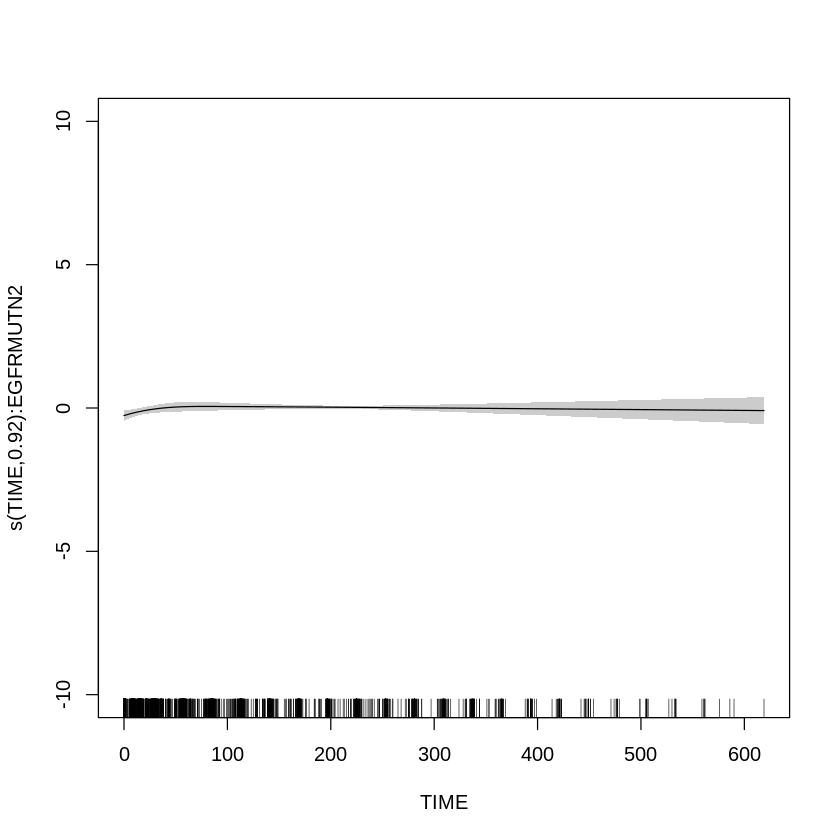

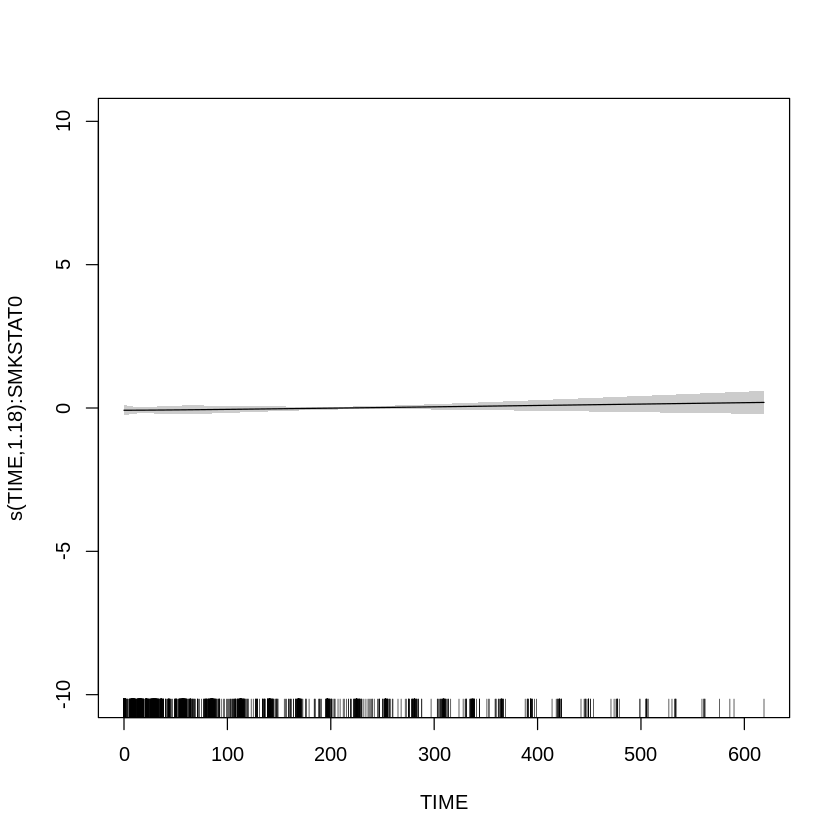

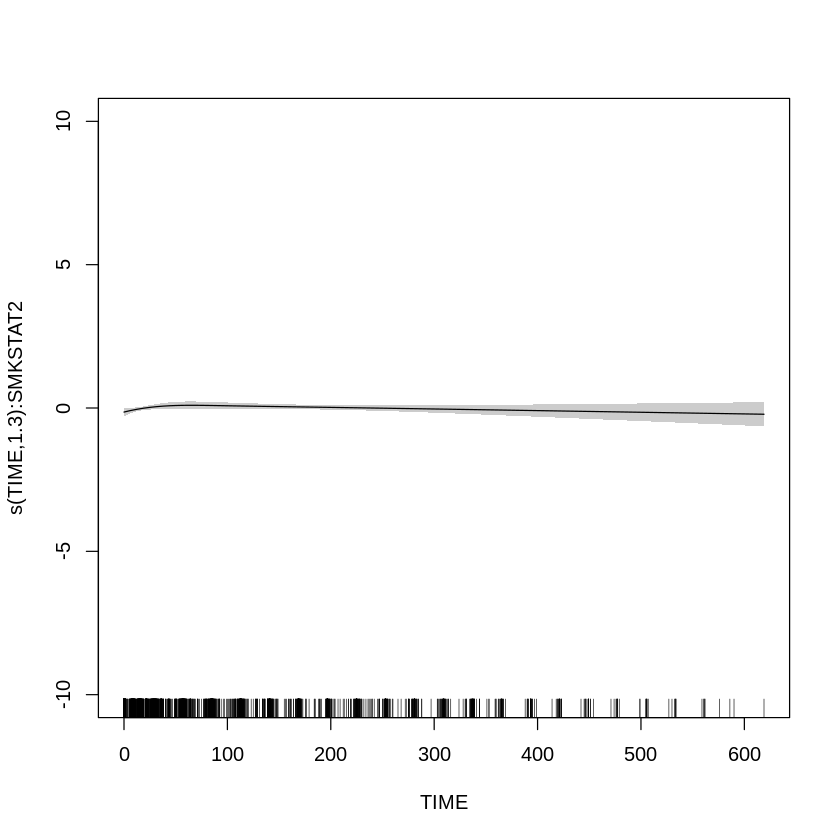

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfNLR, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
             Estimate Std. Error t value Pr(>|t|)
(Intercept)  0.038341   0.056546   0.678    0.498
SMKSTAT2    -0.013028   0.052813  -0.247    0.805
EGFRMUTN1   -0.007685   0.081305  -0.095    0.925
EGFRMUTN2    0.121221   0.077591   1.562    0.118
WHOSTATN1    0.027329   0.051518   0.530    0.596
WHOSTATN2    0.042950   0.091448   0.470    0.639

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.2616      9 0.054 0.440935    
s(TIME):WHOSTATN1 1.3262      9 0.126 0.110308    
s(TIME):WHOSTATN2 0.8209      8 0.174 0.087432 .  
s(TIME):EGFRMUTN0 1.3532      9 0.182 0.032507 *  
s(TIME):EGFRMUTN1 0.7232      8 0.194 0.067807 .  
s(TIME):EGFRMUTN2 0


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.061   0.805
EGFRMUTN  2 1.275   0.279
WHOSTATN  2 0.190   0.827

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.2616 9.0000 0.054 0.440935
s(TIME):WHOSTATN1 1.3262 9.0000 0.126 0.110308
s(TIME):WHOSTATN2 0.8209 8.0000 0.174 0.087432
s(TIME):EGFRMUTN0 1.3532 9.0000 0.182 0.032507
s(TIME):EGFRMUTN1 0.7232 8.0000 0.194 0.067807
s(TIME):EGFRMUTN2 0.9242 7.0000 0.991 3.27e-06
s(TIME):SMKSTAT0  1.1808 9.0000 0.238 0.014077
s(TIME):SMKSTAT2  1.2970 9.0000 0.386 0.000221

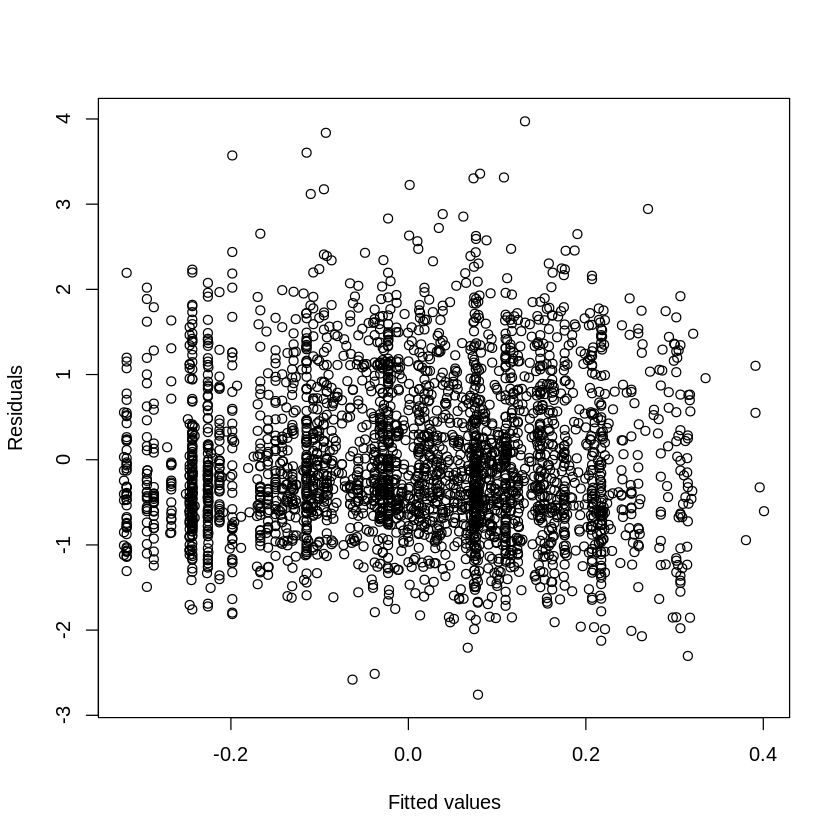

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 13 iterations.
Gradient range [-0.01315741,0.008454401]
(score 4015.511 & scale 0.8292504).
Hessian positive definite, eigenvalue range [9.088963e-07,1502.523].
Model rank =  49 / 49 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value
s(TIME):EGFRMUTN0 9.00 3.10       1    0.56
s(TIME):EGFRMUTN1 9.00 1.86       1    0.55
s(TIME):EGFRMUTN2 9.00 2.09       1    0.49
s(TIME):SMKSTAT0  9.00 2.69       1    0.55
s(TIME):SMKSTAT2  9.00 3.00       1    0.54


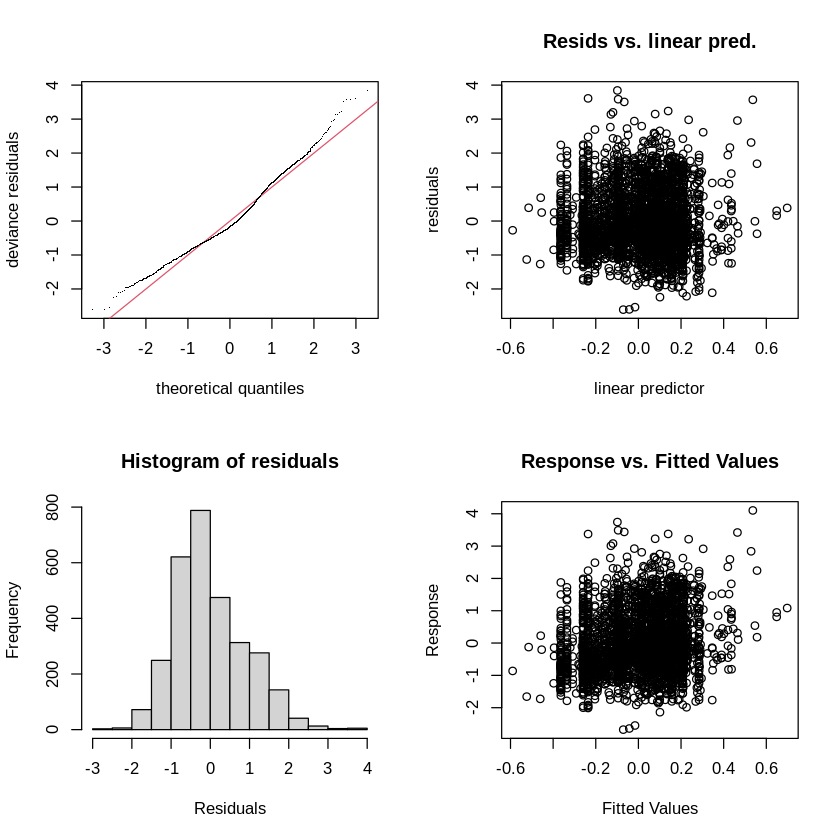

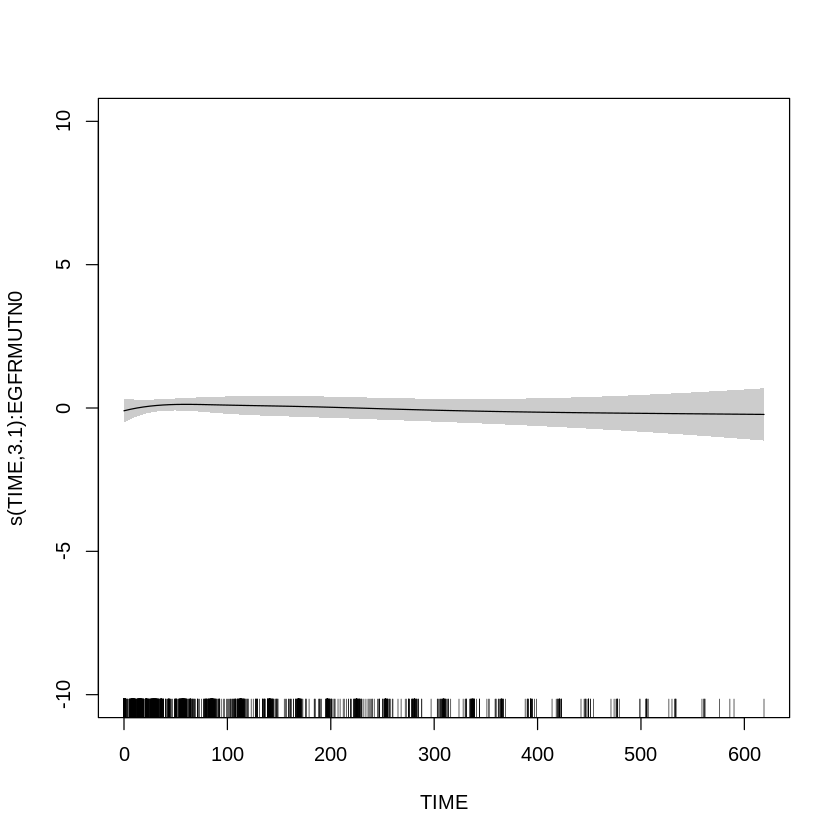

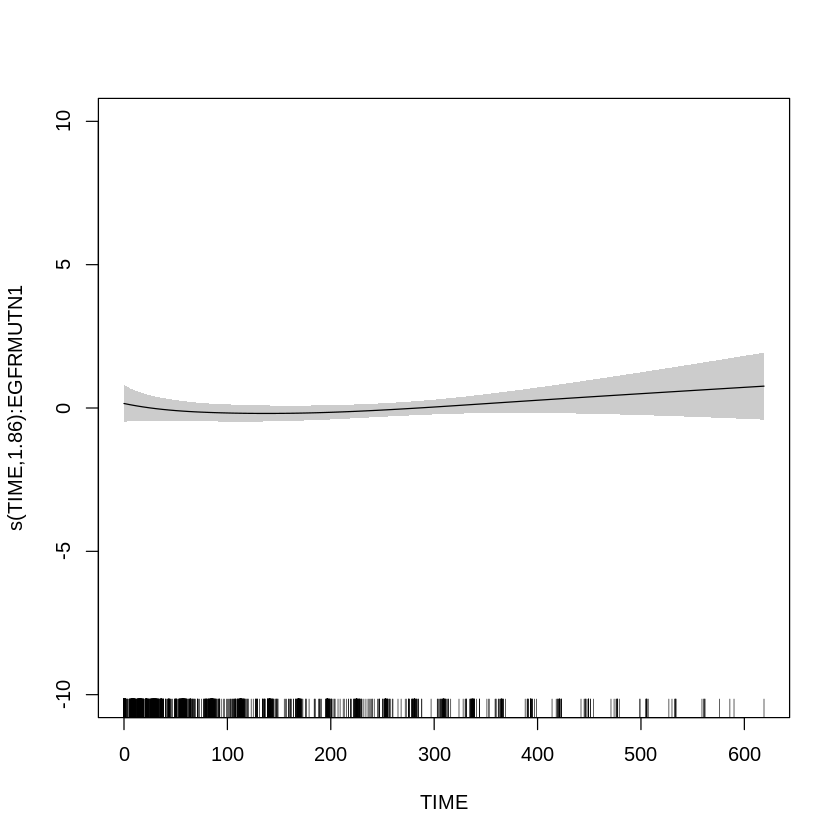

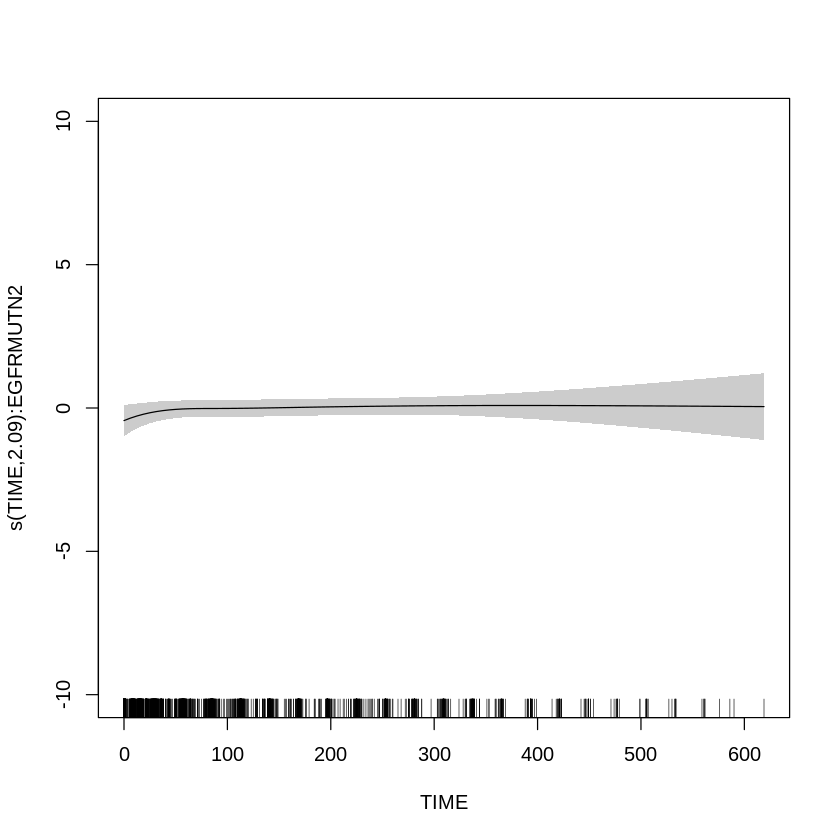

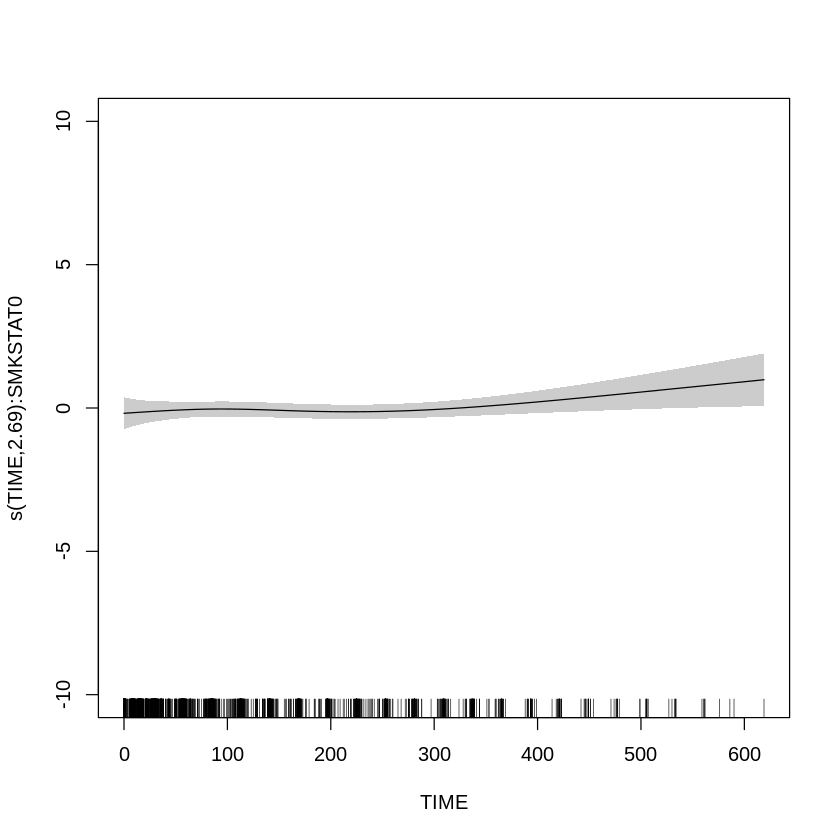

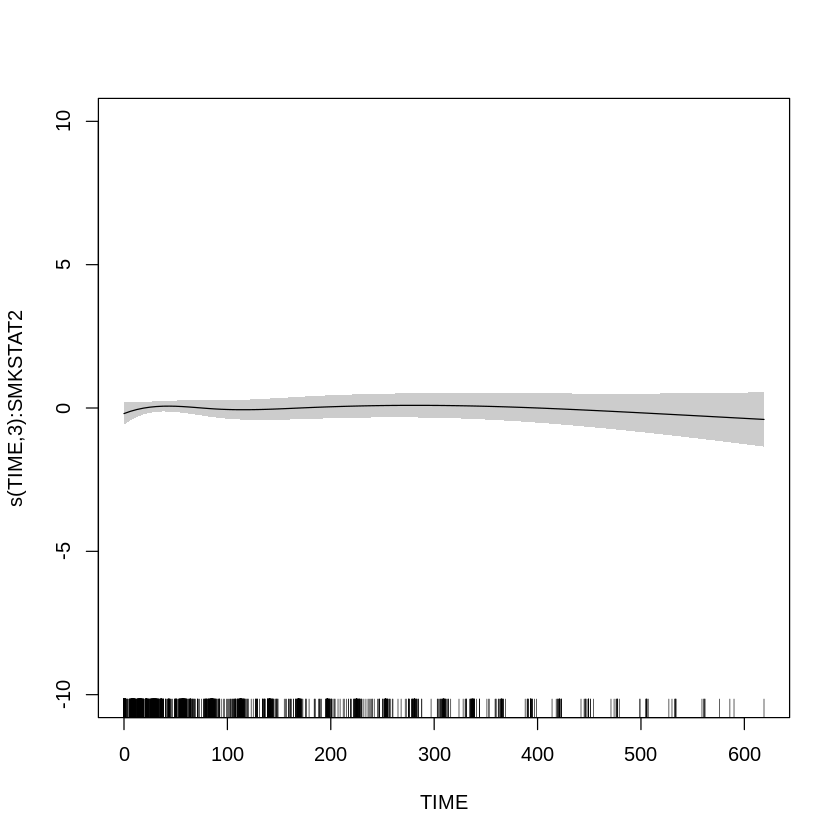

In [ ]:
ct1 <- gam(norm~s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN, data = dfNLR, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.07756    0.04384   1.769   0.0770 .
SMKSTAT2    -0.04502    0.05449  -0.826   0.4088  
EGFRMUTN1    0.03390    0.09201   0.368   0.7126  
EGFRMUTN2    0.23657    0.10110   2.340   0.0194 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value    
s(TIME):EGFRMUTN0 3.104      9 0.204  0.09484 .  
s(TIME):EGFRMUTN1 1.855      7 0.327  0.02812 *  
s(TIME):EGFRMUTN2 2.095      8 0.492  0.00195 ** 
s(TIME):SMKSTAT0  2.690      9 1.044 1.59e-06 ***
s(TIME):SMKSTAT2  3.004      9 1.075 4.97e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0395   Deviance explained = 4.45%
-RE


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.682  0.4088
EGFRMUTN  2 2.749  0.0641

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value
s(TIME):EGFRMUTN0 3.104  9.000 0.204  0.09484
s(TIME):EGFRMUTN1 1.855  7.000 0.327  0.02812
s(TIME):EGFRMUTN2 2.095  8.000 0.492  0.00195
s(TIME):SMKSTAT0  2.690  9.000 1.044 1.59e-06
s(TIME):SMKSTAT2  3.004  9.000 1.075 4.97e-07

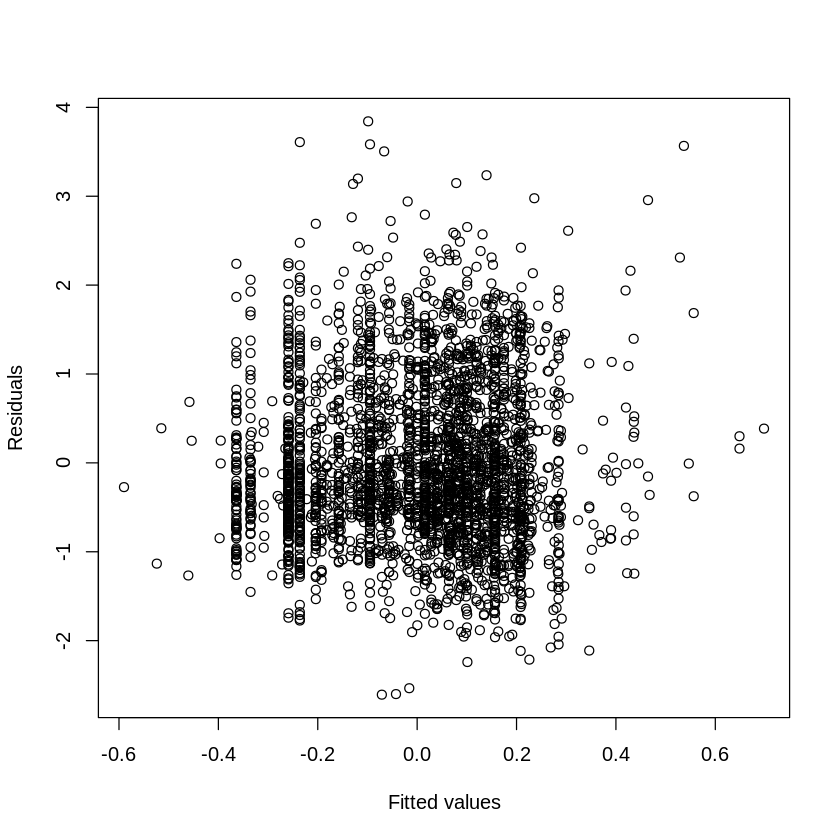

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 13 iterations.
Gradient range [-0.00219269,0.0007531528]
(score 4013.852 & scale 0.8293802).
Hessian positive definite, eigenvalue range [2.17907e-05,1503.012].
Model rank =  48 / 48 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value
s(TIME):EGFRMUTN0 9.00 3.08       1    0.59
s(TIME):EGFRMUTN1 9.00 1.83       1    0.52
s(TIME):EGFRMUTN2 9.00 2.07       1    0.54
s(TIME):SMKSTAT0  9.00 2.67       1    0.56
s(TIME):SMKSTAT2  9.00 2.98       1    0.56


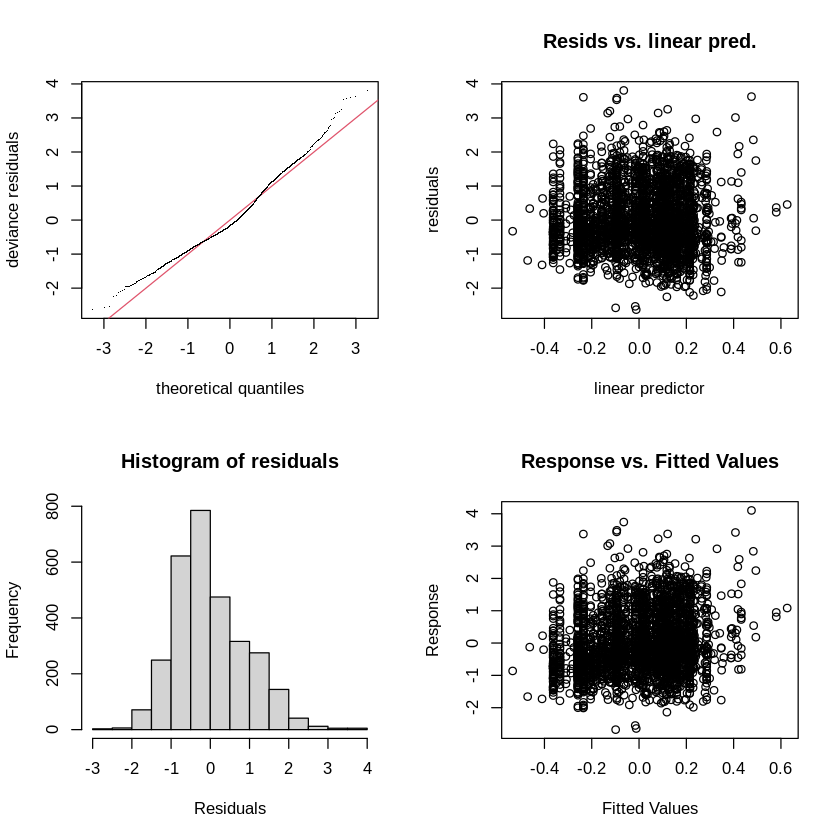

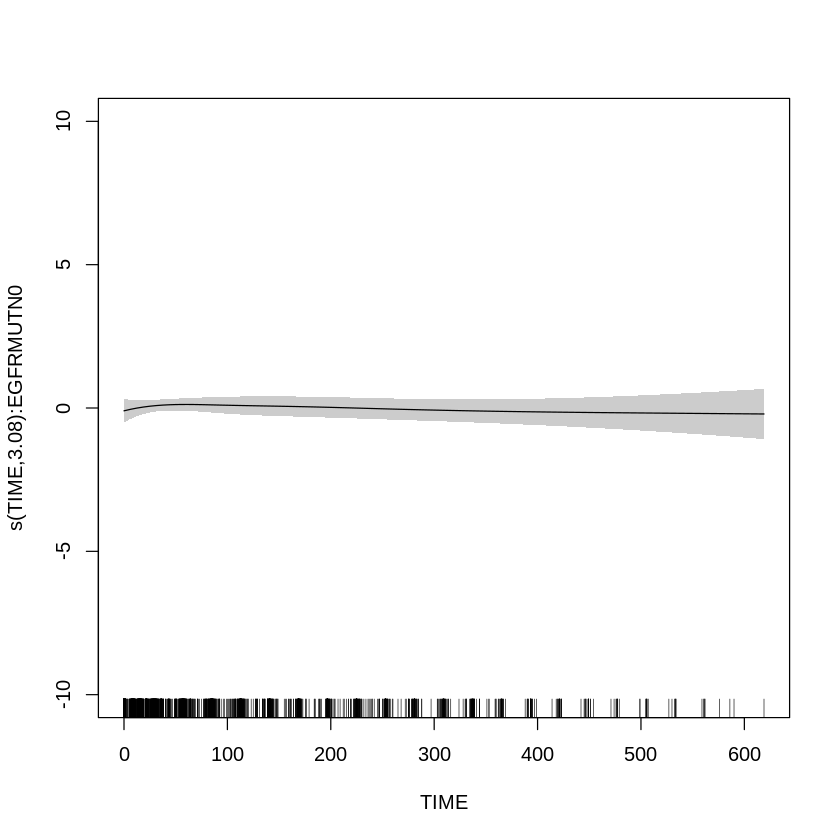

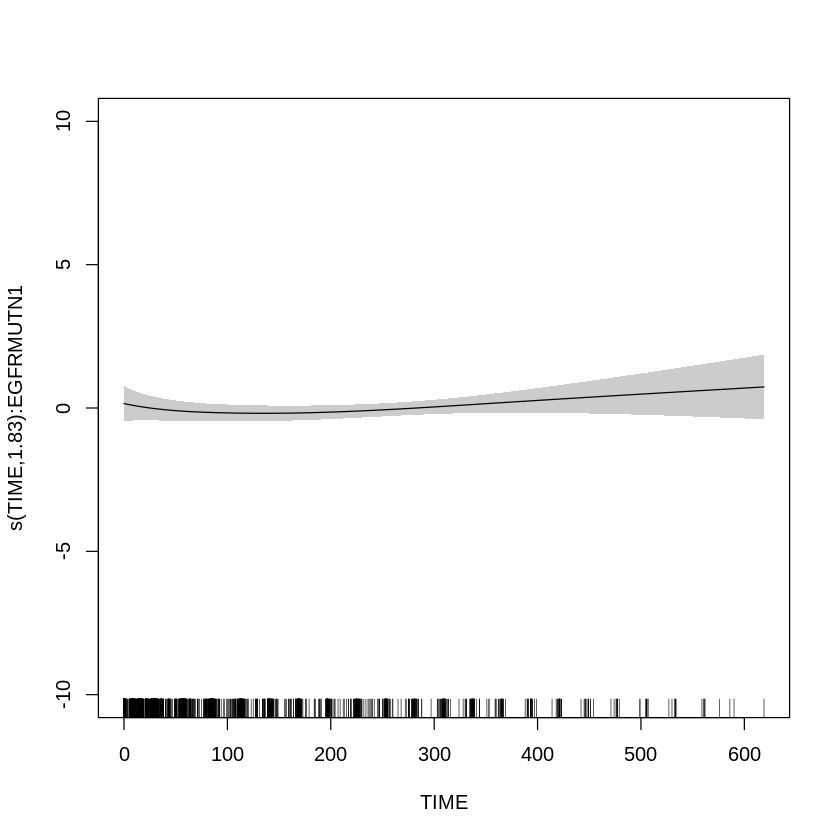

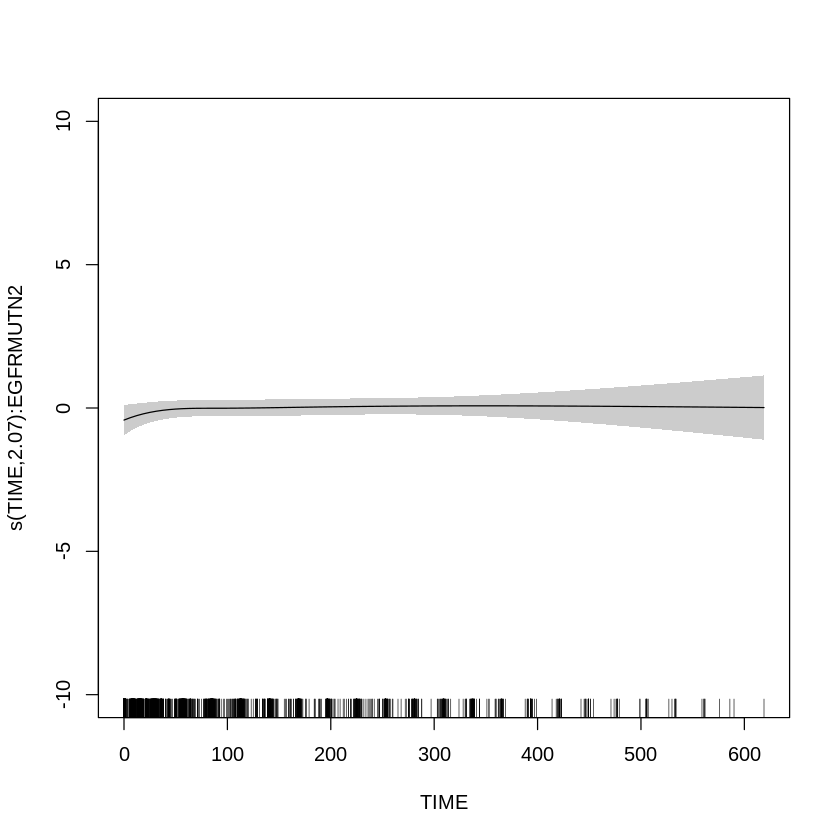

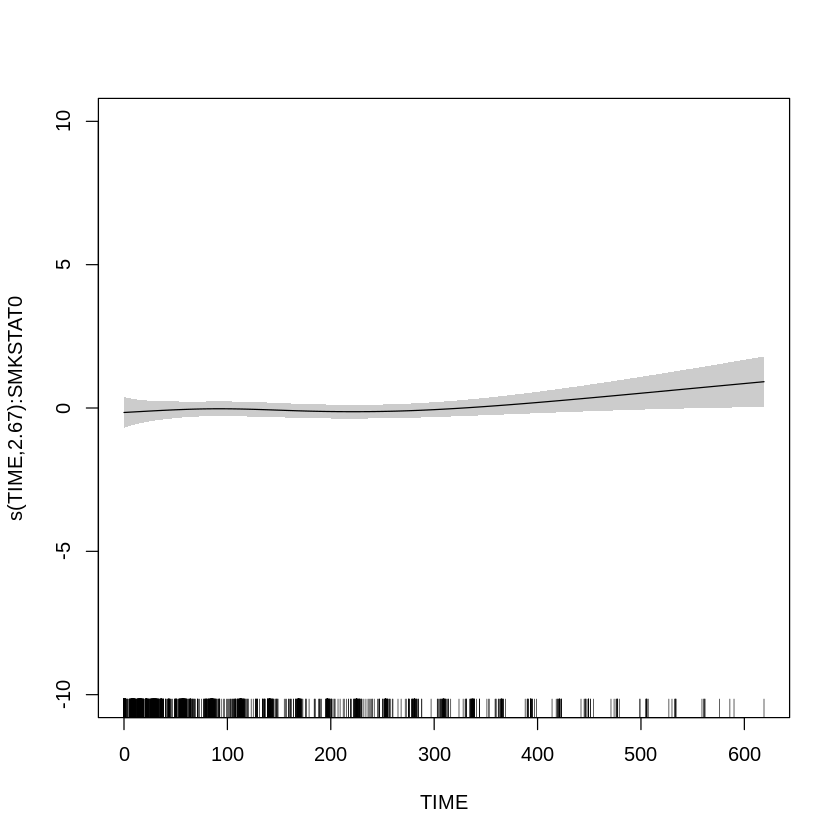

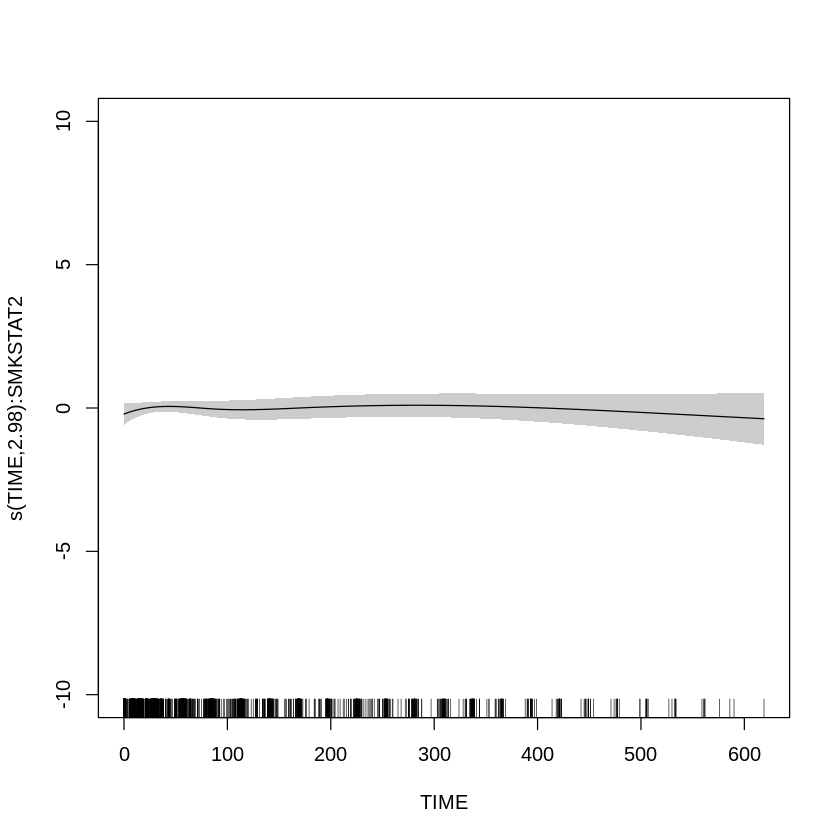

In [ ]:
ct1 <- gam(norm~s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
          EGFRMUTN, data = dfNLR, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + EGFRMUTN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.04995    0.02840   1.759   0.0787 .
EGFRMUTN1    0.03889    0.09051   0.430   0.6675  
EGFRMUTN2    0.21810    0.09870   2.210   0.0272 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value    
s(TIME):EGFRMUTN0 3.076      9 0.201  0.09896 .  
s(TIME):EGFRMUTN1 1.831      7 0.324  0.02945 *  
s(TIME):EGFRMUTN2 2.068      8 0.483  0.00207 ** 
s(TIME):SMKSTAT0  2.667      9 0.994 1.73e-06 ***
s(TIME):SMKSTAT2  2.979      9 1.080 1.13e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0394   Deviance explained =  4.4%
-REML = 4013.9  Scale est. = 0.82938   n = 3009


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1) + EGFRMUTN

Parametric Terms:
         df     F p-value
EGFRMUTN  2 2.456   0.086

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value
s(TIME):EGFRMUTN0 3.076  9.000 0.201  0.09896
s(TIME):EGFRMUTN1 1.831  7.000 0.324  0.02945
s(TIME):EGFRMUTN2 2.068  8.000 0.483  0.00207
s(TIME):SMKSTAT0  2.667  9.000 0.994 1.73e-06
s(TIME):SMKSTAT2  2.979  9.000 1.080 1.13e-06

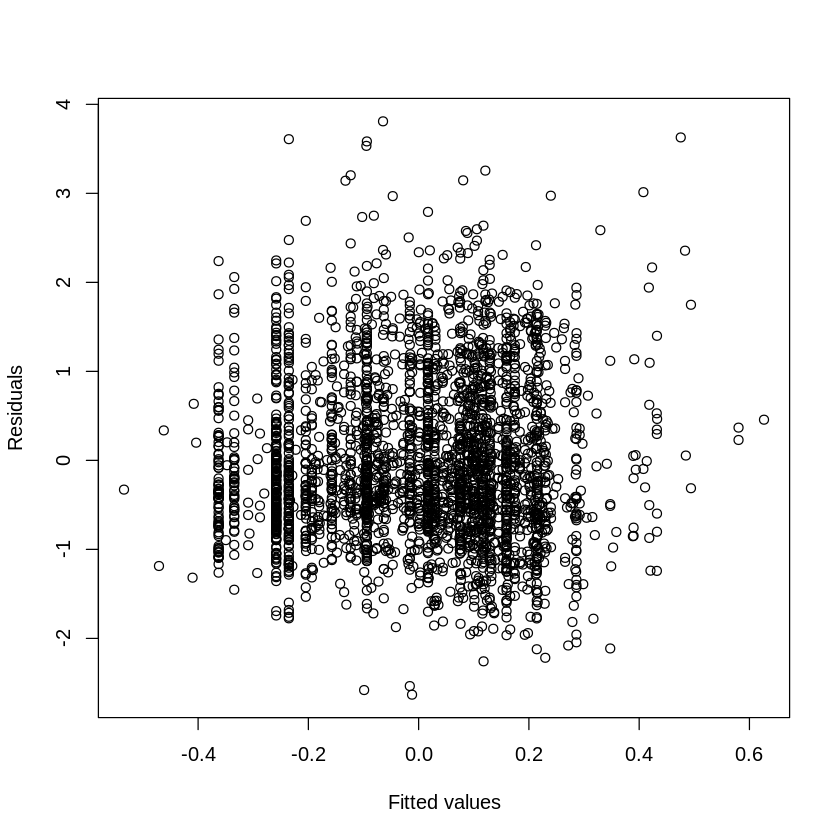

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# NEUT

In [ ]:
dfNEUT <- make_df(data, 'NEUT')


Method: REML   Optimizer: outer newton
full convergence after 11 iterations.
Gradient range [-0.01081692,0.007284613]
(score 4033.506 & scale 0.843229).
eigenvalue range [-7.278707e-16,1501.516].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.219       1    0.41
s(TIME):WHOSTATN1 9.000 1.274       1    0.46
s(TIME):WHOSTATN2 9.000 0.833       1    0.41
s(TIME):EGFRMUTN0 9.000 1.273       1    0.47
s(TIME):EGFRMUTN1 9.000 0.724       1    0.42
s(TIME):EGFRMUTN2 9.000 0.952       1    0.52
s(TIME):SMKSTAT0  9.000 1.137       1    0.38
s(TIME):SMKSTAT2  9.000 1.234       1    0.42


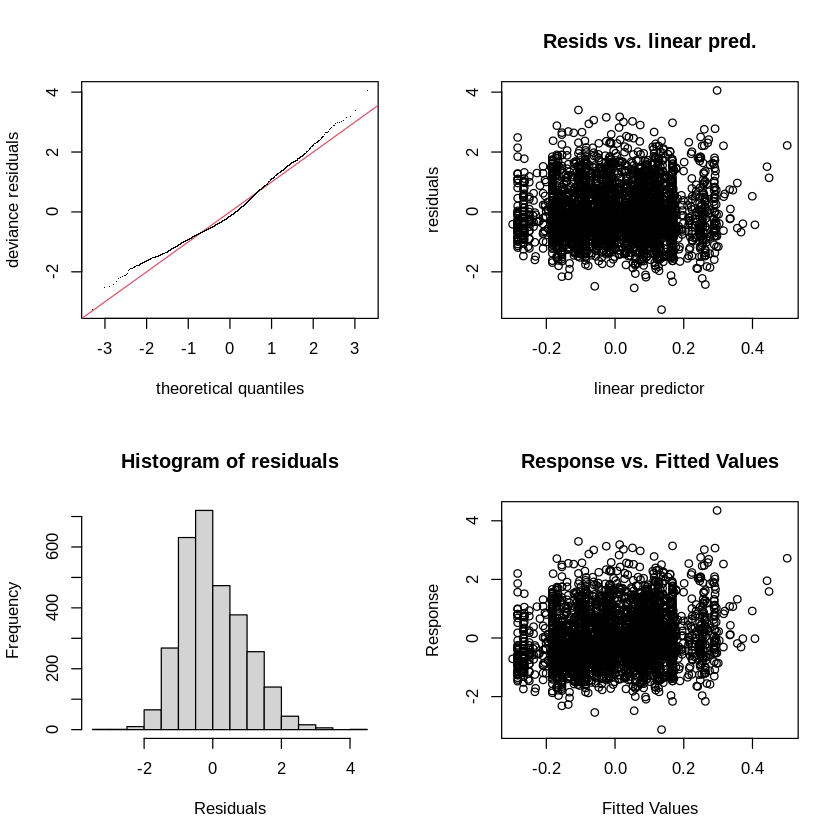

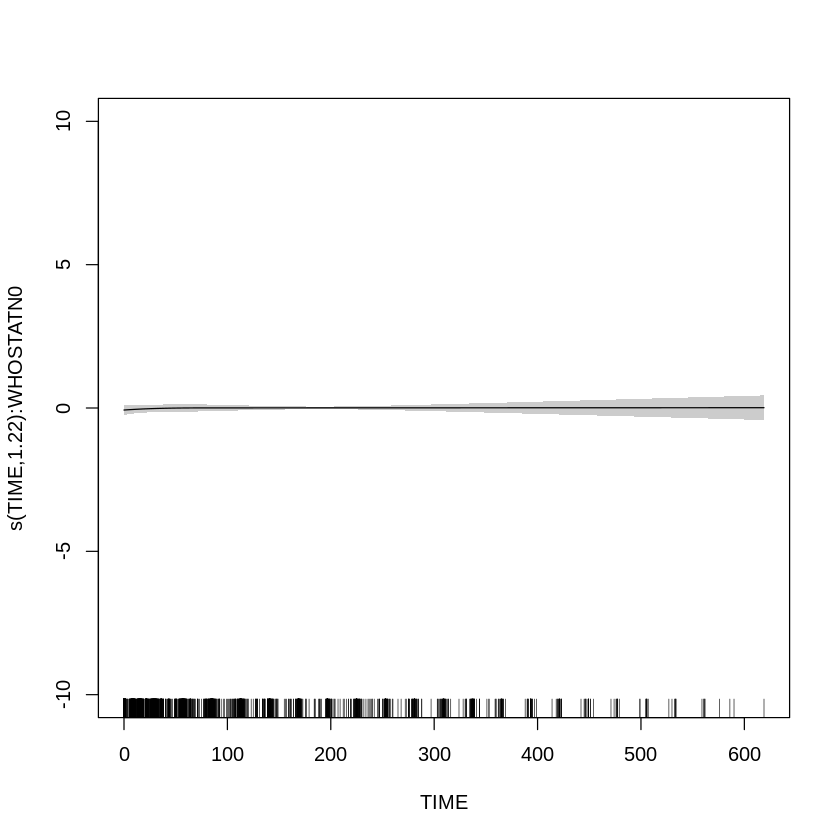

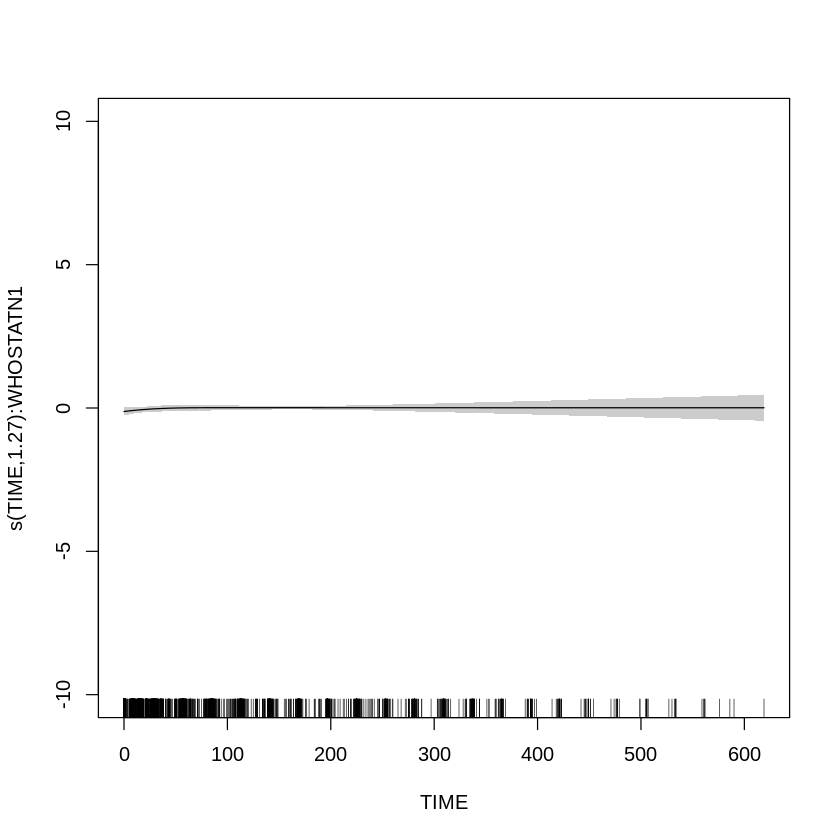

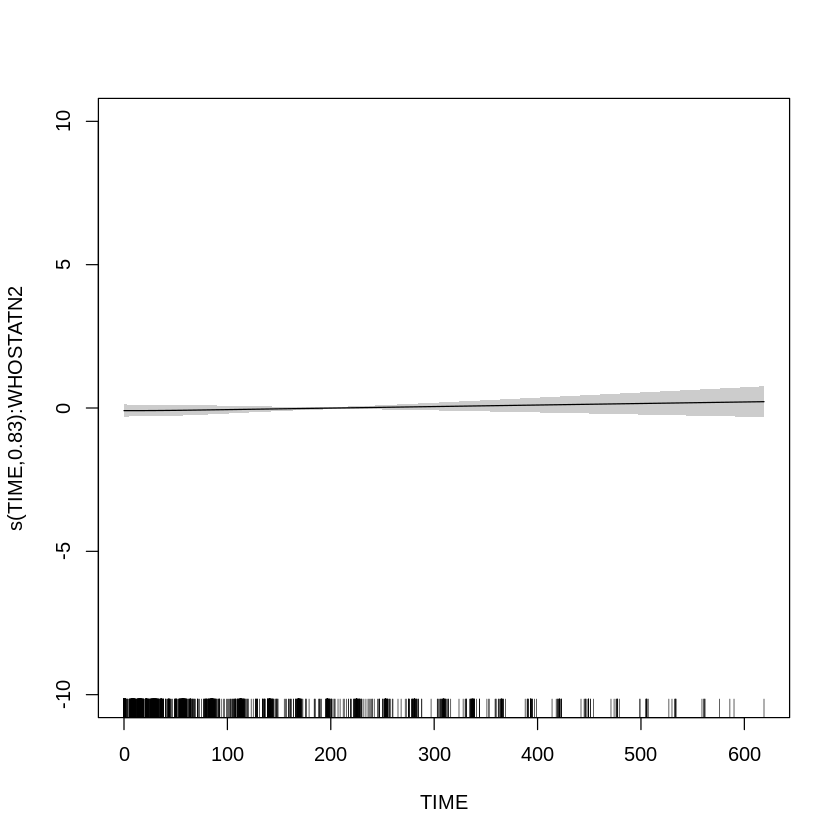

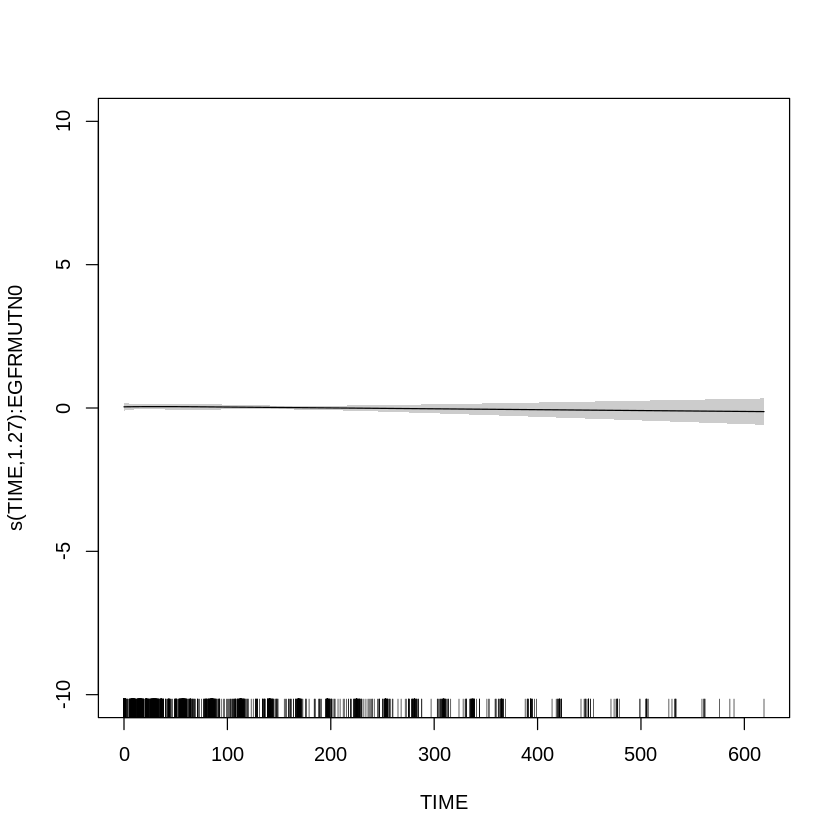

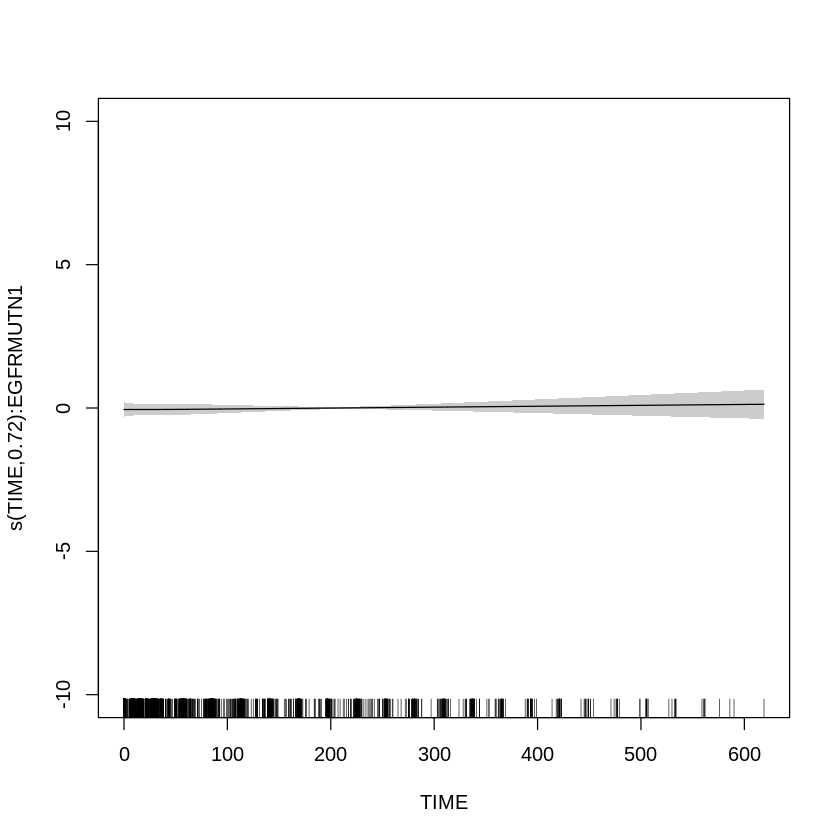

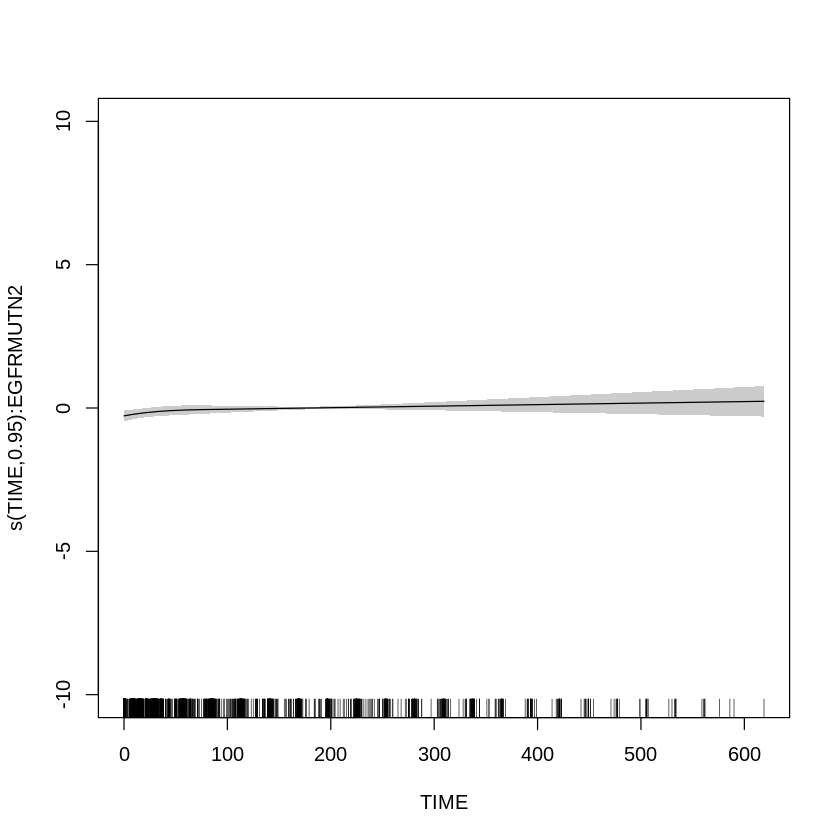

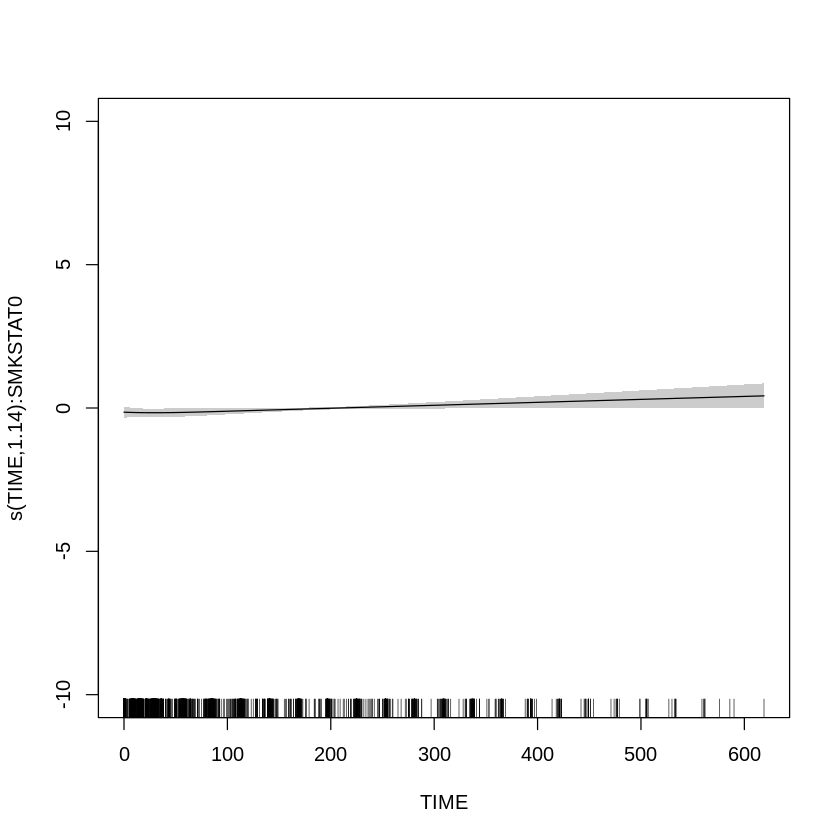

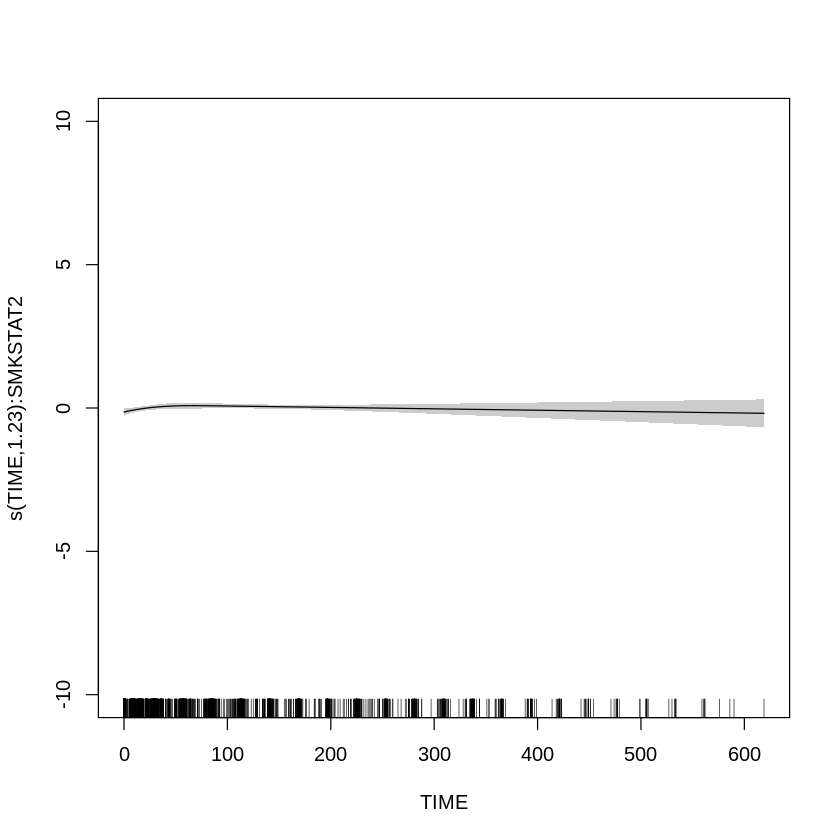

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfNEUT, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.05693    0.05857   0.972   0.3311  
SMKSTAT2    -0.05400    0.05487  -0.984   0.3252  
EGFRMUTN1    0.02553    0.08522   0.300   0.7645  
EGFRMUTN2    0.21441    0.08999   2.382   0.0173 *
WHOSTATN1    0.03517    0.05371   0.655   0.5126  
WHOSTATN2    0.07893    0.10644   0.741   0.4585  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.2186      9 0.068 0.329469    
s(TIME):WHOSTATN1 1.2736      9 0.236 0.015830 *  
s(TIME):WHOSTATN2 0.8328      8 0.109 0.255360    
s(TIME):EGFRMUTN0 1.2734      9 0.047 0.405964 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.968  0.3252
EGFRMUTN  2 2.838  0.0587
WHOSTATN  2 0.378  0.6856

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.2186 9.0000 0.068 0.329469
s(TIME):WHOSTATN1 1.2736 9.0000 0.236 0.015830
s(TIME):WHOSTATN2 0.8328 8.0000 0.109 0.255360
s(TIME):EGFRMUTN0 1.2734 9.0000 0.047 0.405964
s(TIME):EGFRMUTN1 0.7238 8.0000 0.040 0.561041
s(TIME):EGFRMUTN2 0.9517 7.0000 0.876 5.74e-05
s(TIME):SMKSTAT0  1.1372 8.0000 0.557 0.000162
s(TIME):SMKSTAT2  1.2339 9.0000 0.597 1.36e-06

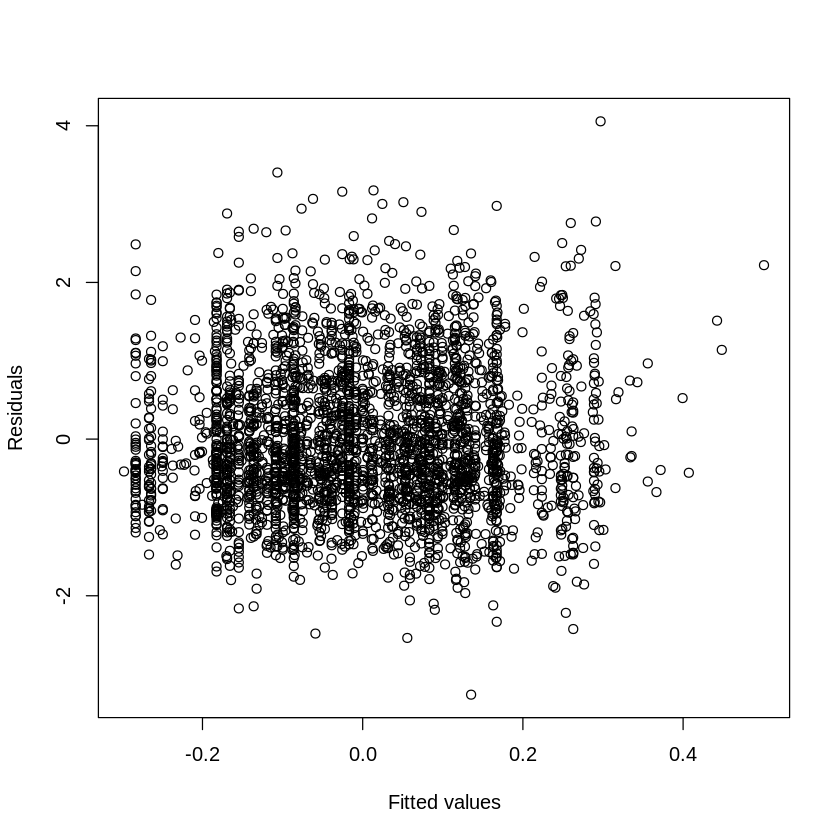

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 12 iterations.
Gradient range [-0.01034873,0.007751077]
(score 4024.795 & scale 0.8442202).
Hessian positive definite, eigenvalue range [3.904253e-14,1504.013].
Model rank =  46 / 46 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                    k'  edf k-index p-value
s(TIME):EGFRMUTN0 9.00 1.44       1    0.41
s(TIME):EGFRMUTN1 9.00 0.79       1    0.42
s(TIME):EGFRMUTN2 9.00 1.24       1    0.41
s(TIME):SMKSTAT0  9.00 1.31       1    0.48
s(TIME):SMKSTAT2  9.00 1.42       1    0.45


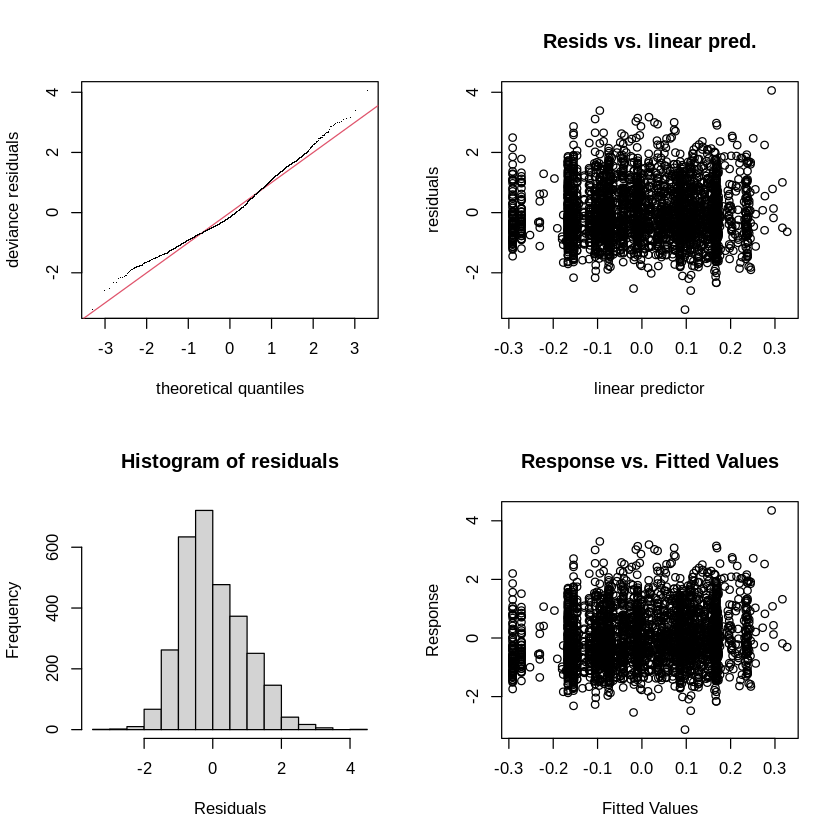

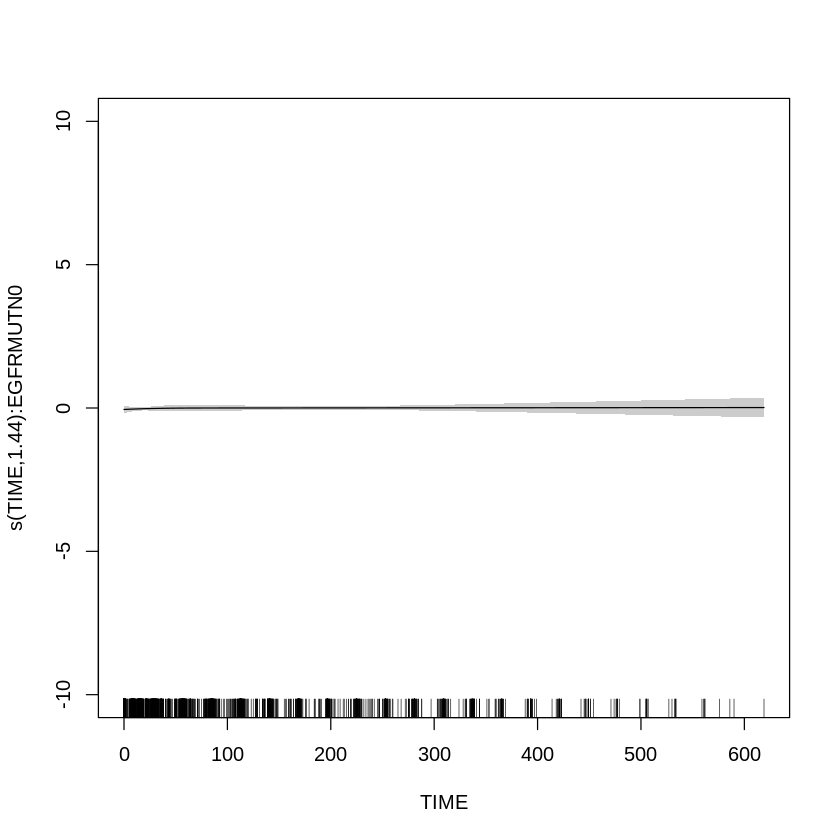

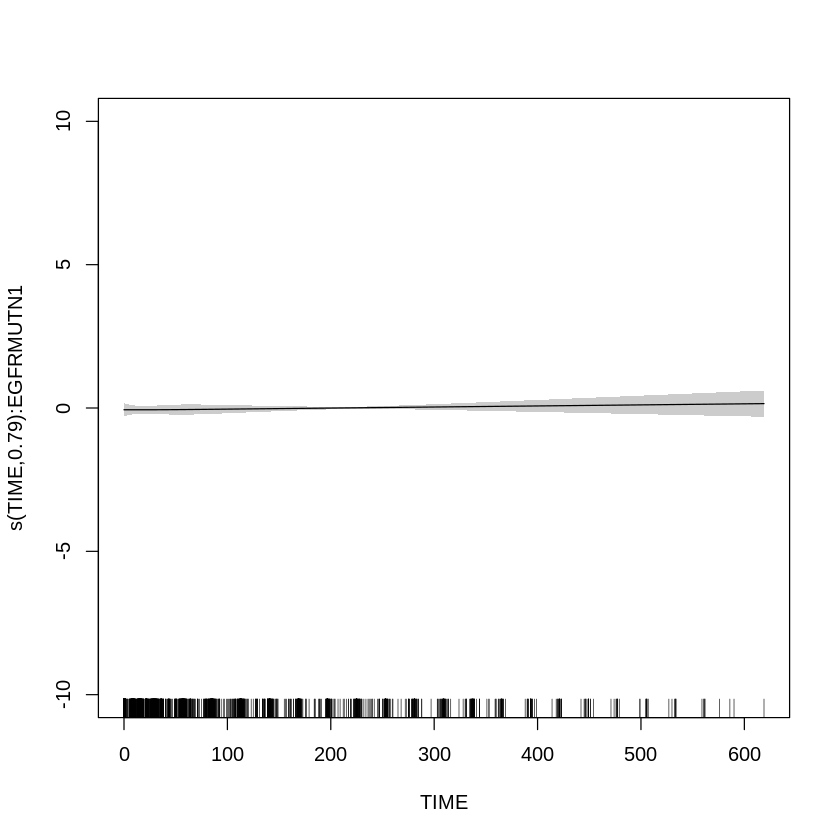

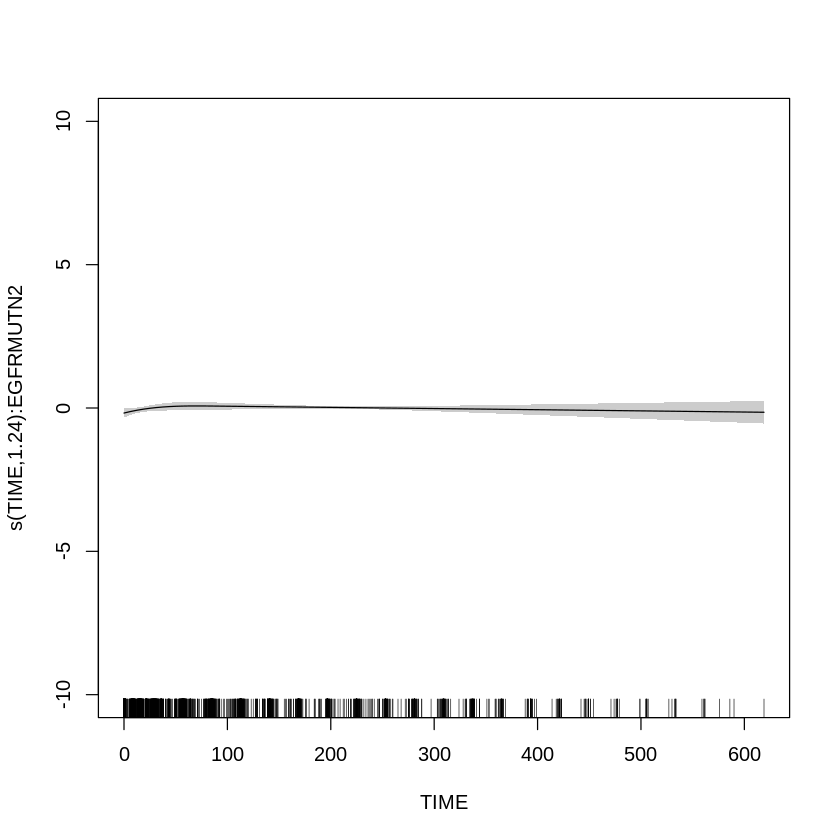

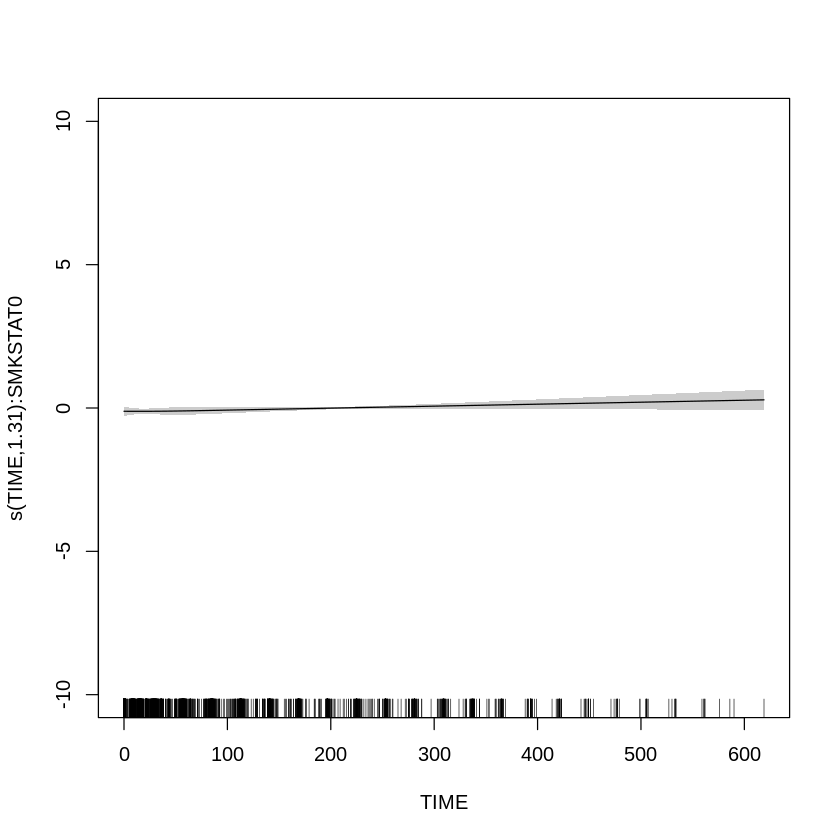

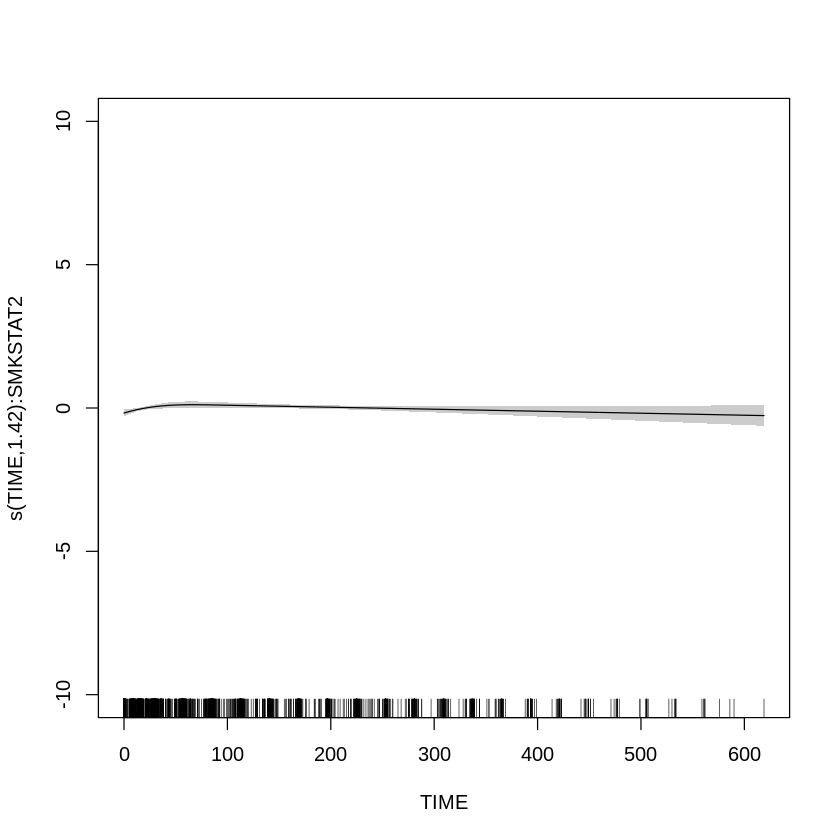

In [ ]:
ct1 <- gam(norm~s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1), data = dfNEUT, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.05888    0.02523   2.333   0.0197 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):EGFRMUTN0 1.4364      9 0.056 0.326506    
s(TIME):EGFRMUTN1 0.7896      7 0.131 0.245245    
s(TIME):EGFRMUTN2 1.2397      8 0.558 0.001415 ** 
s(TIME):SMKSTAT0  1.3086      9 0.609 0.000276 ***
s(TIME):SMKSTAT2  1.4203      9 0.782 7.86e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0222   Deviance explained = 2.42%
-REML = 4024.8  Scale est. = 0.84422   n = 3009


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):EGFRMUTN0 1.4364 9.0000 0.056 0.326506
s(TIME):EGFRMUTN1 0.7896 7.0000 0.131 0.245245
s(TIME):EGFRMUTN2 1.2397 8.0000 0.558 0.001415
s(TIME):SMKSTAT0  1.3086 9.0000 0.609 0.000276
s(TIME):SMKSTAT2  1.4203 9.0000 0.782 7.86e-07

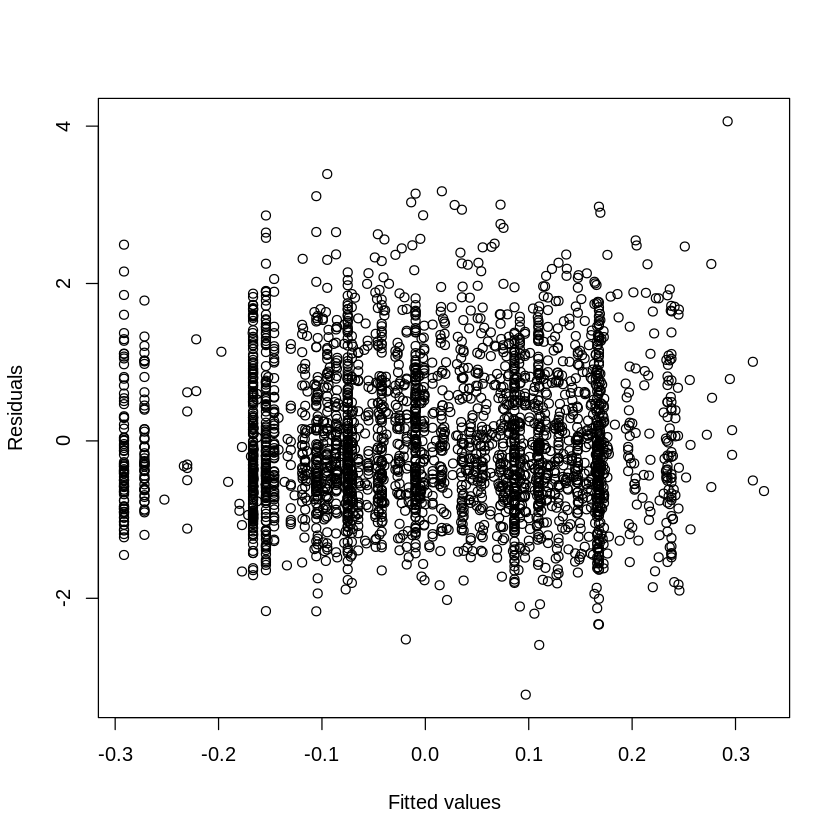

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# WBC


In [ ]:
dfWBC <- make_df(data, 'WBC')


Method: REML   Optimizer: outer newton
full convergence after 19 iterations.
Gradient range [-0.008700111,0.007742194]
(score 4043.98 & scale 0.8469715).
eigenvalue range [-1.346042e-14,1503.014].
Model rank =  78 / 78 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.212       1    0.52
s(TIME):WHOSTATN1 9.000 1.267       1    0.47
s(TIME):WHOSTATN2 9.000 0.818       1    0.46
s(TIME):EGFRMUTN0 9.000 1.267       1    0.50
s(TIME):EGFRMUTN1 9.000 0.709       1    0.48
s(TIME):EGFRMUTN2 9.000 0.938       1    0.45
s(TIME):SMKSTAT0  9.000 1.131       1    0.46
s(TIME):SMKSTAT2  9.000 1.229       1    0.45


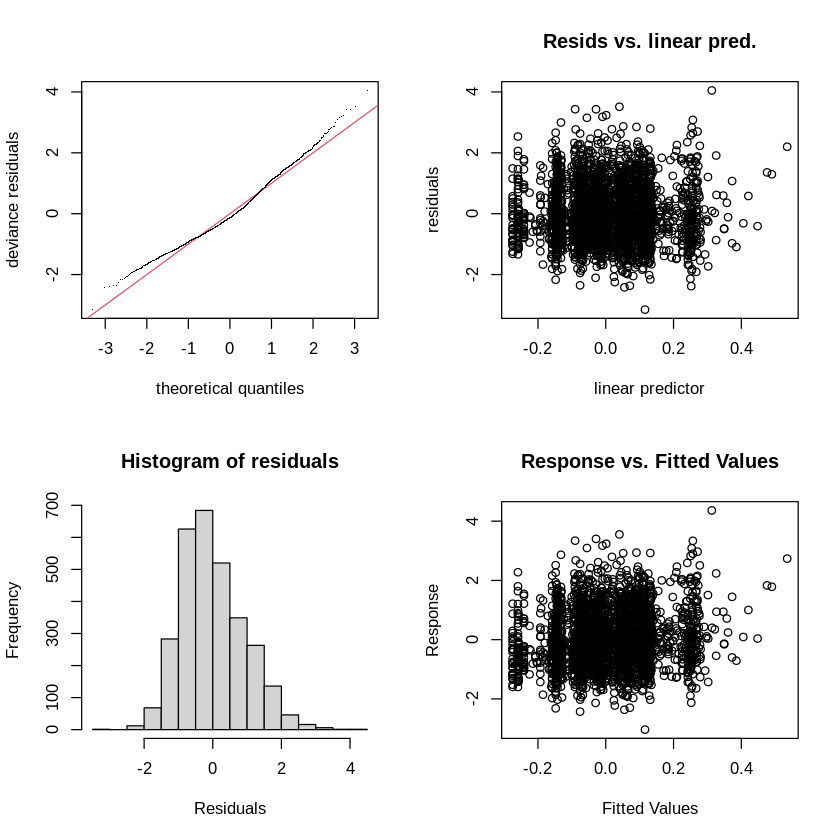

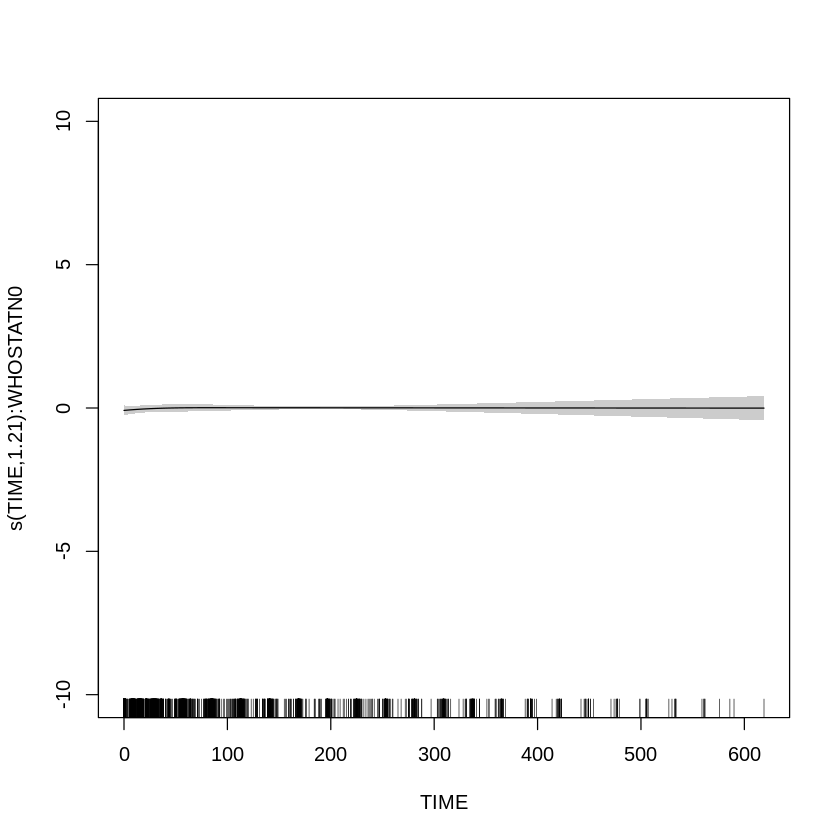

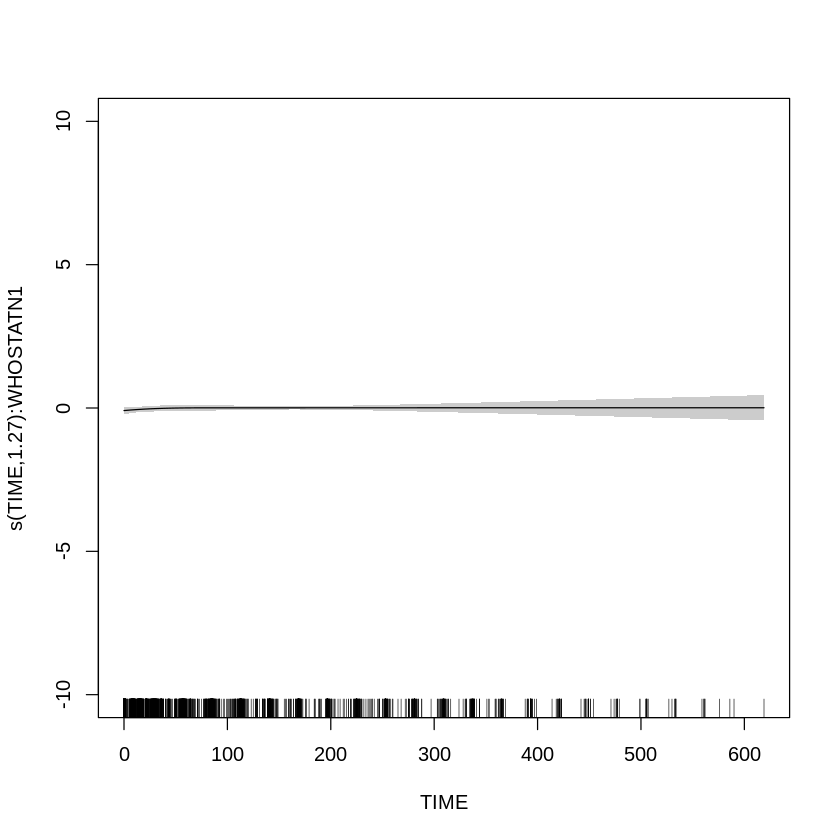

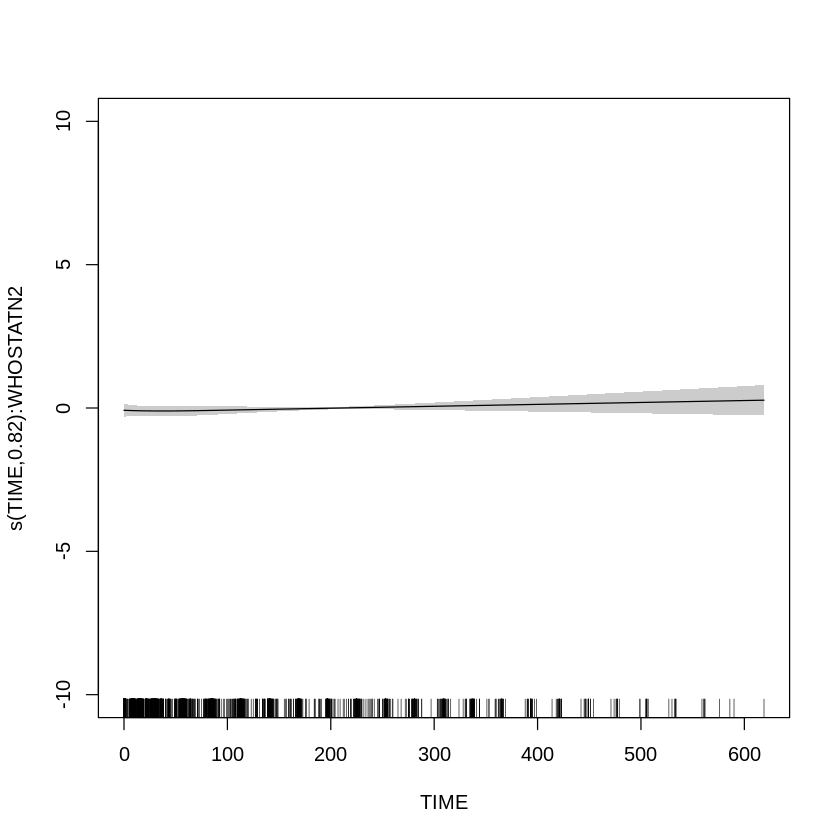

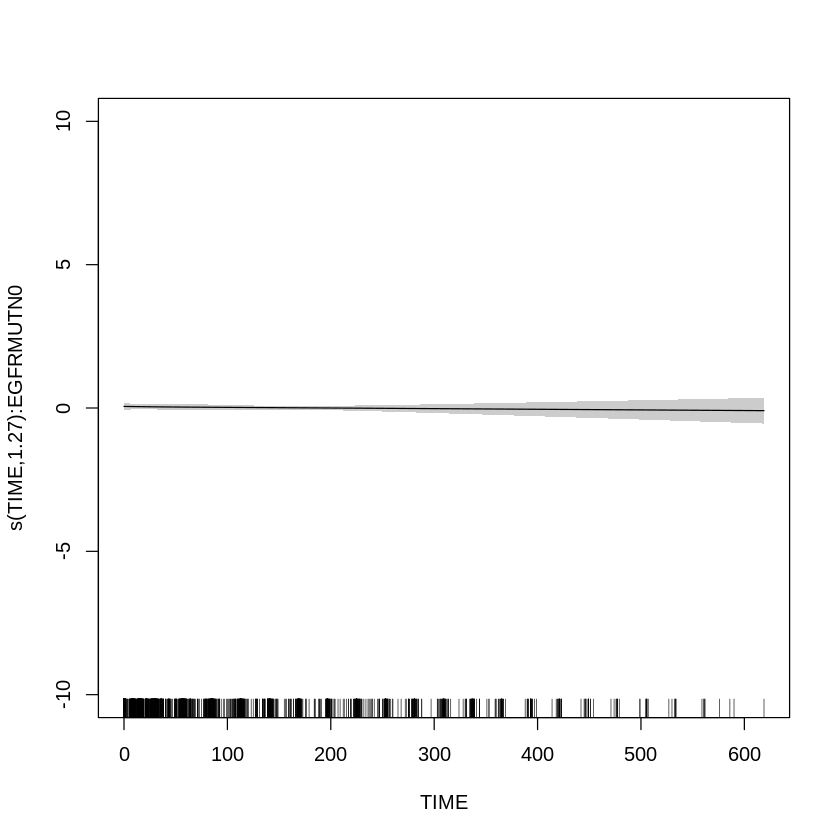

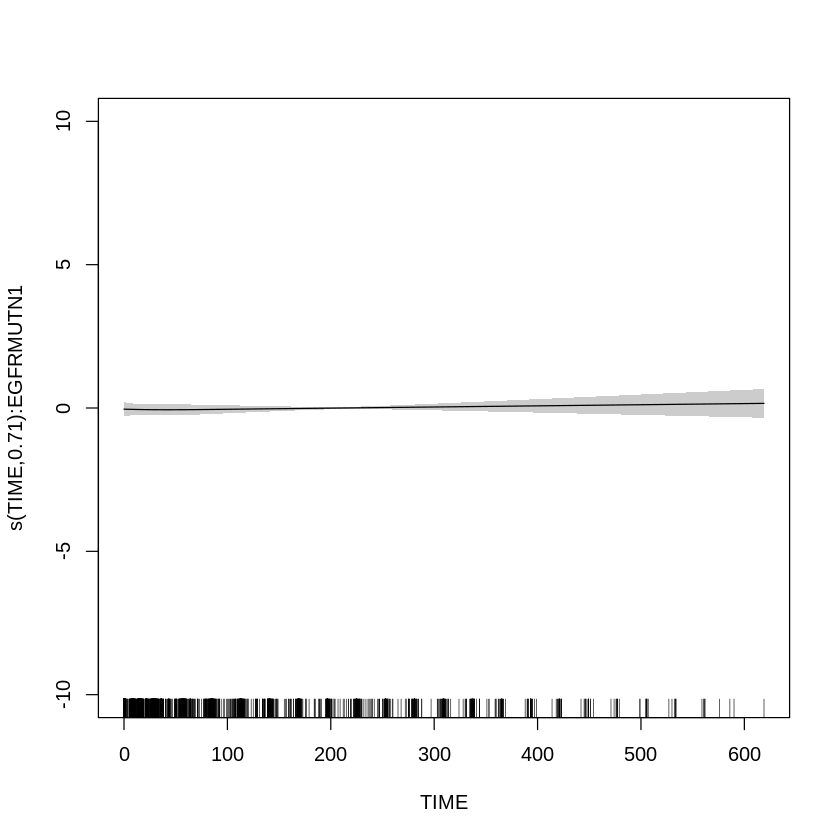

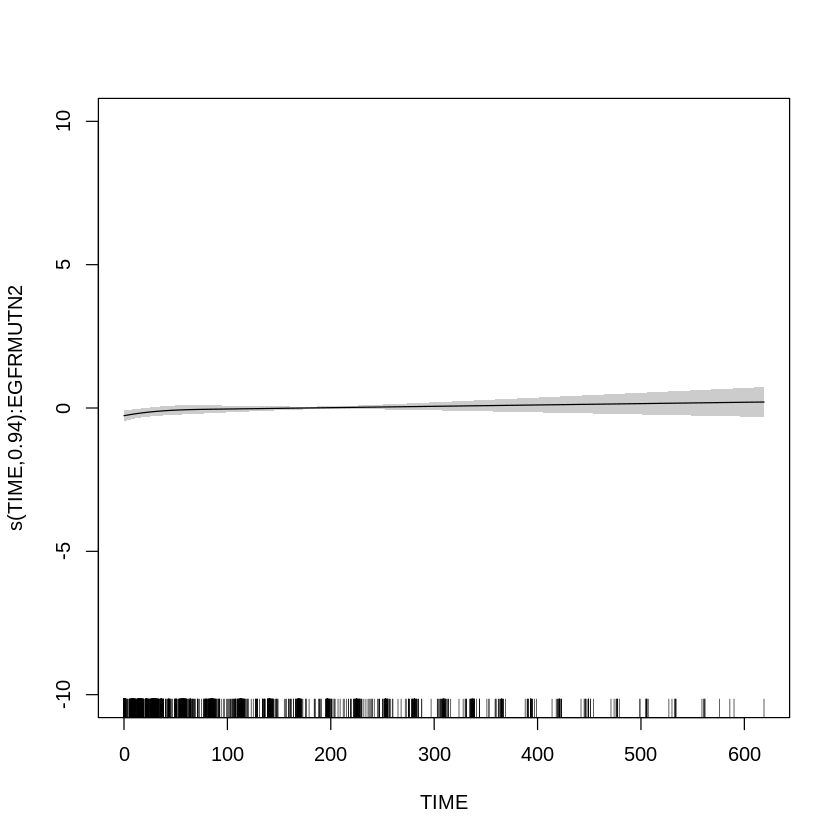

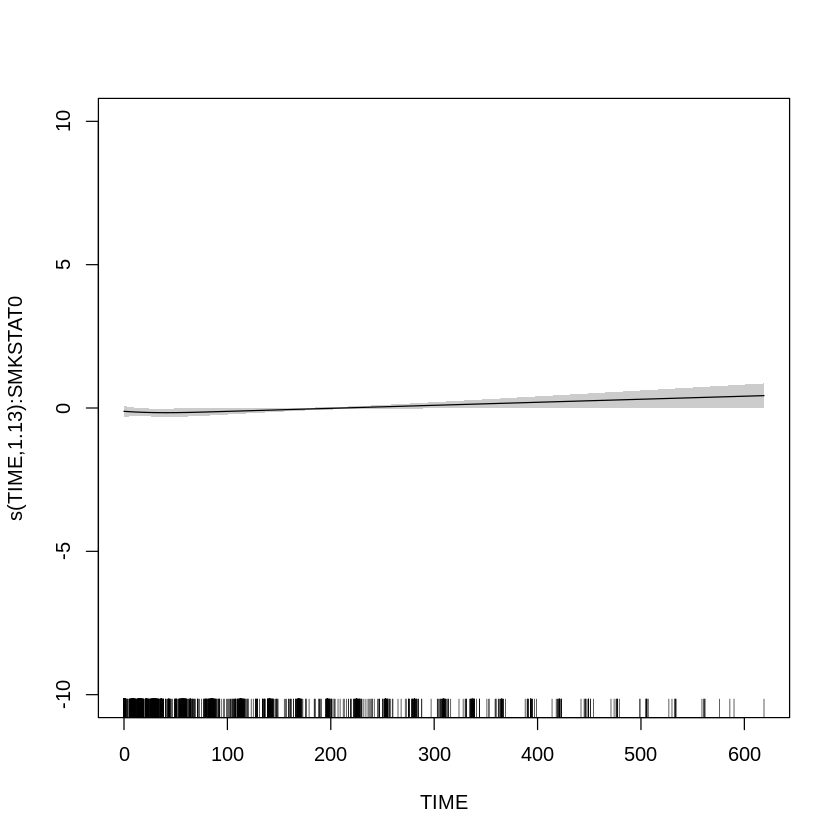

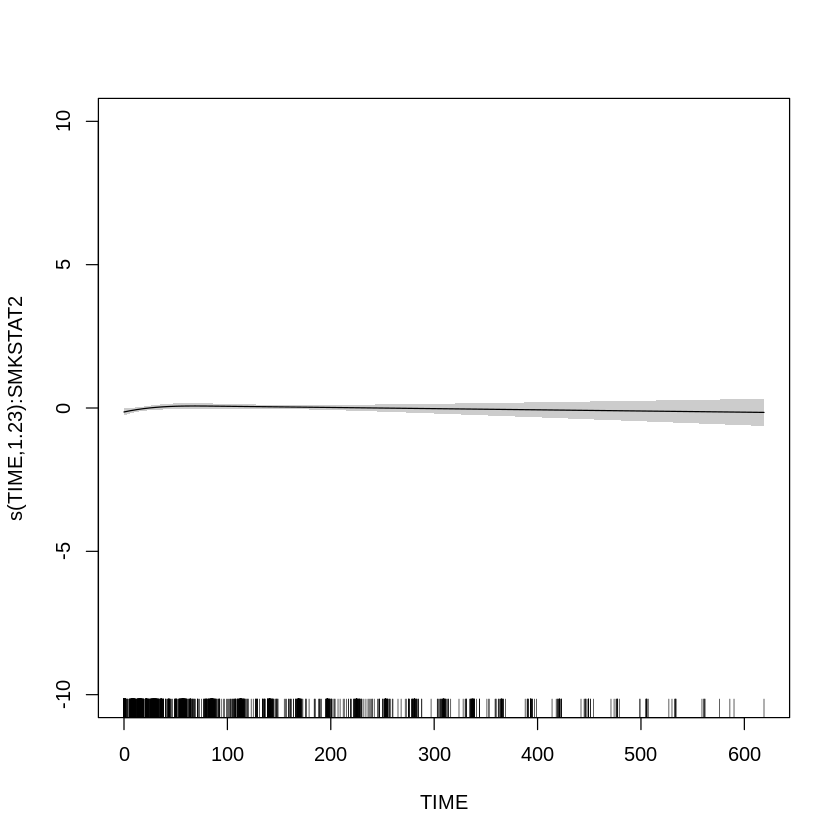

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = EGFRMUTN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1) + 
           SMKSTAT + EGFRMUTN + WHOSTATN, data = dfWBC, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.05292    0.05856   0.904   0.3662  
SMKSTAT2    -0.04399    0.05486  -0.802   0.4226  
EGFRMUTN1    0.02841    0.08511   0.334   0.7385  
EGFRMUTN2    0.20697    0.08924   2.319   0.0205 *
WHOSTATN1    0.02141    0.05369   0.399   0.6900  
WHOSTATN2    0.07844    0.10540   0.744   0.4568  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.2118      9 0.105 0.186128    
s(TIME):WHOSTATN1 1.2673      8 0.142 0.110592    
s(TIME):WHOSTATN2 0.8179      7 0.167 0.157630    
s(TIME):EGFRMUTN0 1.2674      9 0.045 0.426122 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = EGFRMUTN, bs = "ad", k = 10, id = 1) + s(TIME, by = SMKSTAT, 
    bs = "ad", k = 10, id = 1) + SMKSTAT + EGFRMUTN + WHOSTATN

Parametric Terms:
         df     F p-value
SMKSTAT   1 0.643  0.4226
EGFRMUTN  2 2.689  0.0681
WHOSTATN  2 0.294  0.7457

Approximate significance of smooth terms:
                     edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.2118 9.0000 0.105 0.186128
s(TIME):WHOSTATN1 1.2673 8.0000 0.142 0.110592
s(TIME):WHOSTATN2 0.8179 7.0000 0.167 0.157630
s(TIME):EGFRMUTN0 1.2674 9.0000 0.045 0.426122
s(TIME):EGFRMUTN1 0.7093 7.0000 0.061 0.456915
s(TIME):EGFRMUTN2 0.9378 8.0000 0.768 5.33e-05
s(TIME):SMKSTAT0  1.1309 8.0000 0.564 0.000153
s(TIME):SMKSTAT2  1.2289 9.0000 0.524 5.11e-06

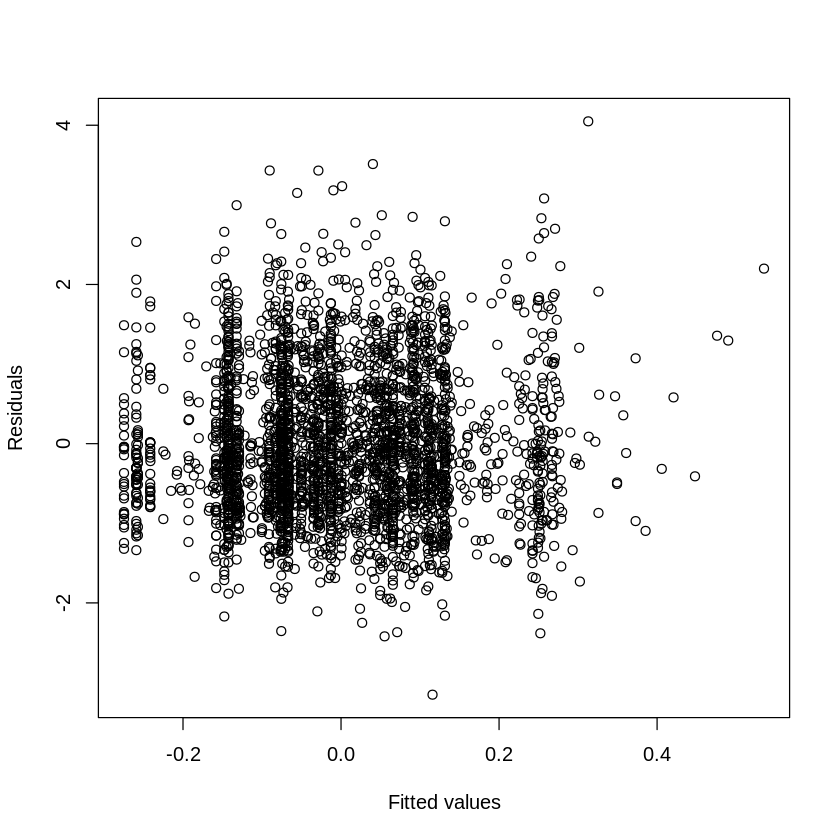

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)


Method: REML   Optimizer: outer newton
full convergence after 13 iterations.
Gradient range [-0.01029342,0.00639239]
(score 4037.332 & scale 0.8494397).
Hessian positive definite, eigenvalue range [1.92914e-13,1505.513].
Model rank =  46 / 46 

Basis dimension (k) checking results. Low p-value (k-index<1) may
indicate that k is too low, especially if edf is close to k'.

                     k'   edf k-index p-value
s(TIME):WHOSTATN0 9.000 1.264       1    0.39
s(TIME):WHOSTATN1 9.000 1.368       1    0.47
s(TIME):WHOSTATN2 9.000 0.966       1    0.45
s(TIME):SMKSTAT0  9.000 1.208       1    0.54
s(TIME):SMKSTAT2  9.000 1.392       1    0.37


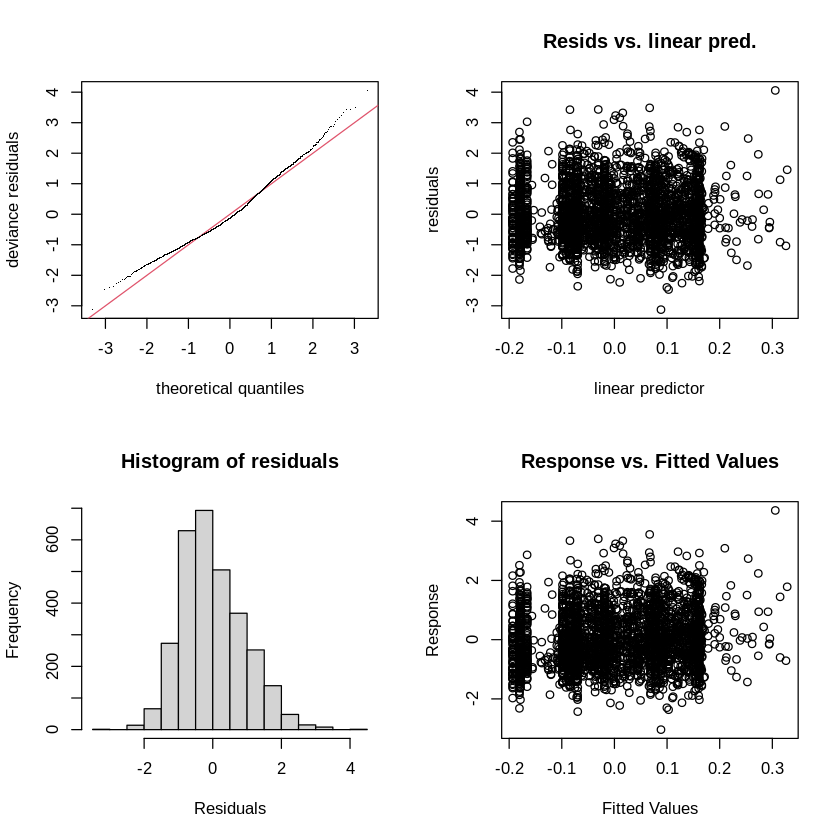

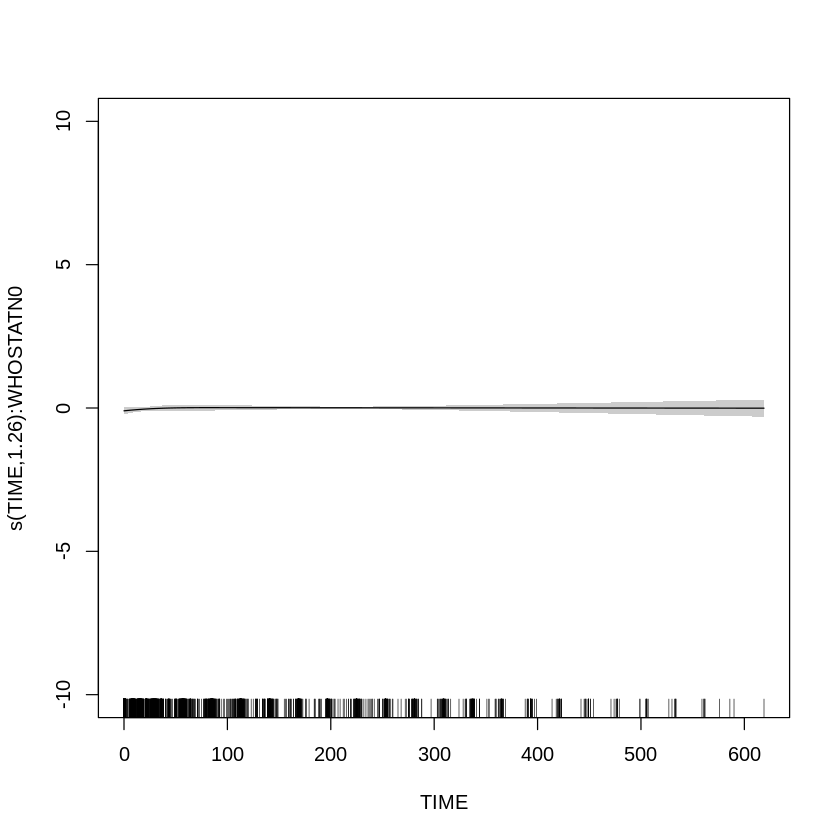

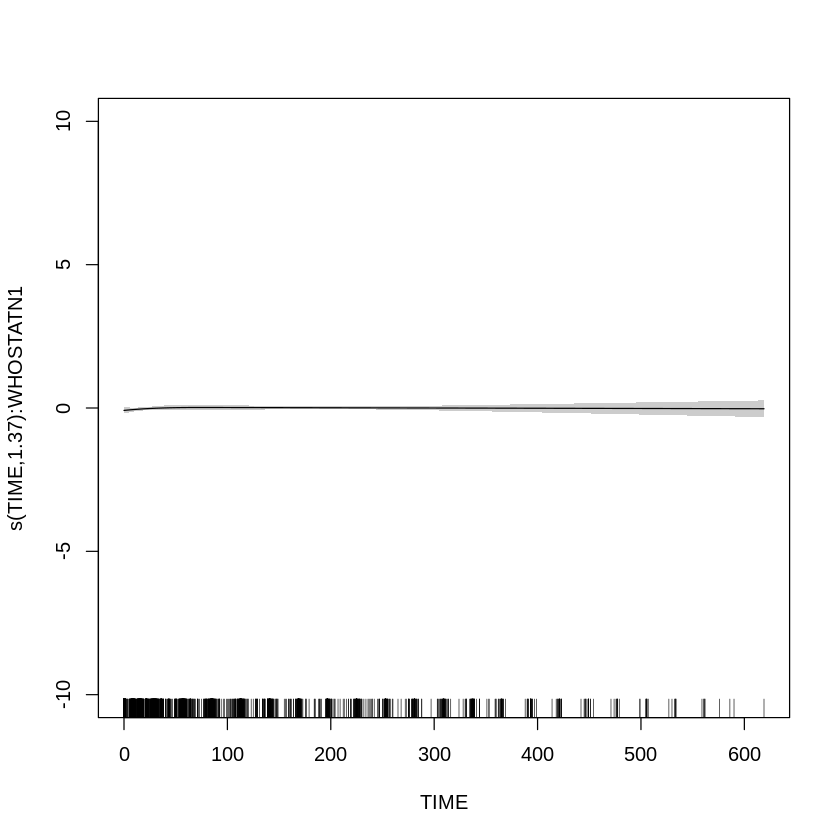

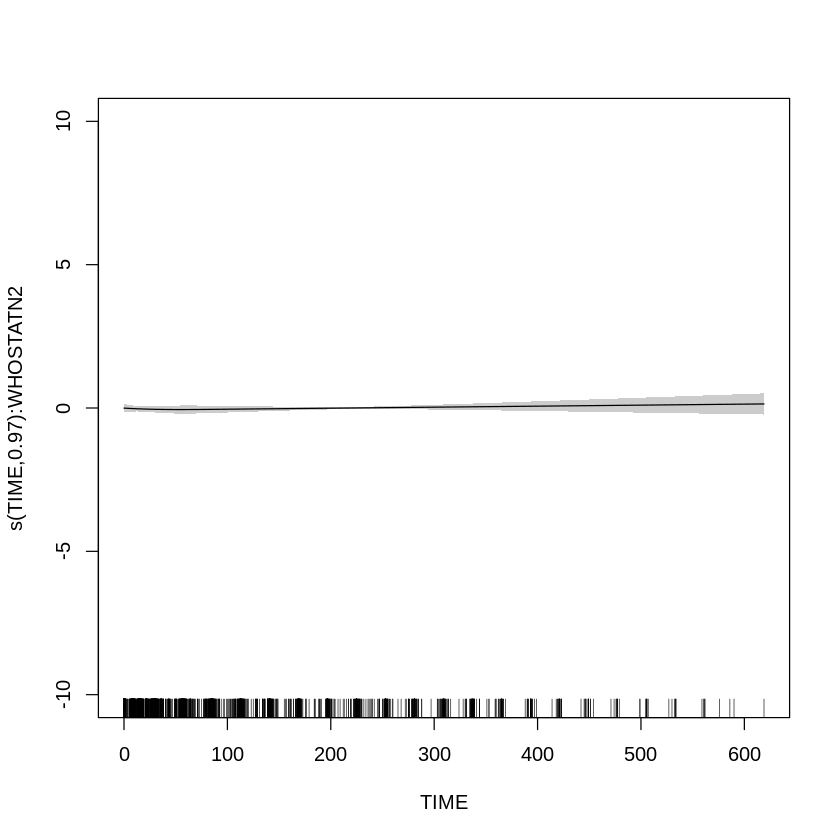

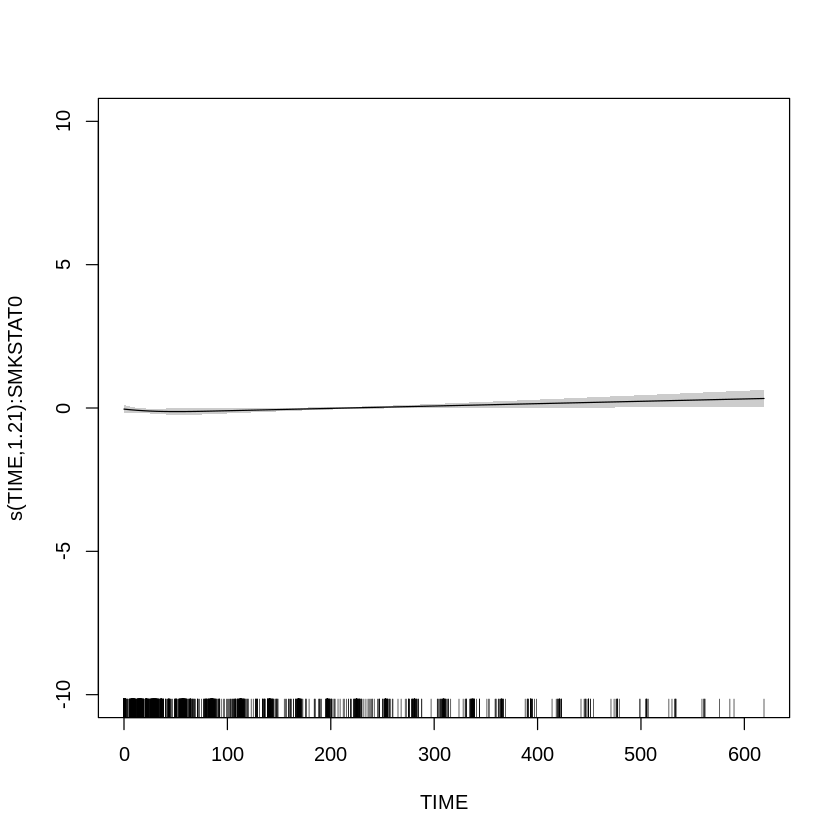

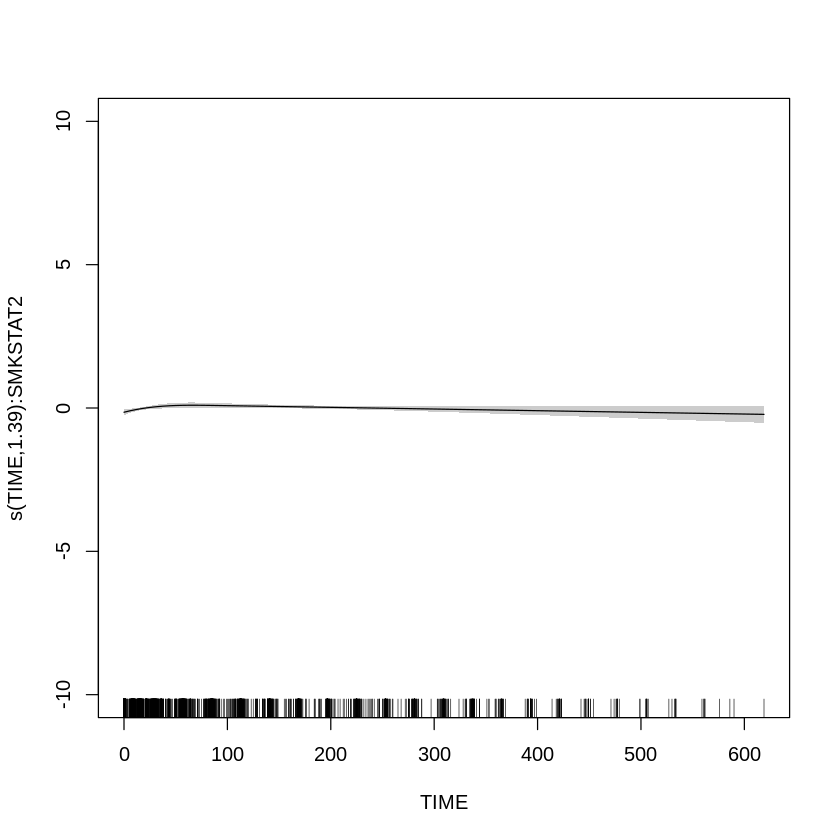

In [ ]:
ct1 <- gam(norm~s(TIME,  by = WHOSTATN, bs = 'ad', k = 10, id = 1) + 
           s(TIME, by = SMKSTAT, bs = 'ad', k = 10, id = 1), data = dfWBC, select=TRUE,
           method="REML", family.mgcv = "gauss")
gam.check(ct1)
plot(ct1, residuals=TRUE, pch=19, ylim = c(-10,10), shade=TRUE, seWithMean=TRUE, scale=0) 


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Parametric coefficients:
            Estimate Std. Error t value Pr(>|t|)  
(Intercept)  0.05266    0.02477   2.126   0.0336 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value    
s(TIME):WHOSTATN0 1.264      9 0.237 0.047362 *  
s(TIME):WHOSTATN1 1.368      9 0.199 0.051246 .  
s(TIME):WHOSTATN2 0.966      8 0.084 0.397772    
s(TIME):SMKSTAT0  1.208      8 0.765 0.000225 ***
s(TIME):SMKSTAT2  1.392      9 0.834 2.87e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

R-sq.(adj) =  0.0163   Deviance explained = 1.83%
-REML = 4037.3  Scale est. = 0.84944   n = 3012


Family: gaussian 
Link function: identity 

Formula:
norm ~ s(TIME, by = WHOSTATN, bs = "ad", k = 10, id = 1) + s(TIME, 
    by = SMKSTAT, bs = "ad", k = 10, id = 1)

Approximate significance of smooth terms:
                    edf Ref.df     F  p-value
s(TIME):WHOSTATN0 1.264  9.000 0.237 0.047362
s(TIME):WHOSTATN1 1.368  9.000 0.199 0.051246
s(TIME):WHOSTATN2 0.966  8.000 0.084 0.397772
s(TIME):SMKSTAT0  1.208  8.000 0.765 0.000225
s(TIME):SMKSTAT2  1.392  9.000 0.834 2.87e-06

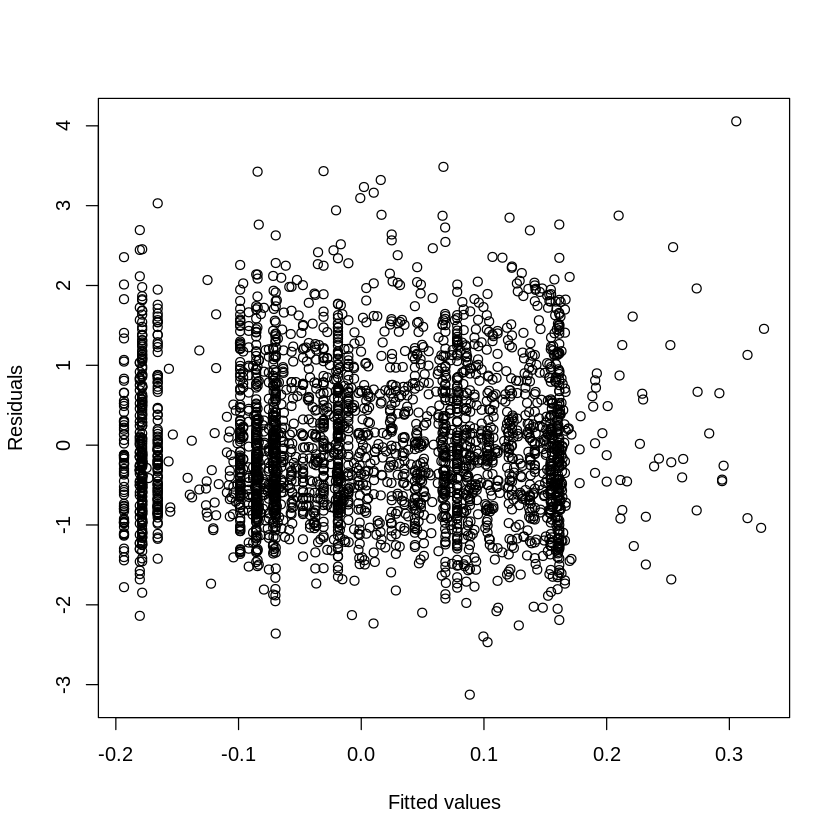

In [ ]:
plot(fitted(ct1), residuals(ct1), xlab = 'Fitted values', ylab = 'Residuals')
summary(ct1)
anova(ct1)

# Data description

In [ ]:
table(data$YTYPE_DESC)


  ALP   ALT   AST CREAT   LDH  NEUT   NLR   SLD   WBC 
 3118  3118  3107  3118  3107  3013  3013  1726  3016 

In [ ]:
table(data$WHOSTATN)


    0     1     2 
 8316 15193  2827 

In [ ]:
table(data$SMKSTAT)


    0     2 
 6358 19978 

In [ ]:
table(data$EGFRMUTN)


    0     1     2 
19489  1564  5283 

In [ ]:
data$EGFRMUTN <- as.factor(data$EGFRMUTN)

# Bar plots

In [ ]:
plotBar <- function(data, strat, filename, title, ymax) {

    data_count = data.frame(table(unique(data[, c('USUBJID', strat)])[, strat]))
    colnames(data_count) <- c('names', 'heigth')
    png(filename=filename)


    my_bar <- barplot(data_count$heigth , border=F , 
                      las=2 , 
                      col=c(rgb(0.3,0.1,0.4,0.6) , rgb(0.3,0.5,0.4,0.6) , rgb(0.3,0.9,0.4,0.6)) , 
                      ylim = c(0, ymax),
                      cex.main=2,
                      main=title)

    text(my_bar, data_count$heigth + 40, paste("n: ", data_count$heigth, sep="") ,cex=2) 

    #Legende
    legend("topright", legend = data_count$names, 
         col = c(rgb(0.3,0.1,0.4,0.6) , rgb(0.3,0.5,0.4,0.6) , rgb(0.3,0.9,0.4,0.6) ) , 
         bty = "n", pch=20 , pt.cex = 2, cex = 2, horiz = FALSE, inset = c(0.05, 0.05))

        dev.off()
}

In [ ]:
plotBar(data, 'EGFRMUTN', './Bars/EGFRN.png', 'Amount of patients with different types \n of EGFR mutations', 500)

png 
  2

In [ ]:
plotBar(data, 'WHOSTATN', './Bars/WHOSTATN.png', 'Amount of patients with different\n WHO status', 500)

png 
  2

In [ ]:
plotBar(data, 'SMKSTAT', './Bars/SMKSTAT.png', 'Amount of patients with different\n SMK status', 500)

png 
  2

# Corplot

In [ ]:
calc_corr <- function(data, first, second, subjid) {
    df1 = data[data$USUBJID == subjid, ]
    df1$curr <- 0
    first_base <- paste0(first, 'b')
    second_base <- paste0(second, 'b')
    df1[df1$YTYPE_DESC == first, 'curr'] <- df1[df1$YTYPE_DESC == first, 'DV'] - df1[df1$YTYPE_DESC == first, 
                                                                                     first_base]
    df1[df1$YTYPE_DESC == second, 'curr'] <- df1[df1$YTYPE_DESC == second, 'DV'] - df1[df1$YTYPE_DESC == second,
                                                                                     second_base]
    df1 <- df1[df1$YTYPE_DESC %in% c(first, second), c('curr', 'TIME', 'YTYPE_DESC')]
    spread(df1, key = TIME, value = curr)
    df2 = t(spread(df1, key = TIME, value = curr))
    df2 <- data.frame(df2)

    colnames(df2) <- c(first, second)
    df2 <- df2[-1, ]
    df2 <- df2[!is.na(df2[, first]), ]
    df2 <- df2[!is.na(df2[, second]), ]
    df2 <- apply(df2, 2, as.numeric)
    #print(class(df2))
    if (is.matrix(df2) && nrow(df2) > 2)
        return (cor(df2[, first], df2[, second], method = 'kendall'))
    else
        return (0)
}

calc_cor_matrix <- function(data, subjid) {
    cor_matrix = matrix(0, nrow = 8, ncol = 8)
    markers = sort(unique(data$YTYPE_DESC))
    markers = markers[-8]
    for (i in c(1:7)){
        for (j in c((i+1):8)){
            correlation <-  calc_corr(data, markers[i], markers[j], subjid)
            if (!is.na(correlation))
                cor_matrix[i, j] <- correlation[1]
        }
    }
    return (cor_matrix)
}
calc_av <- function(data) {
    av_cor_matrix <- matrix(0, nrow = 8, ncol = 8)
    usubjlist <- unlist(unique(data$USUBJID))
    temp_matrix <- matrix(0, nrow = 8, ncol = 8)
    for (i in usubjlist) {
        temp_matrix <- calc_cor_matrix(data, i)
        av_cor_matrix <- av_cor_matrix + temp_matrix
        #print(i)
        #print(sum(av_cor_matrix))

    }

    av_cor_matrix <- av_cor_matrix /length(usubjlist)
    for (i in (1:8))
        av_cor_matrix[i, i] <- 1
    return (av_cor_matrix)
}

In [ ]:
av_corr_matrix <- calc_av(data)

Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, second], method = "kendall"):
“стандартное отклонение нулевое”
Warning message in cor(df2[, first], df2[, sec

# Averaging

In [ ]:
markers = sort(unique(data$YTYPE_DESC))
markers <- markers[-8]
colnames(av_corr_matrix) <- markers
rownames(av_corr_matrix) <- markers
png('averaged_correlations.png')
corrplot(av_corr_matrix, type="upper")
dev.off()

png 
  2

In [ ]:
df2 = data[data$YTYPE_DESC == 'ALP', ]
df2$curr <- df2$DV - df2$ALPb
times = unlist(sort(unique(df2$TIME)))
means <- c()
for (i in times) {
    means <- c(means, mean(df2$curr[df2$TIME == i]))
}

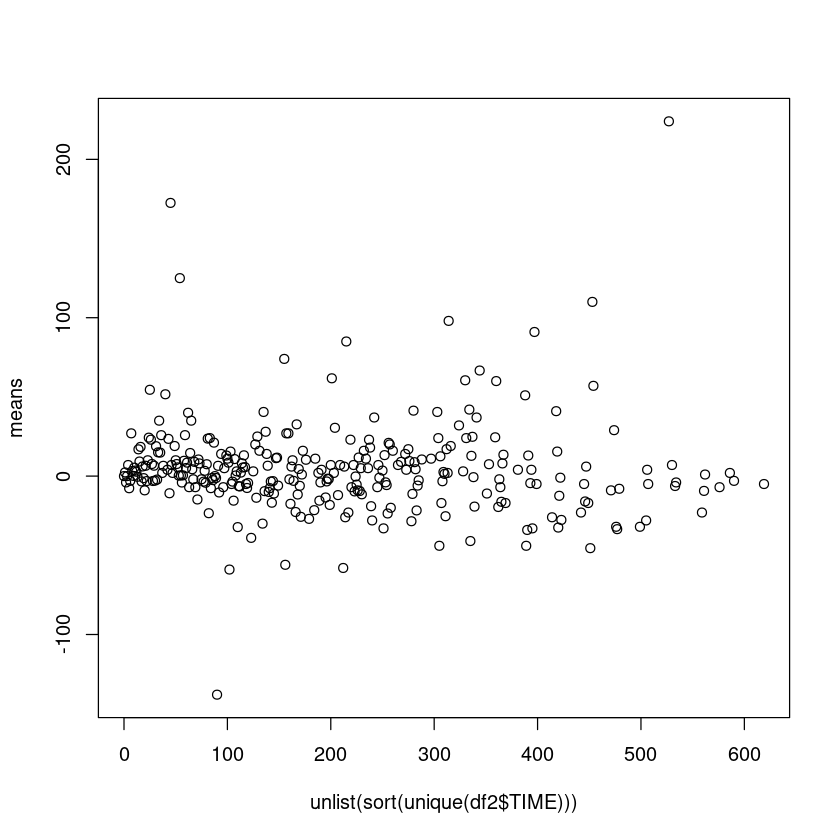

In [ ]:
plot(unlist(sort(unique(df2$TIME))), means)

In [ ]:
df3 <- data.frame(time = unlist(sort(unique(df2$TIME))), means = means)

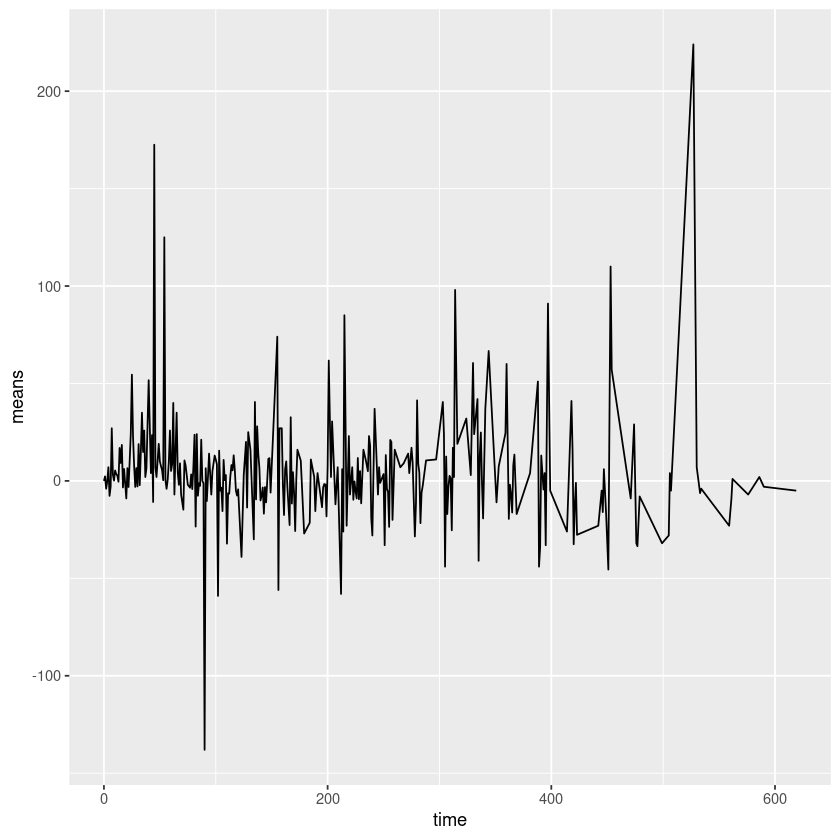

In [ ]:
ggplot(df3, aes(x = time, y = means)) + geom_line()

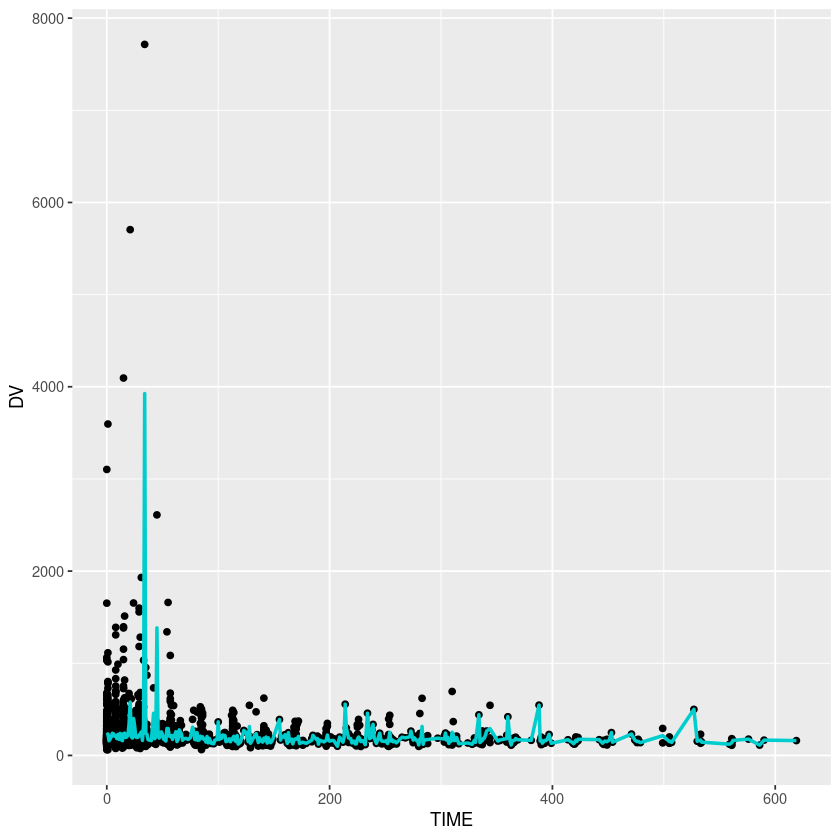

In [ ]:
ggplot(data[data$YTYPE_DESC == 'LDH', ], aes(x = TIME, y = DV)) + geom_point() +
    stat_summary(fun = "mean", colour = "cyan3", size = 1, geom = "line")


In [ ]:
descriptions <- sort(unique(data$YTYPE_DESC))

for (i in c(1:9)) {
  baseline <- paste0(descriptions[i], 'b')
  df <- data[data$YTYPE_DESC == descriptions[i], c('USUBJID', 'TIME', 'DV', baseline)]
  colnames(df)[4] <- 'base'
  df$curr <- df$DV - df$base

  title <- paste0(descriptions[i], ' dependancy from time for all patients')
  filename <-  paste0('./PicturesForAll/', descriptions[i], '.png')
  ggplot(df, aes(TIME, curr)) + geom_point() + geom_smooth() + xlab('Time, Days') + ylab(descriptions[i]) +
  ggtitle(title) + xlim(0, 100)
  ggsave(filename)


  # subjlist <- unique(df[df$TIME %in% c(0, 1, 2), 'USUBJID'])
  # title <- paste0(descriptions[i], ' dependancy from time for patients came at first two days')
  # filename <-  paste0('./PicturesForAll/', descriptions[i], 'First', '.png')
  # ggplot(df[df$USUBJID %in% unlist(subjlist), ], aes(TIME, curr)) + geom_point() + geom_smooth() + xlab('Time, Days') + ylab(descriptions[i]) +
  # ggtitle(title)
  # ggsave(filename)

  # df$norm <- (df$curr - mean(df$curr$DV)) / sd(df$curr$DV)
  # subjlist <- unique(df[df$TIME %in% c(1, 0), 'USUBJID'])
  # title <- paste0(descriptions[i], ' dependancy from time for patients normalized')
  # filename <-  paste0('./PicturesForAll/', descriptions[i], 'Norm', '.png')
  # ggplot(df, aes(TIME, norm)) + geom_point() + geom_smooth() + xlab('Time, Days') + ylab(descriptions[i]) +
  # ggtitle(title)
  # ggsave(filename)
}

Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 818 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 818 rows containing missing values (geom_point).”
Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 818 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 818 rows containing missing values (geom_point).”
Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 816 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 816 rows containing missing values (geom_point).”
Saving 6.67 x 6.67 in image

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 818 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 818 rows containing mi

# Outliers

In [9]:
dfALT <- make_df(data, 'ALT')

In [10]:
# Make plots wider 
options(repr.plot.width=30, repr.plot.height=10)

`%!in%` <- Negate(`%in%`)

## Make spagetti plots 

In [ ]:
plot_spagetti <- function(data, marker, dir, maxy){
    row <- ggplot(data, aes(x = TIME, y = DV, group = USUBJID, color = USUBJID, show.legend = FALSE)) + 
        geom_line() + geom_point() + theme(legend.position="none") + ylab(marker) +
            theme(axis.title=element_text(size=18,face="bold"))#+ ylim(0, maxy) 
    
    basetitle <- paste0(marker, ' change frome baseline')
    base <- ggplot(data, aes(x = TIME, y = y, group = USUBJID, color = USUBJID, show.legend = FALSE)) + 
        geom_line() + geom_point()  + theme(legend.position="none") + 
        ylab(basetitle) + theme(axis.title=element_text(size=18,face="bold")) #+ ylim(0, maxy)

    ggarrange(row, base, 
              labels = c("A", "B"),
              ncol = 2, nrow = 1)
    
    filename <- paste0(dir, '/', marker, '.png')
    ggsave(filename, device = 'png', width = 12, height = 8)
}

In [ ]:
for (i in unique(data$YTYPE_DESC)){
    df <- make_df(data, i)
    plot_spagetti(df, i, 'spagetti', 300)
}

## Try to find more propriate distribution

In [169]:
nblk <- function(x,par) {
  return(-sum(log(dnbinom(x, size = par[1], prob = par[2]))))
}

plk <- function(x, par) {
  return(-sum(log(dpois(x, par))))
}

normlk <- function(x,par) {
  return(-sum(log(dnorm(x, par[1], par[2]))))
}

df_diff_dist <- function(data) {
  to_plot <- data.frame(table(data$DV)/length(data$DV)) 
  to_plot <- apply(to_plot, 2, as.numeric)
  to_plot <- data.frame(to_plot)
  colnames(to_plot) <- c('Count', 'Frequency')
  sm <-  mean(data$DV)
  svar <- var(data$DV)

  optimal = optim(par = c(10, 0.37), nblk, x = data$DV, method = "L-BFGS-B", lower = c(0.001,0.001), upper = c(100,1))
  to_plot$negbin <- dnbinom(to_plot$Count, size = optimal$par[1], prob = optimal$par[2])

  optimal = optim(par = sm, plk, x = data$DV[dpois(data$DV, pm) > 0], method = "L-BFGS-B", lower = sm - 5, upper = sm + 5)
  to_plot$pois <- dpois(to_plot$Count, optimal$par)

  optimal = optim(par = c(sm, svar), normlk, x = data$DV)
  to_plot$norm <- dnorm(to_plot$Count, optimal$par[1], sqrt(optimal$par[2]))
  return(to_plot)
}

plot_diff_dist <- function(data, xmax){
  to_plot <- df_diff_dist(data)
  to_plot <- melt(to_plot, id.vars = 1)
  ggplot(to_plot, aes(x = Count, y= value, color =variable)) + geom_point() + xlim(0, 100)
}

In [ ]:
plot_diff_dist(dfALT, 100)

## With 'known' distribution, try to find outlieing points

In [13]:
get_times <- function(data){
    times <- data.frame(times = colnames(t(sort(table(data$TIME), decreasing = T))))

    times$times <- apply(times, 1, as.numeric)
    timepoints <- c(times$times[1])
    for (i in times$times) { 
      last <- length(timepoints)
      if (i > timepoints[last]) {
        timepoints <- c(timepoints, i)
      }
    }
    differences <- c()
    len <- length(timepoints)
    for (i in c(1:(len-1)))
        differences <- c(differences, (timepoints[i + 1] + timepoints[i]) / 2)
    return(differences)
}
nlk <- function(x, par) {
  return(-sum(log(dnbinom(x, size = par[1], prob = par[2]))))
}




In [15]:
get_exclusion_points <- function(data, mark, time_lim){
    subjids <- c()
    times <- c()
    lower_time <- 0
    differences <- get_times(data)
    for (curr_time in differences) {
      x <- data[data$TIME < curr_time, c('USUBJID', 'DV', 'TIME')]
      x <- x[x$TIME >= lower_time, ]
      q1c = optim(par = c(10, 0.37), nlk, x = x$DV)
      print(q1c$par)
      x$p_val <- dnbinom(x$DV, q1c$par[1], q1c$par[2])
      x$p_adj <- p.adjust(x$p_val)

      tre <-  dnbinom(0, q1c$par[1], q1c$par[2])
      subj <- x$USUBJID[x$p_adj < tre]
      time <- x$TIME[x$p_adj < tre]
    #   ex <- unique(x$USUBJID[x$p_adj < tre])
    #   if (length(ex) > 0) {
    #     for (i_sub in c(1:length(ex))){
    #       max_time <- max(dfALT$TIME[dfALT$USUBJID == ex[i_sub]])
    #       x1 <- x[x$p_adj < tre, ]
    #       x1 <- x1[x1$USUBJID == ex[i_sub], ]
    #       time_anomal <- x1$TIME[x1$DV == max(x1$DV)]
    #       if (time_anomal >= max_time) #&& time_anomal <= time_lim)
    #         exclude <- c(exclude, ex[i_sub]) 
    #     }
    #   }
    #   exclude <- c(exclude, ex)
      times <- c(times, time)
      subjids <- c(subjids, subj)

      lower_time <- curr_time
    }
    exclusion <- data.frame(TIME = times, USUBJID = subjids)
    exclusion$YTYPE_DESC <- mark
    return(exclusion)
}

In [16]:
dfALT$DV <- apply(dfALT[, 'DV'], 1, as.numeric)
time_lim <- 5 * 7

exclusion <- get_exclusion_points(dfALT, 'ALT', time_lim)

Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.6904391 0.1658455


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.0616123 0.1307028


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 2.5801195 0.1073733


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 2.44511696 0.09790738


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.1808449 0.1214407


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.7353971 0.1435744


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.5880374 0.1365083


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 5.3125704 0.1921579


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 2.41920180 0.08376551


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 4.2509867 0.1520448


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 4.9406933 0.1853716


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 7.3731749 0.2651114


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.3268220 0.1195183


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 9.1134230 0.3056005


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 7.3774449 0.2610838


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 5.0630609 0.1742039


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 12.4384536  0.3674168


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 10.1549146  0.3204892


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 3.4344558 0.1258706


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 10.0981648  0.3339352


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”

[1] 0.422168929 0.002703658


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 5.2927325 0.1532262


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 1852.9054633    0.9856364


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 2441.7813174    0.9943065


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 683.3132848   0.9540109


Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”
Warning message in dnbinom(x, size = par[1], prob = par[2]):
“NaNs produced”


[1] 1675.1111493    0.9853385


In [18]:
exclusion$exclude <- 1
dfALT <- merge(x = dfALT, y = exclusion, by = c('USUBJID', 'YTYPE_DESC', 'TIME'), all.x = TRUE)
dfALT$exclude[is.na(dfALT$exclude)] <- 0

In [19]:
sum(dfALT$exclude)

[1] 25

## Also exclude patients with high average

In [92]:
calc_mean <- function(usubid, data) {
  return(mean(data[data$USUBJID == usubid, 'y']))
}

high_means_exclusion <- function(data, q){
  subj <- unique(data$USUBJID)
  means <- sapply(subj, calc_mean, data = data)
  means <- data.frame(means)
  means$USUBJID <- rownames(means)
  hist(means$means, breaks = 50, xlab = 'Means', main = 'Histogram of means')
  return(means[abs(means$means - mean(means$means)) > qnorm(1 - q) * sd(means$means), ])
}

,means,USUBJID
,<dbl>,<chr>
18DFKJAU37,51.00000,18DFKJAU37
2KL2236V79,53.68182,2KL2236V79
NK0FUHHBMV,97.50000,NK0FUHHBMV
NPDS5A63TT,58.66667,NPDS5A63TT
Z0QCI4WZ3A,43.25000,Z0QCI4WZ3A


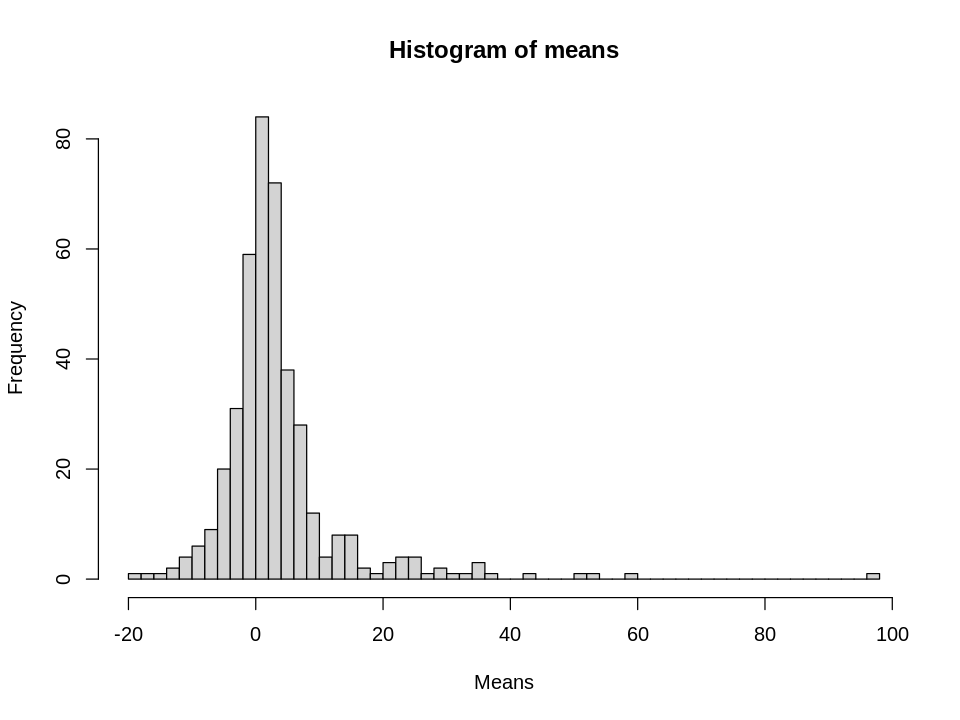

In [95]:
options(repr.plot.width=8, repr.plot.height=6)
high_means_exclusion(dfALT, 0.0001)

## Plot spagetti before and after exclusion

In [ ]:
p <- ggplot(data = data[data$USUBJID %!in% exclude, ], aes(x = TIME, y = DV, group = USUBJID, color = SMKSTAT))

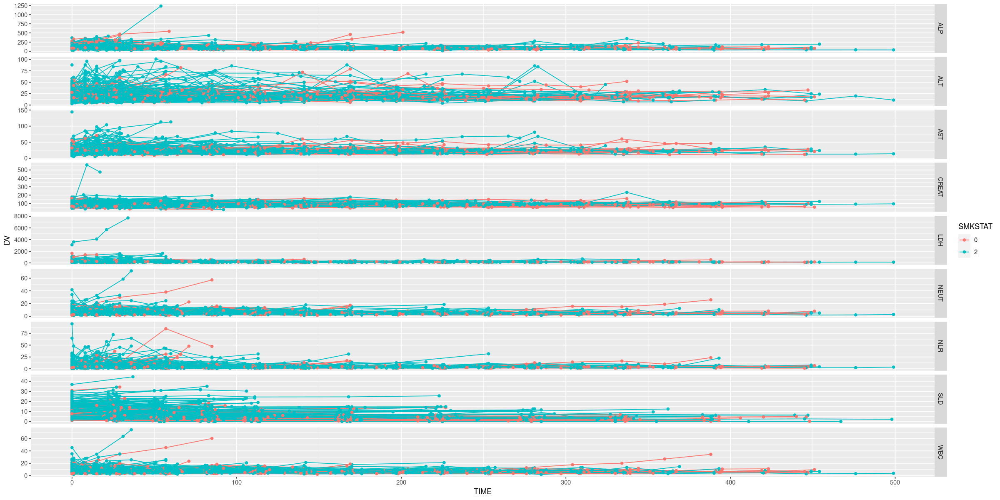

In [ ]:
p + geom_line() + facet_grid(vars(YTYPE_DESC), scales = 'free') + geom_point()

In [ ]:
install.packages('anomalize')